In [1]:
from experimental_modeling_pipeline import Experimental_modeling_pipeline as emp
from experimental_modeling_pipeline import Data_engineering as de
from experimental_modeling_pipeline import DiabetesPreprocessing as dp
from experimental_modeling_pipeline import ClusteringPipeline as cp
import pandas as pd
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from statistics import mean 

emp = emp()
dp = dp("C:/Users/keimp/")

In [2]:
df = dp.preprocessing_factory()

0%
2%
4%
7%
14%
21%
28%
35%


C:\Users\keimp\NHS\Code\experimental_modeling\diabetes\experimental_modeling_pipeline.py:886: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  return pd.np.nan


42%
56%


C:\Users\keimp\NHS\Code\experimental_modeling\diabetes\experimental_modeling_pipeline.py:716: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  sleep = sleep.replace("Prefer not to answer", pd.np.nan)
C:\Users\keimp\NHS\Code\experimental_modeling\diabetes\experimental_modeling_pipeline.py:717: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  sleep = sleep.replace("Do not know", pd.np.nan)


63%
77%
84%
91%
100%


In [3]:
df2 = df.copy()

In [4]:
fo = pd.read_csv("C:/Users/keimp/NHS/Data_files/Labeling/DM_first_occurence_dates.csv")
df = df.merge(fo, on="Participant ID")
fo["first_occurence"] = fo[fo.columns[1:]].apply(dp.earliest_date, axis=1) #Perform the earliest_date function
fo["first_occurence_binary"] = fo["first_occurence"].apply(dp.nan_to_binary) #Set the first occurence to binary
fo = fo.drop(fo.columns[1:-1], axis=1) 
df = df.merge(fo, on="Participant ID")

di = ['Date E10 first reported (insulin-dependent diabetes mellitus)',
       'Date E11 first reported (non-insulin-dependent diabetes mellitus)',
       'Date E12 first reported (malnutrition-related diabetes mellitus)',
       'Date E13 first reported (other specified diabetes mellitus)',
       'Date E14 first reported (unspecified diabetes mellitus)']

for i in di:
    df[i+"_onehot"] = df[i].apply(dp.nan_to_binary) #One hot encoding for various diabetes types

niddm = df[(df['Date E11 first reported (non-insulin-dependent diabetes mellitus)_onehot'] == 1)]
healthy = df[(df['first_occurence_binary'] == 0) & (df['Glycated haemoglobin (HbA1c) | Instance 0'] < 48)]

cols = ['Participant ID',
 'Age at recruitment',
 'Sex_binary',
 'Asian',
 'Black',
 'Chinese',
 'Mixed',
 'Other',
 'White',
 'Alcohol intake frequency. | Instance 0_Daily or almost daily',
 'Alcohol intake frequency. | Instance 0_Never',
 'Alcohol intake frequency. | Instance 0_Once or twice a week',
 'Alcohol intake frequency. | Instance 0_One to three times a month',
 'Alcohol intake frequency. | Instance 0_Special occasions only',
 'Alcohol intake frequency. | Instance 0_Three or four times a week',
 'fmi',
 'Body mass index (BMI) | Instance 0',
 'Body fat percentage | Instance 0',
 'Waist circumference | Instance 0',
 'Weight | Instance 0',
 'Hip circumference | Instance 0',
 'Whole body fat mass | Instance 0',
 'Basal metabolic rate | Instance 0',
 'Trunk fat percentage | Instance 0',
 'Arm fat percentage (left) | Instance 0',
 'Leg fat percentage (left) | Instance 0',
 'Diastolic blood pressure',
 'Systolic blood pressure',
 'Illnesses of father',
 'Illnesses of mother',
 'Illnesses of siblings',
 'father_stroke',
 'mother_stroke',
 'sibling_stroke',
 'father_alzheimer',
 'mother_alzheimer',
 'sibling_alzheimer',
 'father_bloodpressure',
 'mother_bloodpressure',
 'sibling_bloodpressure',
 'father_heart',
 'mother_heart',
 'sibling_heart',
 'father_parkinson',
 'mother_parkinson',
 'sibling_parkinson',
 'Cholesterol_lowering_medication',
 'Insulin',
 'Blood_pressure',
 'Sleep duration | Instance 0',
 'Tobacco smoking_Ex-smoker',
 'Tobacco smoking_Never smoked',
 'Tobacco smoking_Occasionally',
 'Tobacco smoking_Smokes on most or all days',
 'Summed MET minutes per week for all activity | Instance 0',
 'Summed minutes activity | Instance 0',
 'Glycated haemoglobin (HbA1c) | Instance 0',
 'first_occurence_binary'
 ]

niddm_na = niddm[cols].dropna()
healthy_na = healthy[cols].dropna()

fo = pd.read_csv("C:/Users/keimp/NHS/Data_files/Labeling/DM_first_occurence_dates.csv")
att = pd.read_csv("C:/Users/keimp/NHS/Data_files/Grouped_files/replace/Dates_attending_assessment_centers_participant.csv")

niddm_na = niddm_na.merge(att[['Participant ID','Date of attending assessment centre | Instance 0']], on='Participant ID')
niddm_na = niddm_na.merge(fo[['Participant ID','Date E11 first reported (non-insulin-dependent diabetes mellitus)']], on='Participant ID')

niddm_na = niddm_na[(niddm_na['Date E11 first reported (non-insulin-dependent diabetes mellitus)'] != "Code has event date matching participant's date of birth")]

niddm_na['Date of attending assessment centre | Instance 0'] = pd.to_datetime(niddm_na['Date of attending assessment centre | Instance 0'])
niddm_na['Date E11 first reported (non-insulin-dependent diabetes mellitus)'] = pd.to_datetime(niddm_na['Date E11 first reported (non-insulin-dependent diabetes mellitus)'])

niddm_na['diff_days'] = (niddm_na['Date E11 first reported (non-insulin-dependent diabetes mellitus)'] - niddm_na['Date of attending assessment centre | Instance 0']) / np.timedelta64(1, 'D')

C:\Users\keimp\AppData\Roaming\Python\Python39\site-packages\IPython\core\interactiveshell.py:3139: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
C:\Users\keimp\NHS\Code\experimental_modeling\diabetes\experimental_modeling_pipeline.py:742: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  return pd.np.nan


Varible not convertable to datetime:  Date E11 first reported (non-insulin-dependent diabetes mellitus)    Code has event date matching participant's dat...
Date E14 first reported (unspecified diabetes mellitus)                                                     1998-11-01
Name: 225392, dtype: object
Varible not convertable to datetime:  Date E10 first reported (insulin-dependent diabetes mellitus)                                               2007-05-10
Date E11 first reported (non-insulin-dependent diabetes mellitus)    Code has event date matching participant's dat...
Date E14 first reported (unspecified diabetes mellitus)                                                     2005-02-06
Name: 318419, dtype: object
Varible not convertable to datetime:  Date E11 first reported (non-insulin-dependent diabetes mellitus)    Code has event date matching participant's dat...
Date E14 first reported (unspecified diabetes mellitus)                                                     1994-03-

C:\Users\keimp\AppData\Roaming\Python\Python39\site-packages\IPython\core\interactiveshell.py:3139: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [5]:
niddm_na_five = niddm_na[(niddm_na['diff_days'] < 1825) & (niddm_na['diff_days'] > 0)]
niddm_na_one = niddm_na[(niddm_na['diff_days'] < 365) & (niddm_na['diff_days'] > 0)]
niddm_na_fiveten = niddm_na[(niddm_na['diff_days'] > 1825) & (niddm_na['diff_days'] < 3650)]
niddm_na_ten = niddm_na[(niddm_na['diff_days'] > 3650)]

In [6]:
question = [
         'Age at recruitment',
         'Sex_binary',
         'Asian',
         'Black',
         'Chinese',
         'Mixed',
         'Other',
         'White',
         'Alcohol intake frequency. | Instance 0_Daily or almost daily',
         'Alcohol intake frequency. | Instance 0_Never',
         'Alcohol intake frequency. | Instance 0_Once or twice a week',
         'Alcohol intake frequency. | Instance 0_One to three times a month',
         'Alcohol intake frequency. | Instance 0_Special occasions only',
         'Alcohol intake frequency. | Instance 0_Three or four times a week',
         'fmi',
         'Body fat percentage | Instance 0',
         'Waist circumference | Instance 0',
         'Weight | Instance 0',
         'Hip circumference | Instance 0',
         'Whole body fat mass | Instance 0',
         'Basal metabolic rate | Instance 0',
         'Trunk fat percentage | Instance 0',
         'Arm fat percentage (left) | Instance 0',
         'Leg fat percentage (left) | Instance 0',
         'Diastolic blood pressure',
         'Systolic blood pressure',
         'Illnesses of father',
         'Illnesses of mother',
         'Illnesses of siblings',
         'father_stroke',
         'mother_stroke',
         'sibling_stroke',
         'father_alzheimer',
         'mother_alzheimer',
         'sibling_alzheimer',
         'father_bloodpressure',
         'mother_bloodpressure',
         'sibling_bloodpressure',
         'father_heart',
         'mother_heart',
         'sibling_heart',
         'father_parkinson',
         'mother_parkinson',
         'sibling_parkinson',
         'Sleep duration | Instance 0',
         'Tobacco smoking_Ex-smoker',
         'Tobacco smoking_Never smoked',
         'Tobacco smoking_Occasionally',
         'Tobacco smoking_Smokes on most or all days',
         'Summed MET minutes per week for all activity | Instance 0',
         'Summed minutes activity | Instance 0'
         ]
question_hb1ac = question+['Glycated haemoglobin (HbA1c) | Instance 0']

In [124]:
def clustering_analysis(tdf,datacolumns):
    clustered_dfs = []
    results = []
    
    for i in range(2,6):
        print("MinMax")
        mms = MinMaxScaler()
        mms.fit(tdf[datacolumns])
        data_transformed = mms.transform(tdf[datacolumns])
        cohort = pd.DataFrame(data_transformed, columns=datacolumns)
    
        kmeans = KMeans(n_clusters=i, random_state=0, n_init="auto").fit(cohort[datacolumns])
        tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
        
        t=[]
        for j in range(0, i):
            t.append(tdf[(tdf["cluster_"+str(i-2)] ==j)])
        
        clustered_dfs.append(t)
    print("Cluster data dimensions: ", len(clustered_dfs), "\nSublists")
    
    x=-1
    
    for i in clustered_dfs:
        print("Number of clusters: ", len(i))
        
        x+=1
        y=-1
        for j in i:
            tres = []
            print("Cluster ", y ," of ", len(i))
            y+=1
            
            jtest = j.iloc[:round(j.shape[0]*0.2),]
            jtrain = j.iloc[round(j.shape[0]*0.2):,]
            
            if jtrain.shape[0] > healthy_na.shape[0]:
            
                print("X: ", x)
                print("Size difference: ", jtrain.shape[0] - healthy_na.shape[0], "\nSampling...") 
                t = healthy_na.sample(n=jtrain.shape[0] - healthy_na.shape[0])
                cohort = pd.concat([healthy_na, t], axis=0)
            else:
                print("Healthy sampling...")
                cohort = pd.concat([jtrain, healthy_na.sample(n=jtrain.shape[0])], axis=0)
                    
                
            cohort= cohort.sample(frac=1)
            cohort["tcluster_"+str(x)] = cohort["cluster_"+str(x)]
            cohort["tcluster_"+str(x)] = cohort["tcluster_"+str(x)].apply(dp.nan_to_binary)
            
            cohort= cohort[datacolumns+["tcluster_"+str(x)]]
            
            #cohort["cluster_"+str(x)] = cohort["cluster_"+str(x)].apply(dp.nan_to_binary)
            #cohort= cohort[datacolumns+["cluster_"+str(x)]]
    
            print("MinMax")
            mms = MinMaxScaler()
            mms.fit(cohort)
            data_transformed = mms.transform(cohort)
            cohort = pd.DataFrame(data_transformed, columns=cohort.columns.tolist())
    
            print("modeling...")
            print("Trainings shape: ",cohort.shape)
            print("Test shape: ", jtest.shape)
            #emp.pipeline(cohort, 'cluster_'+str(x), cohort.columns.tolist()[:-1], 0.25, splits=5)
            rf = emp.random_forest(cohort[datacolumns], cohort["tcluster_"+str(x)])

            for q in range(0,len(i)): #For df in remaining clusters
                
                print("Y: ", y)
                print("Q: ", q)
                if q != y:
                    test = i[q]
                else:
                    test = jtest
                test["label"] = 0
                predictions, predictions_prob = emp.model_predict(model=rf, x_test=test[datacolumns], multiclass=0)
                unique, counts = np.unique(predictions, return_counts=True)
                print(np.asarray((unique, counts)).T)

                
                if len(unique) == 1:
                    if q != y:
                        if unique[0] == 1:
                            tres.append(1)
                        else:
                            tres.append(0)
                    else:
                        if unique[0] == 1:
                            tres.append(1)
                        else:
                            tres.append(0)
            
                else:
                    if q != y:
                        if unique[0] == 1:
                            tres.append(counts[0]/(counts[1]+counts[0]))
                        else:
                            tres.append(counts[1]/(counts[1]+counts[0]))
                    else:
                        if unique[0] == 1:
                            tres.append(counts[0]/(counts[1]+counts[0]))
                        else:
                            tres.append(counts[1]/(counts[1]+counts[0]))
                    
               

            if len(tres) > 0:
                results.append(tres)
    return results

In [55]:
def clustering_modeling(tdf,datacolumns, r,z):
    clustered_dfs = []
    results = []

    
    for i in range(r,z):
        mms = MinMaxScaler()
        mms.fit(tdf[datacolumns])
        data_transformed = mms.transform(tdf[datacolumns])
        cohort = pd.DataFrame(data_transformed, columns=datacolumns)
        kmeans = KMeans(n_clusters=i, random_state=0, n_init="auto").fit(cohort[[
         'Age at recruitment',
         'fmi',
         'Body fat percentage | Instance 0',
         'Waist circumference | Instance 0',
         'Weight | Instance 0',
         'Hip circumference | Instance 0',
         'Whole body fat mass | Instance 0',
         'Basal metabolic rate | Instance 0',
         'Trunk fat percentage | Instance 0',
         'Arm fat percentage (left) | Instance 0',
         'Leg fat percentage (left) | Instance 0',
         'Diastolic blood pressure',
         'Systolic blood pressure',
         'Illnesses of father',
         'Illnesses of mother',
         'Illnesses of siblings',
         
         
         'Summed MET minutes per week for all activity | Instance 0',
         'Summed minutes activity | Instance 0'
         ]])
        tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
        
        t=[]
        for j in range(0, i):
            t.append(tdf[(tdf["cluster_"+str(i-2)] ==j)])
        
        clustered_dfs.append(t)
    
    
    x=-1
    
    for i in clustered_dfs:
        print("Number of clusters: ", len(i))
        x+=1
        y=1
        for j in i:
            print("Cluster ", y ," of ", len(i))
            y+=1
            if j.shape[0] > healthy_na.shape[0]:
            
                print("X: ", x)
                print("Size difference: ", j.shape[0] - healthy_na.shape[0], "\nSampling...") 
                t = healthy_na.sample(n=j.shape[0] - healthy_na.shape[0])
                cohort = pd.concat([healthy_na, t], axis=0)
    
                
            else:
                print("Healthy sampling...")
                cohort = pd.concat([j, healthy_na.sample(n=j.shape[0])], axis=0)
                
            
            cohort= cohort.sample(frac=1)
            
            cohort["cluster_"+str(x)] = cohort["cluster_"+str(x)].apply(dp.nan_to_binary)
            cohort= cohort[[
             'Age at recruitment',
                 'fmi',
                 'Body fat percentage | Instance 0',
                 'Waist circumference | Instance 0',
                 'Weight | Instance 0',
                 'Hip circumference | Instance 0',
                 'Whole body fat mass | Instance 0',
                 'Basal metabolic rate | Instance 0',
                 'Trunk fat percentage | Instance 0',
                 'Arm fat percentage (left) | Instance 0',
                 'Leg fat percentage (left) | Instance 0',
                 'Diastolic blood pressure',
                 'Systolic blood pressure',
                 'Illnesses of father',
                 'Illnesses of mother',
                 'Illnesses of siblings',
                 'Summed MET minutes per week for all activity | Instance 0',
                 'Summed minutes activity | Instance 0',
                "cluster_"+str(x)
             ]]
    
            print("MinMax")
            mms = MinMaxScaler()
            mms.fit(cohort)
            data_transformed = mms.transform(cohort)
            cohort = pd.DataFrame(data_transformed, columns=cohort.columns.tolist())
    
            print("modeling...")
            emp.pipeline(cohort, 'cluster_'+str(x), cohort.columns.tolist()[:-1], 0.25, splits=5)

In [10]:
def visualize_cross(r):
    #Data eng
    labs = ['one', 'two', "three", "four", "five"]
    r_two = pd.DataFrame(list(zip(r[0], r[1])),
               columns = labs[0:2])
    r_three = pd.DataFrame(
    {labs[0]: r[2],
     labs[1]: r[3],
     labs[2]: r[4]
    },columns = labs[0:3])
    r_four = pd.DataFrame(
    {labs[0]: r[5],
     labs[1]: r[6],
     labs[2]: r[7],
     labs[3]: r[8]
    }, columns = labs[0:4])
    r_five = pd.DataFrame(
    {labs[0]: r[9],
     labs[1]: r[10],
     labs[2]: r[11],
     labs[3]: r[12],
     labs[4]: r[13]
    }, columns = labs[0:5])
    data = [r_two,r_three,r_four,r_five]
    
    #plotting
    for i in data:
        fig, ax = plt.subplots()
        im = ax.imshow(i)
        ax.set_xticks(np.arange(i.shape[1]), labels = labs[0:i.shape[1]])
        ax.set_yticks(np.arange(i.shape[1]), labels = labs[0:i.shape[1]])
        cbar = ax.figure.colorbar(im, ax = ax)
        ax.set_xlabel("Cluster modeled")
        ax.set_ylabel("Cluster tested")
        plt.title("Percentage correctly predicted", fontsize=10)
        plt.suptitle("Cluster cross-testing (n cluster="+str(i.shape[1])+")")
        
        for k in range(i.shape[1]):
            for j in range(i.shape[1]):
                text = ax.text(j, k, round(i.iat[k, j],2),
                           ha = "center", va = "center", color = "r")

### One year

#### questionnaire only

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (626, 52)
Test shape:  (78, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[ 1. 78.]]
Y:  0
Q:  1
[[  0.  35.]
 [  1. 654.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1102, 52)
Test shape:  (138, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 391.]]
Y:  1
Q:  1
[[  0. 110.]
 [  1.  28.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (604, 52)
Test shape:  (75, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[ 1. 75.]]
Y:  0
Q:  1
[[  1. 157.]]
Y:  0
Q:  2
[[  1. 546.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (252, 52)
Test shape:  (31, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 357.]
 [  1.  20.]]
Y:  1
Q:  1
[[ 1. 31.]]
Y:  1
Q:  2
[[  0. 546.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (874, 52)
Test shape:  (109, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 377.]]
Y:  2
Q:  1
[[  0. 157.]]
Y:  2
Q:  2
[[  1. 109.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (602, 52)
Test shape:  (75, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 75.]]
Y:  0
Q:  1
[[  1. 152.]]
Y:  0
Q:  2
[[  1. 158.]]
Y:  0
Q:  3
[[  1. 394.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (244, 52)
Test shape:  (30, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 375.]
 [  1.   1.]]
Y:  1
Q:  1
[[ 0.  9.]
 [ 1. 21.]]
Y:  1
Q:  2
[[  0. 156.]
 [  1.   2.]]
Y:  1
Q:  3
[[  0. 394.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (252, 52)
Test shape:  (32, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 376.]]
Y:  2
Q:  1
[[  0. 145.]
 [  1.   7.]]
Y:  2
Q:  2
[[ 0.  4.]
 [ 1. 28.]]
Y:  2
Q:  3
[[  0. 325.]
 [  1.  69.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (630, 52)
Test shape:  (79, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 376.]]
Y:  3
Q:  1
[[  0. 152.]]
Y:  3
Q:  2
[[  0. 142.]
 [  1.  16.]]
Y:  3
Q:  3
[[ 0. 13.]
 [ 1. 66.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (452, 52)
Test shape:  (57, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 57.]]
Y:  0
Q:  1
[[  0.   8.]
 [  1. 145.]]
Y:  0
Q:  2
[[  0.   9.]
 [  1. 121.]]
Y:  0
Q:  3
[[  0.  16.]
 [  1. 337.]]
Y:  0
Q:  4
[[ 0. 62.]
 [ 1. 99.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (244, 52)
Test shape:  (31, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 265.]
 [  1.  18.]]
Y:  1
Q:  1
[[ 1. 31.]]
Y:  1
Q:  2
[[  0. 124.]
 [  1.   6.]]
Y:  1
Q:  3
[[  0. 353.]]
Y:  1
Q:  4
[[  0. 161.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (208, 52)
Test shape:  (26, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 283.]]
Y:  2
Q:  1
[[  0.  25.]
 [  1. 128.]]
Y:  2
Q:  2
[[ 0.  4.]
 [ 1. 22.]]
Y:  2
Q:  3
[[  1. 353.]]
Y:  2
Q:  4
[[ 0. 94.]
 [ 1. 67.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (564, 52)
Test shape:  (71, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 283.]]
Y:  3
Q:  1
[[  0. 153.]]
Y:  3
Q:  2
[[  0. 126.]
 [  1.   4.]]
Y:  3
Q:  3
[[ 1. 71.]]
Y:  3
Q:  4
[[  0. 104.]
 [  1.  57.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (258, 52)
Test shape:  (32, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 283.]]
Y:  4
Q:  1
[[  0. 153.]]
Y:  4
Q:  2
[[  0. 124.]
 [  1.   6.]]
Y:  4
Q:  3
[[  0. 353.]]
Y:  4
Q:  4
[[ 0.  1.]
 [ 1. 31.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

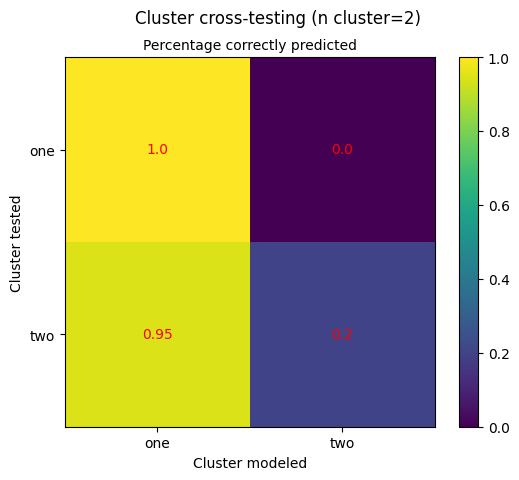

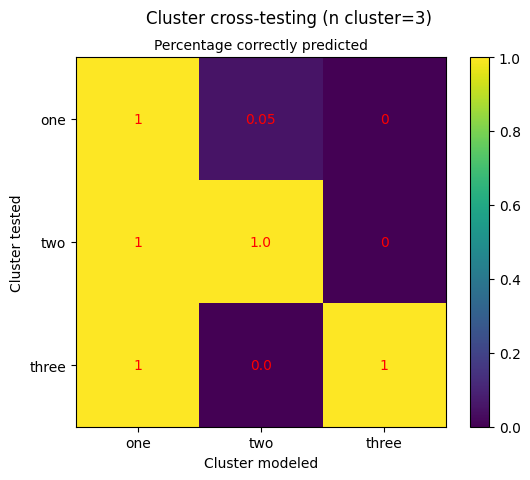

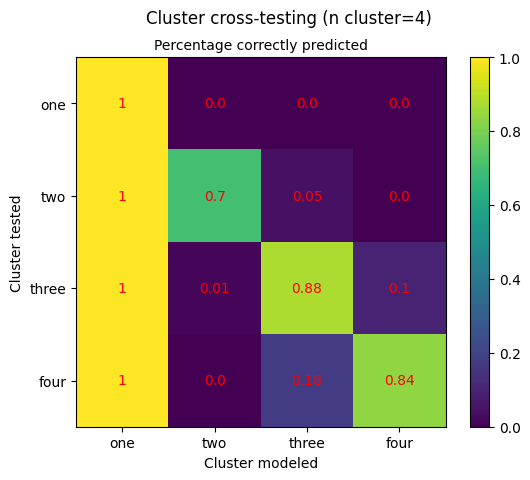

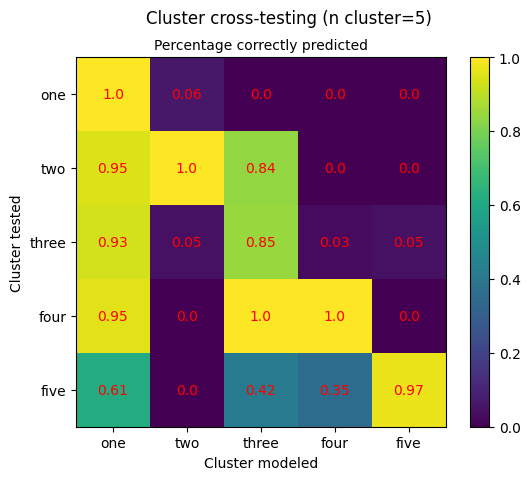

In [125]:
visualize_cross(clustering_analysis(niddm_na_one,question))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

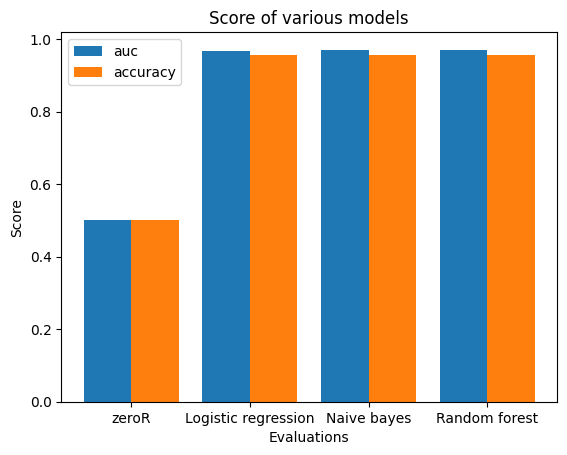

F1:  0.9572661317794061 0.9572661317794061 0.9587770456354527
auc:  [0.5, 0.9684745192432125, 0.970081786888216, 0.9711649455185444]
accuracy:  [0.5, 0.9552267220491519, 0.9552267220491519, 0.9570785739010038]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

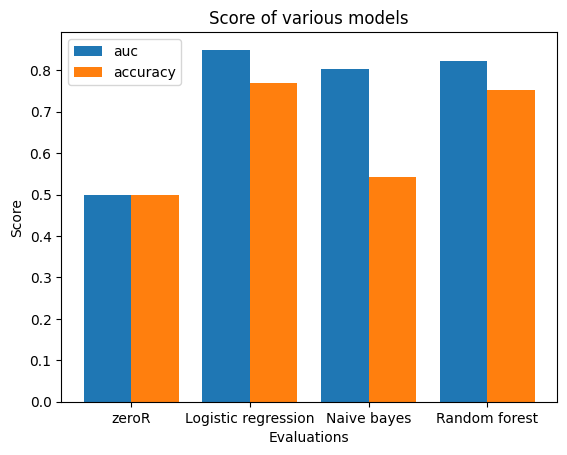

F1:  0.7727406527732871 0.6858369928801127 0.7529676028373503
auc:  [0.5, 0.8496515008280011, 0.8038122882659477, 0.8222950171257374]
accuracy:  [0.5, 0.7697113010446344, 0.5424843304843305, 0.7518651471984805]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

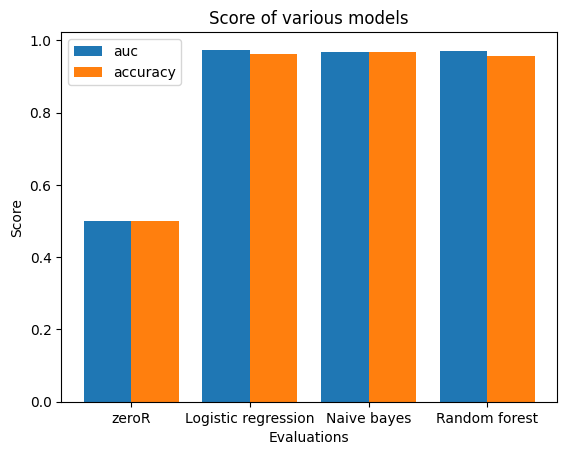

F1:  0.963004563004563 0.9679943100995733 0.9572988572988573
auc:  [0.5, 0.9741700033366699, 0.96846012679346, 0.9698844678011345]
accuracy:  [0.5, 0.9613013698630137, 0.9668188736681887, 0.9557458143074581]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

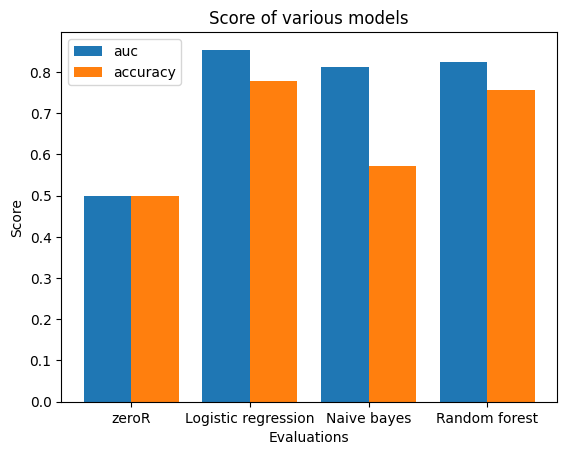

F1:  0.7815724593454257 0.700451345716622 0.7521992026689736
auc:  [0.5, 0.8538944432116089, 0.8118332246281735, 0.8229599219685393]
accuracy:  [0.5, 0.7781194559432288, 0.5719889611669624, 0.7556165695136718]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

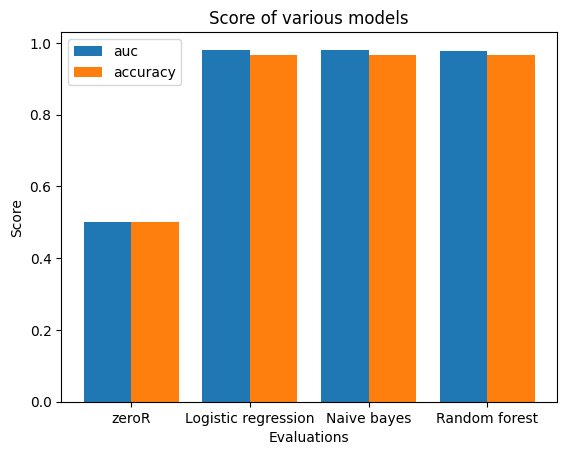

F1:  0.9689738100927073 0.9689738100927073 0.9667775163384178
auc:  [0.5, 0.9792764348630495, 0.980987813216426, 0.978335277319712]
accuracy:  [0.5, 0.9676250584385226, 0.9676250584385226, 0.9654745208041141]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

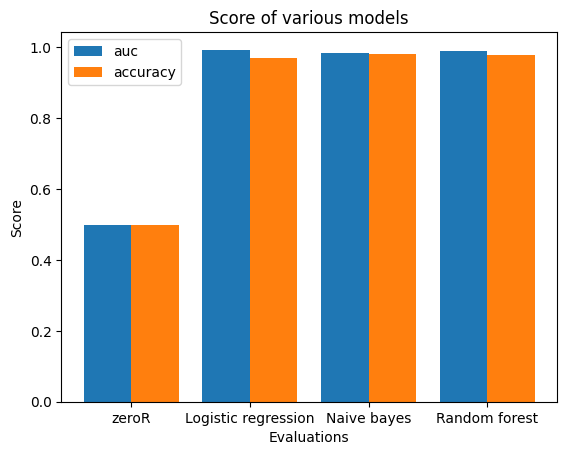

F1:  0.9721547359712176 0.9823242274966413 0.9791788794018945
auc:  [0.5, 0.993631197334901, 0.9846560846560847, 0.991005291005291]
accuracy:  [0.5, 0.9708417508417508, 0.9817508417508417, 0.9781818181818182]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

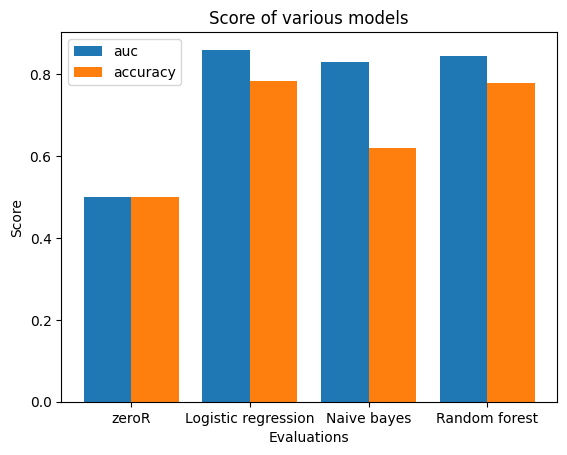

F1:  0.7919748850742417 0.725046234604383 0.7768835146492667
auc:  [0.5, 0.8596367597865366, 0.8292434663190987, 0.8441638790374009]
accuracy:  [0.5, 0.7836971484759095, 0.620542772861357, 0.7783638151425762]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

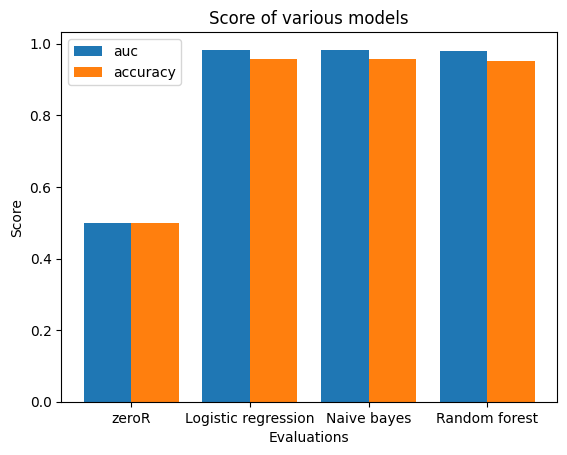

F1:  0.9604797235082093 0.9604797235082093 0.9525878531622851
auc:  [0.5, 0.9828629726141895, 0.9833865971778356, 0.9805632036973303]
accuracy:  [0.5, 0.9585939588345362, 0.9585939588345362, 0.9516974071103983]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

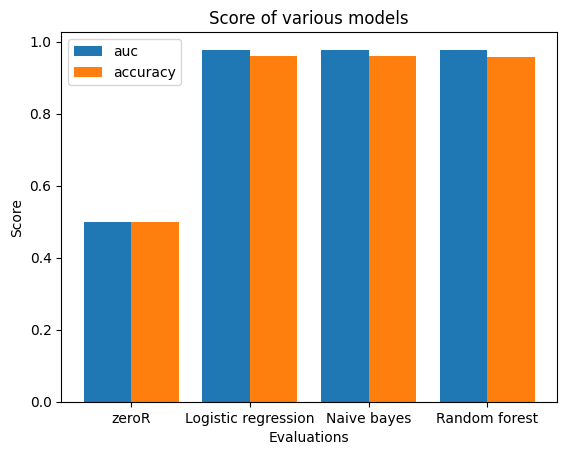

F1:  0.9617129383575923 0.9617129383575923 0.9588881706528766
auc:  [0.5, 0.977249053030303, 0.977633759469697, 0.9762310606060606]
accuracy:  [0.5, 0.9599519230769231, 0.9599519230769231, 0.956875]


In [149]:
clustering_modeling(niddm_na_one,question, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (782, 52)
Test shape:  (98, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[ 1. 98.]]
Y:  0
Q:  1
[[  1. 200.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (320, 52)
Test shape:  (40, 67)
Y:  1
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0.  26.]
 [  1. 463.]]
Y:  1
Q:  1
[[ 1. 40.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (550, 52)
Test shape:  (69, 66)
Y:  0
Q:  0
[[ 1. 69.]]
Y:  0
Q:  1
[[  0.   4.]
 [  1. 161.]]
Y:  0
Q:  2
[[  0. 180.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (264, 52)
Test shape:  (33, 67)
Y:  1
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  1. 344.]]
Y:  1
Q:  1
[[ 1. 33.]]
Y:  1
Q:  2
[[  0. 153.]
 [  1.  27.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (288, 52)
Test shape:  (36, 67)
Y:  2
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 344.]]
Y:  2
Q:  1
[[  0. 161.]
 [  1.   4.]]
Y:  2
Q:  2
[[ 1. 36.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (220, 52)
Test shape:  (28, 66)
Y:  0
Q:  0
[[ 0. 28.]]
Y:  0
Q:  1


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 131.]]
Y:  0
Q:  2
[[  0. 180.]]
Y:  0
Q:  3
[[  0. 240.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (210, 52)
Test shape:  (26, 67)
Y:  1
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  1. 138.]]
Y:  1
Q:  1
[[ 1. 26.]]
Y:  1
Q:  2
[[  1. 180.]]
Y:  1
Q:  3
[[  0.   6.]
 [  1. 234.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (288, 52)
Test shape:  (36, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 138.]]
Y:  2
Q:  1
[[  0. 131.]]
Y:  2
Q:  2
[[ 0. 28.]
 [ 1.  8.]]
Y:  2
Q:  3
[[  0. 240.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (384, 52)
Test shape:  (48, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  1. 138.]]
Y:  3
Q:  1
[[  0.   4.]
 [  1. 127.]]
Y:  3
Q:  2
[[  0. 174.]
 [  1.   6.]]
Y:  3
Q:  3
[[ 1. 48.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (228, 52)
Test shape:  (28, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 0. 28.]]
Y:  0
Q:  1
[[  0. 102.]]
Y:  0
Q:  2
[[  0. 184.]]
Y:  0
Q:  3
[[  0. 170.]]
Y:  0
Q:  4
[[ 0. 91.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (164, 52)
Test shape:  (20, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 111.]
 [  1.  31.]]
Y:  1
Q:  1
[[ 1. 20.]]
Y:  1
Q:  2
[[  0. 174.]
 [  1.  10.]]
Y:  1
Q:  3
[[  0.  59.]
 [  1. 111.]]
Y:  1
Q:  4
[[ 0.  4.]
 [ 1. 87.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (294, 52)
Test shape:  (37, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 142.]]
Y:  2
Q:  1
[[  0. 102.]]
Y:  2
Q:  2
[[ 0. 18.]
 [ 1. 19.]]
Y:  2
Q:  3
[[  0. 170.]]
Y:  2
Q:  4
[[ 0. 91.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (272, 52)
Test shape:  (34, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 141.]
 [  1.   1.]]
Y:  3
Q:  1
[[  0.   1.]
 [  1. 101.]]
Y:  3
Q:  2
[[  0. 173.]
 [  1.  11.]]
Y:  3
Q:  3
[[ 1. 34.]]
Y:  3
Q:  4
[[ 1. 91.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (146, 52)
Test shape:  (18, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 142.]]
Y:  4
Q:  1
[[  0. 102.]]
Y:  4
Q:  2
[[  0. 184.]]
Y:  4
Q:  3
[[  0. 170.]]
Y:  4
Q:  4
[[ 1. 18.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

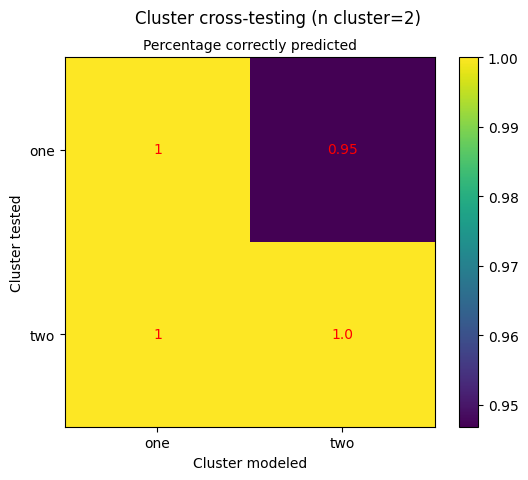

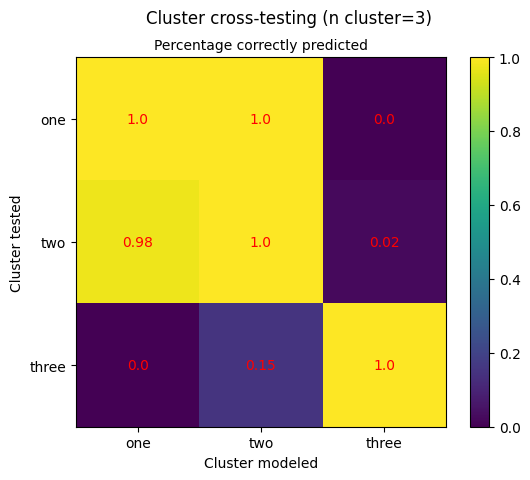

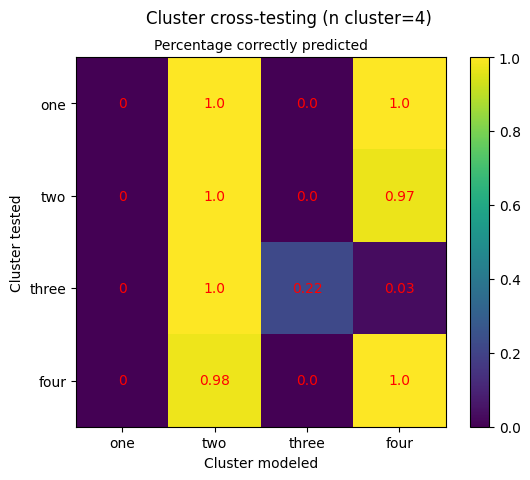

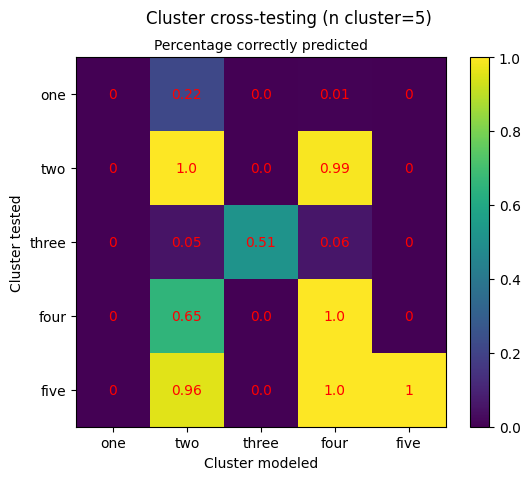

In [177]:
visualize_cross(clustering_analysis(niddm_na_one[(niddm_na_one["Sex_binary"] == 1)],question))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

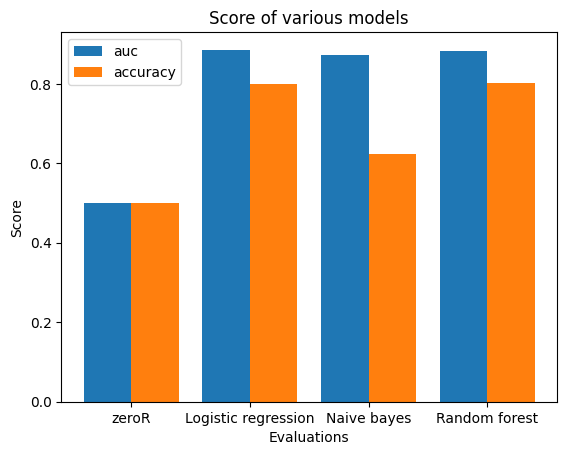

F1:  0.8105128358680114 0.724692190090452 0.8137760425025743
auc:  [0.5, 0.8858170030504436, 0.8726247822583171, 0.8816647906960647]
accuracy:  [0.5, 0.800561625202931, 0.6226800052652363, 0.8024220086876399]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

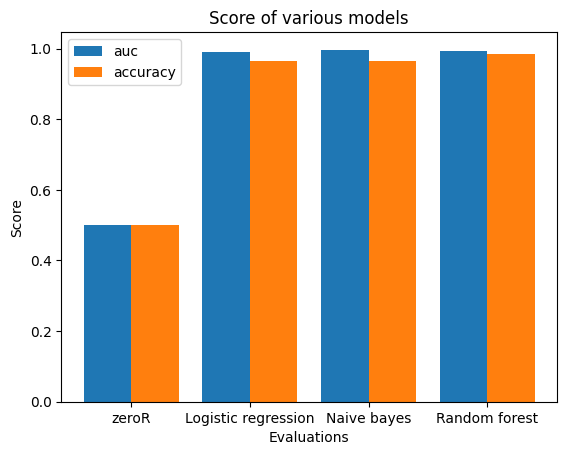

F1:  0.9662426462426462 0.9662426462426462 0.984123783922171
auc:  [0.5, 0.9908428720083247, 0.9968782518210197, 0.991987513007284]
accuracy:  [0.5, 0.964516129032258, 0.964516129032258, 0.9838709677419355]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                 

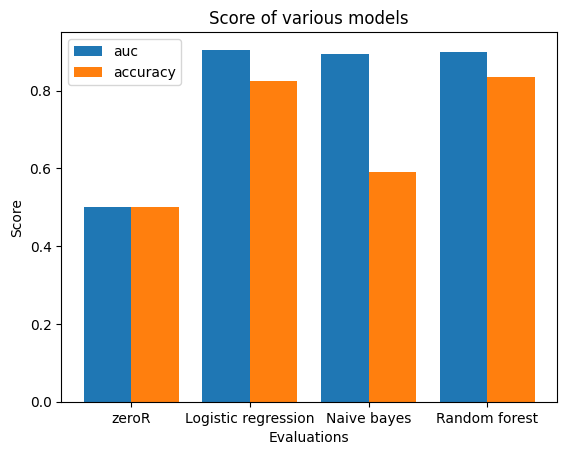

F1:  0.8336703473424399 0.7092081030124251 0.840129082698306
auc:  [0.5, 0.9050731419814935, 0.8950779748924382, 0.8990437908881947]
accuracy:  [0.5, 0.8248900027847397, 0.5906934001670844, 0.8344193817878028]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

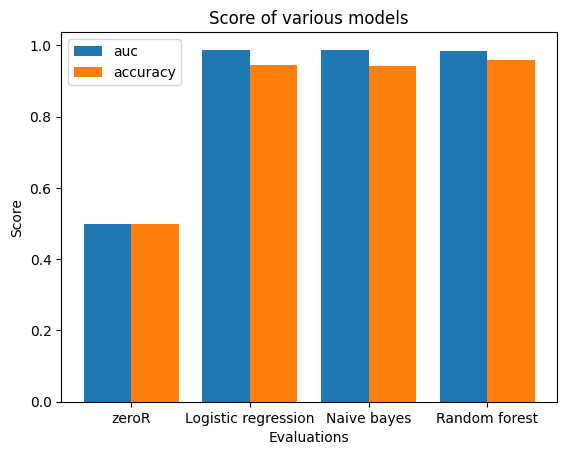

F1:  0.9486582829743185 0.9449243799153055 0.9608999772157667
auc:  [0.5, 0.9877621007250638, 0.9856456986086616, 0.9844258279443465]
accuracy:  [0.5, 0.9453872053872053, 0.9416161616161616, 0.95993265993266]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

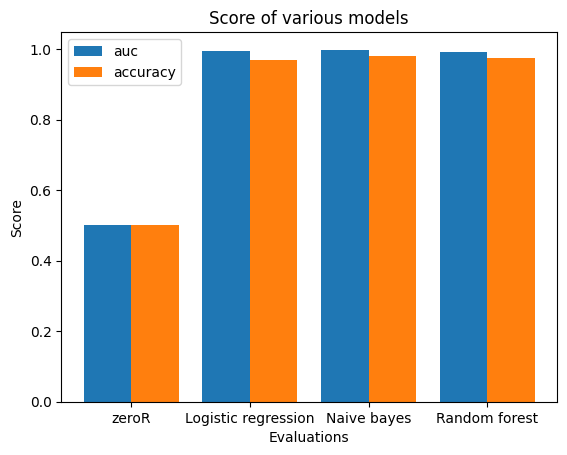

F1:  0.9693181818181819 0.9814271749755621 0.9753787878787878
auc:  [0.5, 0.994375, 0.9983333333333333, 0.9908333333333333]
accuracy:  [0.5, 0.9679435483870967, 0.9808467741935484, 0.9741935483870968]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       

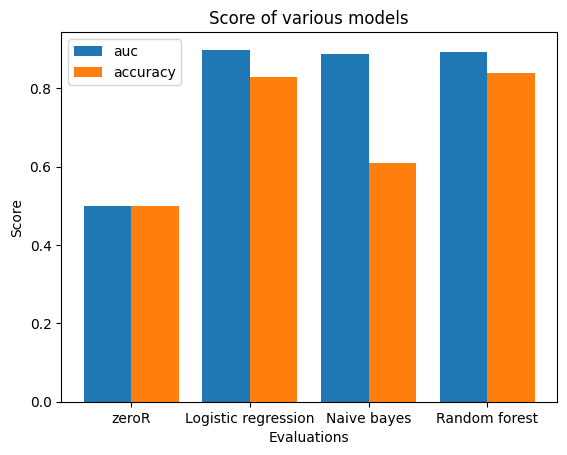

F1:  0.8395008912655971 0.7194440041189144 0.8464025659942609
auc:  [0.5, 0.8984080022541561, 0.8885955924417464, 0.8915979319825473]
accuracy:  [0.5, 0.8286186931348222, 0.6095368072787427, 0.8388916459884201]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

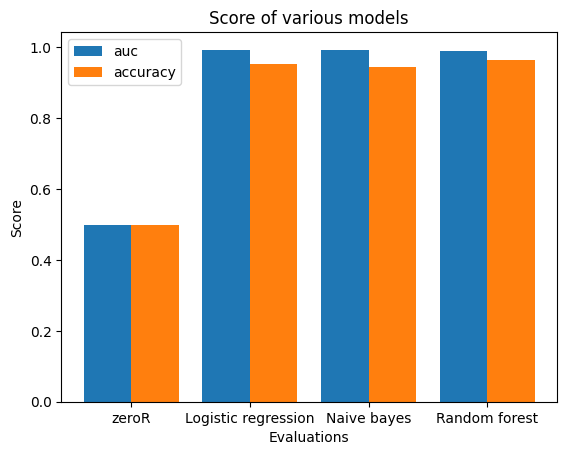

F1:  0.9553415977114029 0.9487610091058367 0.9640051880455264
auc:  [0.5, 0.9931216931216932, 0.9915343915343916, 0.9898148148148148]
accuracy:  [0.5, 0.9527272727272728, 0.9453872053872053, 0.9636363636363636]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

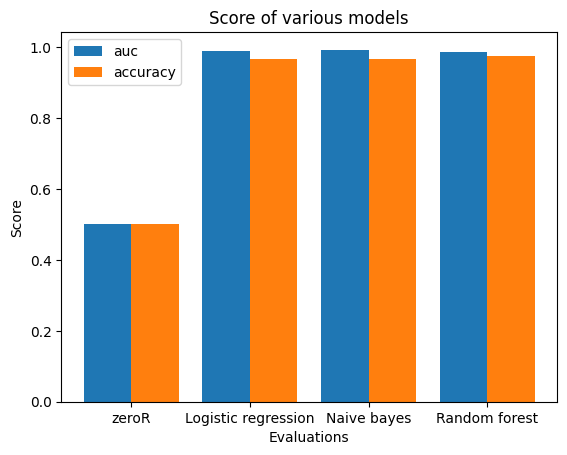

F1:  0.9686153846153847 0.9686153846153847 0.9766153846153847
auc:  [0.5, 0.9902777777777778, 0.9930555555555556, 0.9875]
accuracy:  [0.5, 0.967, 0.967, 0.975]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0

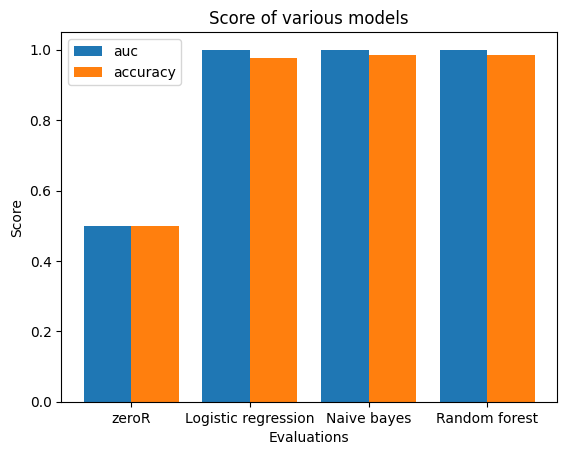

F1:  0.9762904140669314 0.9858196256381169 0.9853488372093023
auc:  [0.5, 1.0, 1.0, 0.9995238095238095]
accuracy:  [0.5, 0.975725900116144, 0.9853658536585366, 0.9854819976771196]


In [150]:
clustering_modeling(niddm_na_one[(niddm_na_one["Sex_binary"] == 1)],question, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (196, 52)
Test shape:  (25, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[ 1. 25.]]
Y:  0
Q:  1
[[  0. 238.]
 [  1.  30.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (428, 52)
Test shape:  (54, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 123.]]
Y:  1
Q:  1
[[ 1. 54.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (130, 52)
Test shape:  (16, 66)
Y:  0
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 1. 16.]]
Y:  0
Q:  1
[[  1. 182.]]
Y:  0
Q:  2
[[  1. 128.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (292, 52)
Test shape:  (36, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[ 0. 79.]
 [ 1.  2.]]
Y:  1
Q:  1
[[ 1. 36.]]
Y:  1
Q:  2
[[  0. 128.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (204, 52)
Test shape:  (26, 67)
Y:  2
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 0. 80.]
 [ 1.  1.]]
Y:  2
Q:  1
[[  0. 176.]
 [  1.   6.]]
Y:  2
Q:  2
[[ 1. 26.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (132, 52)
Test shape:  (17, 66)
Y:  0
Q:  0
[[ 1. 17.]]
Y:  0
Q:  1
[[  0.   7.]
 [  1. 143.]]
Y:  0
Q:  2


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 1. 83.]]
Y:  0
Q:  3
[[ 1. 75.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (240, 52)
Test shape:  (30, 67)
Y:  1
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


[[ 1. 83.]]
Y:  1
Q:  1
[[ 1. 30.]]
Y:  1
Q:  2
[[ 1. 83.]]
Y:  1
Q:  3
[[ 1. 75.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (132, 52)
Test shape:  (17, 67)
Y:  2
Q:  0
[[ 0. 40.]
 [ 1. 43.]]
Y:  2
Q:  1


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 133.]
 [  1.  17.]]
Y:  2
Q:  2
[[ 1. 17.]]
Y:  2
Q:  3
[[ 0. 42.]
 [ 1. 33.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (120, 52)
Test shape:  (15, 67)
Y:  3
Q:  0
[[ 1. 83.]]
Y:  3
Q:  1
[[  1. 150.]]
Y:  3
Q:  2
[[ 1. 83.]]
Y:  3
Q:  3


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 1. 15.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (112, 52)
Test shape:  (14, 66)
Y:  0
Q:  0
[[ 1. 14.]]
Y:  0
Q:  1
[[  0.   3.]
 [  1. 130.]]
Y:  0
Q:  2
[[ 0.  2.]
 [ 1. 69.]]
Y:  0
Q:  3
[[ 0.  1.]
 [ 1. 53.]]
Y:  0
Q:  4


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 0.  6.]
 [ 1. 57.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (212, 52)
Test shape:  (27, 67)
Y:  1
Q:  0
[[ 0. 22.]
 [ 1. 48.]]
Y:  1
Q:  1
[[ 1. 27.]]
Y:  1
Q:  2
[[ 0. 70.]
 [ 1.  1.]]
Y:  1
Q:  3


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 0.  7.]
 [ 1. 47.]]
Y:  1
Q:  4
[[ 0. 24.]
 [ 1. 39.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (114, 52)
Test shape:  (14, 67)
Y:  2
Q:  0
[[ 1. 70.]]
Y:  2
Q:  1
[[  1. 133.]]
Y:  2
Q:  2
[[ 1. 14.]]
Y:  2
Q:  3
[[ 1. 54.]]
Y:  2
Q:  4
[[ 1. 63.]]
Cluster  2  of  5
Healthy sampling...


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

MinMax
modeling...
Trainings shape:  (86, 52)
Test shape:  (11, 67)
Y:  3
Q:  0
[[ 1. 70.]]
Y:  3
Q:  1
[[  0.   3.]
 [  1. 130.]]
Y:  3
Q:  2
[[ 0.  3.]
 [ 1. 68.]]
Y:  3
Q:  3
[[ 1. 11.]]
Y:  3
Q:  4
[[ 0.  9.]
 [ 1. 54.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (100, 52)
Test shape:  (13, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[ 1. 70.]]
Y:  4
Q:  1
[[  1. 133.]]
Y:  4
Q:  2
[[ 1. 71.]]
Y:  4
Q:  3
[[ 1. 54.]]
Y:  4
Q:  4
[[ 1. 13.]]


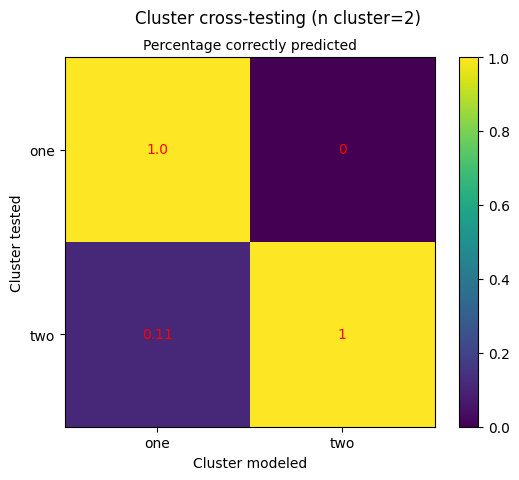

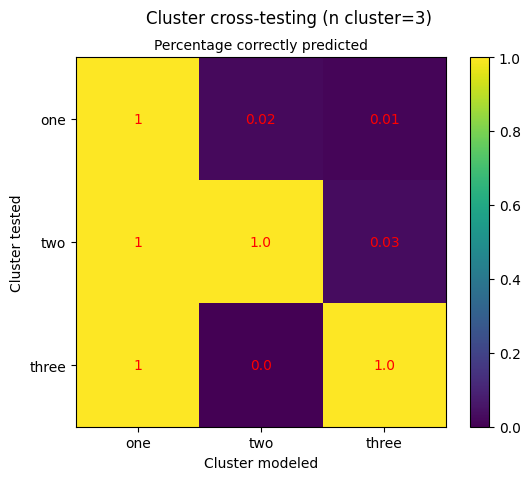

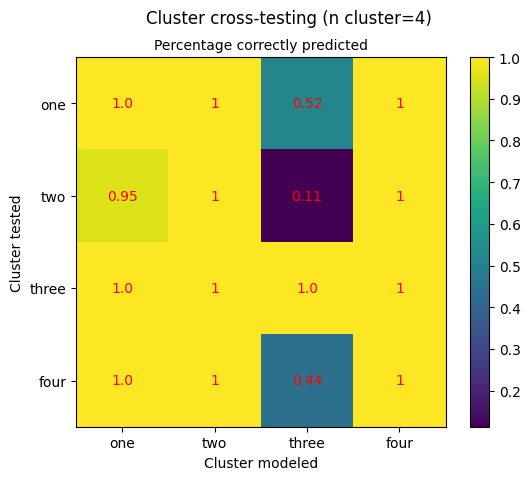

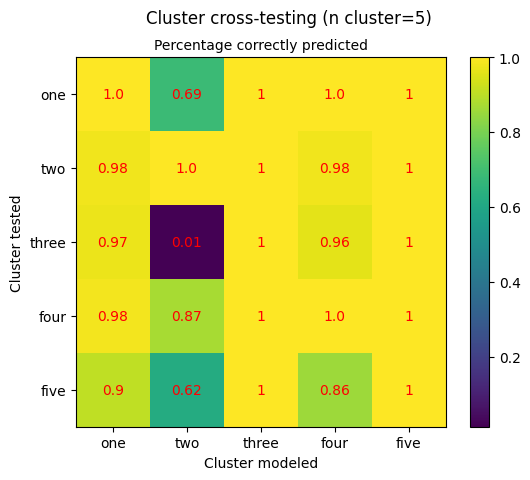

In [127]:
visualize_cross(clustering_analysis(niddm_na_one[(niddm_na_one["Sex_binary"] == 0)],question))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

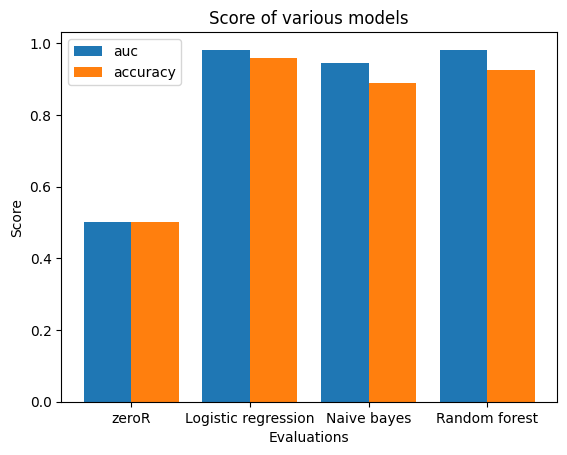

F1:  0.9598569684932392 0.890534740485217 0.9252242695497171
auc:  [0.5, 0.9812781797210863, 0.9461361014994233, 0.9818915801614764]
accuracy:  [0.5, 0.9586040386303776, 0.8877085162423178, 0.9260316066725197]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

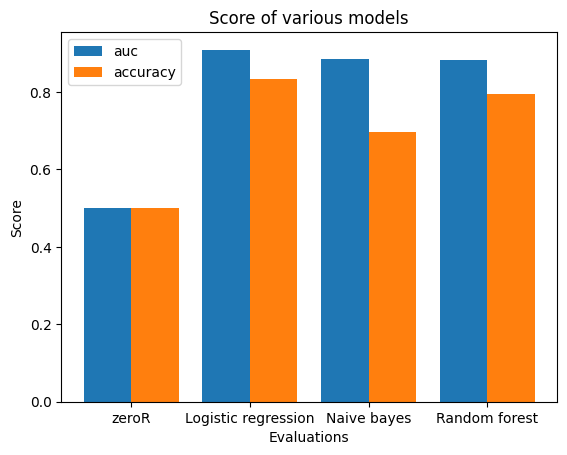

F1:  0.8423792894770993 0.7654147394085474 0.8056350576985614
auc:  [0.5, 0.9089187327823691, 0.8837362258953169, 0.8825608356290174]
accuracy:  [0.5, 0.8333758937691522, 0.6959652706843718, 0.795020429009193]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

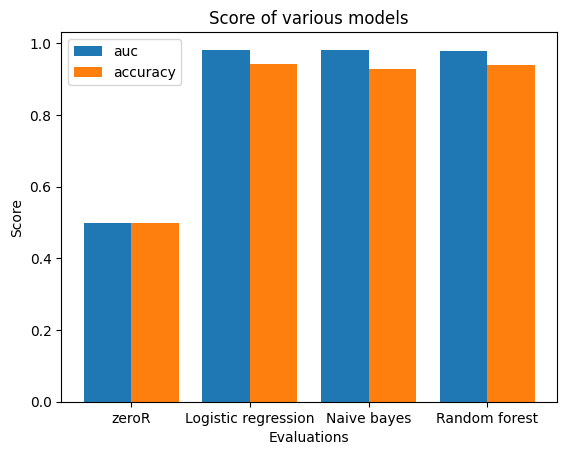

F1:  0.9456750618970374 0.9325509030370296 0.940462718866811
auc:  [0.5, 0.9815466666666667, 0.9821066666666667, 0.9795533333333334]
accuracy:  [0.5, 0.9431836734693878, 0.9269387755102041, 0.9390204081632653]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

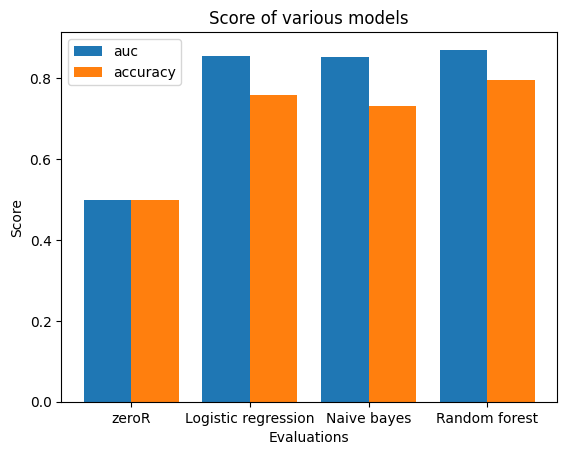

F1:  0.7652605125507729 0.7839964545510116 0.799804734236913
auc:  [0.5, 0.8553590010405827, 0.8520291363163371, 0.8704474505723205]
accuracy:  [0.5, 0.7580645161290323, 0.732258064516129, 0.7967741935483871]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

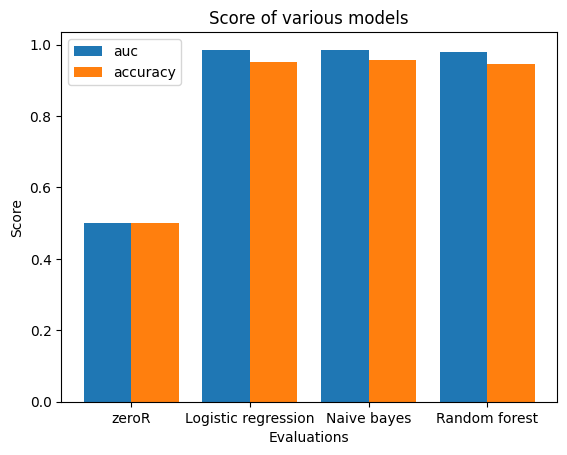

F1:  0.953515714642317 0.9572458628841607 0.9474272792681673
auc:  [0.5, 0.9853926791544939, 0.9839920948616601, 0.9790685684825571]
accuracy:  [0.5, 0.951304347826087, 0.9556521739130435, 0.9467632850241546]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

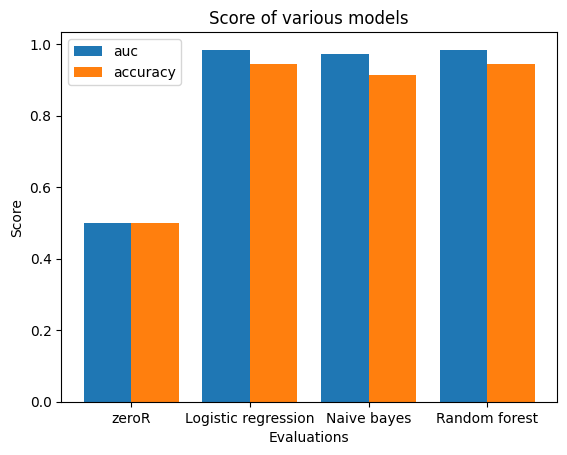

F1:  0.949324549846289 0.9203642696671638 0.9481178315000358
auc:  [0.5, 0.9847107438016529, 0.9725206611570247, 0.9826446280991735]
accuracy:  [0.5, 0.9454545454545454, 0.9136363636363636, 0.9454545454545454]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

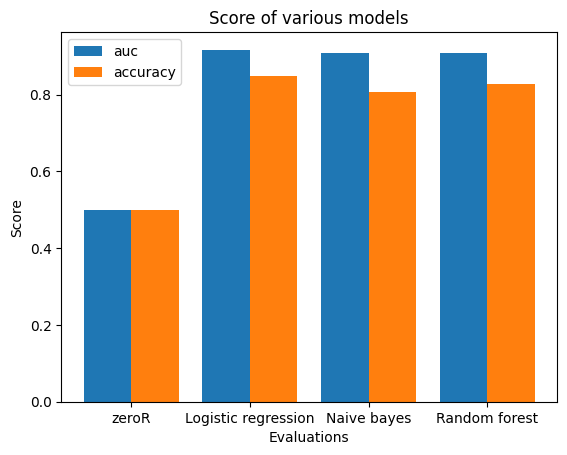

F1:  0.8523402088107971 0.8337113114601729 0.8306989928838668
auc:  [0.5, 0.9172403381642512, 0.9088692632850242, 0.9082201086956522]
accuracy:  [0.5, 0.8489361702127659, 0.8068262411347518, 0.8279255319148936]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

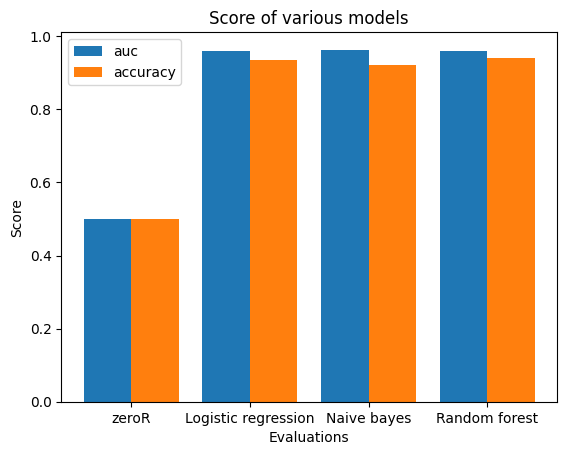

F1:  0.9386018630326031 0.924496578690127 0.9413594470046083
auc:  [0.5, 0.9588888888888889, 0.9631388888888889, 0.9589444444444445]
accuracy:  [0.5, 0.9341935483870968, 0.9212903225806451, 0.9410752688172043]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

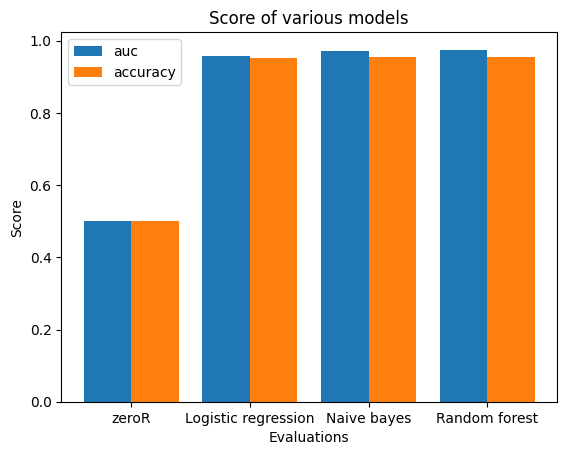

F1:  0.9558386958386959 0.9548933807757337 0.9545845004668534
auc:  [0.5, 0.9582083813917723, 0.9719723183391004, 0.974875048058439]
accuracy:  [0.5, 0.9532773109243697, 0.9534453781512605, 0.9534453781512605]


In [151]:
clustering_modeling(niddm_na_one[(niddm_na_one["Sex_binary"] == 0)],question, 2,5)

#### questionnaire and hba1c

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (626, 53)
Test shape:  (78, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[ 1. 78.]]
Y:  0
Q:  1
[[  1. 689.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1102, 53)
Test shape:  (138, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 391.]]
Y:  1
Q:  1
[[  1. 138.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (604, 53)
Test shape:  (75, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[ 1. 75.]]
Y:  0
Q:  1
[[  1. 157.]]
Y:  0
Q:  2
[[  1. 546.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (252, 53)
Test shape:  (31, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 357.]
 [  1.  20.]]
Y:  1
Q:  1
[[ 1. 31.]]
Y:  1
Q:  2
[[  0. 546.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (874, 53)
Test shape:  (109, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 377.]]
Y:  2
Q:  1
[[  0.  15.]
 [  1. 142.]]
Y:  2
Q:  2
[[  1. 109.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (602, 53)
Test shape:  (75, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 75.]]
Y:  0
Q:  1
[[  1. 152.]]
Y:  0
Q:  2
[[  1. 158.]]
Y:  0
Q:  3
[[  1. 394.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (244, 53)
Test shape:  (30, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 353.]
 [  1.  23.]]
Y:  1
Q:  1
[[ 1. 30.]]
Y:  1
Q:  2
[[  0. 153.]
 [  1.   5.]]
Y:  1
Q:  3
[[  0. 394.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (252, 53)
Test shape:  (32, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 355.]
 [  1.  21.]]
Y:  2
Q:  1
[[  0.  26.]
 [  1. 126.]]
Y:  2
Q:  2
[[ 1. 32.]]
Y:  2
Q:  3
[[  0.  16.]
 [  1. 378.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (630, 53)
Test shape:  (79, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 376.]]
Y:  3
Q:  1
[[  0. 152.]]
Y:  3
Q:  2
[[  0. 144.]
 [  1.  14.]]
Y:  3
Q:  3
[[ 0. 31.]
 [ 1. 48.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (452, 53)
Test shape:  (57, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 57.]]
Y:  0
Q:  1
[[  1. 153.]]
Y:  0
Q:  2
[[  1. 132.]]
Y:  0
Q:  3
[[  1. 352.]]
Y:  0
Q:  4
[[  1. 160.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (244, 53)
Test shape:  (31, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 265.]
 [  1.  18.]]
Y:  1
Q:  1
[[ 1. 31.]]
Y:  1
Q:  2
[[  0. 126.]
 [  1.   6.]]
Y:  1
Q:  3
[[  0. 352.]]
Y:  1
Q:  4
[[  0. 160.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (212, 53)
Test shape:  (26, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0.   9.]
 [  1. 274.]]
Y:  2
Q:  1
[[  1. 153.]]
Y:  2
Q:  2
[[ 1. 26.]]
Y:  2
Q:  3
[[  1. 352.]]
Y:  2
Q:  4
[[  0.   6.]
 [  1. 154.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (564, 53)
Test shape:  (70, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 283.]]
Y:  3
Q:  1
[[  0. 153.]]
Y:  3
Q:  2
[[  0. 127.]
 [  1.   5.]]
Y:  3
Q:  3
[[ 1. 70.]]
Y:  3
Q:  4
[[  0. 103.]
 [  1.  57.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (256, 53)
Test shape:  (32, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 283.]]
Y:  4
Q:  1
[[  0. 153.]]
Y:  4
Q:  2
[[  0. 125.]
 [  1.   7.]]
Y:  4
Q:  3
[[  0. 352.]]
Y:  4
Q:  4
[[ 1. 32.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

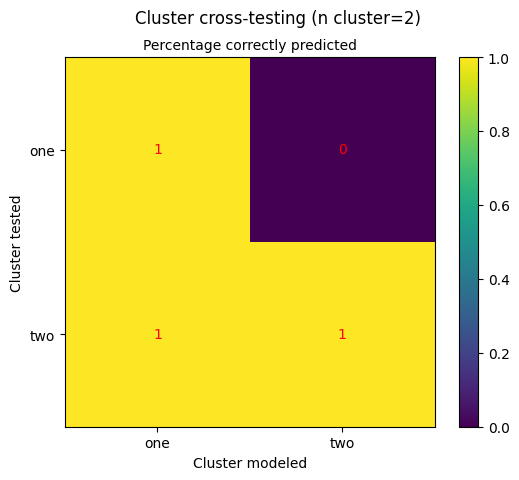

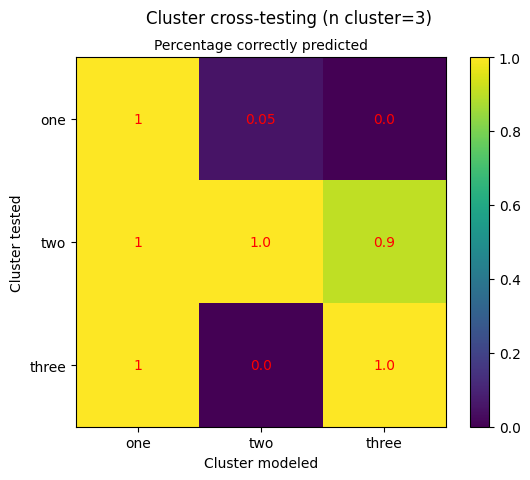

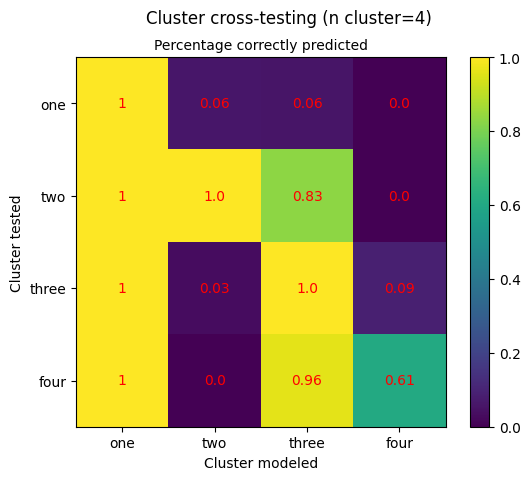

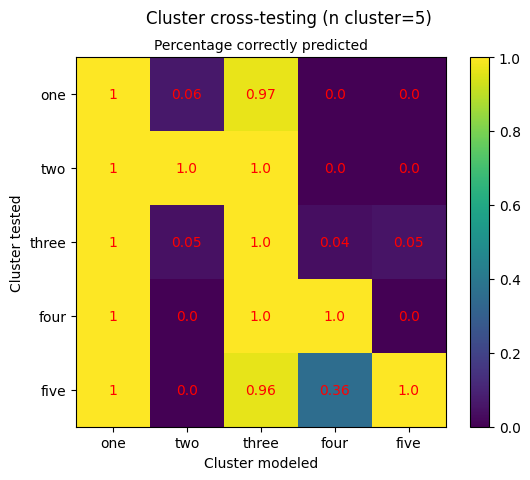

In [128]:
visualize_cross(clustering_analysis(niddm_na_one,question_hb1ac))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

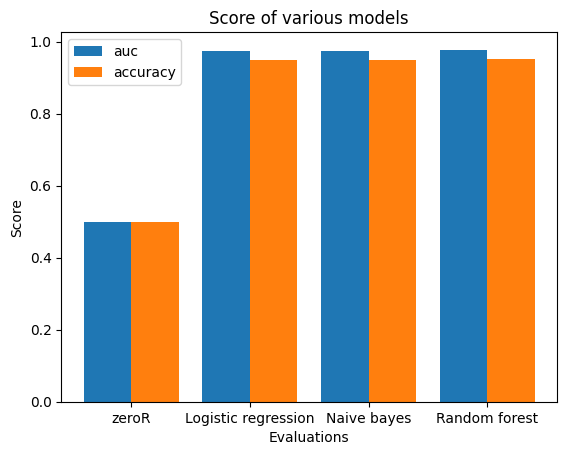

F1:  0.9522342966282944 0.9522342966282944 0.954901671389407
auc:  [0.5, 0.9747547687449855, 0.9743173641845899, 0.9777700131997826]
accuracy:  [0.5, 0.9495846313603323, 0.9495846313603323, 0.9533229491173416]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

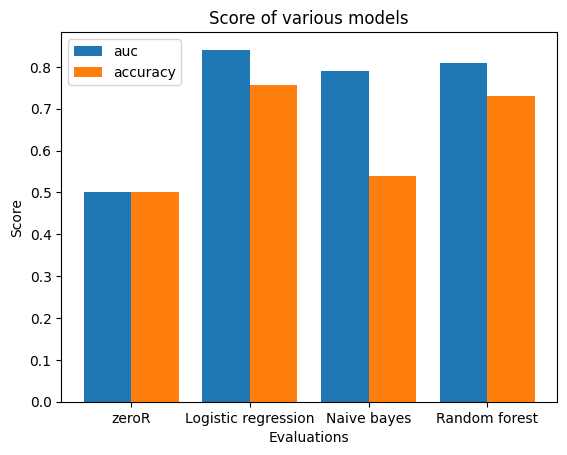

F1:  0.758060192081629 0.6846975314913071 0.7326638250696953
auc:  [0.5, 0.8410968139489435, 0.7898853889361097, 0.8083890866553898]
accuracy:  [0.5, 0.7561804368471035, 0.5400284900284901, 0.7315308641975309]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

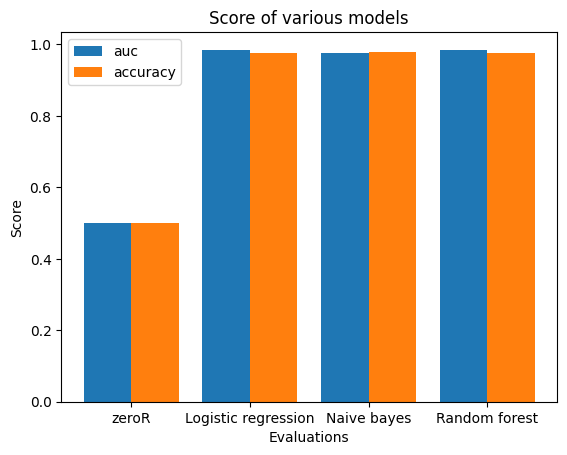

F1:  0.9760653948829868 0.9785917106724605 0.9760653948829868
auc:  [0.5, 0.983838004671338, 0.9768184851518185, 0.9851247080413746]
accuracy:  [0.5, 0.9752283105022831, 0.9779680365296803, 0.9752283105022831]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

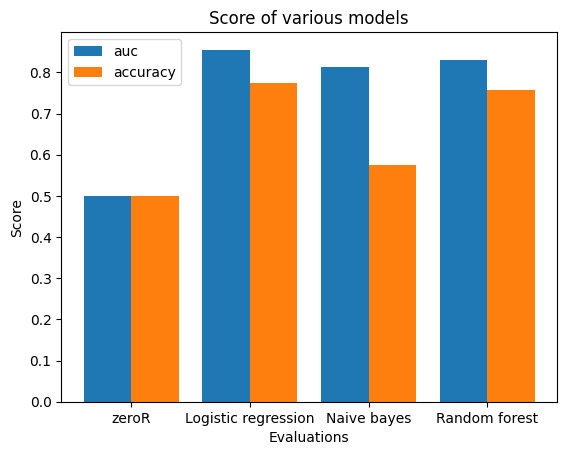

F1:  0.7802908183103718 0.7017658422935689 0.7593338111707161
auc:  [0.5, 0.855084237358068, 0.812911472936634, 0.8303319459011124]
accuracy:  [0.5, 0.7743910337641857, 0.5749655036467574, 0.7563797133282645]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

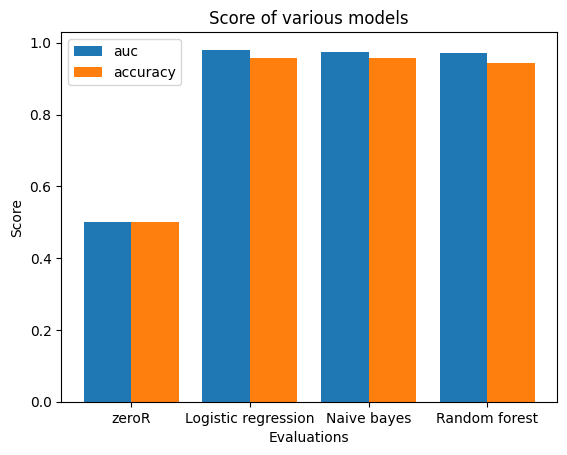

F1:  0.9588798724472274 0.9588798724472274 0.9453162409508833
auc:  [0.5, 0.9805574548525923, 0.9755198487712665, 0.9727486626714396]
accuracy:  [0.5, 0.9568957456755494, 0.9568957456755494, 0.9439223936418888]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

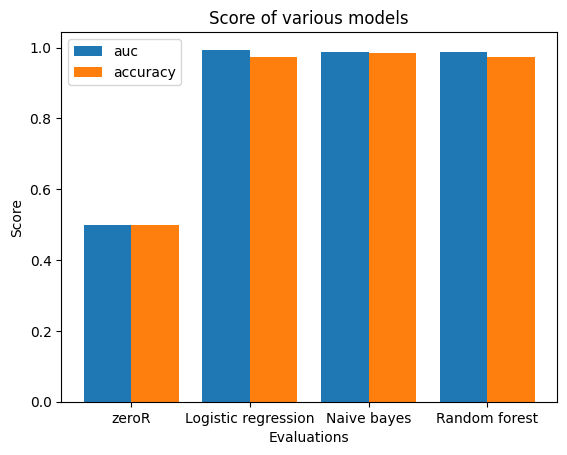

F1:  0.9754276757725033 0.9858395989974937 0.9754276757725033
auc:  [0.5, 0.993915343915344, 0.9884920634920635, 0.9877914951989026]
accuracy:  [0.5, 0.9744781144781145, 0.9854545454545455, 0.9744781144781145]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

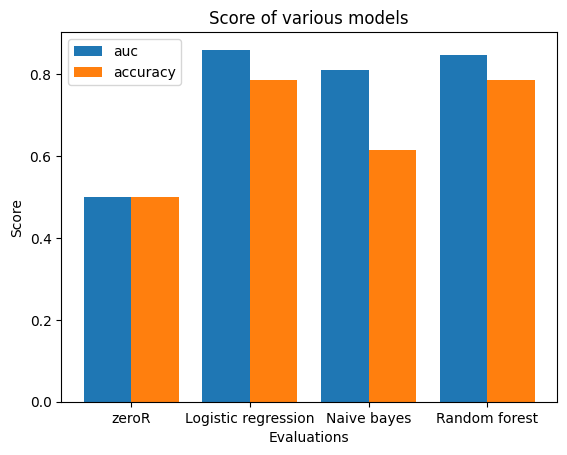

F1:  0.7948134872950032 0.7214299764271918 0.7827271981878957
auc:  [0.5, 0.8595432017273978, 0.8096731201682646, 0.8457792589194814]
accuracy:  [0.5, 0.7863480825958702, 0.6134827925270403, 0.784597836774828]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

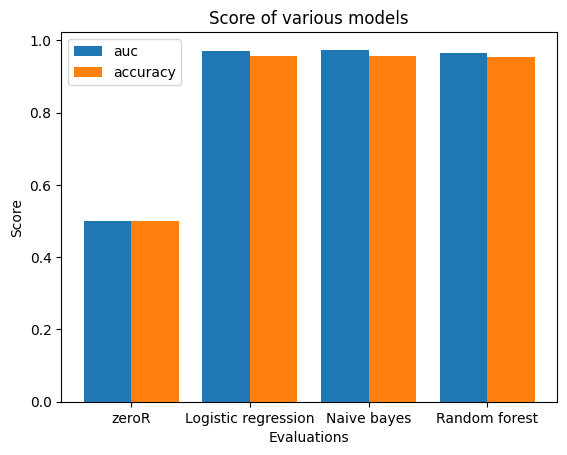

F1:  0.9585015564013505 0.9585015564013505 0.9561062731045825
auc:  [0.5, 0.9715128570726191, 0.9742121048232459, 0.9648360293033089]
accuracy:  [0.5, 0.956214915797915, 0.956214915797915, 0.9539160652232024]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

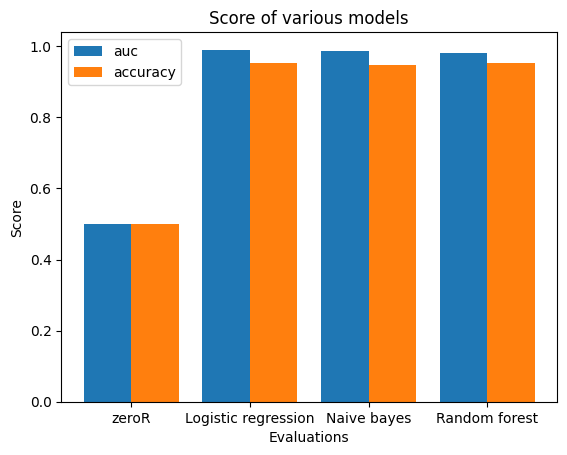

F1:  0.9559898583939505 0.9502006227539685 0.9537352883434973
auc:  [0.5, 0.990334990530303, 0.9865056818181818, 0.981344696969697]
accuracy:  [0.5, 0.95375, 0.947548076923077, 0.95375]


In [152]:
clustering_modeling(niddm_na_one,question_hb1ac, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (626, 53)
Test shape:  (78, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[ 1. 78.]]
Y:  0
Q:  1
[[  0.  54.]
 [  1. 244.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (476, 53)
Test shape:  (60, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  1. 391.]]
Y:  1
Q:  1
[[ 1. 60.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (616, 53)
Test shape:  (77, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[ 1. 77.]]
Y:  0
Q:  1
[[  1. 122.]]
Y:  0
Q:  2
[[  1. 182.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (196, 53)
Test shape:  (24, 67)
Y:  1
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 385.]]
Y:  1
Q:  1
[[ 1. 24.]]
Y:  1
Q:  2
[[  0. 180.]
 [  1.   2.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (292, 53)
Test shape:  (36, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  2
Q:  0
[[  1. 385.]]
Y:  2
Q:  1
[[  0. 102.]
 [  1.  20.]]
Y:  2
Q:  2
[[ 0.  1.]
 [ 1. 35.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (214, 53)
Test shape:  (27, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 27.]]
Y:  0
Q:  1
[[  0. 130.]]
Y:  0
Q:  2
[[  0. 104.]
 [  1.   9.]]
Y:  0
Q:  3
[[  0. 312.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (208, 53)
Test shape:  (26, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  1. 134.]]
Y:  1
Q:  1
[[ 1. 26.]]
Y:  1
Q:  2
[[  1. 113.]]
Y:  1
Q:  3
[[  1. 312.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (180, 53)
Test shape:  (23, 67)
Y:  2
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  1. 134.]]
Y:  2
Q:  1
[[  1. 130.]]
Y:  2
Q:  2
[[ 1. 23.]]
Y:  2
Q:  3
[[  1. 312.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (500, 53)
Test shape:  (62, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 134.]]
Y:  3
Q:  1
[[ 0. 72.]
 [ 1. 58.]]
Y:  3
Q:  2
[[ 0. 24.]
 [ 1. 89.]]
Y:  3
Q:  3
[[ 1. 62.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (218, 53)
Test shape:  (27, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 27.]]
Y:  0
Q:  1
[[  0. 178.]]
Y:  0
Q:  2
[[ 0. 78.]
 [ 1.  7.]]
Y:  0
Q:  3
[[  0. 169.]]
Y:  0
Q:  4
[[  0. 121.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (284, 53)
Test shape:  (36, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0.  17.]
 [  1. 119.]]
Y:  1
Q:  1
[[ 1. 36.]]
Y:  1
Q:  2
[[ 1. 85.]]
Y:  1
Q:  3
[[  1. 169.]]
Y:  1
Q:  4
[[  1. 121.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (136, 53)
Test shape:  (17, 67)
Y:  2
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  1. 136.]]
Y:  2
Q:  1
[[  1. 178.]]
Y:  2
Q:  2
[[ 1. 17.]]
Y:  2
Q:  3
[[  1. 169.]]
Y:  2
Q:  4
[[  0.   1.]
 [  1. 120.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (270, 53)
Test shape:  (34, 67)
Y:  3
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 136.]]
Y:  3
Q:  1
[[  0. 178.]]
Y:  3
Q:  2
[[ 0. 70.]
 [ 1. 15.]]
Y:  3
Q:  3
[[ 1. 34.]]
Y:  3
Q:  4
[[  0. 121.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (194, 53)
Test shape:  (24, 67)
Y:  4
Q:  0
[[  0. 136.]]
Y:  4
Q:  1


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 178.]]
Y:  4
Q:  2
[[ 0. 82.]
 [ 1.  3.]]
Y:  4
Q:  3
[[  0. 169.]]
Y:  4
Q:  4
[[ 1. 24.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

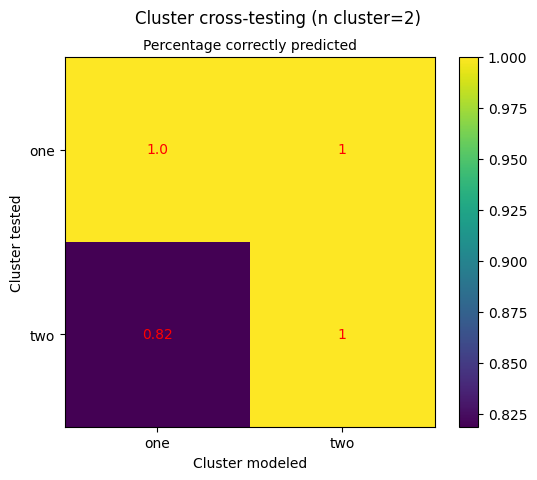

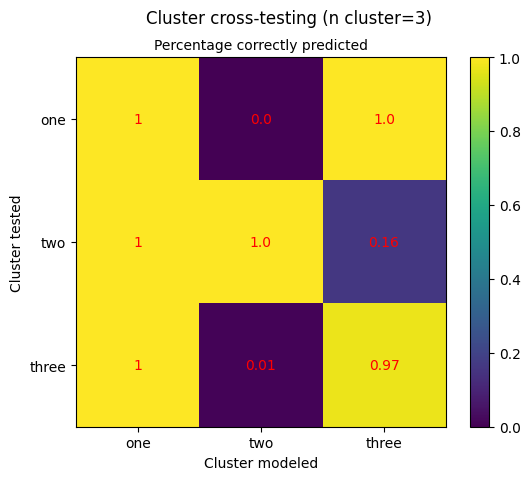

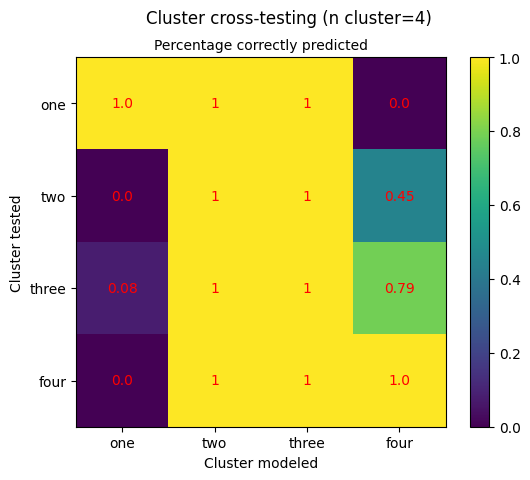

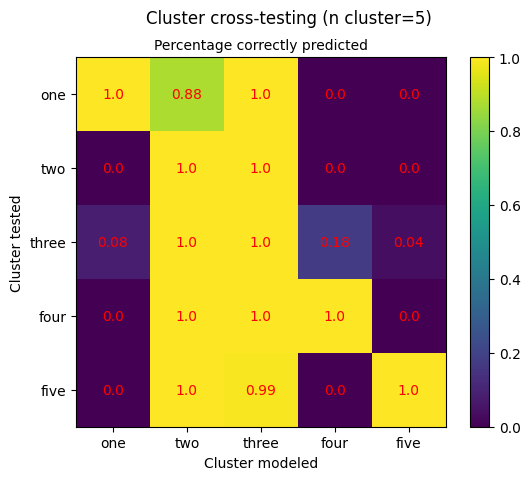

In [129]:
visualize_cross(clustering_analysis(niddm_na_one[(niddm_na_one["Sex_binary"] == 1)],question_hb1ac))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

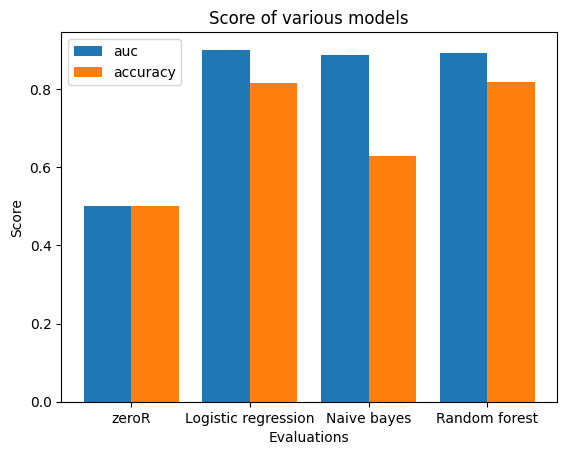

F1:  0.8277411362181565 0.7290309550380473 0.8269204280064832
auc:  [0.5, 0.9003966730224441, 0.8870719532232361, 0.8924713701616851]
accuracy:  [0.5, 0.8165196788205871, 0.6292791013996752, 0.8183625115177043]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

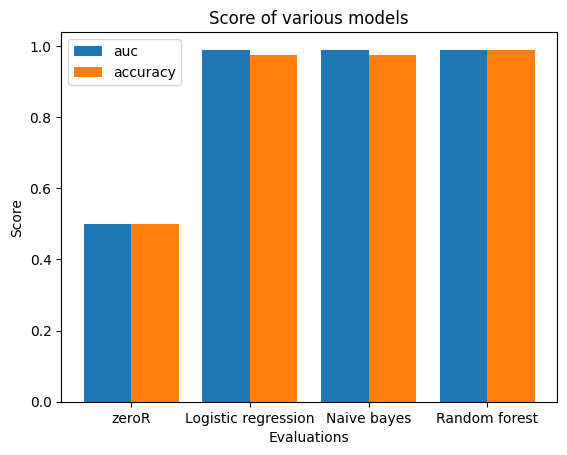

F1:  0.9749007936507936 0.9749007936507936 0.9874007936507936
auc:  [0.5, 0.9883454734651406, 0.9877211238293445, 0.9890738813735692]
accuracy:  [0.5, 0.9741935483870968, 0.9741935483870968, 0.9870967741935484]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

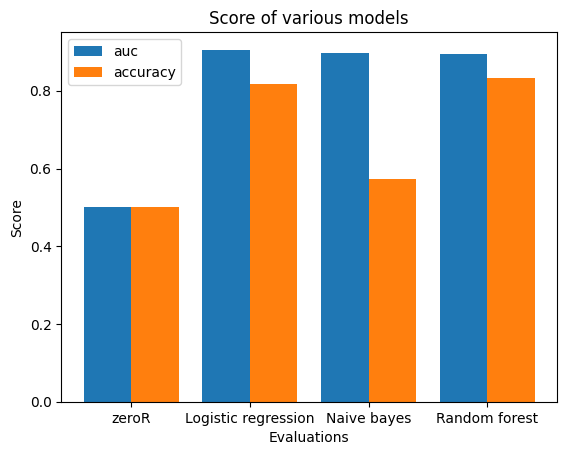

F1:  0.8275003396528572 0.7008031293325411 0.8385761857190429
auc:  [0.5, 0.9056127777450345, 0.8966212058702187, 0.8958076265692226]
accuracy:  [0.5, 0.8174937343358396, 0.5727708159287107, 0.8322918407128933]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

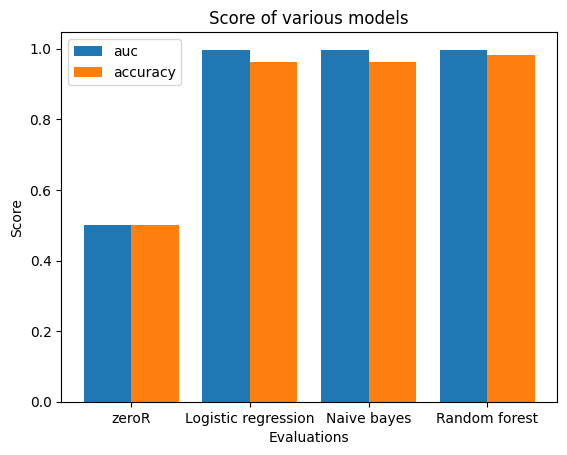

F1:  0.9650161999760573 0.9650161999760573 0.9818181818181818
auc:  [0.5, 0.9950813247109543, 0.9953360768175583, 0.9972761120909269]
accuracy:  [0.5, 0.9634343434343434, 0.9634343434343434, 0.9817508417508417]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

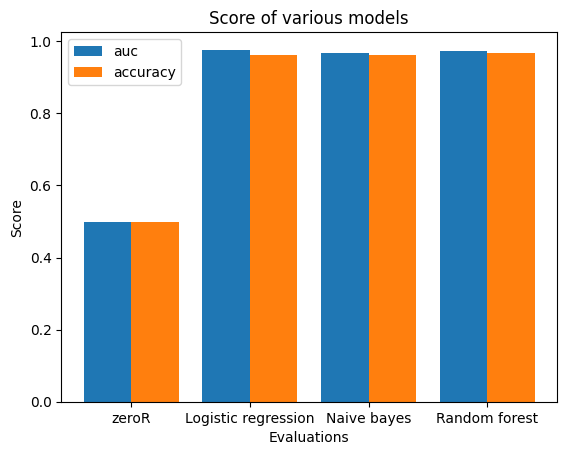

F1:  0.9642965367965368 0.9642965367965368 0.9688387423935091
auc:  [0.5, 0.9766666666666667, 0.9675, 0.9729166666666667]
accuracy:  [0.5, 0.9614919354838709, 0.9614919354838709, 0.967741935483871]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
D

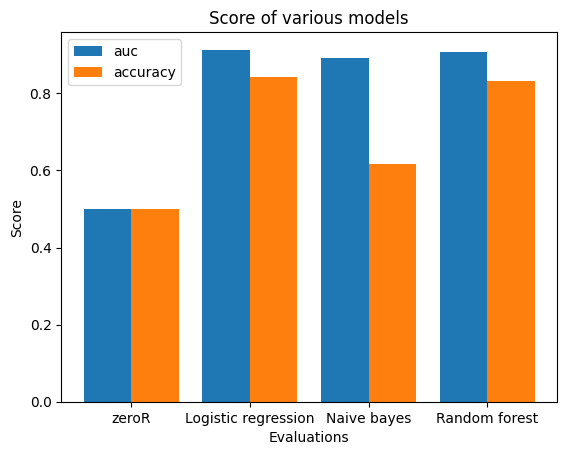

F1:  0.853629734340782 0.7232976783938803 0.8396289976663399
auc:  [0.5, 0.9130715438407746, 0.8925038636577098, 0.9066489066489066]
accuracy:  [0.5, 0.8427874276261373, 0.6172373862696443, 0.8324483043837883]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

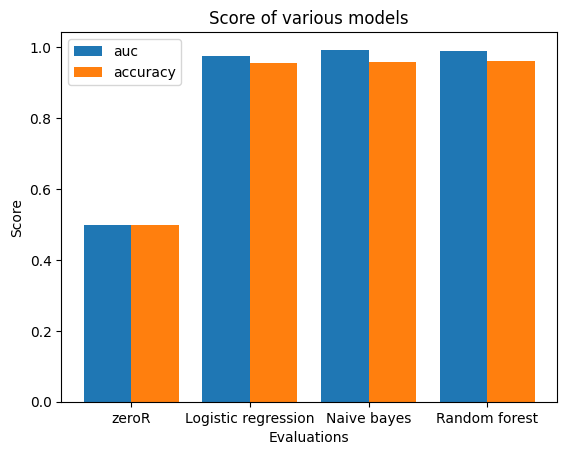

F1:  0.9589175621617382 0.9623010208083547 0.9608055396734642
auc:  [0.5, 0.975641779345483, 0.9931216931216932, 0.9888888888888889]
accuracy:  [0.5, 0.9561616161616161, 0.9597979797979798, 0.95993265993266]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

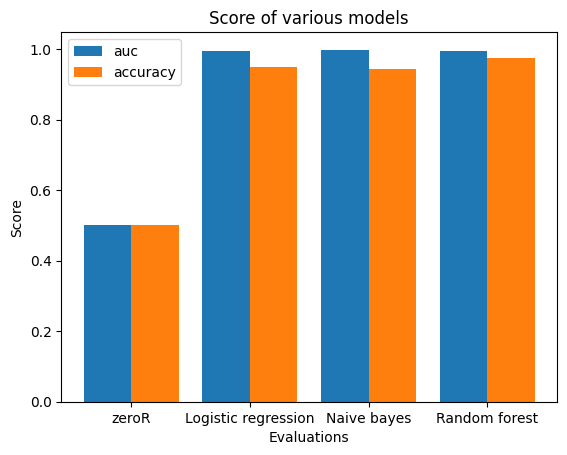

F1:  0.9538233618233618 0.9464387464387464 0.9765925925925927
auc:  [0.5, 0.9961538461538462, 0.9987179487179487, 0.9954594017094017]
accuracy:  [0.5, 0.951, 0.9426666666666667, 0.9756666666666667]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure

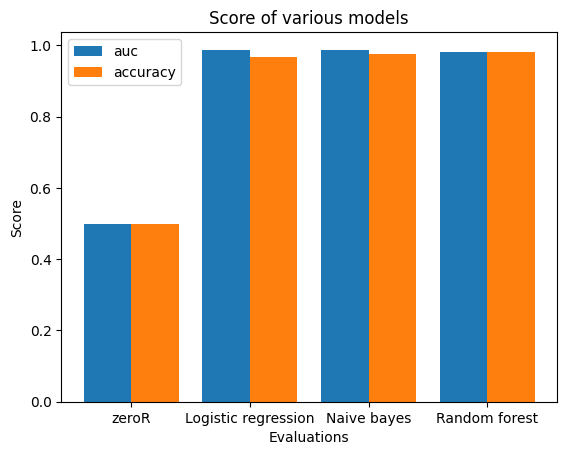

F1:  0.9676190476190476 0.9765072326047936 0.9809523809523809
auc:  [0.5, 0.9876190476190476, 0.9864285714285714, 0.98]
accuracy:  [0.5, 0.9658536585365853, 0.975609756097561, 0.9804878048780488]


In [153]:
clustering_modeling(niddm_na_one[(niddm_na_one["Sex_binary"] == 1)],question_hb1ac, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (196, 53)
Test shape:  (25, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[ 1. 25.]]
Y:  0
Q:  1
[[  1. 268.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (428, 53)
Test shape:  (54, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  1. 123.]]
Y:  1
Q:  1
[[ 1. 54.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (180, 53)
Test shape:  (23, 66)
Y:  0
Q:  0
[[ 1. 23.]]
Y:  0
Q:  1
[[  1. 197.]]
Y:  0
Q:  2


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 1. 81.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (316, 53)
Test shape:  (39, 67)
Y:  1
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0.   3.]
 [  1. 110.]]
Y:  1
Q:  1
[[ 0.  1.]
 [ 1. 38.]]
Y:  1
Q:  2
[[ 0.  1.]
 [ 1. 80.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (130, 53)
Test shape:  (16, 67)
Y:  2
Q:  0
[[  1. 113.]]
Y:  2
Q:  1
[[  1. 197.]]
Y:  2
Q:  2
[[ 1. 16.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (140, 53)
Test shape:  (17, 66)
Y:  0
Q:  0
[[ 1. 17.]]
Y:  0
Q:  1
[[  1. 142.]]
Y:  0
Q:  2
[[ 1. 62.]]
Y:  0
Q:  3
[[  1. 100.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (228, 53)
Test shape:  (28, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[ 1. 87.]]
Y:  1
Q:  1
[[ 1. 28.]]
Y:  1
Q:  2
[[ 1. 62.]]
Y:  1
Q:  3
[[  1. 100.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (100, 53)
Test shape:  (12, 67)
Y:  2
Q:  0
[[ 1. 87.]]
Y:  2
Q:  1
[[  1. 142.]]
Y:  2
Q:  2
[[ 1. 12.]]
Y:  2
Q:  3


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  1. 100.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (160, 53)
Test shape:  (20, 67)
Y:  3
Q:  0
[[ 1. 87.]]
Y:  3
Q:  1
[[  1. 142.]]
Y:  3
Q:  2
[[ 1. 62.]]
Y:  3
Q:  3
[[ 1. 20.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

MinMax
modeling...
Trainings shape:  (110, 53)
Test shape:  (14, 66)
Y:  0
Q:  0
[[ 1. 14.]]
Y:  0
Q:  1
[[ 1. 89.]]
Y:  0
Q:  2
[[ 1. 85.]]
Y:  0
Q:  3
[[ 1. 68.]]
Y:  0
Q:  4
[[ 1. 80.]]
Cluster  0  of  5
Healthy sampling...


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

MinMax
modeling...
Trainings shape:  (142, 53)
Test shape:  (18, 67)
Y:  1
Q:  0
[[ 0. 52.]
 [ 1. 17.]]
Y:  1
Q:  1
[[ 1. 18.]]
Y:  1
Q:  2
[[ 0. 26.]
 [ 1. 59.]]
Y:  1
Q:  3


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 0.  5.]
 [ 1. 63.]]
Y:  1
Q:  4
[[ 0. 24.]
 [ 1. 56.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (136, 53)
Test shape:  (17, 67)
Y:  2
Q:  0
[[ 0. 69.]]
Y:  2
Q:  1
[[ 0. 89.]]
Y:  2
Q:  2
[[ 1. 17.]]
Y:  2
Q:  3
[[ 0. 67.]
 [ 1.  1.]]
Y:  2
Q:  4
[[ 0. 75.]
 [ 1.  5.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (108, 53)
Test shape:  (14, 67)
Y:  3
Q:  0
[[ 1. 69.]]
Y:  3
Q:  1
[[ 1. 89.]]
Y:  3
Q:  2


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 1. 85.]]
Y:  3
Q:  3
[[ 1. 14.]]
Y:  3
Q:  4
[[ 1. 80.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (128, 53)
Test shape:  (16, 67)
Y:  4
Q:  0
[[ 1. 69.]]
Y:  4
Q:  1
[[ 1. 89.]]
Y:  4
Q:  2
[[ 1. 85.]]
Y:  4
Q:  3


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 1. 68.]]
Y:  4
Q:  4
[[ 1. 16.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


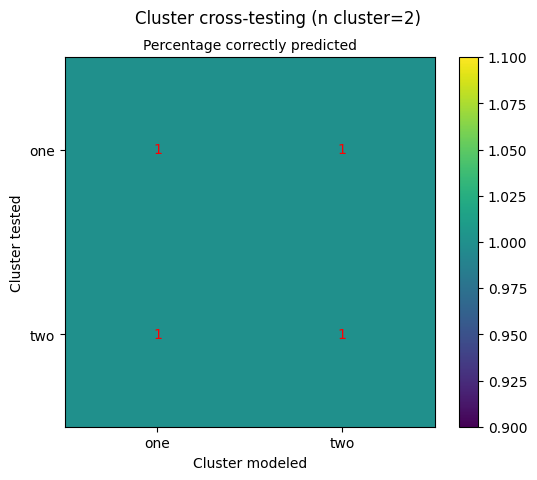

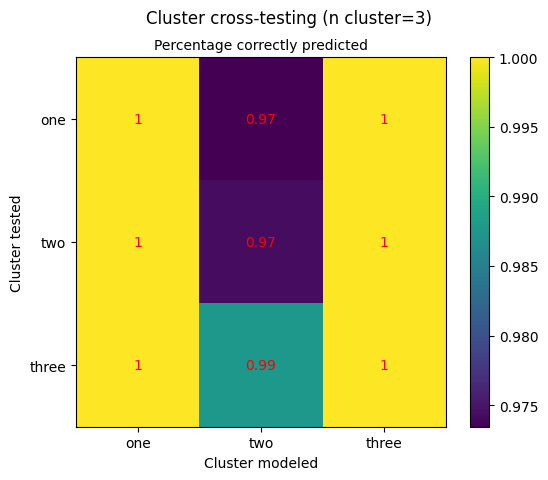

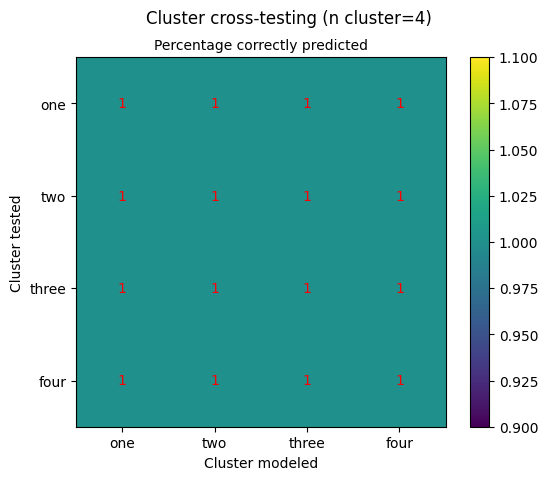

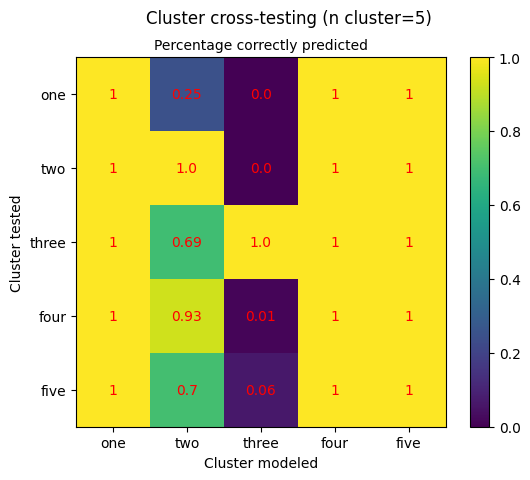

In [130]:
visualize_cross(clustering_analysis(niddm_na_one[(niddm_na_one["Sex_binary"] == 0)],question_hb1ac))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

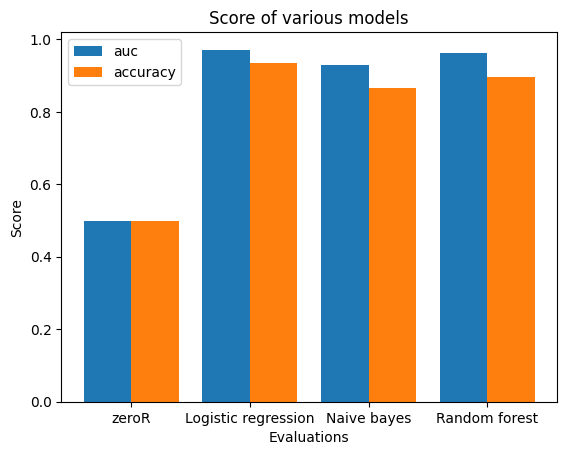

F1:  0.9375613275613276 0.8705103685257475 0.8981215819507207
auc:  [0.5, 0.97134318968229, 0.9297944846387752, 0.9634450036699171]
accuracy:  [0.5, 0.9348551360842845, 0.8668568920105355, 0.8964003511852502]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

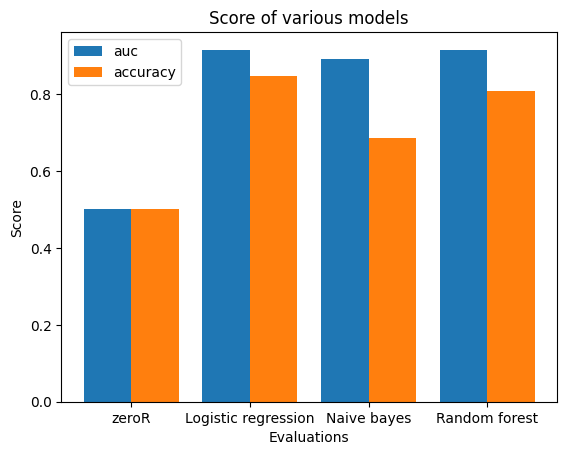

F1:  0.8485130577652615 0.7599058307954167 0.8126388294896079
auc:  [0.5, 0.9143663911845731, 0.8920775941230487, 0.9152812213039486]
accuracy:  [0.5, 0.8468845760980592, 0.6869509703779367, 0.8085546475995914]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

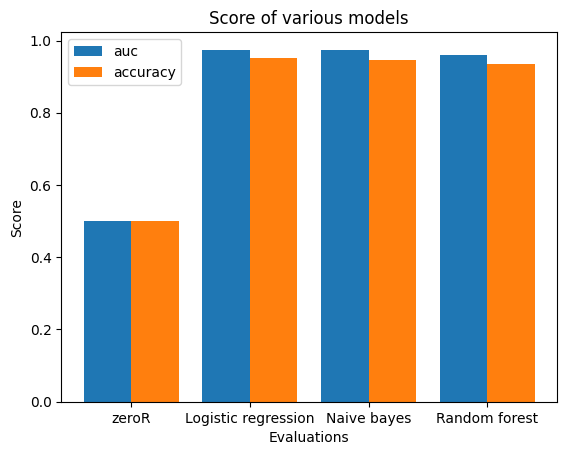

F1:  0.9545525547745304 0.9517274384501275 0.9383316219569589
auc:  [0.5, 0.9744933333333333, 0.97356, 0.9602533333333333]
accuracy:  [0.5, 0.9513469387755102, 0.947265306122449, 0.9351020408163265]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressur

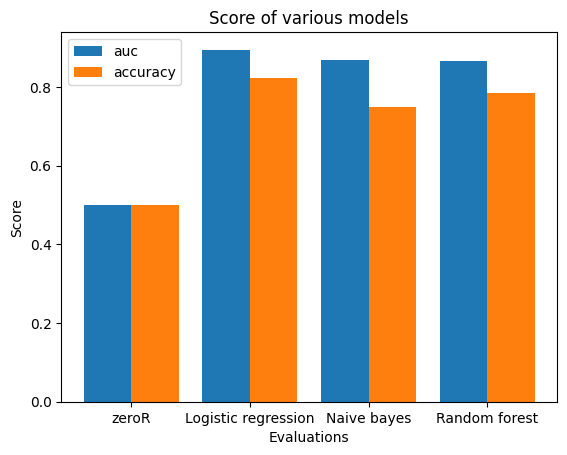

F1:  0.8330909428352883 0.7942887915490655 0.7913184700782706
auc:  [0.5, 0.894901144640999, 0.8699271592091571, 0.8651404786680541]
accuracy:  [0.5, 0.8225806451612904, 0.7483870967741936, 0.7838709677419354]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

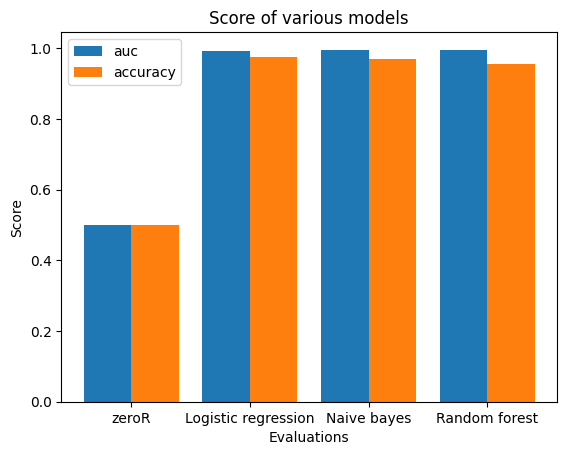

F1:  0.9746108940029913 0.9692424242424242 0.9553007562013005
auc:  [0.5, 0.9925244887437704, 0.994088331328407, 0.9952912871627427]
accuracy:  [0.5, 0.9736231884057971, 0.9690821256038648, 0.9558454106280193]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

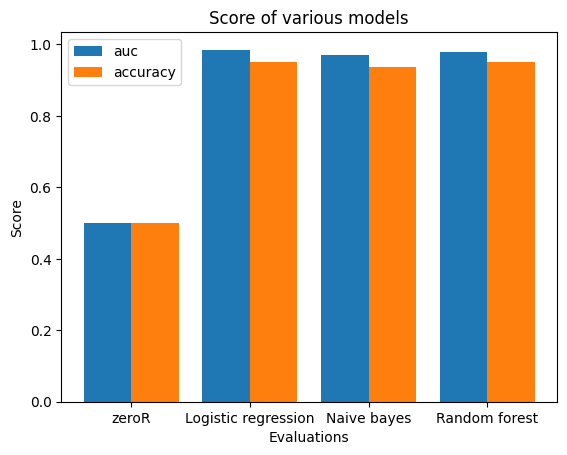

F1:  0.9527761164774696 0.9403647835945972 0.9522087405909448
auc:  [0.5, 0.9851239669421488, 0.9712809917355372, 0.9791322314049586]
accuracy:  [0.5, 0.95, 0.9363636363636364, 0.95]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure               

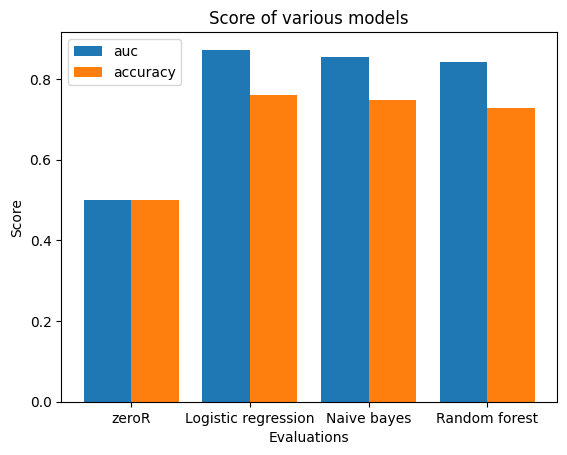

F1:  0.7665653207403975 0.795138922960419 0.7417812231275489
auc:  [0.5, 0.8722071256038647, 0.8540307971014494, 0.8417647946859903]
accuracy:  [0.5, 0.7607269503546099, 0.7481382978723404, 0.7273049645390071]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

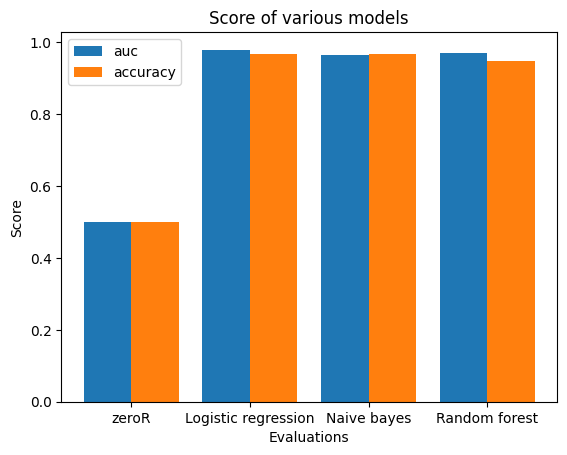

F1:  0.9689149560117302 0.9681451612903226 0.9470253985910271
auc:  [0.5, 0.9795555555555555, 0.9657777777777778, 0.9690833333333333]
accuracy:  [0.5, 0.9666666666666667, 0.9668817204301076, 0.9470967741935484]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

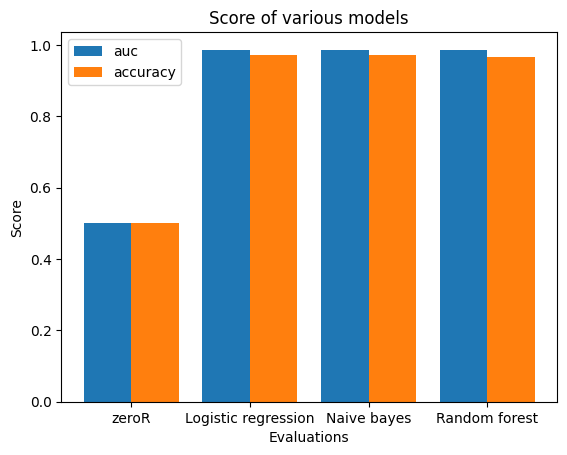

F1:  0.9732330827067669 0.9720634920634921 0.9639705882352941
auc:  [0.5, 0.9861207227989235, 0.9858708189158016, 0.9862552864282969]
accuracy:  [0.5, 0.9712605042016806, 0.9712605042016806, 0.9653781512605042]


In [154]:
clustering_modeling(niddm_na_one[(niddm_na_one["Sex_binary"] == 0)],question_hb1ac, 2,5)

### Five year

#### questionnaire only

MinMax
MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (6056, 52)
Test shape:  (757, 74)
Y:  0
Q:  0
[[  1. 757.]]
Y:  0
Q:  1
[[   0. 2204.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3526, 52)
Test shape:  (441, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[1.000e+00 3.785e+03]]
Y:  1
Q:  1
[[  1. 441.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1606, 52)
Test shape:  (201, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  1. 201.]]
Y:  0
Q:  1
[[   0. 2949.]]
Y:  0
Q:  2
[[0.000e+00 2.005e+03]
 [1.000e+00 3.100e+01]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4718, 52)
Test shape:  (590, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[   0. 1004.]]
Y:  1
Q:  1
[[  1. 590.]]
Y:  1
Q:  2
[[   0. 2036.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3258, 52)
Test shape:  (407, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[1.000e+00 1.004e+03]]
Y:  2
Q:  1
[[0.000e+00 1.620e+02]
 [1.000e+00 2.787e+03]]
Y:  2
Q:  2
[[  1. 407.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1564, 52)
Test shape:  (195, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 195.]]
Y:  0
Q:  1
[[   0. 2384.]]
Y:  0
Q:  2
[[0.000e+00 1.604e+03]
 [1.000e+00 9.000e+00]]
Y:  0
Q:  3
[[  0. 966.]
 [  1.  49.]]
Cluster  0  of  4
Healthy sampling...
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

modeling...
Trainings shape:  (3814, 52)
Test shape:  (477, 75)
Y:  1
Q:  0
[[  0. 977.]]
Y:  1
Q:  1
[[  0. 120.]
 [  1. 357.]]
Y:  1
Q:  2
[[   0. 1613.]]
Y:  1
Q:  3
[[  0. 485.]
 [  1. 530.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2580, 52)
Test shape:  (323, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0.  64.]
 [  1. 913.]]
Y:  2
Q:  1
[[0.000e+00 2.314e+03]
 [1.000e+00 7.000e+01]]
Y:  2
Q:  2
[[  1. 323.]]
Y:  2
Q:  3
[[  0. 557.]
 [  1. 458.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1624, 52)
Test shape:  (203, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 668.]
 [  1. 309.]]
Y:  3
Q:  1
[[0.000e+00 1.671e+03]
 [1.000e+00 7.130e+02]]
Y:  3
Q:  2
[[0.000e+00 1.031e+03]
 [1.000e+00 5.820e+02]]
Y:  3
Q:  3
[[  1. 203.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1568, 52)
Test shape:  (196, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 196.]]
Y:  0
Q:  1
[[   0. 1857.]]
Y:  0
Q:  2
[[0.00e+00 1.49e+03]
 [1.00e+00 1.00e+01]]
Y:  0
Q:  3
[[  0. 789.]
 [  1.  45.]]
Y:  0
Q:  4
[[  0. 818.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2972, 52)
Test shape:  (371, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 980.]]
Y:  1
Q:  1
[[  1. 371.]]
Y:  1
Q:  2
[[   0. 1500.]]
Y:  1
Q:  3
[[  0. 525.]
 [  1. 309.]]
Y:  1
Q:  4
[[  0. 818.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2400, 52)
Test shape:  (300, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 125.]
 [  1. 855.]]
Y:  2
Q:  1
[[0.000e+00 2.360e+02]
 [1.000e+00 1.621e+03]]
Y:  2
Q:  2
[[  1. 300.]]
Y:  2
Q:  3
[[  0. 145.]
 [  1. 689.]]
Y:  2
Q:  4
[[  0. 709.]
 [  1. 109.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1334, 52)
Test shape:  (167, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 529.]
 [  1. 451.]]
Y:  3
Q:  1
[[  0. 937.]
 [  1. 920.]]
Y:  3
Q:  2
[[  0. 710.]
 [  1. 790.]]
Y:  3
Q:  3
[[  1. 167.]]
Y:  3
Q:  4
[[  0. 426.]
 [  1. 392.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1308, 52)
Test shape:  (164, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 980.]]
Y:  4
Q:  1
[[   0. 1857.]]
Y:  4
Q:  2
[[   0. 1500.]]
Y:  4
Q:  3
[[  0. 814.]
 [  1.  20.]]
Y:  4
Q:  4
[[  0.   7.]
 [  1. 157.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

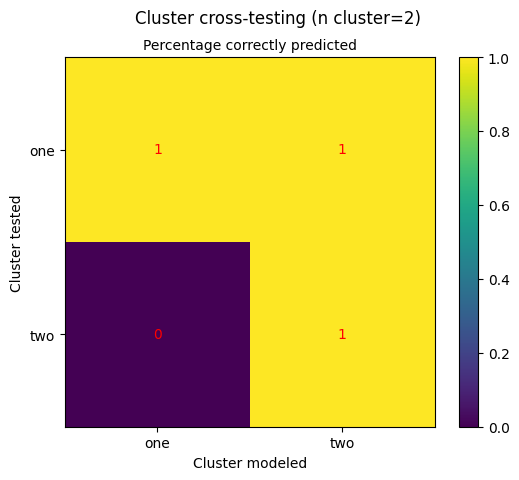

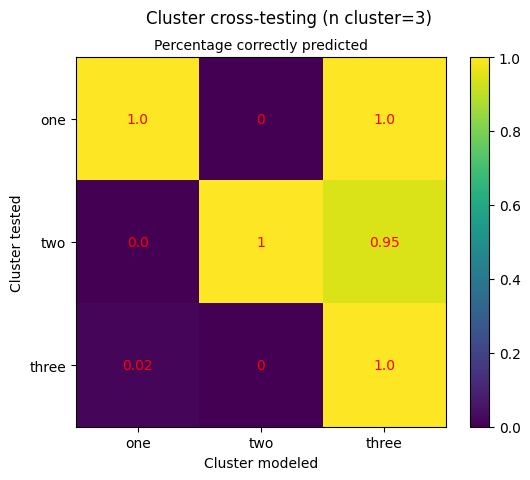

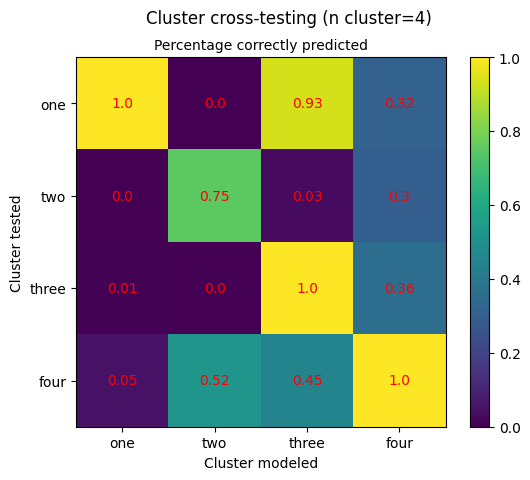

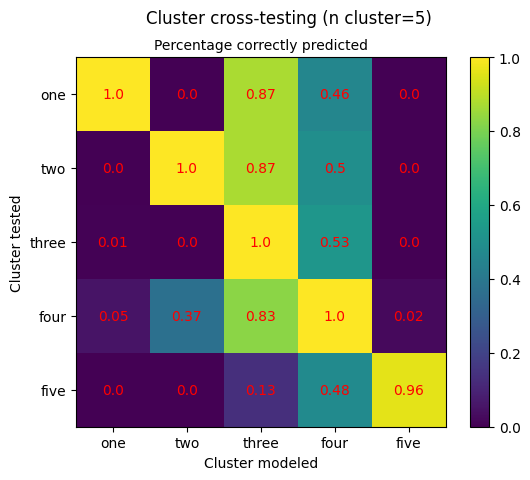

In [131]:
visualize_cross(clustering_analysis(niddm_na_five,question))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

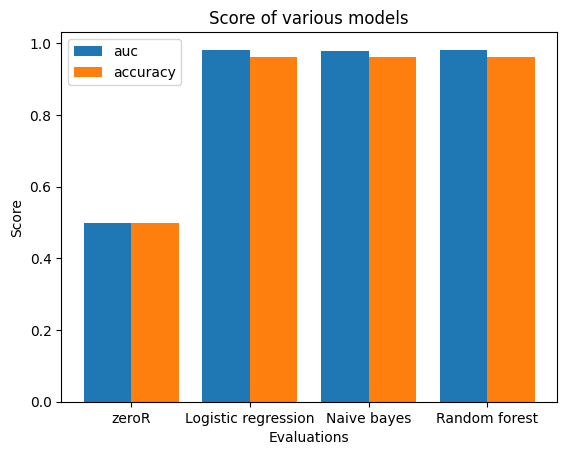

F1:  0.9637165084045426 0.9632397097668245 0.964492108089386
auc:  [0.5, 0.9816488000980979, 0.9791233216066909, 0.9823354191464216]
accuracy:  [0.5, 0.9622799501479982, 0.9617697460663654, 0.9633029547696942]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

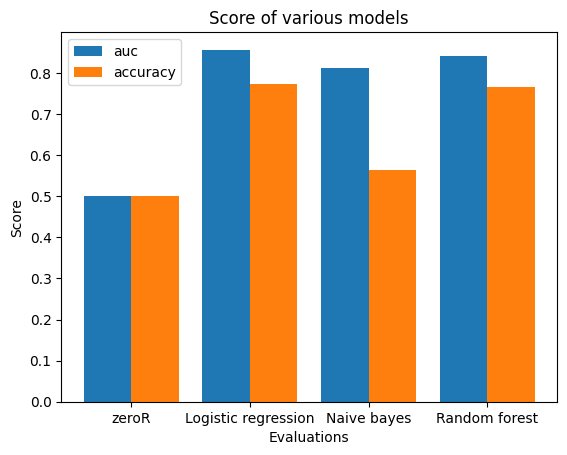

F1:  0.777097116302826 0.6958931224616729 0.7710022148874762
auc:  [0.5, 0.8569138675237854, 0.8119546471791084, 0.8423781126423745]
accuracy:  [0.5, 0.7741606153643785, 0.5642963199910713, 0.766872246520439]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

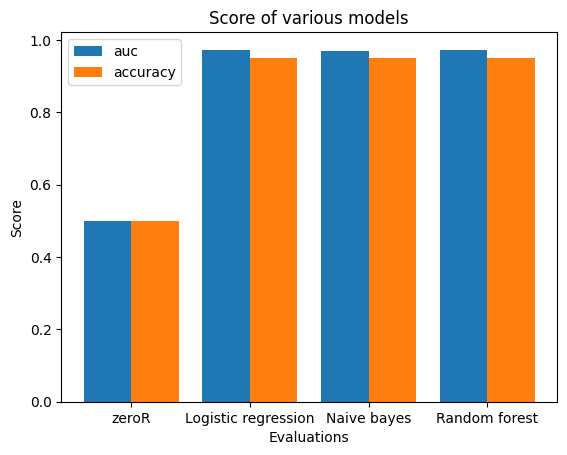

F1:  0.9519530545399749 0.951995456029027 0.9529139170864401
auc:  [0.5, 0.973503056044753, 0.9712070319684903, 0.9717151482990378]
accuracy:  [0.5, 0.949540426857766, 0.949540426857766, 0.9510684426442333]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood

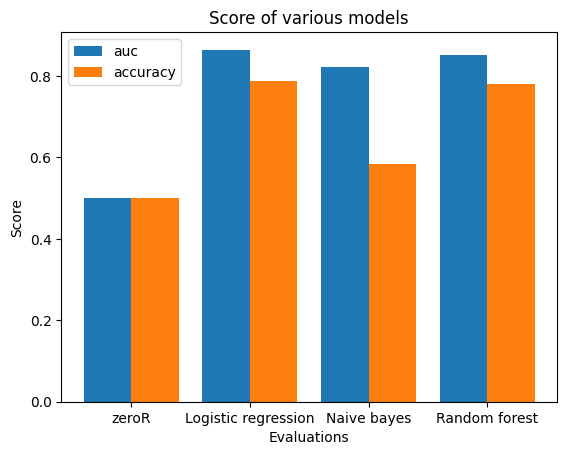

F1:  0.7919854364684928 0.7055904074547962 0.7831180131103915
auc:  [0.5, 0.864632557209828, 0.8229765582271015, 0.8512782487522914]
accuracy:  [0.5, 0.7883883120858902, 0.5827331898547625, 0.7814400366747226]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

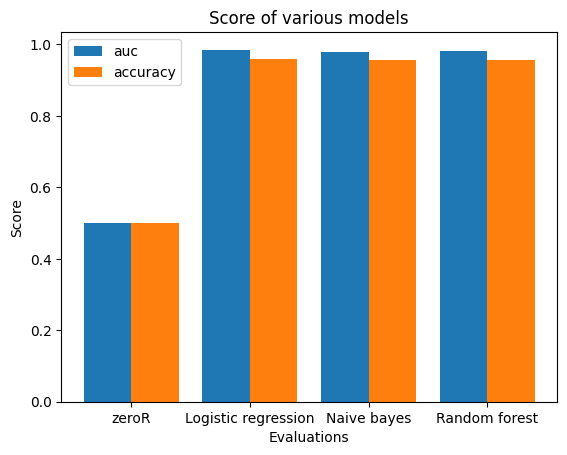

F1:  0.9603174794323089 0.9593908380800987 0.9589940803371291
auc:  [0.5, 0.9852037461927572, 0.9797233291738786, 0.9827506608165949]
accuracy:  [0.5, 0.958542855269198, 0.9575198373663847, 0.9575198373663847]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

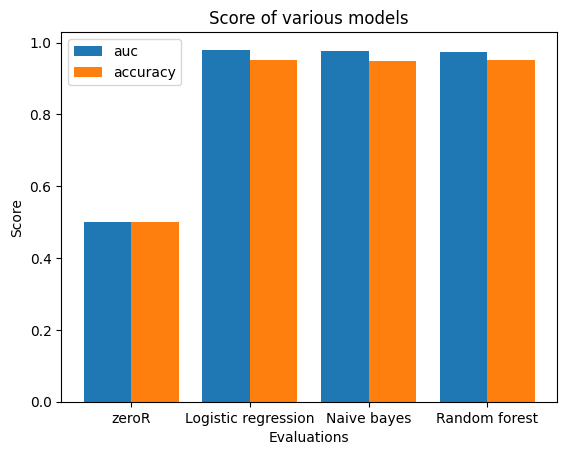

F1:  0.952826333187899 0.9501812829173157 0.9543732969546929
auc:  [0.5, 0.9801179500081396, 0.9774113525032928, 0.9748770869582682]
accuracy:  [0.5, 0.9505660279378927, 0.9475061016773122, 0.952605546035208]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

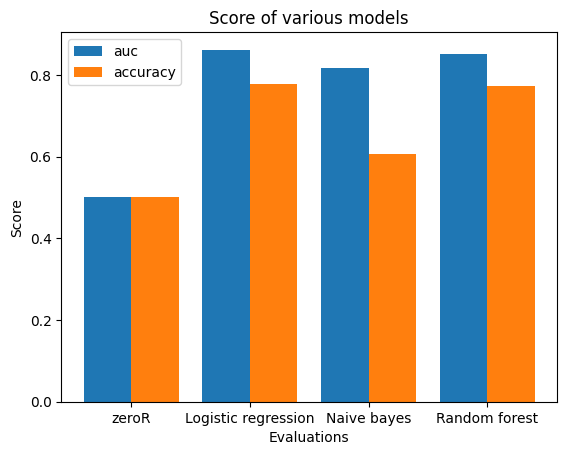

F1:  0.7852987150632755 0.7173221751351664 0.7752024574398225
auc:  [0.5, 0.8615393694757381, 0.8173086882247517, 0.8514660999504403]
accuracy:  [0.5, 0.7781507138681991, 0.605902853736595, 0.7729776435115254]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

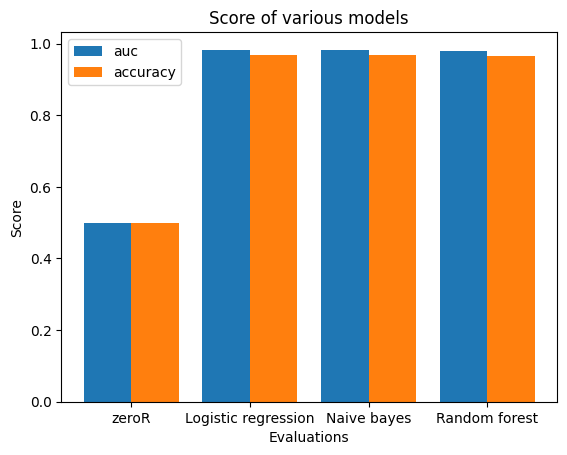

F1:  0.9693751750619128 0.969868827201705 0.9678341995373635
auc:  [0.5, 0.9830001475935541, 0.9823242093681654, 0.9796830227159897]
accuracy:  [0.5, 0.9682759525214768, 0.9687887730342973, 0.9667388025444291]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

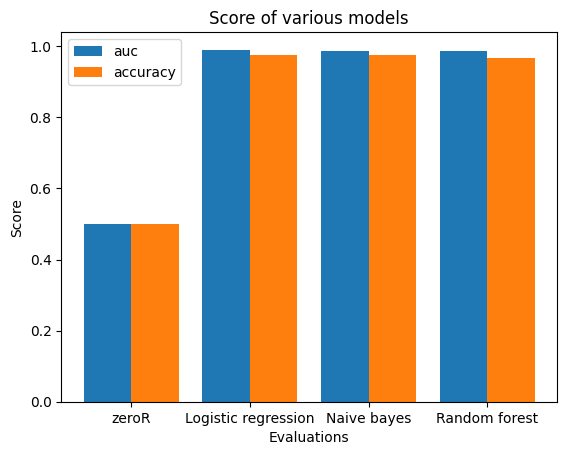

F1:  0.9751459193452741 0.9770701872591727 0.9683544763992693
auc:  [0.5, 0.9903878203684519, 0.9861222467456421, 0.9875456060537814]
accuracy:  [0.5, 0.974496644295302, 0.9765100671140939, 0.9677852348993289]


In [155]:
clustering_modeling(niddm_na_five,question, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2300, 52)
Test shape:  (287, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[  0. 143.]
 [  1. 144.]]
Y:  0
Q:  1
[[  0. 576.]
 [  1. 191.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1228, 52)
Test shape:  (153, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[0.000e+00 4.280e+02]
 [1.000e+00 1.009e+03]]
Y:  1
Q:  1
[[  1. 153.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (988, 52)
Test shape:  (123, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  1. 123.]]
Y:  0
Q:  1
[[1.000e+00 1.146e+03]]
Y:  0
Q:  2
[[  0. 149.]
 [  1. 292.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1834, 52)
Test shape:  (229, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0.  33.]
 [  1. 584.]]
Y:  1
Q:  1
[[  1. 229.]]
Y:  1
Q:  2
[[  0. 441.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (706, 52)
Test shape:  (88, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 584.]
 [  1.  33.]]
Y:  2
Q:  1
[[   0. 1146.]]
Y:  2
Q:  2
[[ 1. 88.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (576, 52)
Test shape:  (72, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 72.]]
Y:  0
Q:  1
[[  0. 419.]]
Y:  0
Q:  2
[[  0. 372.]
 [  1.  81.]]
Y:  0
Q:  3
[[  0. 971.]
 [  1.   1.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (670, 52)
Test shape:  (84, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 196.]
 [  1. 164.]]
Y:  1
Q:  1
[[ 0.  1.]
 [ 1. 83.]]
Y:  1
Q:  2
[[  0. 335.]
 [  1. 118.]]
Y:  1
Q:  3
[[  0. 972.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (724, 52)
Test shape:  (91, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 343.]
 [  1.  17.]]
Y:  2
Q:  1
[[  0. 415.]
 [  1.   4.]]
Y:  2
Q:  2
[[ 1. 91.]]
Y:  2
Q:  3
[[  0. 972.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1556, 52)
Test shape:  (194, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 360.]]
Y:  3
Q:  1
[[  0. 418.]
 [  1.   1.]]
Y:  3
Q:  2
[[  0. 453.]]
Y:  3
Q:  3
[[  0.   6.]
 [  1. 188.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (506, 52)
Test shape:  (63, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 63.]]
Y:  0
Q:  1
[[  0. 269.]
 [  1.  57.]]
Y:  0
Q:  2
[[  0. 346.]
 [  1.  98.]]
Y:  0
Q:  3
[[  0. 353.]
 [  1.  64.]]
Y:  0
Q:  4
[[  0. 691.]
 [  1.  10.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (522, 52)
Test shape:  (65, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 190.]
 [  1. 126.]]
Y:  1
Q:  1
[[ 0.  1.]
 [ 1. 64.]]
Y:  1
Q:  2
[[  0. 338.]
 [  1. 106.]]
Y:  1
Q:  3
[[  0. 318.]
 [  1.  99.]]
Y:  1
Q:  4
[[  0. 681.]
 [  1.  20.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (710, 52)
Test shape:  (89, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 291.]
 [  1.  25.]]
Y:  2
Q:  1
[[  0. 321.]
 [  1.   5.]]
Y:  2
Q:  2
[[ 1. 89.]]
Y:  2
Q:  3
[[  0. 417.]]
Y:  2
Q:  4
[[  0. 701.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (668, 52)
Test shape:  (83, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 286.]
 [  1.  30.]]
Y:  3
Q:  1
[[  0. 326.]]
Y:  3
Q:  2
[[  0. 444.]]
Y:  3
Q:  3
[[ 1. 83.]]
Y:  3
Q:  4
[[  0. 701.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1122, 52)
Test shape:  (140, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 316.]]
Y:  4
Q:  1
[[  0. 325.]
 [  1.   1.]]
Y:  4
Q:  2
[[  0. 444.]]
Y:  4
Q:  3
[[  0. 417.]]
Y:  4
Q:  4
[[  1. 140.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

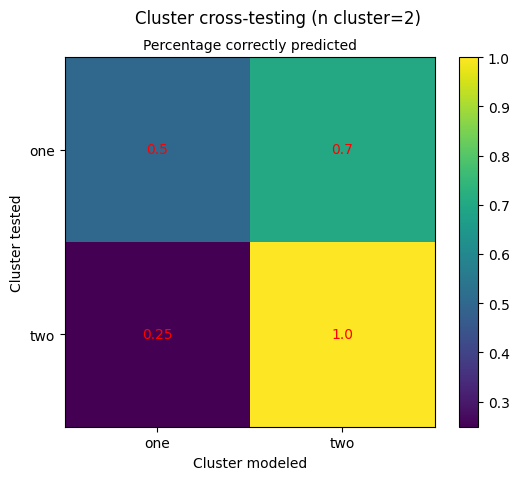

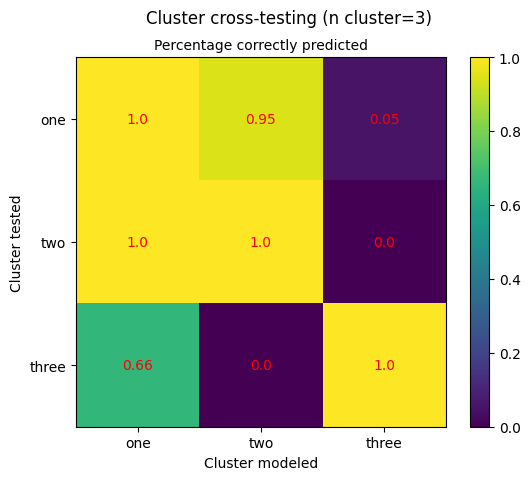

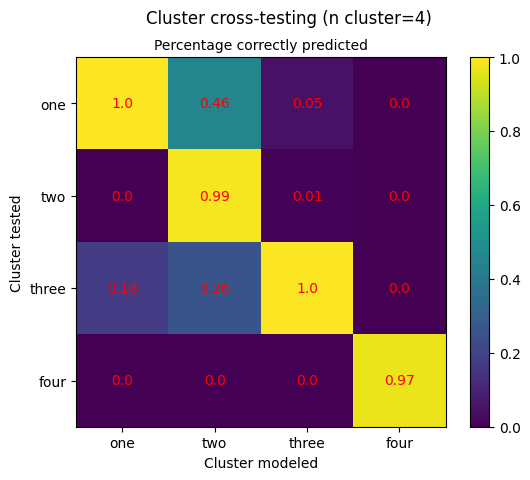

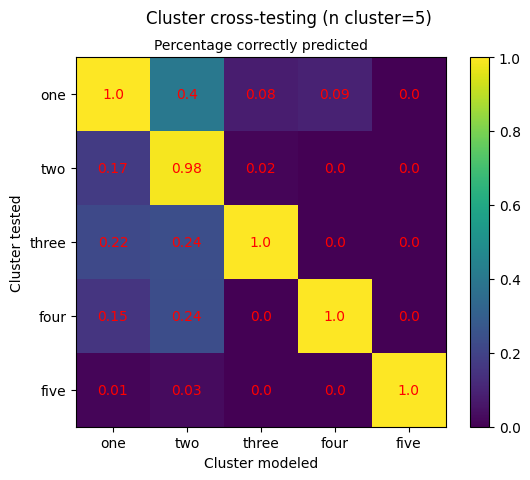

In [132]:
visualize_cross(clustering_analysis(niddm_na_five[(niddm_na_five["Sex_binary"] == 0)],question))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

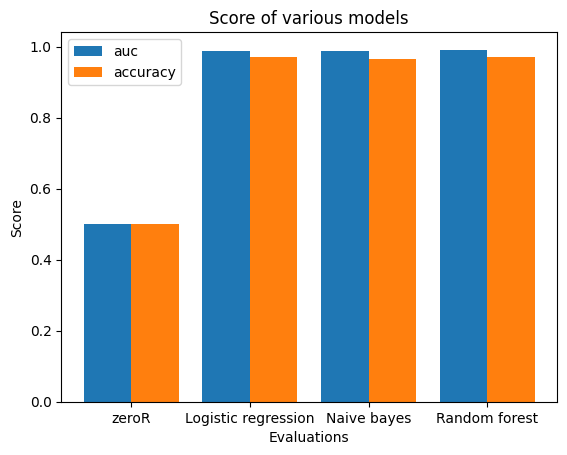

F1:  0.9705310826581495 0.9655841177626838 0.9720647225298388
auc:  [0.5, 0.9888798185941043, 0.986249433106576, 0.9911111111111112]
accuracy:  [0.5, 0.9695238095238096, 0.9647619047619048, 0.9714285714285714]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

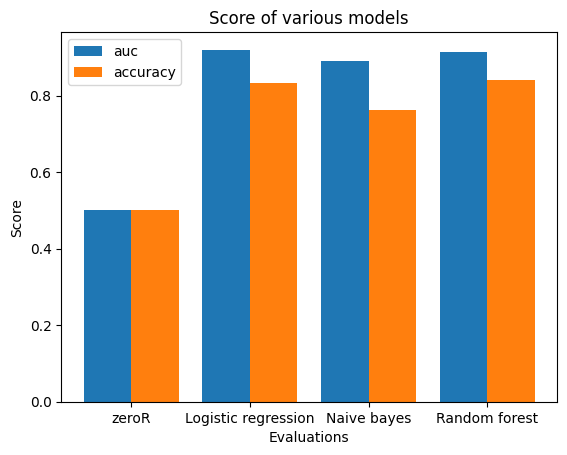

F1:  0.8393001148318916 0.8024757063430077 0.8452184281584032
auc:  [0.5, 0.9201174400108302, 0.8912031757665753, 0.91391781261634]
accuracy:  [0.5, 0.8344213505074161, 0.7626592328436591, 0.8415664253779008]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

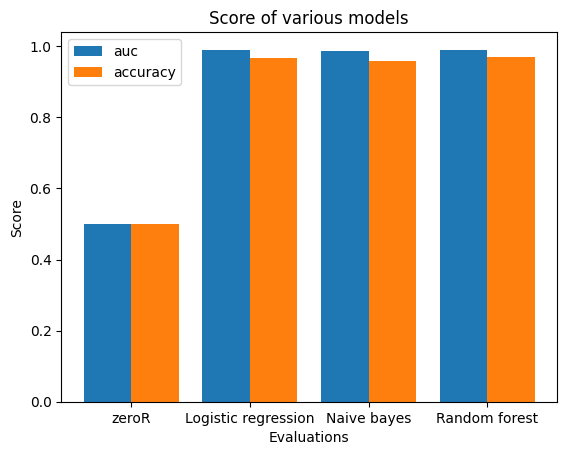

F1:  0.9668830792886534 0.9601604231293711 0.9703642555288846
auc:  [0.5, 0.9902222222222222, 0.9871564625850341, 0.9883356009070294]
accuracy:  [0.5, 0.9657142857142857, 0.959047619047619, 0.9695238095238096]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

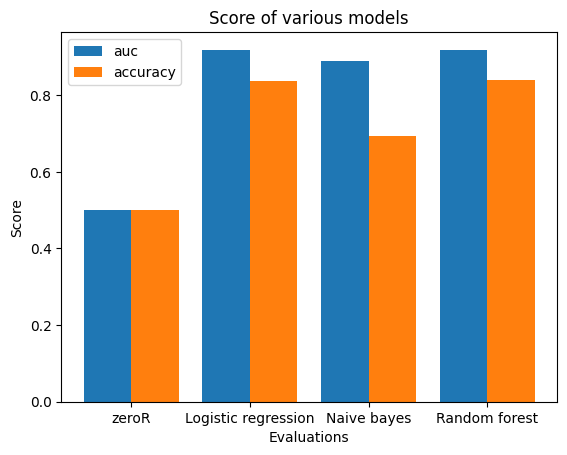

F1:  0.8427485573541345 0.7637069545352267 0.8417562123662425
auc:  [0.5, 0.9186575836216839, 0.8901916690695886, 0.9178253316032295]
accuracy:  [0.5, 0.8367177007789417, 0.6922481869460113, 0.8394666359694563]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

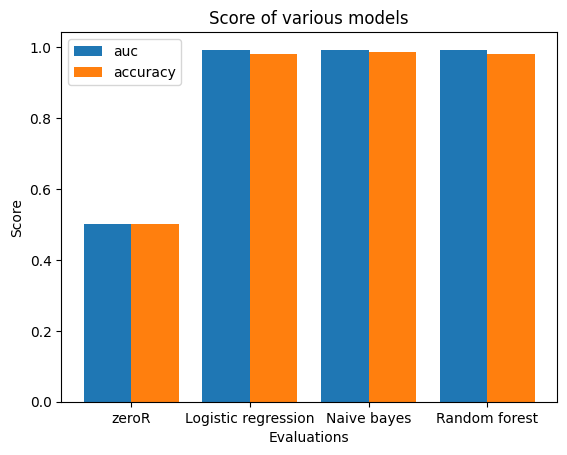

F1:  0.9806203082841343 0.9865774273904355 0.9817135224088189
auc:  [0.5, 0.9928395061728396, 0.9927314814814815, 0.992824074074074]
accuracy:  [0.5, 0.9801242236024844, 0.986335403726708, 0.9813664596273292]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

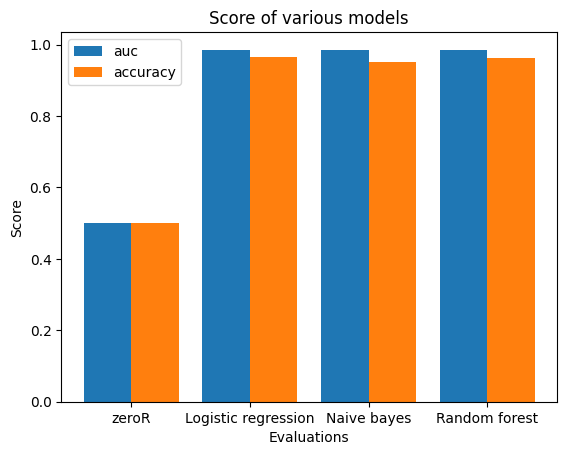

F1:  0.9673720163635943 0.9543036872469273 0.9643640615288805
auc:  [0.5, 0.9858013305056842, 0.9839894989891981, 0.9836448349967605]
accuracy:  [0.5, 0.9661993428258489, 0.951697699890471, 0.9637677984665937]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

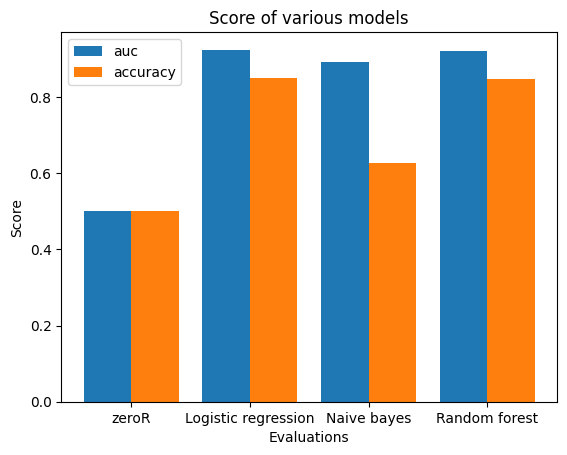

F1:  0.8548510196747641 0.728354544059242 0.8498862066427704
auc:  [0.5, 0.9245960339107411, 0.8920330793217851, 0.9223896126423581]
accuracy:  [0.5, 0.8498614333591131, 0.6269624903325599, 0.8484714703102174]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

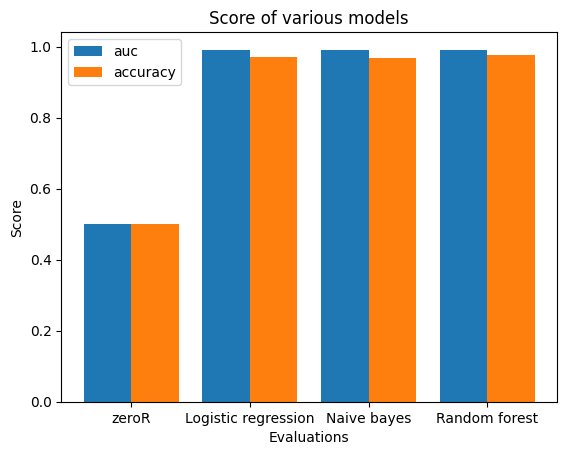

F1:  0.9710023417479396 0.9692551422462872 0.9763426195714306
auc:  [0.5, 0.9905124802134527, 0.9912085519357983, 0.9909265288347884]
accuracy:  [0.5, 0.9699516629391819, 0.9687540581487627, 0.9759685448380347]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

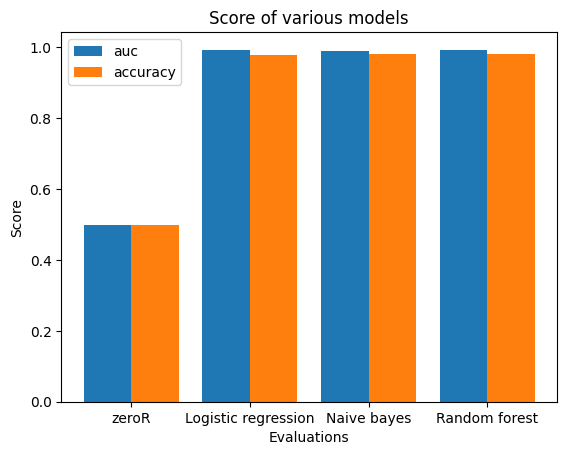

F1:  0.9785932348823556 0.9817626224043335 0.9816799777762344
auc:  [0.5, 0.9936225222637174, 0.9905774202815283, 0.9933639758690032]
accuracy:  [0.5, 0.9779661016949153, 0.9813559322033898, 0.9813559322033898]


In [156]:
clustering_modeling(niddm_na_five[(niddm_na_five["Sex_binary"] == 0)],question, 2,5)

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\2431971344.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  visualize_cross(clustering_analysis(niddm_na_one[(niddm_na_five["Sex_binary"] == 1)],question))
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-c

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (782, 52)
Test shape:  (98, 66)
Y:  0
Q:  0
[[ 1. 98.]]
Y:  0
Q:  1
[[  0.   2.]
 [  1. 198.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (320, 52)
Test shape:  (40, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 396.]
 [  1.  93.]]
Y:  1
Q:  1
[[ 0.  7.]
 [ 1. 33.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (550, 52)
Test shape:  (69, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[ 1. 69.]]
Y:  0
Q:  1
[[  0.   5.]
 [  1. 160.]]
Y:  0
Q:  2
[[  0. 180.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (264, 52)
Test shape:  (33, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  1. 344.]]
Y:  1
Q:  1
[[ 1. 33.]]
Y:  1
Q:  2
[[  1. 180.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (288, 52)
Test shape:  (36, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 344.]]
Y:  2
Q:  1
[[  0. 161.]
 [  1.   4.]]
Y:  2
Q:  2
[[ 1. 36.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (220, 52)
Test shape:  (28, 66)
Y:  0
Q:  0
[[ 0. 26.]
 [ 1.  2.]]
Y:  0
Q:  1


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 131.]]
Y:  0
Q:  2
[[  0. 180.]]
Y:  0
Q:  3
[[  0. 240.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (210, 52)
Test shape:  (26, 67)
Y:  1
Q:  0
[[ 0. 85.]
 [ 1. 53.]]
Y:  1
Q:  1


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[ 1. 26.]]
Y:  1
Q:  2
[[ 0. 89.]
 [ 1. 91.]]
Y:  1
Q:  3
[[  0.  77.]
 [  1. 163.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (288, 52)
Test shape:  (36, 67)
Y:  2
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 138.]]
Y:  2
Q:  1
[[  0. 127.]
 [  1.   4.]]
Y:  2
Q:  2
[[ 1. 36.]]
Y:  2
Q:  3
[[  0. 240.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (384, 52)
Test shape:  (48, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 138.]]
Y:  3
Q:  1
[[  0. 130.]
 [  1.   1.]]
Y:  3
Q:  2
[[  0. 180.]]
Y:  3
Q:  3
[[ 0. 48.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (228, 52)
Test shape:  (28, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 0. 11.]
 [ 1. 17.]]
Y:  0
Q:  1
[[  0. 101.]
 [  1.   1.]]
Y:  0
Q:  2
[[  0. 184.]]
Y:  0
Q:  3
[[  0. 170.]]
Y:  0
Q:  4
[[ 0. 91.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (164, 52)
Test shape:  (20, 67)
Y:  1
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 129.]
 [  1.  13.]]
Y:  1
Q:  1
[[ 1. 20.]]
Y:  1
Q:  2
[[  0. 183.]
 [  1.   1.]]
Y:  1
Q:  3
[[  0. 106.]
 [  1.  64.]]
Y:  1
Q:  4
[[ 0. 60.]
 [ 1. 31.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (294, 52)
Test shape:  (37, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 142.]]
Y:  2
Q:  1
[[  0. 102.]]
Y:  2
Q:  2
[[ 1. 37.]]
Y:  2
Q:  3
[[  0. 170.]]
Y:  2
Q:  4
[[ 0. 91.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (272, 52)
Test shape:  (34, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 142.]]
Y:  3
Q:  1
[[ 0. 94.]
 [ 1.  8.]]
Y:  3
Q:  2
[[  0. 184.]]
Y:  3
Q:  3
[[ 0.  1.]
 [ 1. 33.]]
Y:  3
Q:  4
[[ 0. 91.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (146, 52)
Test shape:  (18, 67)
Y:  4
Q:  0


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 142.]]
Y:  4
Q:  1
[[  0. 102.]]
Y:  4
Q:  2
[[  0. 184.]]
Y:  4
Q:  3
[[  0. 170.]]
Y:  4
Q:  4
[[ 1. 18.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

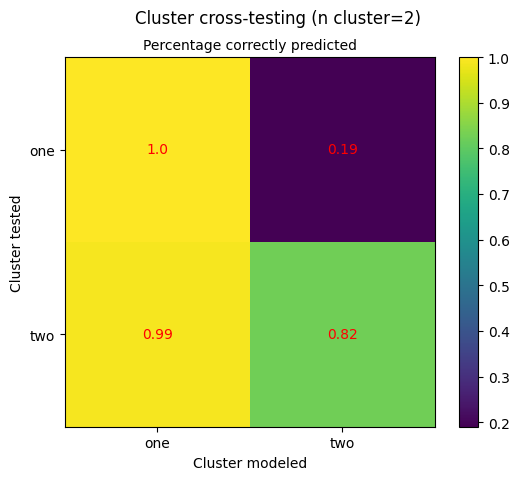

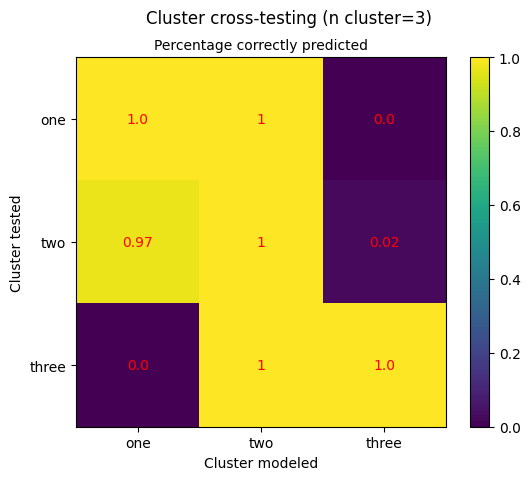

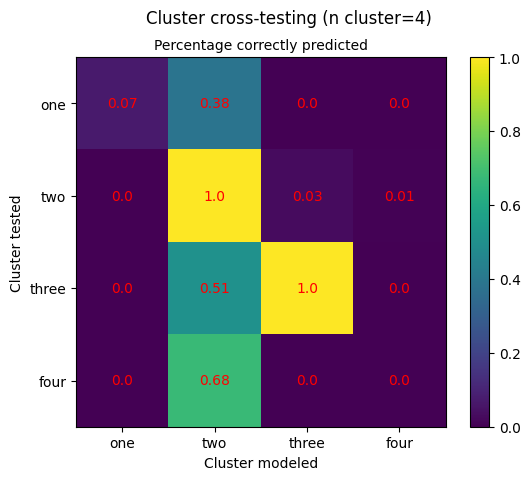

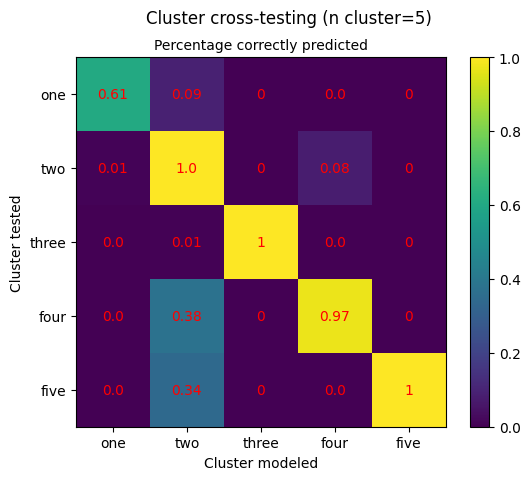

In [133]:
visualize_cross(clustering_analysis(niddm_na_one[(niddm_na_five["Sex_binary"] == 1)],question))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

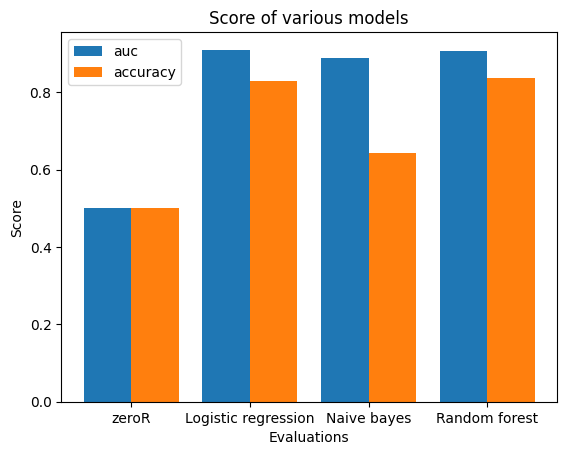

F1:  0.8386695401321027 0.7356627410631875 0.8454809088719057
auc:  [0.5, 0.9097450565289852, 0.8884639205441196, 0.9069301495428134]
accuracy:  [0.5, 0.8285234899328859, 0.6432885906040269, 0.836241610738255]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

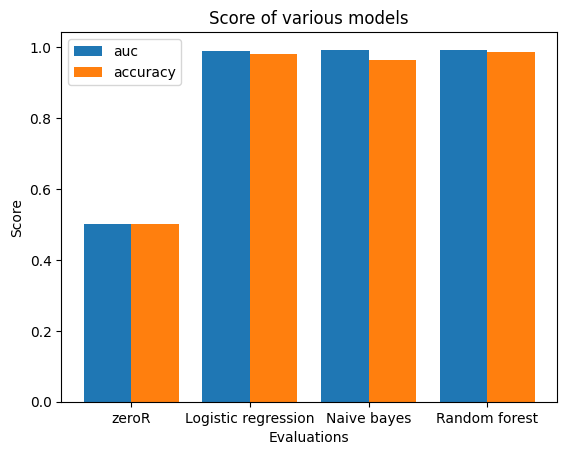

F1:  0.9799896506089206 0.9659125628403846 0.987144304906012
auc:  [0.5, 0.9897303344778365, 0.9929092241811659, 0.9913583580880367]
accuracy:  [0.5, 0.9795031055900622, 0.9645962732919255, 0.9869565217391305]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

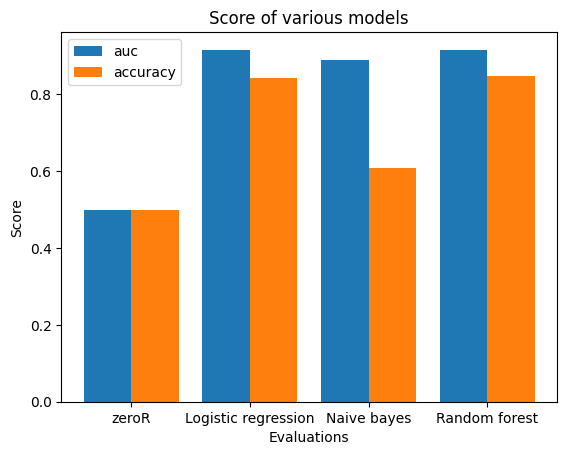

F1:  0.8529960910723127 0.718544918174602 0.8537986303963921
auc:  [0.5, 0.9158657567335324, 0.8881844394249356, 0.9142600723061478]
accuracy:  [0.5, 0.842775222584315, 0.6082906397742185, 0.8470805309666335]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

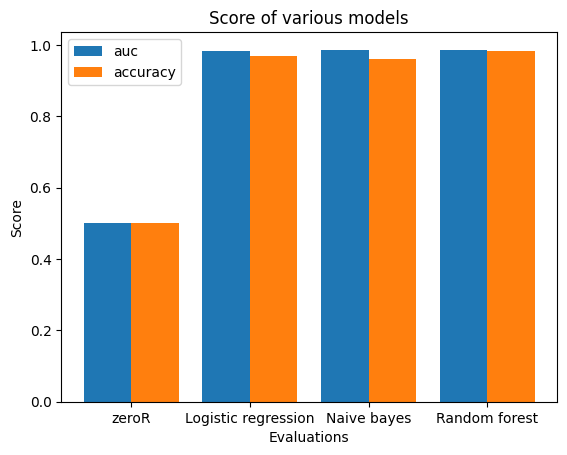

F1:  0.9705801461637635 0.9624777446271301 0.983551888320873
auc:  [0.5, 0.9842675822692025, 0.986397129740365, 0.9870606843871764]
accuracy:  [0.5, 0.9695652173913043, 0.9608695652173913, 0.9832298136645963]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

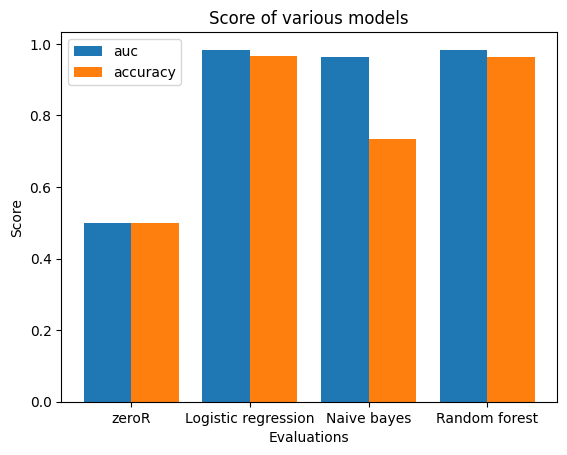

F1:  0.9680358892655905 0.7904526696797689 0.9639889131152201
auc:  [0.5, 0.9820952741327351, 0.9629406057002311, 0.9836508777382867]
accuracy:  [0.5, 0.9670069944670634, 0.7348011274663326, 0.963131850923896]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

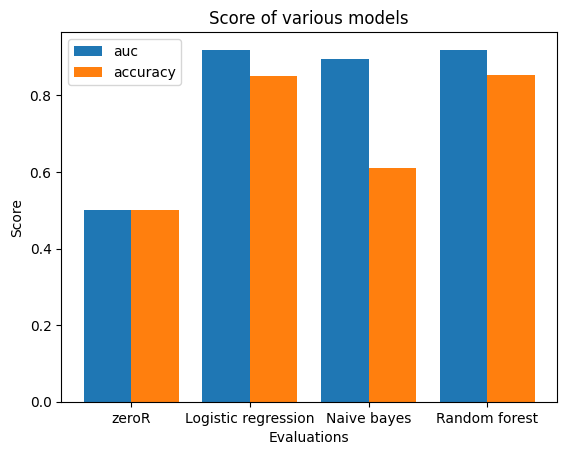

F1:  0.8589247976982278 0.7200933318707402 0.8595597844521254
auc:  [0.5, 0.9190397922062017, 0.8939380903823824, 0.9191477090865418]
accuracy:  [0.5, 0.8497957129246565, 0.6112372015623917, 0.8536487905845616]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

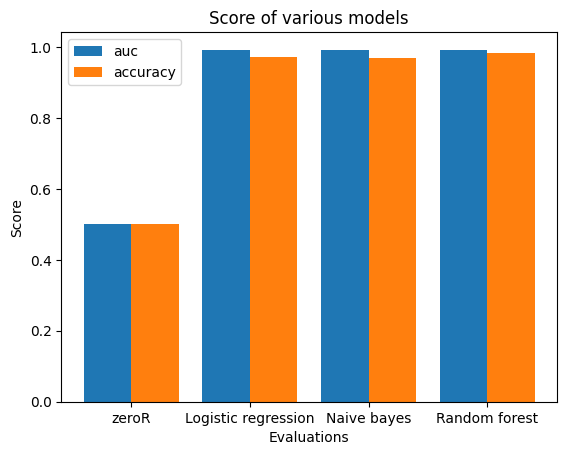

F1:  0.9720005970183715 0.9705191775937586 0.9831061012213947
auc:  [0.5, 0.9910506374152132, 0.9921103780583818, 0.9917630454366522]
accuracy:  [0.5, 0.9711241488326848, 0.9695677285992218, 0.9828337791828794]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

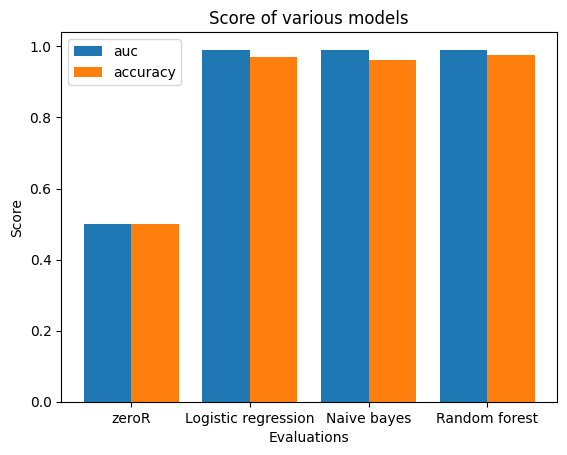

F1:  0.9708867320708716 0.9626146616429163 0.9774058011244865
auc:  [0.5, 0.9906805544678519, 0.9906022397995145, 0.9885269010885739]
accuracy:  [0.5, 0.9699115044247787, 0.9610619469026549, 0.9769911504424779]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

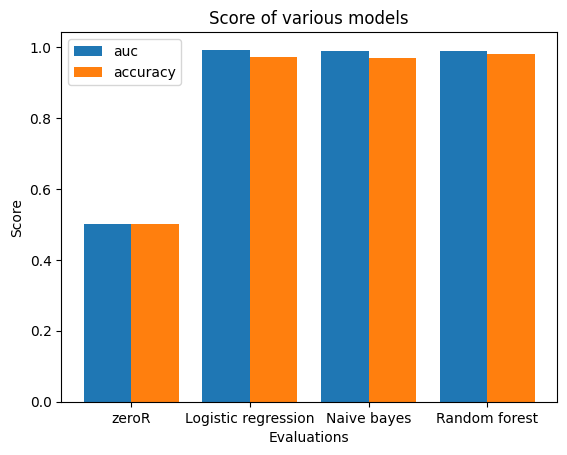

F1:  0.9725814131107117 0.9688450868017432 0.980130003255276
auc:  [0.5, 0.9921441441441441, 0.9893652300949598, 0.9899439980521062]
accuracy:  [0.5, 0.9717848721204426, 0.967748957010702, 0.9798567023399238]


In [157]:
clustering_modeling(niddm_na_five[(niddm_na_five["Sex_binary"] == 1)],question, 2,5)

### questionnaire and hba1c

MinMax
MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (6056, 53)
Test shape:  (757, 74)
Y:  0
Q:  0
[[  1. 757.]]
Y:  0
Q:  1
[[   0. 2204.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3526, 53)
Test shape:  (441, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[0.000e+00 1.561e+03]
 [1.000e+00 2.224e+03]]
Y:  1
Q:  1
[[  1. 441.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1606, 53)
Test shape:  (201, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  0.   8.]
 [  1. 193.]]
Y:  0
Q:  1
[[   0. 2949.]]
Y:  0
Q:  2
[[0.000e+00 2.005e+03]
 [1.000e+00 3.100e+01]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4718, 53)
Test shape:  (590, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[   0. 1004.]]
Y:  1
Q:  1
[[  1. 590.]]
Y:  1
Q:  2
[[   0. 2036.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3258, 53)
Test shape:  (407, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[1.000e+00 1.004e+03]]
Y:  2
Q:  1
[[1.000e+00 2.949e+03]]
Y:  2
Q:  2
[[  1. 407.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1564, 53)
Test shape:  (196, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 196.]]
Y:  0
Q:  1
[[   0. 2384.]]
Y:  0
Q:  2
[[0.000e+00 1.604e+03]
 [1.000e+00 8.000e+00]]
Y:  0
Q:  3
[[  0. 966.]
 [  1.  49.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3814, 53)
Test shape:  (477, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 978.]]
Y:  1
Q:  1
[[  1. 477.]]
Y:  1
Q:  2
[[   0. 1612.]]
Y:  1
Q:  3
[[  0. 450.]
 [  1. 565.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2580, 53)
Test shape:  (322, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 781.]
 [  1. 197.]]
Y:  2
Q:  1
[[0.00e+00 1.47e+03]
 [1.00e+00 9.14e+02]]
Y:  2
Q:  2
[[  1. 322.]]
Y:  2
Q:  3
[[  0. 420.]
 [  1. 595.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1624, 53)
Test shape:  (203, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 547.]
 [  1. 431.]]
Y:  3
Q:  1
[[0.000e+00 1.514e+03]
 [1.000e+00 8.700e+02]]
Y:  3
Q:  2
[[  0. 763.]
 [  1. 849.]]
Y:  3
Q:  3
[[  1. 203.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1552, 53)
Test shape:  (194, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 194.]]
Y:  0
Q:  1
[[   0. 1500.]]
Y:  0
Q:  2
[[  0. 948.]
 [  1.  31.]]
Y:  0
Q:  3
[[0.000e+00 1.098e+03]
 [1.000e+00 3.400e+01]]
Y:  0
Q:  4
[[   0. 1408.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2400, 53)
Test shape:  (300, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 970.]]
Y:  1
Q:  1
[[  1. 300.]]
Y:  1
Q:  2
[[  0. 979.]]
Y:  1
Q:  3
[[  0. 299.]
 [  1. 833.]]
Y:  1
Q:  4
[[   0. 1408.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1566, 53)
Test shape:  (196, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 723.]
 [  1. 247.]]
Y:  2
Q:  1
[[   0. 1500.]]
Y:  2
Q:  2
[[  1. 196.]]
Y:  2
Q:  3
[[0.00e+00 1.13e+03]
 [1.00e+00 2.00e+00]]
Y:  2
Q:  4
[[0.00e+00 1.04e+03]
 [1.00e+00 3.68e+02]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1812, 53)
Test shape:  (226, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  1. 970.]]
Y:  3
Q:  1
[[1.0e+00 1.5e+03]]
Y:  3
Q:  2
[[  1. 979.]]
Y:  3
Q:  3
[[  1. 226.]]
Y:  3
Q:  4
[[1.000e+00 1.408e+03]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2252, 53)
Test shape:  (282, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 970.]]
Y:  4
Q:  1
[[   0. 1500.]]
Y:  4
Q:  2
[[  0. 961.]
 [  1.  18.]]
Y:  4
Q:  3
[[0.000e+00 1.127e+03]
 [1.000e+00 5.000e+00]]
Y:  4
Q:  4
[[  1. 282.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

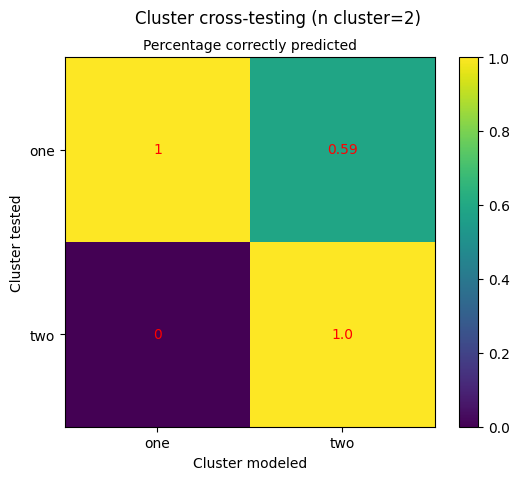

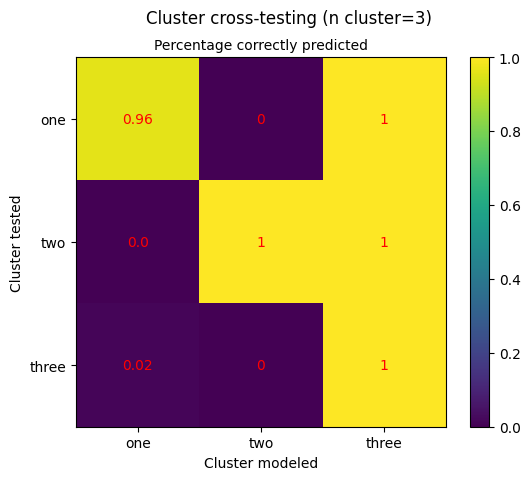

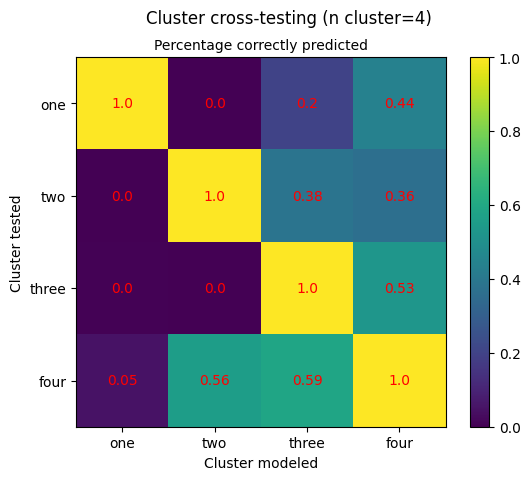

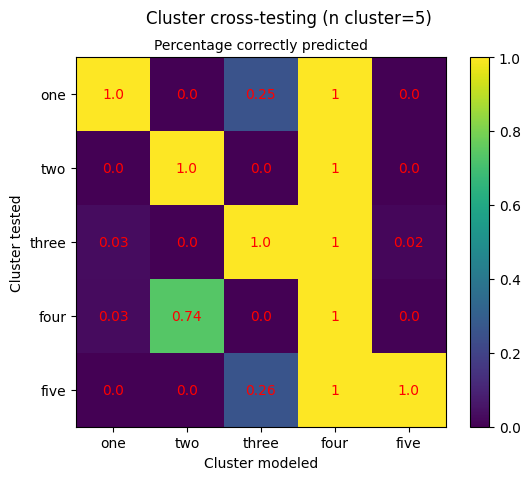

In [134]:
visualize_cross(clustering_analysis(niddm_na_five,question_hb1ac))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

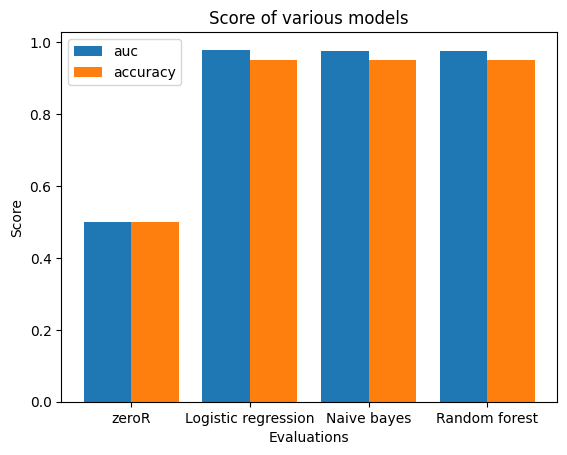

F1:  0.9539057562272139 0.9534814026022678 0.9534805133111051
auc:  [0.5, 0.9790797563198075, 0.9754005310815925, 0.9767928760647531]
accuracy:  [0.5, 0.9515890325595887, 0.9510788284779561, 0.9515877343303734]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

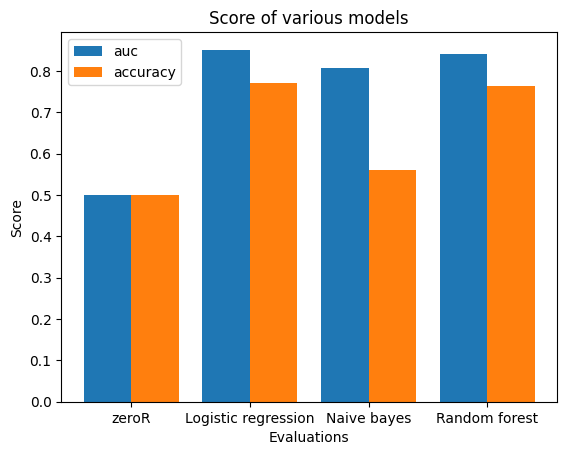

F1:  0.7746976599652877 0.6945648615818122 0.7666321762066844
auc:  [0.5, 0.8514959630112559, 0.8080140862241332, 0.8400171934352078]
accuracy:  [0.5, 0.7715647586504475, 0.5613021087131778, 0.7627785866111013]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

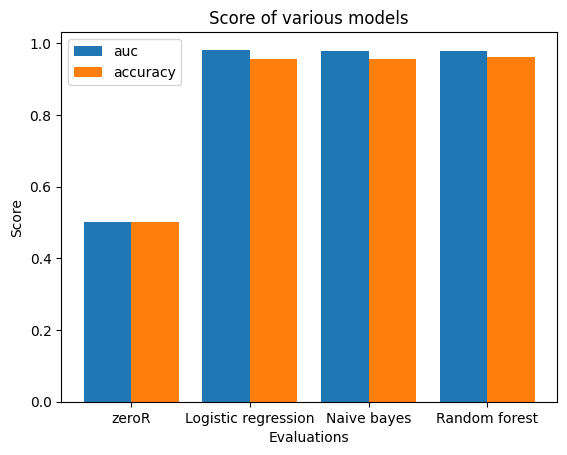

F1:  0.9575230514489114 0.9575635038013941 0.9628987027831408
auc:  [0.5, 0.9819249117859099, 0.9773890082812364, 0.9781498085611536]
accuracy:  [0.5, 0.9556563846912811, 0.9556563846912811, 0.9617723425247962]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

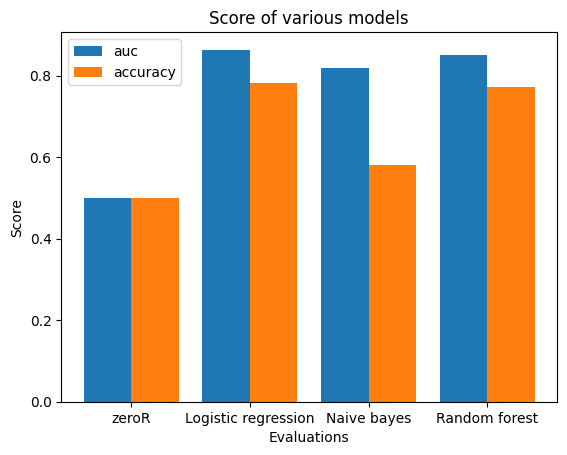

F1:  0.7867783484060632 0.7047328194412378 0.7732611469871908
auc:  [0.5, 0.8635213708428984, 0.8194864111987739, 0.8494569274111394]
accuracy:  [0.5, 0.782313061216327, 0.5809979093562079, 0.7725134184256637]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

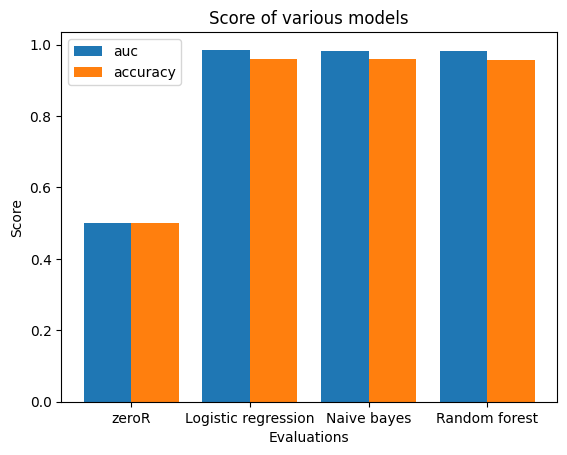

F1:  0.960632168064184 0.96214913413635 0.9577566587670567
auc:  [0.5, 0.9858751895235413, 0.9819617195990822, 0.9830922862241543]
accuracy:  [0.5, 0.9590609220276739, 0.9605980720047216, 0.9565060003934684]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                

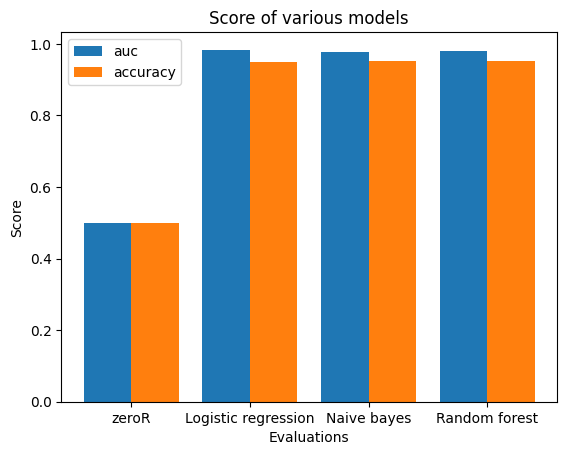

F1:  0.952308578137714 0.9533849779026599 0.9537630912302134
auc:  [0.5, 0.9837118945786126, 0.9774758613690996, 0.9795980999879492]
accuracy:  [0.5, 0.9500493327101833, 0.9510671444150179, 0.952090149036714]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

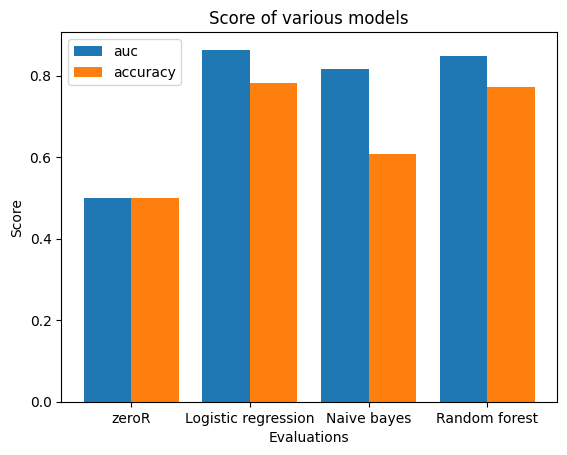

F1:  0.789556307102171 0.7179527452110811 0.776082754342711
auc:  [0.5, 0.8636443395015853, 0.8166977347018577, 0.8492655267347871]
accuracy:  [0.5, 0.7819550786788664, 0.60712224595031, 0.7731292717792014]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood

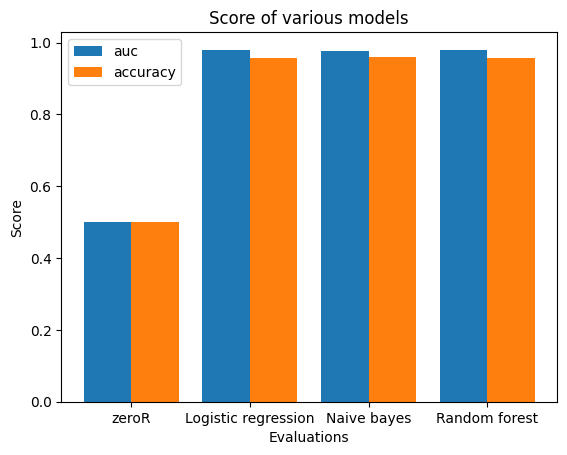

F1:  0.9593147840112614 0.9612216354922251 0.9590102568953617
auc:  [0.5, 0.9801673979256397, 0.9760682821452052, 0.9788327496679146]
accuracy:  [0.5, 0.9575185258049708, 0.9595645616105974, 0.9575198373663847]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

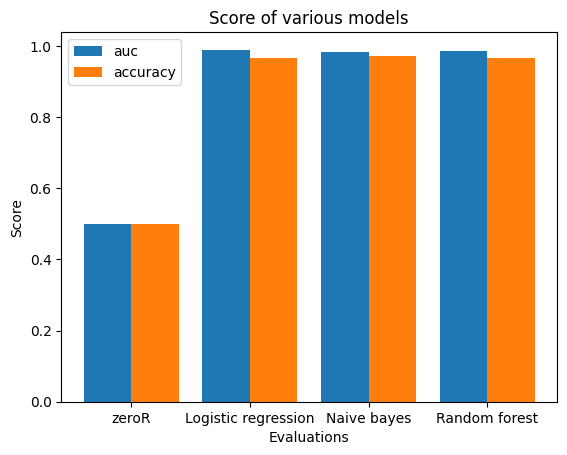

F1:  0.9689742402688869 0.9740024548180548 0.9675498973366884
auc:  [0.5, 0.9897572181433268, 0.9838025314175037, 0.9866087113193099]
accuracy:  [0.5, 0.9677852348993289, 0.9731543624161074, 0.9664429530201343]


In [158]:
clustering_modeling(niddm_na_five,question_hb1ac, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2300, 53)
Test shape:  (287, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[  1. 287.]]
Y:  0
Q:  1
[[  1. 767.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1228, 53)
Test shape:  (153, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[1.000e+00 1.437e+03]]
Y:  1
Q:  1
[[  1. 153.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (986, 53)
Test shape:  (123, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  1. 123.]]
Y:  0
Q:  1
[[  0. 171.]
 [  1. 976.]]
Y:  0
Q:  2
[[  0. 181.]
 [  1. 260.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1836, 53)
Test shape:  (229, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0.  33.]
 [  1. 583.]]
Y:  1
Q:  1
[[  1. 229.]]
Y:  1
Q:  2
[[  0. 441.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (706, 53)
Test shape:  (88, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 583.]
 [  1.  33.]]
Y:  2
Q:  1
[[   0. 1147.]]
Y:  2
Q:  2
[[ 1. 88.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (502, 53)
Test shape:  (63, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 63.]]
Y:  0
Q:  1
[[  0. 384.]
 [  1. 182.]]
Y:  0
Q:  2
[[  0. 354.]
 [  1. 115.]]
Y:  0
Q:  3
[[  0. 388.]
 [  1. 467.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (906, 53)
Test shape:  (113, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 311.]
 [  1.   3.]]
Y:  1
Q:  1
[[  1. 113.]]
Y:  1
Q:  2
[[  0. 335.]
 [  1. 134.]]
Y:  1
Q:  3
[[  0. 855.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (750, 53)
Test shape:  (94, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 313.]
 [  1.   1.]]
Y:  2
Q:  1
[[  0. 562.]
 [  1.   4.]]
Y:  2
Q:  2
[[ 1. 94.]]
Y:  2
Q:  3
[[  0. 855.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1368, 53)
Test shape:  (171, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0.   1.]
 [  1. 313.]]
Y:  3
Q:  1
[[  0. 566.]]
Y:  3
Q:  2
[[  0. 214.]
 [  1. 255.]]
Y:  3
Q:  3
[[  1. 171.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (506, 53)
Test shape:  (63, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 63.]]
Y:  0
Q:  1
[[  0. 326.]]
Y:  0
Q:  2
[[  0. 372.]
 [  1.  72.]]
Y:  0
Q:  3
[[  0. 365.]
 [  1.  52.]]
Y:  0
Q:  4
[[  0. 701.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (522, 53)
Test shape:  (65, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 157.]
 [  1. 159.]]
Y:  1
Q:  1
[[ 1. 65.]]
Y:  1
Q:  2
[[  0. 333.]
 [  1. 111.]]
Y:  1
Q:  3
[[  0. 312.]
 [  1. 105.]]
Y:  1
Q:  4
[[  0. 559.]
 [  1. 142.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (710, 53)
Test shape:  (89, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 291.]
 [  1.  25.]]
Y:  2
Q:  1
[[  0. 321.]
 [  1.   5.]]
Y:  2
Q:  2
[[ 1. 89.]]
Y:  2
Q:  3
[[  0. 417.]]
Y:  2
Q:  4
[[  0. 701.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (668, 53)
Test shape:  (83, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 286.]
 [  1.  30.]]
Y:  3
Q:  1
[[  0. 326.]]
Y:  3
Q:  2
[[  0. 444.]]
Y:  3
Q:  3
[[ 1. 83.]]
Y:  3
Q:  4
[[  0. 701.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1122, 53)
Test shape:  (140, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 238.]
 [  1.  78.]]
Y:  4
Q:  1
[[  0. 325.]
 [  1.   1.]]
Y:  4
Q:  2
[[  0. 444.]]
Y:  4
Q:  3
[[  0. 147.]
 [  1. 270.]]
Y:  4
Q:  4
[[  1. 140.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

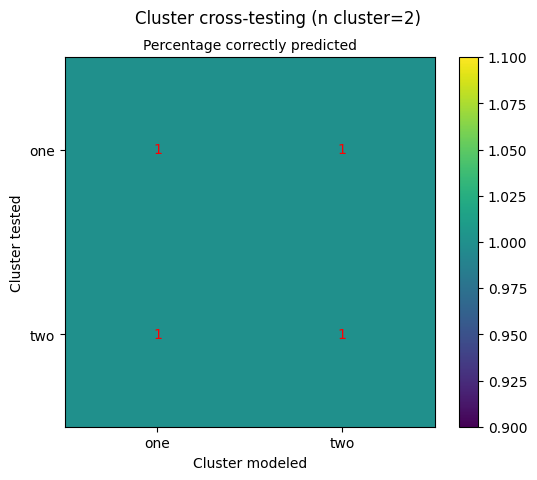

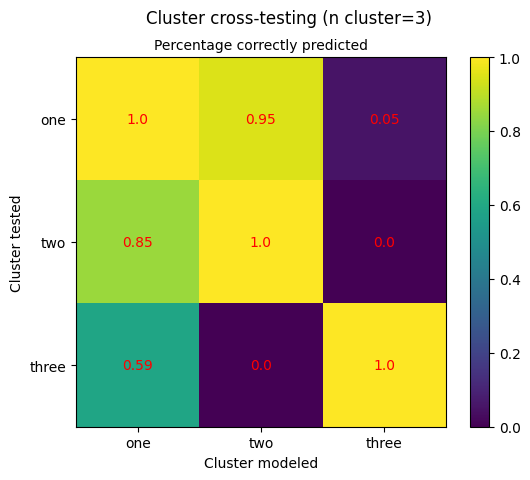

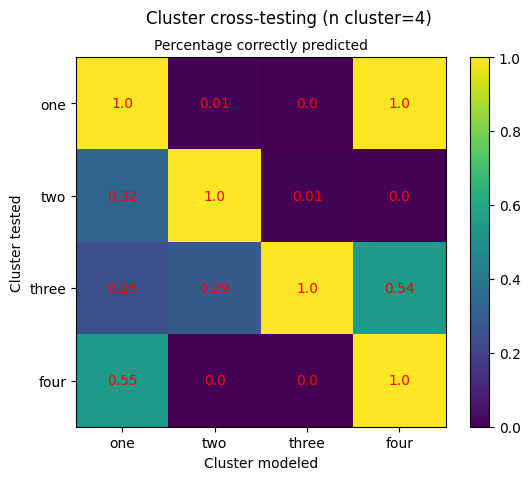

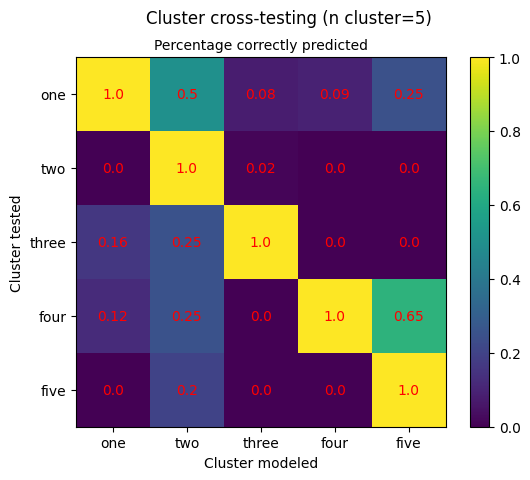

In [135]:
visualize_cross(clustering_analysis(niddm_na_five[(niddm_na_five["Sex_binary"] == 0)],question_hb1ac))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

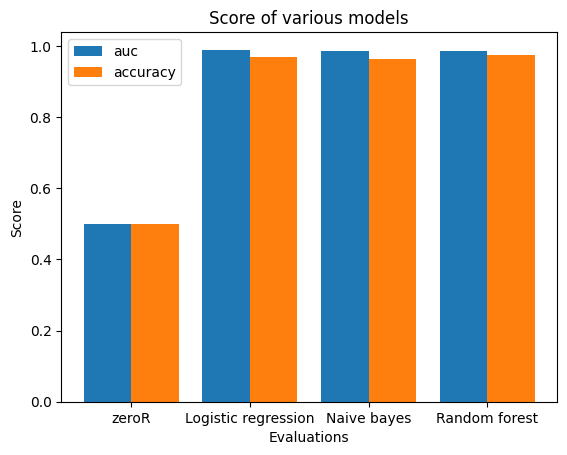

F1:  0.9707218525382731 0.9657846366849192 0.9758109801595107
auc:  [0.5, 0.9898956916099774, 0.9868027210884354, 0.9861768707482993]
accuracy:  [0.5, 0.9695238095238096, 0.9647619047619047, 0.9752380952380952]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

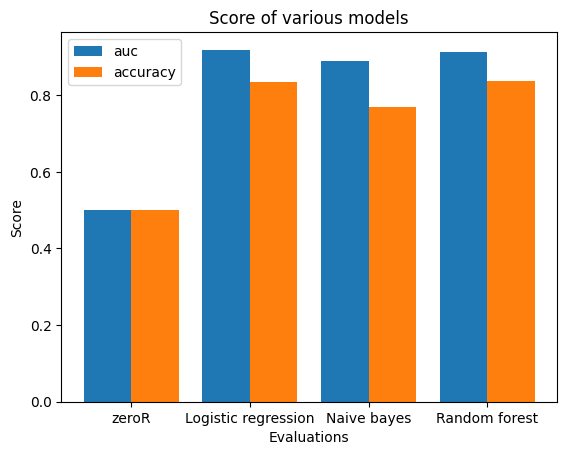

F1:  0.8395180188437396 0.8076022326775887 0.8416572365134559
auc:  [0.5, 0.918705367719227, 0.8901557396901546, 0.913229962538498]
accuracy:  [0.5, 0.835011266056348, 0.7703986587183309, 0.8376987083954297]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                

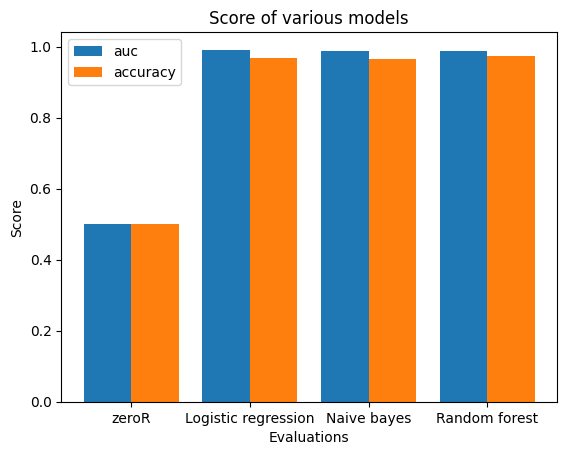

F1:  0.969624605264544 0.9655267471316168 0.9738805838925501
auc:  [0.5, 0.9910204081632653, 0.9885079365079366, 0.9869931972789115]
accuracy:  [0.5, 0.9685714285714285, 0.9647619047619048, 0.9733333333333333]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

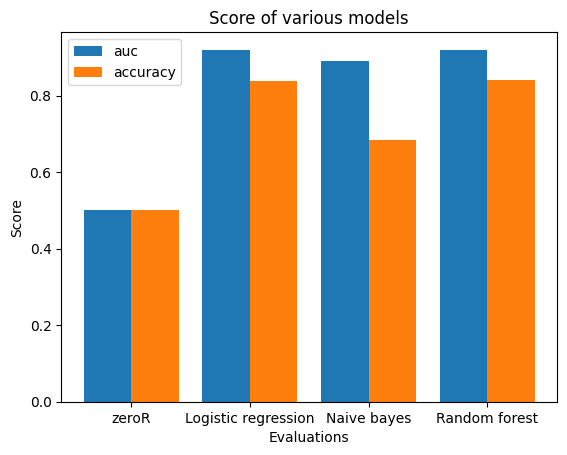

F1:  0.8460294243610756 0.7591332352541339 0.846179258693473
auc:  [0.5, 0.9177494232987313, 0.8901824598712035, 0.9197149413687044]
accuracy:  [0.5, 0.8390798511185296, 0.6840313111545988, 0.841815739994628]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

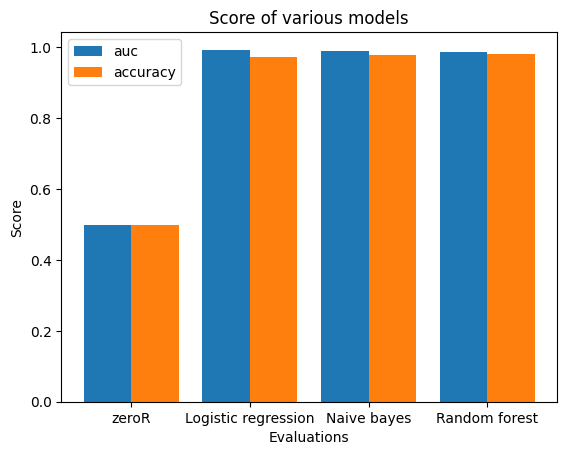

F1:  0.9734051090931919 0.9781217900044125 0.9815937987712358
auc:  [0.5, 0.9935960648148148, 0.9912384259259259, 0.9881894290123456]
accuracy:  [0.5, 0.9726319875776398, 0.9776164596273291, 0.9813509316770186]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

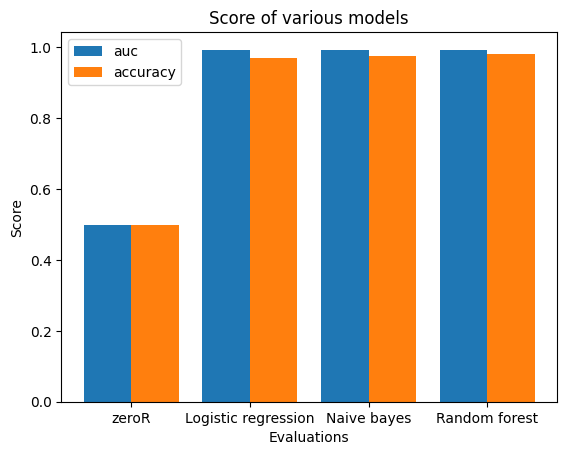

F1:  0.9708482495250773 0.9776109405664062 0.9811855878284338
auc:  [0.5, 0.9914253546657981, 0.9916723019022903, 0.9933717237448176]
accuracy:  [0.5, 0.9698284045271997, 0.9770573201898503, 0.9806863818912012]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

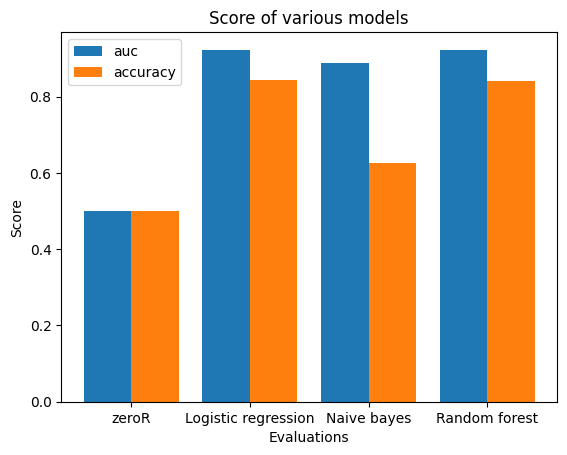

F1:  0.851323829913558 0.7279607626265195 0.8444397515189941
auc:  [0.5, 0.9221389008517561, 0.8880606896194213, 0.9231805675184228]
accuracy:  [0.5, 0.844764544126493, 0.6265188622497208, 0.8419781730686603]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

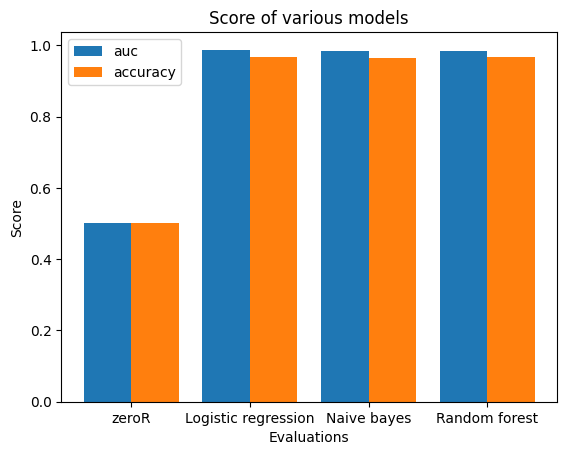

F1:  0.9687518853882507 0.9648072883556854 0.968184037452468
auc:  [0.5, 0.9873162184020073, 0.9826471116825305, 0.983622441573523]
accuracy:  [0.5, 0.9675348098982758, 0.9639347810403289, 0.967542024384965]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

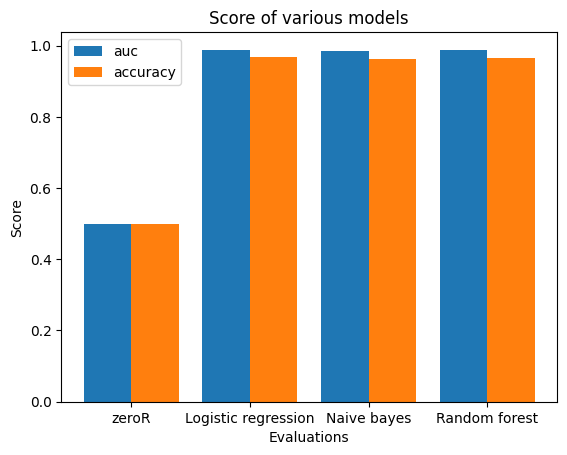

F1:  0.9688378092289255 0.9641190675600372 0.9666177926960728
auc:  [0.5, 0.9883941396150531, 0.9844584889399598, 0.9872737719046251]
accuracy:  [0.5, 0.9677966101694915, 0.9627118644067797, 0.9661016949152542]


In [159]:
clustering_modeling(niddm_na_five[(niddm_na_five["Sex_binary"] == 0)],question_hb1ac, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

MinMax
modeling...
Trainings shape:  (1568, 53)
Test shape:  (196, 74)
Y:  0
Q:  0
[[  1. 196.]]
Y:  0
Q:  1
[[0.000e+00 2.789e+03]
 [1.000e+00 1.600e+01]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4488, 53)
Test shape:  (561, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 978.]
 [  1.   2.]]
Y:  1
Q:  1
[[  1. 561.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1268, 53)
Test shape:  (159, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  1. 159.]]
Y:  0
Q:  1
[[0.000e+00 1.100e+02]
 [1.000e+00 1.985e+03]]
Y:  0
Q:  2
[[  0. 499.]
 [  1. 398.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3352, 53)
Test shape:  (419, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0.  60.]
 [  1. 733.]]
Y:  1
Q:  1
[[  1. 419.]]
Y:  1
Q:  2
[[  0. 838.]
 [  1.  59.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1436, 53)
Test shape:  (179, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 733.]
 [  1.  60.]]
Y:  2
Q:  1
[[   0. 2095.]]
Y:  2
Q:  2
[[  1. 179.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (900, 53)
Test shape:  (113, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 113.]]
Y:  0
Q:  1
[[0.000e+00 1.733e+03]
 [1.000e+00 1.000e+00]]
Y:  0
Q:  2
[[  0. 382.]
 [  1. 247.]]
Y:  0
Q:  3
[[  0. 690.]
 [  1. 169.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2774, 53)
Test shape:  (347, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 562.]
 [  1.   1.]]
Y:  1
Q:  1
[[  1. 347.]]
Y:  1
Q:  2
[[  0. 356.]
 [  1. 273.]]
Y:  1
Q:  3
[[  0. 859.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1006, 53)
Test shape:  (126, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 563.]]
Y:  2
Q:  1
[[   0. 1734.]]
Y:  2
Q:  2
[[  1. 126.]]
Y:  2
Q:  3
[[  0. 755.]
 [  1. 104.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1374, 53)
Test shape:  (172, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 538.]
 [  1.  25.]]
Y:  3
Q:  1
[[   0. 1734.]]
Y:  3
Q:  2
[[  0. 556.]
 [  1.  73.]]
Y:  3
Q:  3
[[  1. 172.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (748, 53)
Test shape:  (94, 74)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 94.]]
Y:  0
Q:  1
[[   0. 1418.]]
Y:  0
Q:  2
[[  0. 524.]
 [  1.  98.]]
Y:  0
Q:  3
[[  0. 599.]
 [  1. 165.]]
Y:  0
Q:  4
[[  0. 452.]
 [  1.  61.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2268, 53)
Test shape:  (284, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0.   8.]
 [  1. 460.]]
Y:  1
Q:  1
[[  1. 284.]]
Y:  1
Q:  2
[[  0. 318.]
 [  1. 304.]]
Y:  1
Q:  3
[[  0. 764.]]
Y:  1
Q:  4
[[  0.  76.]
 [  1. 437.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (996, 53)
Test shape:  (124, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 468.]]
Y:  2
Q:  1
[[   0. 1418.]]
Y:  2
Q:  2
[[  1. 124.]]
Y:  2
Q:  3
[[  0. 735.]
 [  1.  29.]]
Y:  2
Q:  4
[[  0. 431.]
 [  1.  82.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1222, 53)
Test shape:  (153, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 468.]]
Y:  3
Q:  1
[[   0. 1418.]]
Y:  3
Q:  2
[[  0. 487.]
 [  1. 135.]]
Y:  3
Q:  3
[[  1. 153.]]
Y:  3
Q:  4
[[  0. 455.]
 [  1.  58.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (820, 53)
Test shape:  (103, 75)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 295.]
 [  1. 173.]]
Y:  4
Q:  1
[[  0. 949.]
 [  1. 469.]]
Y:  4
Q:  2
[[  0. 421.]
 [  1. 201.]]
Y:  4
Q:  3
[[  0. 538.]
 [  1. 226.]]
Y:  4
Q:  4
[[  1. 103.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

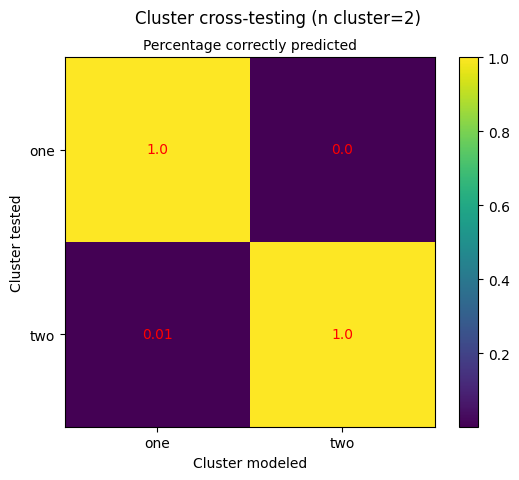

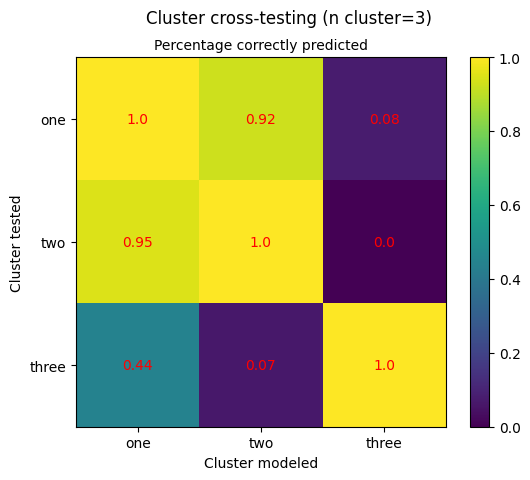

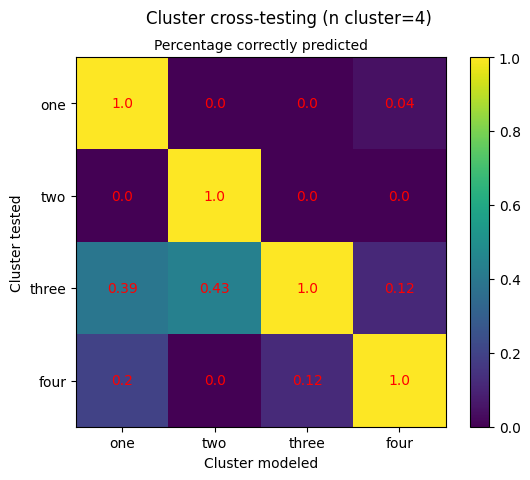

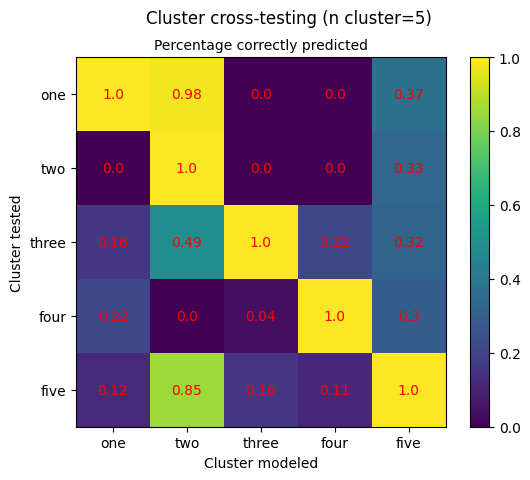

In [136]:
visualize_cross(clustering_analysis(niddm_na_five[(niddm_na_five["Sex_binary"] == 1)],question_hb1ac))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

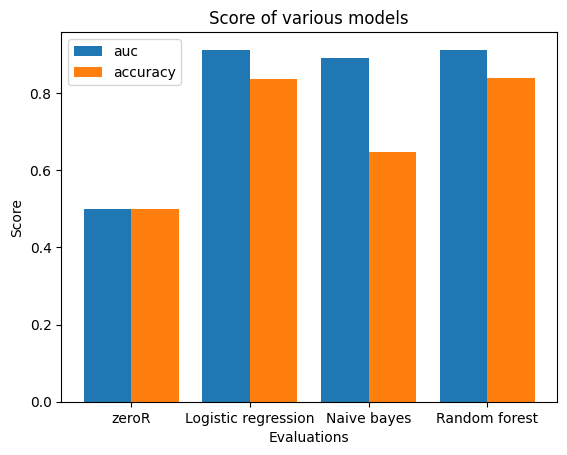

F1:  0.8463794023574204 0.7386985180008151 0.8485748955386987
auc:  [0.5, 0.9128361335074997, 0.8919615107427593, 0.9115017341561191]
accuracy:  [0.5, 0.8374161073825503, 0.6486577181208054, 0.8406040268456376]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

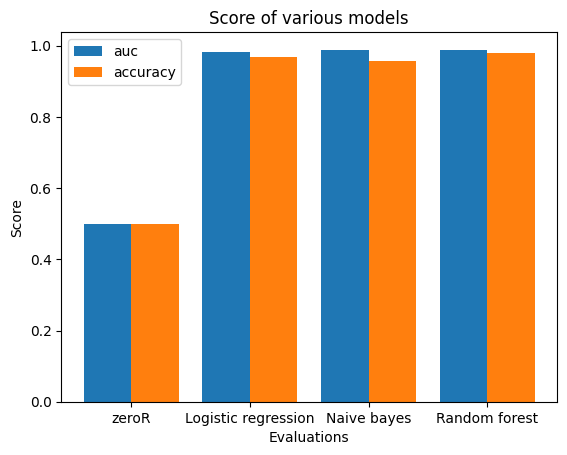

F1:  0.9693712530923762 0.9594687310477827 0.9793306991831747
auc:  [0.5, 0.9831950927819143, 0.9875390609930172, 0.9889240384244435]
accuracy:  [0.5, 0.9683229813664597, 0.9577639751552794, 0.9788819875776398]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

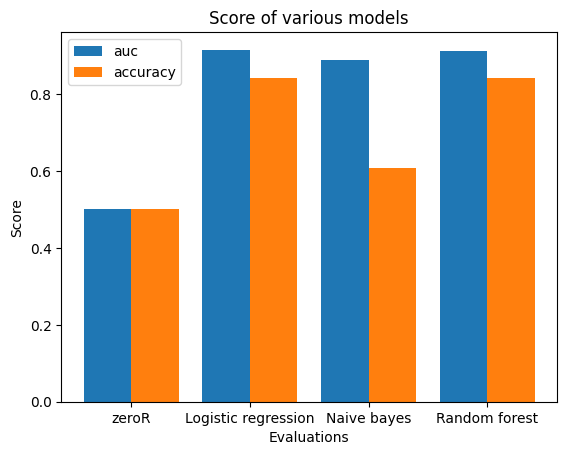

F1:  0.8532428803582661 0.7189050413897702 0.8492043505430544
auc:  [0.5, 0.9152173410791143, 0.8884131523415809, 0.911309488037322]
accuracy:  [0.5, 0.8427708569271423, 0.6089732231133299, 0.8416409221295162]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

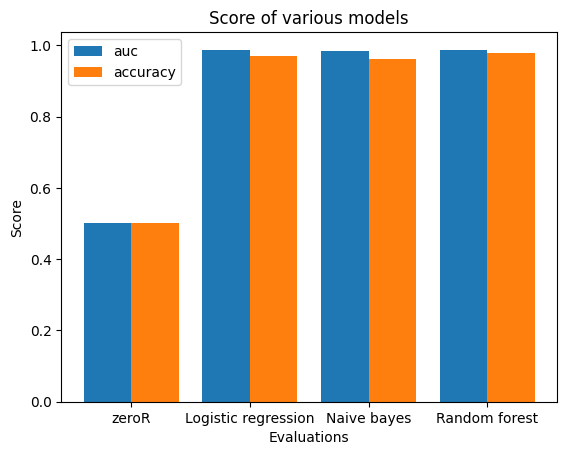

F1:  0.9710657207042749 0.9618003690896367 0.979278697434437
auc:  [0.5, 0.9875004822344817, 0.9852474827360056, 0.9859110373828169]
accuracy:  [0.5, 0.9701863354037267, 0.9602484472049689, 0.9788819875776398]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

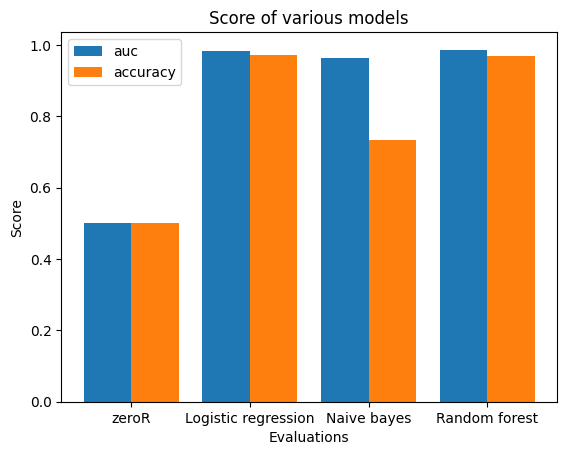

F1:  0.9711236141506148 0.7900082633058014 0.9702774930442413
auc:  [0.5, 0.9839148614133005, 0.961998189115775, 0.9862760652458884]
accuracy:  [0.5, 0.9702474162229878, 0.7341538782753941, 0.9696001670320493]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

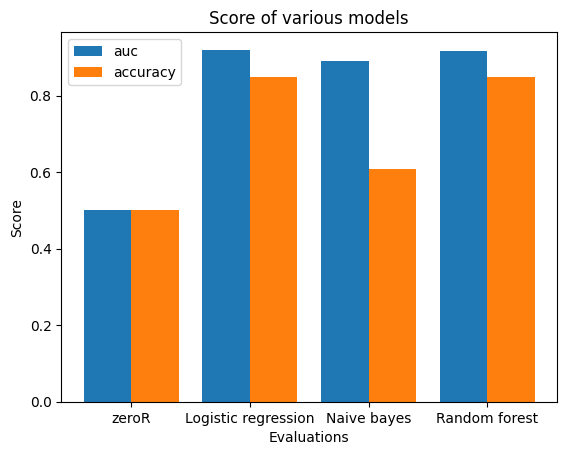

F1:  0.8562180989827708 0.7184673540246432 0.8540734623483703
auc:  [0.5, 0.9198198658497063, 0.8900970807533433, 0.915376823442907]
accuracy:  [0.5, 0.8473065179261587, 0.6080659368315088, 0.847763371109108]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

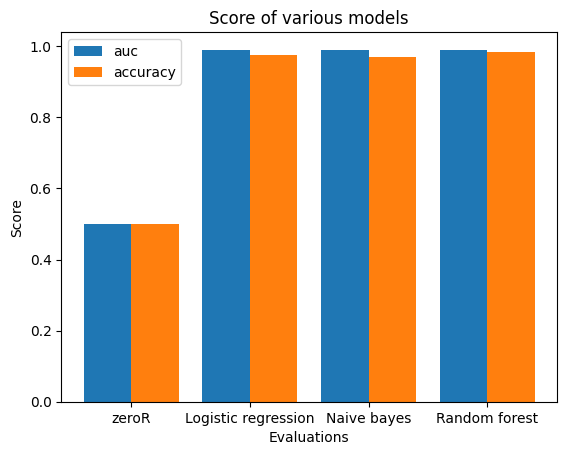

F1:  0.975759998253116 0.9714163755030311 0.9846316005695247
auc:  [0.5, 0.9892507153888082, 0.9904215967932413, 0.9890329760174419]
accuracy:  [0.5, 0.9750364785992218, 0.9703611381322957, 0.9843993190661479]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

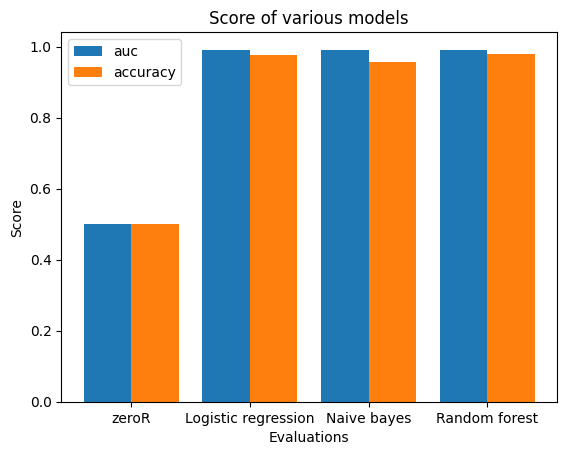

F1:  0.9783770764195399 0.9584559639268929 0.97905282803405
auc:  [0.5, 0.9906179027331818, 0.9916046675542329, 0.9914871955517269]
accuracy:  [0.5, 0.9778761061946902, 0.9566371681415929, 0.9787610619469026]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

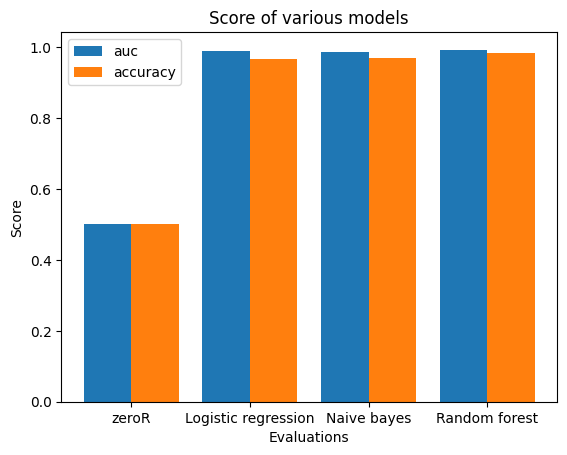

F1:  0.9678735988813387 0.9704026487788098 0.9841049214387741
auc:  [0.5, 0.9892252252252253, 0.9870630630630631, 0.9925585585585586]
accuracy:  [0.5, 0.9664248140758208, 0.96910937783421, 0.9838926174496645]


In [160]:
clustering_modeling(niddm_na_five[(niddm_na_five["Sex_binary"] == 1)],question_hb1ac, 2,5)

### Five to ten year

#### questionnaire only

MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4576, 52)
Test shape:  (572, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()


Y:  0
Q:  0
[[  0. 152.]
 [  1. 420.]]
Y:  0
Q:  1
[[   0. 4386.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (7018, 52)
Test shape:  (877, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[   0. 2860.]]
Y:  1
Q:  1
[[  1. 877.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4568, 52)
Test shape:  (571, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  0.  60.]
 [  1. 511.]]
Y:  0
Q:  1
[[0.00e+00 1.11e+03]
 [1.00e+00 1.00e+00]]
Y:  0
Q:  2
[[0.000e+00 3.223e+03]
 [1.000e+00 5.700e+01]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1778, 52)
Test shape:  (222, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[   0. 2855.]]
Y:  1
Q:  1
[[  1. 222.]]
Y:  1
Q:  2
[[   0. 3280.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (5248, 52)
Test shape:  (656, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[   0. 2855.]]
Y:  2
Q:  1
[[   0. 1111.]]
Y:  2
Q:  2
[[  1. 656.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1902, 52)
Test shape:  (238, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  0.   2.]
 [  1. 236.]]
Y:  0
Q:  1
[[  0. 814.]
 [  1. 269.]]
Y:  0
Q:  2
[[0.000e+00 1.698e+03]
 [1.000e+00 3.840e+02]]
Y:  0
Q:  3
[[0.00e+00 2.25e+03]
 [1.00e+00 6.42e+02]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1732, 52)
Test shape:  (217, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[0.000e+00 1.164e+03]
 [1.000e+00 2.500e+01]]
Y:  1
Q:  1
[[  1. 217.]]
Y:  1
Q:  2
[[   0. 2082.]]
Y:  1
Q:  3
[[   0. 2892.]]
Cluster  1  of  4
Healthy sampling...


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

MinMax
modeling...
Trainings shape:  (3332, 52)
Test shape:  (416, 67)
Y:  2
Q:  0
[[  0. 534.]
 [  1. 655.]]
Y:  2
Q:  1
[[0.000e+00 1.081e+03]
 [1.000e+00 2.000e+00]]
Y:  2
Q:  2
[[  0.   1.]
 [  1. 415.]]
Y:  2
Q:  3
[[0.000e+00 2.887e+03]
 [1.000e+00 5.000e+00]]
Cluster  2  of  4
Healthy sampling...
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

modeling...
Trainings shape:  (4628, 52)
Test shape:  (578, 67)
Y:  3
Q:  0
[[  0. 810.]
 [  1. 379.]]
Y:  3
Q:  1
[[   0. 1083.]]
Y:  3
Q:  2
[[   0. 2082.]]
Y:  3
Q:  3
[[  0.   9.]
 [  1. 569.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1560, 52)
Test shape:  (195, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  0.   1.]
 [  1. 194.]]
Y:  0
Q:  1
[[  0. 852.]
 [  1. 218.]]
Y:  0
Q:  2
[[0.000e+00 1.282e+03]
 [1.000e+00 5.380e+02]]
Y:  0
Q:  3
[[0.000e+00 2.268e+03]
 [1.000e+00 5.010e+02]]
Y:  0
Q:  4


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

[[  0. 446.]
 [  1. 166.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1712, 52)
Test shape:  (214, 67)
Y:  1
Q:  0
[[  0. 939.]
 [  1.  36.]]
Y:  1
Q:  1
[[  1. 214.]]
Y:  1
Q:  2
[[   0. 1820.]]
Y:  1
Q:  3
[[   0. 2769.]]
Y:  1
Q:  4
[[  0. 612.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2912, 52)
Test shape:  (364, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 318.]
 [  1. 657.]]
Y:  2
Q:  1
[[   0. 1070.]]
Y:  2
Q:  2
[[  1. 364.]]
Y:  2
Q:  3
[[0.000e+00 1.845e+03]
 [1.000e+00 9.240e+02]]
Y:  2
Q:  4
[[  0. 612.]]
Cluster  2  of  5
Healthy sampling...
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

modeling...
Trainings shape:  (4430, 52)
Test shape:  (554, 67)
Y:  3
Q:  0
[[  0. 598.]
 [  1. 377.]]
Y:  3
Q:  1
[[   0. 1070.]]
Y:  3
Q:  2
[[   0. 1820.]]
Y:  3
Q:  3
[[  0. 119.]
 [  1. 435.]]
Y:  3
Q:  4
[[  0. 612.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (980, 52)
Test shape:  (122, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 957.]
 [  1.  18.]]
Y:  4
Q:  1
[[  0. 895.]
 [  1. 175.]]
Y:  4
Q:  2
[[   0. 1820.]]
Y:  4
Q:  3
[[   0. 2769.]]
Y:  4
Q:  4
[[  1. 122.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

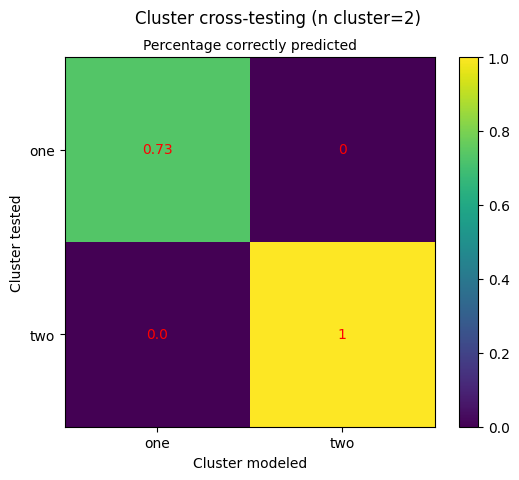

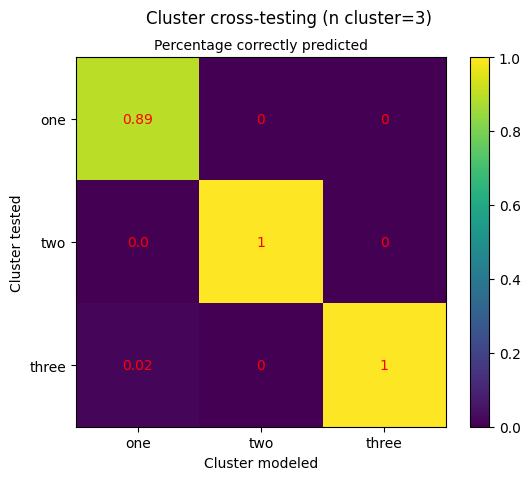

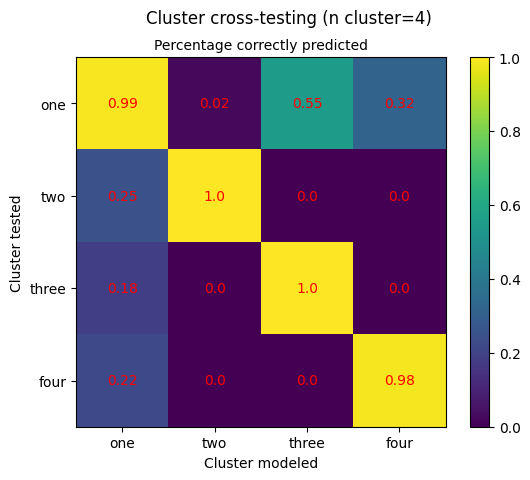

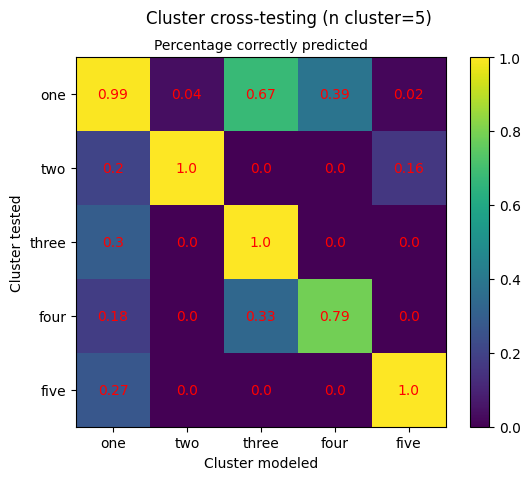

In [137]:
visualize_cross(clustering_analysis(niddm_na_fiveten,question))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

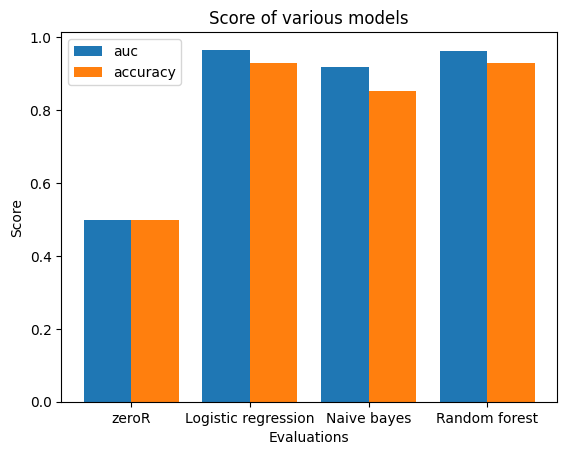

F1:  0.9340757652536021 0.8603079992665347 0.93291635952572
auc:  [0.5, 0.9660361512774661, 0.918136266755093, 0.9617060518725168]
accuracy:  [0.5, 0.9301052491156406, 0.8537782500494505, 0.9296774445809125]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

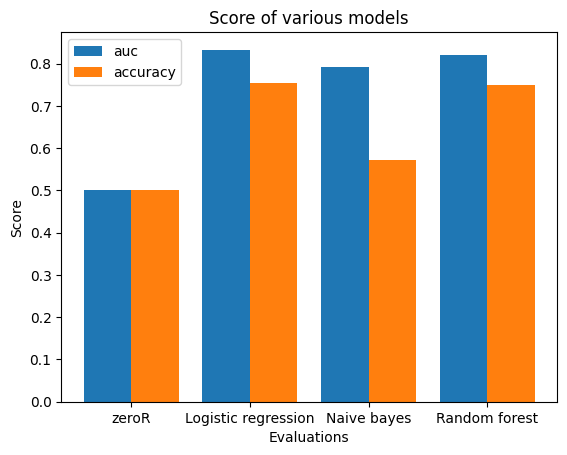

F1:  0.7593661481177112 0.7006493803035932 0.7534960672209536
auc:  [0.5, 0.8332007972491833, 0.7932334000071102, 0.8206222959794369]
accuracy:  [0.5, 0.7536633714624442, 0.5727510684175513, 0.7497970847926195]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

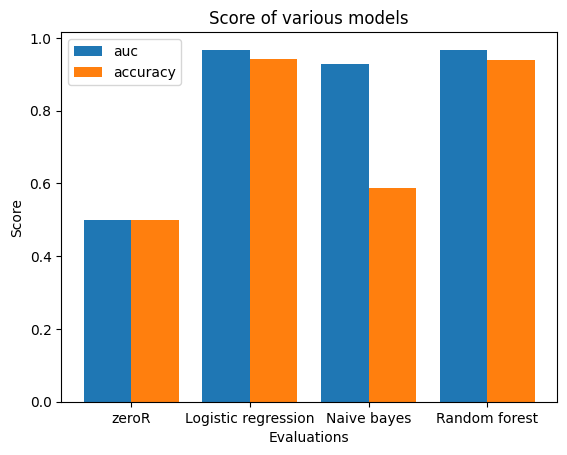

F1:  0.9442270384527818 0.7085275961519506 0.9406076858093226
auc:  [0.5, 0.9672210963224542, 0.9270527735980617, 0.9672730980339178]
accuracy:  [0.5, 0.9412104281021858, 0.5884660853876346, 0.9379730167217754]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

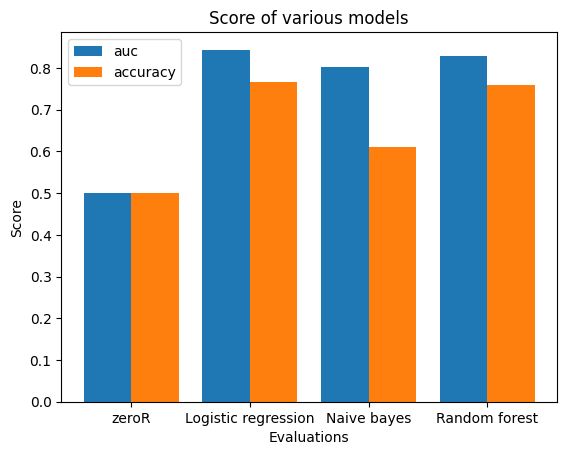

F1:  0.773737992135902 0.7200224870733113 0.7635928169199842
auc:  [0.5, 0.8437101975118566, 0.8032108461948417, 0.8290876448770194]
accuracy:  [0.5, 0.7661252900232018, 0.6111368909512761, 0.7589327146171694]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

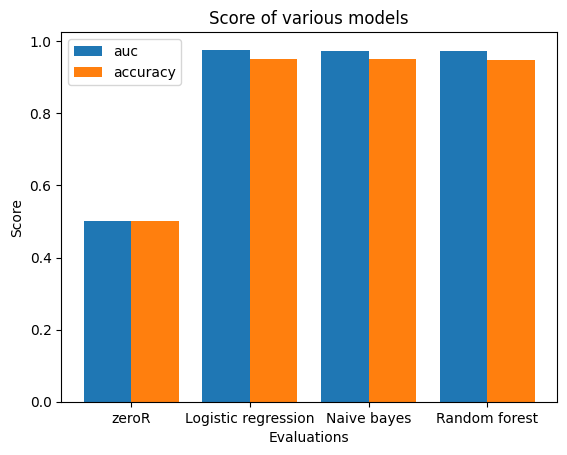

F1:  0.9537703267954415 0.9537703267954415 0.9492499862268504
auc:  [0.5, 0.9764976958525345, 0.9735556408943505, 0.972493153142048]
accuracy:  [0.5, 0.9514840475579506, 0.9514840475579506, 0.947321657685399]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

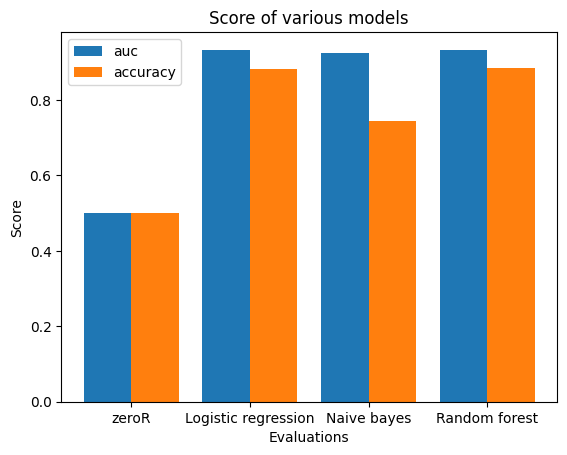

F1:  0.8855433306691725 0.797215870786903 0.8917856450847182
auc:  [0.5, 0.933292243767313, 0.9239993074792244, 0.9318981994459834]
accuracy:  [0.5, 0.8810526315789474, 0.7455263157894737, 0.8847368421052632]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

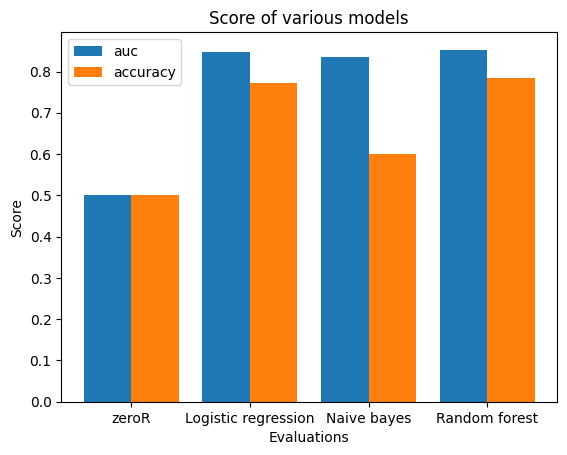

F1:  0.787983187064601 0.7142590600925586 0.7911248207400181
auc:  [0.5, 0.8463112163423433, 0.8347931829264001, 0.8527659572774602]
accuracy:  [0.5, 0.772724649736165, 0.5999343661459281, 0.7835262925320371]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

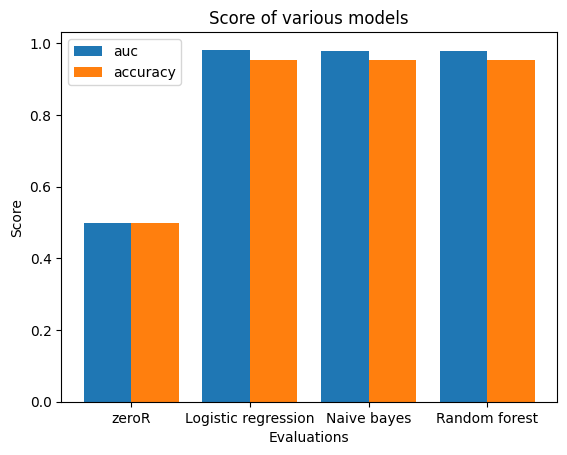

F1:  0.9566707580860668 0.956798217425455 0.9553464463659268
auc:  [0.5, 0.9824501953310197, 0.9796550732333289, 0.979077297984108]
accuracy:  [0.5, 0.9547130271148747, 0.9547130271148747, 0.9537881703874775]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

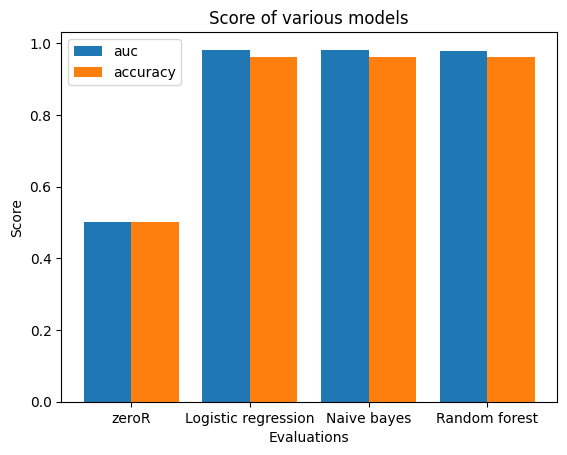

F1:  0.9627405817552646 0.9635395302359738 0.9620300513026169
auc:  [0.5, 0.9819553030573658, 0.9798818785627166, 0.9788170584910667]
accuracy:  [0.5, 0.9612727104189841, 0.9621338524286244, 0.9608398220244716]


In [161]:
clustering_modeling(niddm_na_fiveten,question, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1500, 52)
Test shape:  (188, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[  1. 188.]]
Y:  0
Q:  1
[[   0. 1922.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3076, 52)
Test shape:  (384, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 938.]]
Y:  1
Q:  1
[[  1. 384.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1108, 52)
Test shape:  (139, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  0.   8.]
 [  1. 131.]]
Y:  0
Q:  1
[[  0. 732.]]
Y:  0
Q:  2
[[0.000e+00 1.425e+03]
 [1.000e+00 1.000e+01]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1172, 52)
Test shape:  (146, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 693.]]
Y:  1
Q:  1
[[  1. 146.]]
Y:  1
Q:  2
[[   0. 1435.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2296, 52)
Test shape:  (287, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 689.]
 [  1.   4.]]
Y:  2
Q:  1
[[  0. 732.]]
Y:  2
Q:  2
[[  1. 287.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1574, 52)
Test shape:  (197, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  0. 176.]
 [  1.  21.]]
Y:  0
Q:  1
[[  0. 732.]]
Y:  0
Q:  2
[[  0. 629.]]
Y:  0
Q:  3
[[  0. 515.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1172, 52)
Test shape:  (146, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 984.]]
Y:  1
Q:  1
[[  1. 146.]]
Y:  1
Q:  2
[[  0. 629.]]
Y:  1
Q:  3
[[  0. 515.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1006, 52)
Test shape:  (126, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 984.]]
Y:  2
Q:  1
[[  0. 732.]]
Y:  2
Q:  2
[[  1. 126.]]
Y:  2
Q:  3
[[  0. 515.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (824, 52)
Test shape:  (103, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 984.]]
Y:  3
Q:  1
[[  0. 732.]]
Y:  3
Q:  2
[[  0. 629.]]
Y:  3
Q:  3
[[  1. 103.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (804, 52)
Test shape:  (101, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 101.]]
Y:  0
Q:  1
[[  0. 660.]]
Y:  0
Q:  2
[[  0. 779.]
 [  1.   2.]]
Y:  0
Q:  3
[[  0. 370.]
 [  1.  66.]]
Y:  0
Q:  4
[[  0. 480.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1056, 52)
Test shape:  (132, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 503.]]
Y:  1
Q:  1
[[  1. 132.]]
Y:  1
Q:  2
[[  0. 781.]]
Y:  1
Q:  3
[[  0. 364.]
 [  1.  72.]]
Y:  1
Q:  4
[[  0. 480.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1250, 52)
Test shape:  (156, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 503.]]
Y:  2
Q:  1
[[  0. 660.]]
Y:  2
Q:  2
[[  1. 156.]]
Y:  2
Q:  3
[[  0. 173.]
 [  1. 263.]]
Y:  2
Q:  4
[[  0. 478.]
 [  1.   2.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (698, 52)
Test shape:  (87, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 288.]
 [  1. 215.]]
Y:  3
Q:  1
[[  0. 312.]
 [  1. 348.]]
Y:  3
Q:  2
[[  0. 433.]
 [  1. 348.]]
Y:  3
Q:  3
[[ 1. 87.]]
Y:  3
Q:  4
[[  0. 207.]
 [  1. 273.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (768, 52)
Test shape:  (96, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 503.]]
Y:  4
Q:  1
[[  0. 660.]]
Y:  4
Q:  2
[[  0. 781.]]
Y:  4
Q:  3
[[  0. 401.]
 [  1.  35.]]
Y:  4
Q:  4
[[ 1. 96.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

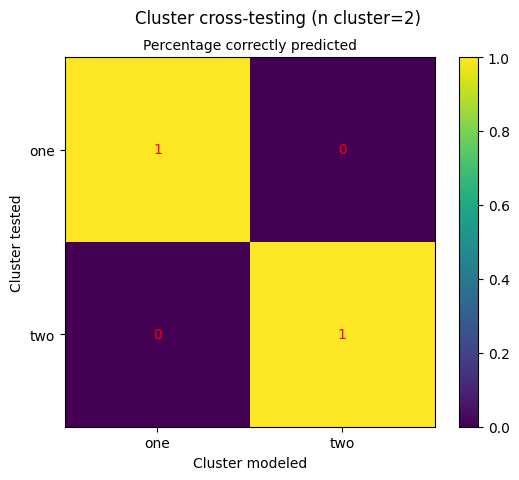

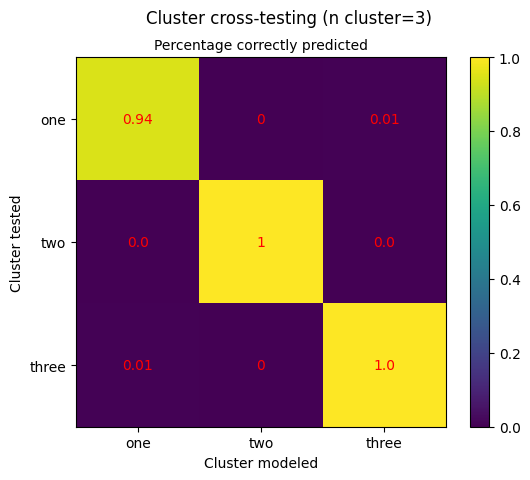

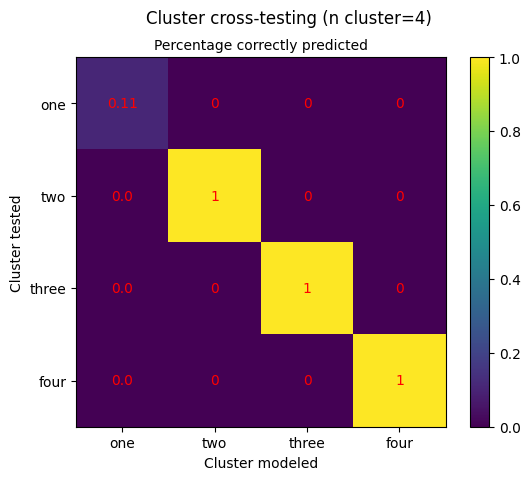

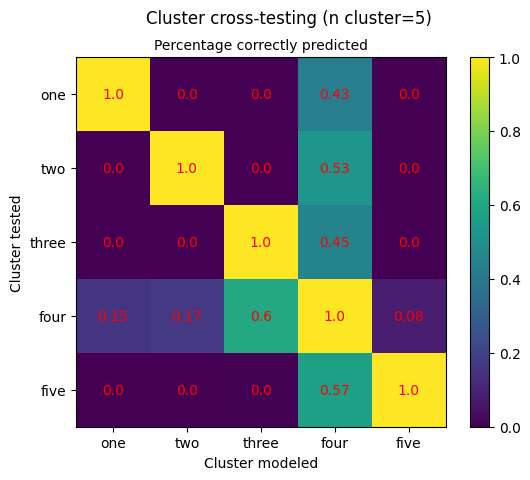

In [138]:
visualize_cross(clustering_analysis(niddm_na_fiveten[(niddm_na_fiveten["Sex_binary"] == 0)],question))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

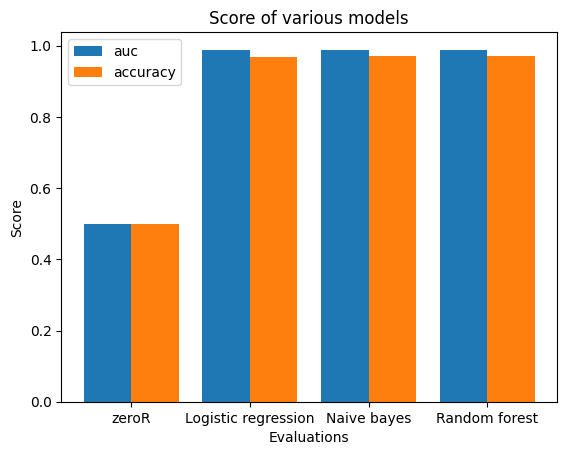

F1:  0.969691056486379 0.9702954776234517 0.9700483696657992
auc:  [0.5, 0.9877215244973353, 0.9876683434774709, 0.9885495681171269]
accuracy:  [0.5, 0.9688472762645914, 0.9696285262645914, 0.96963156614786]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

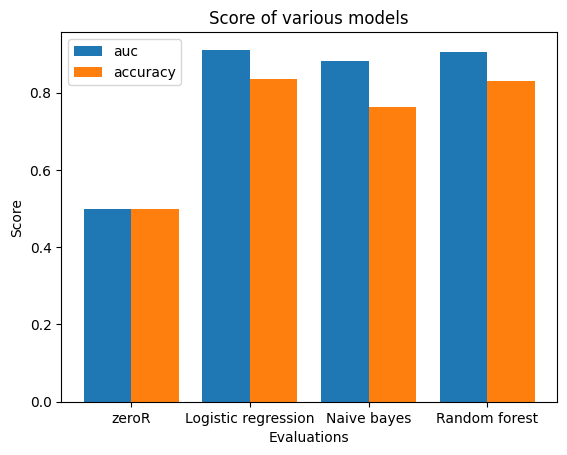

F1:  0.8427423338858661 0.8039530264815962 0.8360082071399746
auc:  [0.5, 0.9111553152200459, 0.88255149290893, 0.9049225266997215]
accuracy:  [0.5, 0.8345328417481743, 0.7635218928059965, 0.8313758798257107]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

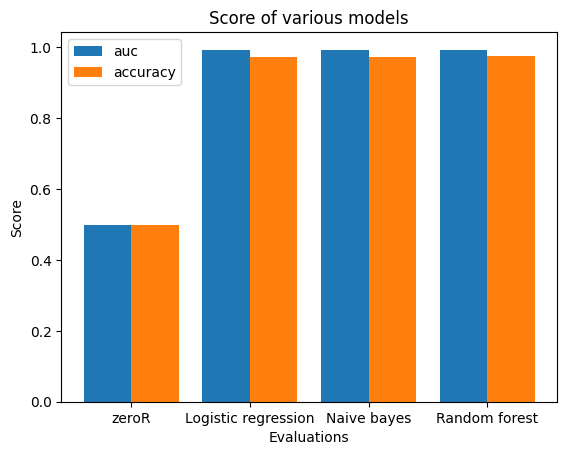

F1:  0.9729303375447456 0.9739327193600468 0.9759691695675928
auc:  [0.5, 0.9930232558139535, 0.9914548404542997, 0.9931719848566793]
accuracy:  [0.5, 0.9720930232558139, 0.9732558139534884, 0.9755813953488373]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

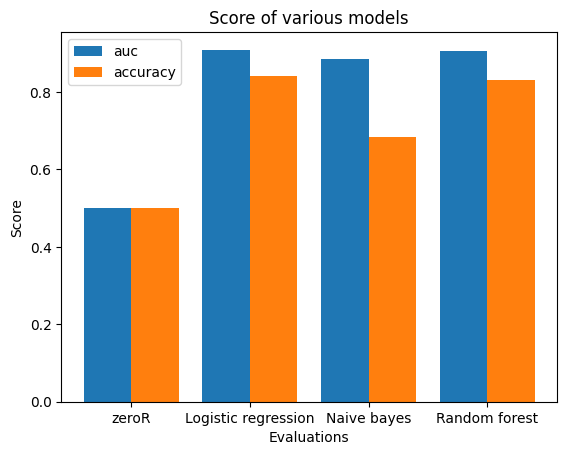

F1:  0.8484695056663462 0.7582712668834882 0.8366789204796559
auc:  [0.5, 0.9087852540399993, 0.884614719280054, 0.90533388522899]
accuracy:  [0.5, 0.8400222198709132, 0.6827913146001179, 0.8315030911317018]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

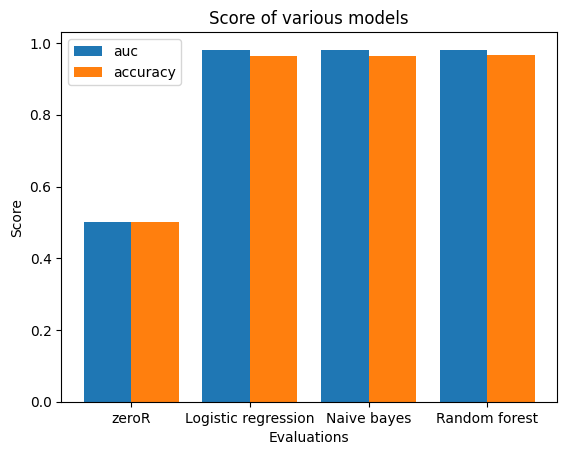

F1:  0.9653615154625051 0.9650263475130124 0.9672790930553506
auc:  [0.5, 0.9801218310490012, 0.9814027940736274, 0.979488040849234]
accuracy:  [0.5, 0.9640046838407494, 0.9640080294412847, 0.9664570090331215]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

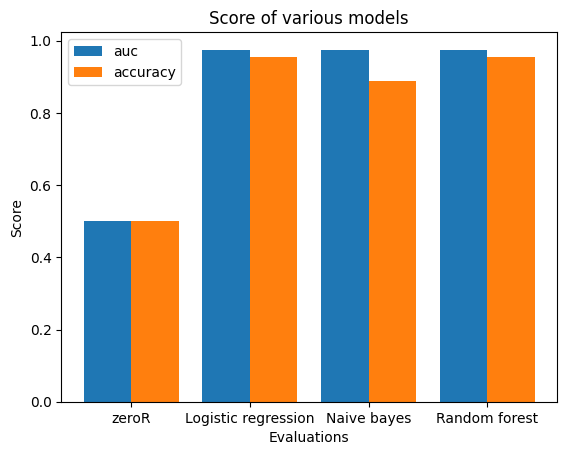

F1:  0.9579085847990062 0.9004797275230155 0.9561450725934585
auc:  [0.5, 0.975012483550556, 0.9751755358462676, 0.9735478521082328]
accuracy:  [0.5, 0.9562143227815257, 0.8893061012676996, 0.9549966639484024]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

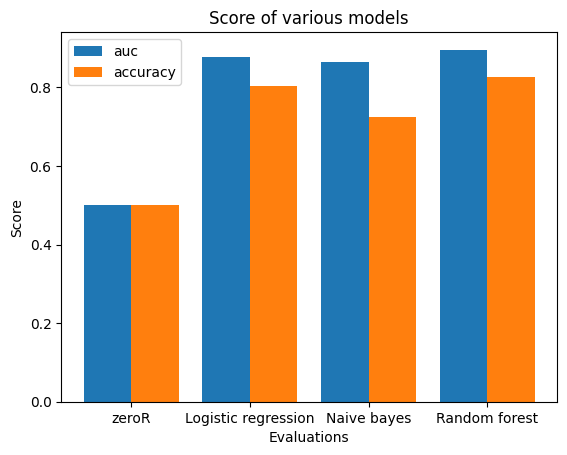

F1:  0.8193877377848526 0.7822362167802243 0.8329355593282531
auc:  [0.5, 0.8773172394636499, 0.8642594000151511, 0.8956517764702911]
accuracy:  [0.5, 0.8029080238284152, 0.7236684676515409, 0.8254744902457147]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

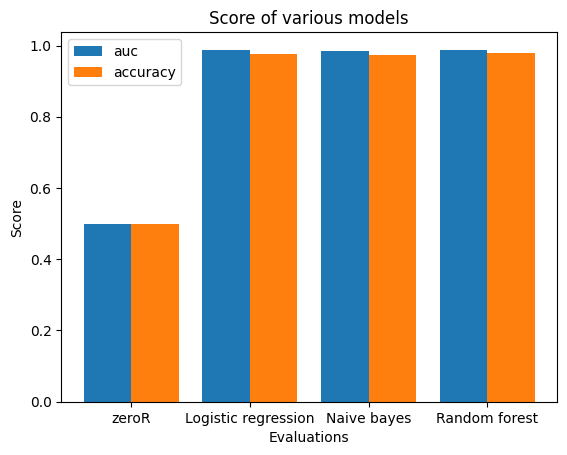

F1:  0.976891870702397 0.9727161524145362 0.9798738908361776
auc:  [0.5, 0.9872830102931505, 0.9857464118177865, 0.9882744716321122]
accuracy:  [0.5, 0.9762529274004683, 0.9721679491468719, 0.9795349615255938]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

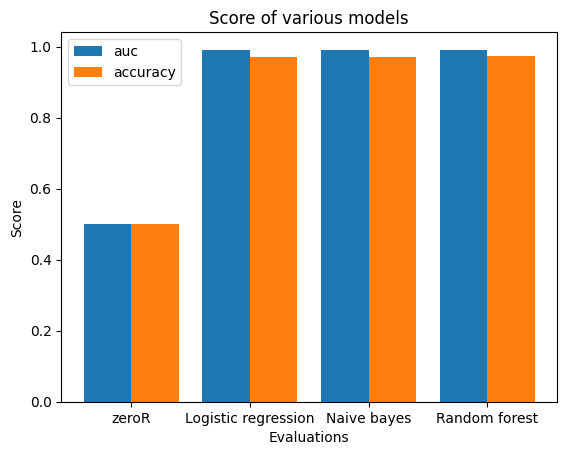

F1:  0.9707419484616254 0.9708659279495697 0.9748627827303852
auc:  [0.5, 0.989697133585722, 0.9910086533261222, 0.9914954029204975]
accuracy:  [0.5, 0.9697674418604652, 0.9697674418604652, 0.9744186046511628]


In [164]:
clustering_modeling(niddm_na_fiveten[(niddm_na_fiveten["Sex_binary"] == 0)],question, 2,5)

MinMax
MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1752, 52)
Test shape:  (219, 66)
Y:  0
Q:  0
[[  1. 219.]]
Y:  0
Q:  1
[[   0. 3291.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (5266, 52)
Test shape:  (658, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[   0. 1095.]]
Y:  1
Q:  1
[[  0. 657.]
 [  1.   1.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (738, 52)
Test shape:  (92, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[ 1. 92.]]
Y:  0
Q:  1
[[  0. 876.]
 [  1.   9.]]
Y:  0
Q:  2
[[0.000e+00 3.036e+03]
 [1.000e+00 4.000e+00]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1416, 52)
Test shape:  (177, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 450.]
 [  1.  11.]]
Y:  1
Q:  1
[[  0. 102.]
 [  1.  75.]]
Y:  1
Q:  2
[[   0. 3040.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4864, 52)
Test shape:  (608, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 132.]
 [  1. 329.]]
Y:  2
Q:  1
[[  0. 884.]
 [  1.   1.]]
Y:  2
Q:  2
[[  1. 608.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (726, 52)
Test shape:  (91, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 91.]]
Y:  0
Q:  1
[[  0. 846.]
 [  1.   8.]]
Y:  0
Q:  2
[[0.000e+00 1.419e+03]
 [1.000e+00 7.000e+00]]
Y:  0
Q:  3
[[0.000e+00 1.647e+03]
 [1.000e+00 5.000e+00]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1366, 52)
Test shape:  (171, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 321.]
 [  1. 133.]]
Y:  1
Q:  1
[[  1. 171.]]
Y:  1
Q:  2
[[0.000e+00 1.397e+03]
 [1.000e+00 2.900e+01]]
Y:  1
Q:  3
[[   0. 1652.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2282, 52)
Test shape:  (285, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 179.]
 [  1. 275.]]
Y:  2
Q:  1
[[  0. 221.]
 [  1. 633.]]
Y:  2
Q:  2
[[  1. 285.]]
Y:  2
Q:  3
[[  0. 665.]
 [  1. 987.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2644, 52)
Test shape:  (330, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 242.]
 [  1. 212.]]
Y:  3
Q:  1
[[  0. 854.]]
Y:  3
Q:  2
[[   0. 1426.]]
Y:  3
Q:  3
[[  1. 330.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (694, 52)
Test shape:  (87, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 87.]]
Y:  0
Q:  1
[[  0. 629.]
 [  1.  14.]]
Y:  0
Q:  2
[[  0. 727.]
 [  1.  13.]]
Y:  0
Q:  3
[[  0. 823.]
 [  1.  10.]]
Y:  0
Q:  4
[[0.000e+00 1.733e+03]
 [1.000e+00 3.000e+00]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1028, 52)
Test shape:  (129, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 312.]
 [  1. 122.]]
Y:  1
Q:  1
[[  1. 129.]]
Y:  1
Q:  2
[[  0. 632.]
 [  1. 108.]]
Y:  1
Q:  3
[[  0. 686.]
 [  1. 147.]]
Y:  1
Q:  4
[[   0. 1736.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1184, 52)
Test shape:  (148, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 355.]
 [  1.  79.]]
Y:  2
Q:  1
[[  0. 547.]
 [  1.  96.]]
Y:  2
Q:  2
[[  1. 148.]]
Y:  2
Q:  3
[[  0. 833.]]
Y:  2
Q:  4
[[   0. 1736.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1332, 52)
Test shape:  (167, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 398.]
 [  1.  36.]]
Y:  3
Q:  1
[[  0. 584.]
 [  1.  59.]]
Y:  3
Q:  2
[[  0. 740.]]
Y:  3
Q:  3
[[  1. 167.]]
Y:  3
Q:  4
[[   0. 1736.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2778, 52)
Test shape:  (347, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 192.]
 [  1. 242.]]
Y:  4
Q:  1
[[  0. 638.]
 [  1.   5.]]
Y:  4
Q:  2
[[  0. 740.]]
Y:  4
Q:  3
[[  0. 833.]]
Y:  4
Q:  4
[[  1. 347.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

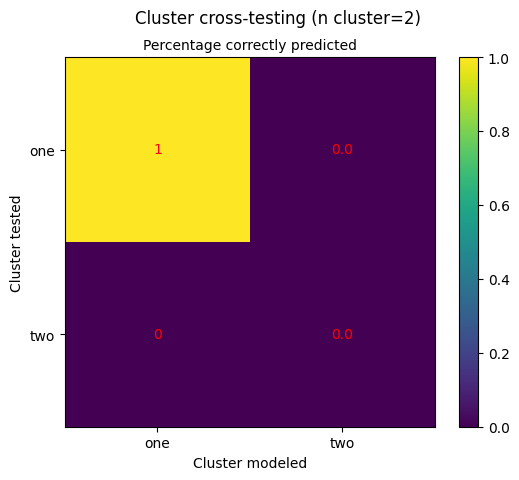

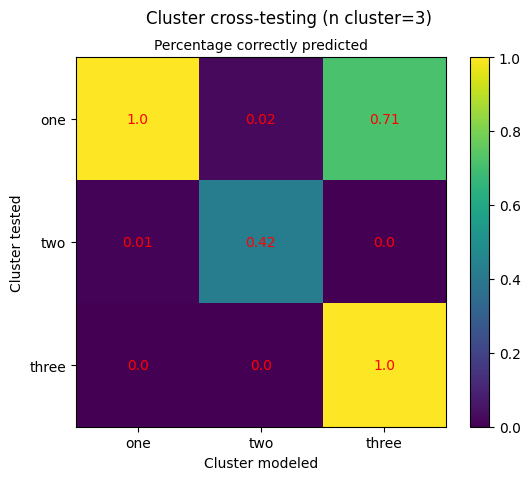

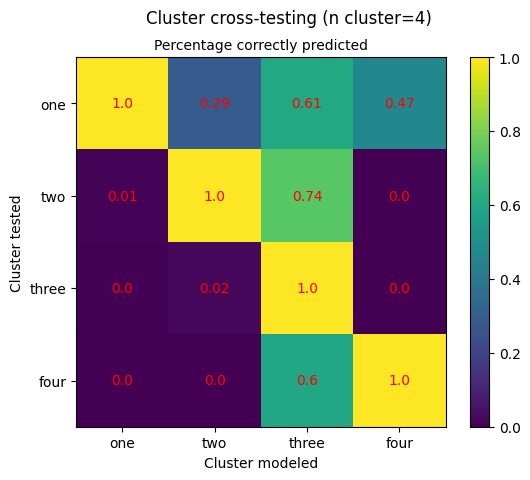

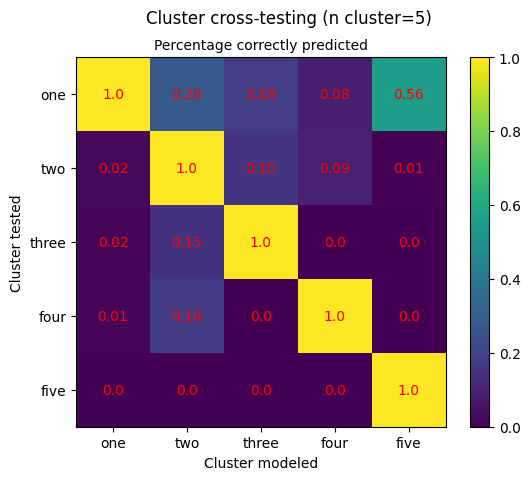

In [139]:
visualize_cross(clustering_analysis(niddm_na_fiveten[(niddm_na_fiveten["Sex_binary"] == 1)],question))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

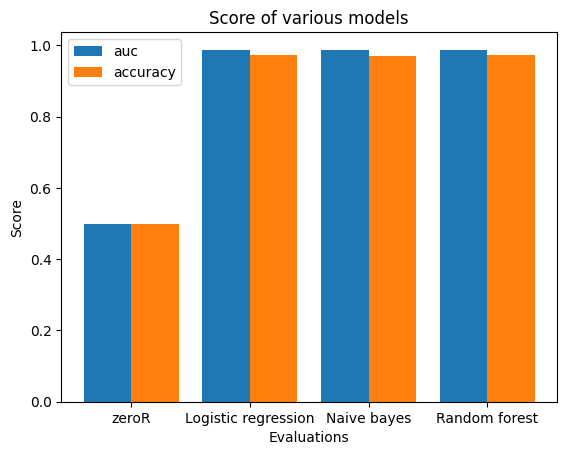

F1:  0.9727357155396349 0.9710438304907124 0.9730654188405405
auc:  [0.5, 0.9863430762475776, 0.9871521469234495, 0.988129277192345]
accuracy:  [0.5, 0.9719661964980545, 0.9704067363813229, 0.9727474464980546]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

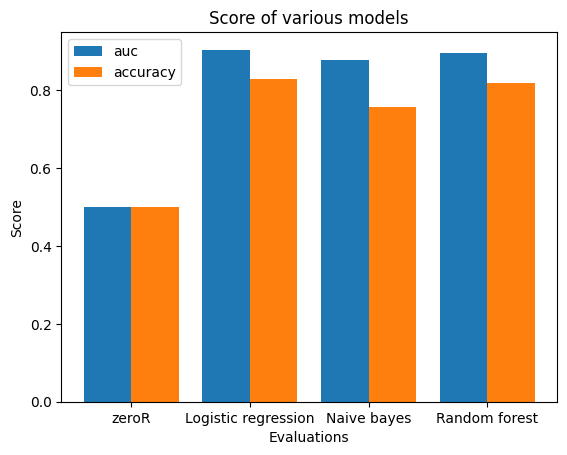

F1:  0.8385801437389772 0.7988332003049096 0.8263132179437409
auc:  [0.5, 0.9038227462408416, 0.877932978811891, 0.8954232876644567]
accuracy:  [0.5, 0.829798033659364, 0.7558604263790284, 0.8178496704144956]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

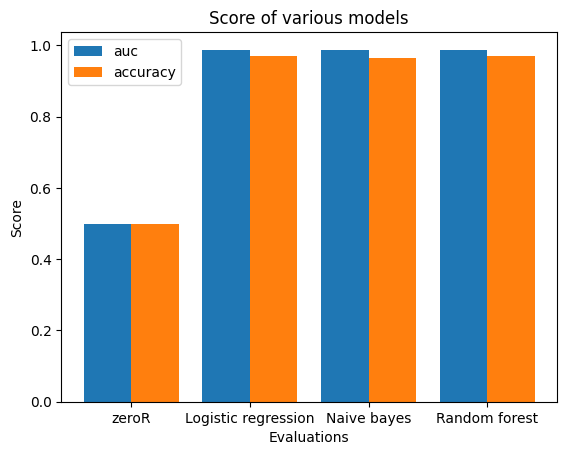

F1:  0.9720810058988288 0.966513931016002 0.970302564463528
auc:  [0.5, 0.9878853434288805, 0.98670903190914, 0.9873985938345051]
accuracy:  [0.5, 0.9709302325581395, 0.9651162790697674, 0.9697674418604652]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood

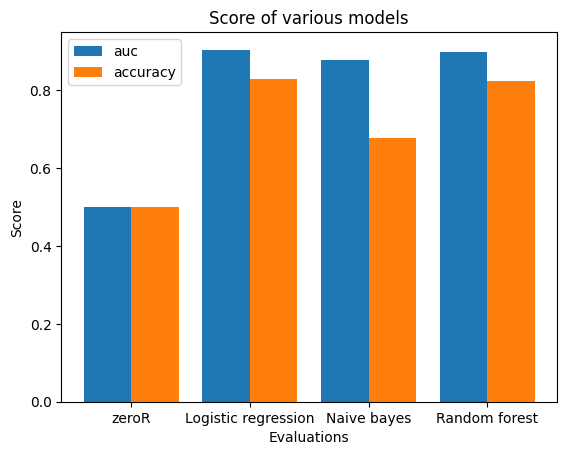

F1:  0.838310896325535 0.7550393869191449 0.829769265049204
auc:  [0.5, 0.9033442373477338, 0.8767726612381957, 0.8968482067383167]
accuracy:  [0.5, 0.8282041205012319, 0.6767507595568119, 0.8235273667185634]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

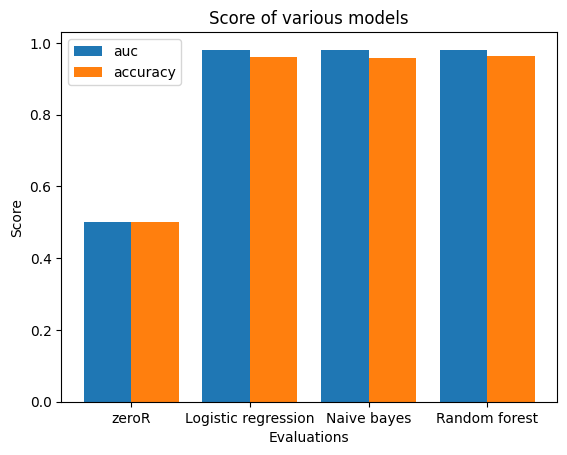

F1:  0.961350561200942 0.9594996664727451 0.9641339585588239
auc:  [0.5, 0.9805399151814683, 0.9812390890638281, 0.980538604230439]
accuracy:  [0.5, 0.9598996319839411, 0.9582669789227166, 0.9631816661090665]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

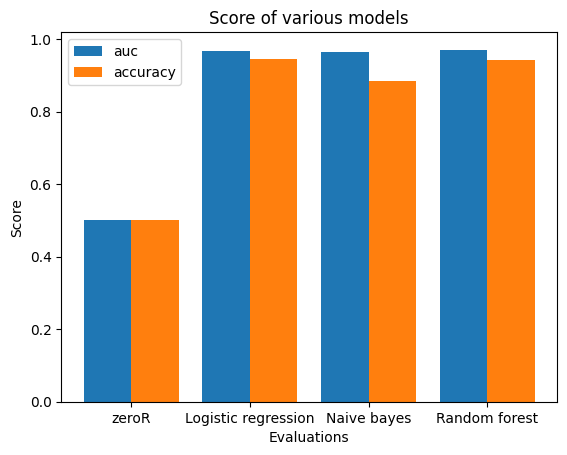

F1:  0.9477652459215746 0.8956184516819367 0.9449345563403143
auc:  [0.5, 0.9680615795071477, 0.9649155219656409, 0.9708382005660411]
accuracy:  [0.5, 0.9452516865594188, 0.8832103936540885, 0.9434298317147305]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

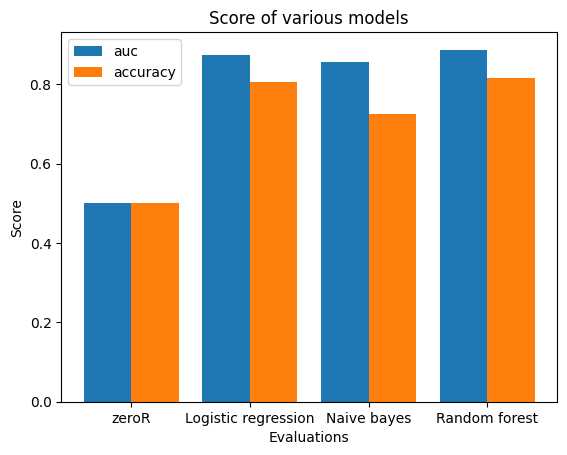

F1:  0.8208423004746492 0.7819956885035181 0.8234577532919861
auc:  [0.5, 0.8739883588798263, 0.8560201131284564, 0.8868634125400873]
accuracy:  [0.5, 0.8044067455069835, 0.7241823150841928, 0.8154481681590912]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

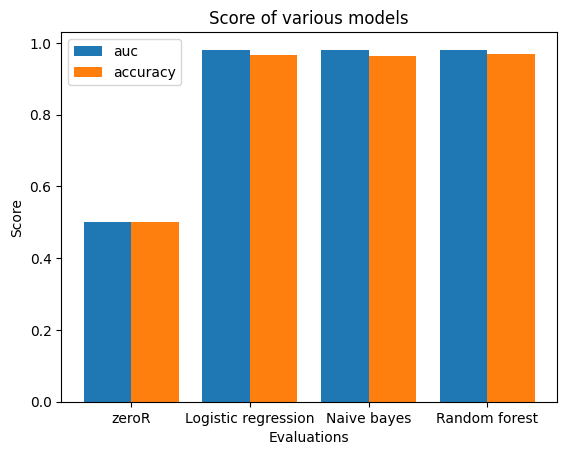

F1:  0.9667166330599554 0.9656657564315192 0.9687618962039768
auc:  [0.5, 0.9796266192976362, 0.981192604925243, 0.9800390772652687]
accuracy:  [0.5, 0.965627300100368, 0.9648109735697558, 0.96807962529274]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood

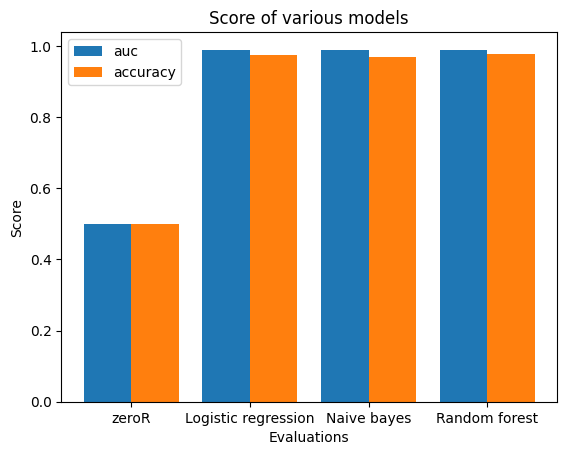

F1:  0.9740346005134153 0.9707085384102129 0.9770903119868637
auc:  [0.5, 0.9890481341265549, 0.988980530016225, 0.988209843158464]
accuracy:  [0.5, 0.9732558139534884, 0.9697674418604652, 0.9767441860465116]


In [165]:
clustering_modeling(niddm_na_fiveten[(niddm_na_fiveten["Sex_binary"] == 0)],question, 2,5)

#### questionnaire and hba1c

MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4576, 53)
Test shape:  (572, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()


Y:  0
Q:  0
[[  1. 572.]]
Y:  0
Q:  1
[[0.000e+00 1.782e+03]
 [1.000e+00 2.604e+03]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (7018, 53)
Test shape:  (877, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[   0. 2860.]]
Y:  1
Q:  1
[[  1. 877.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4568, 53)
Test shape:  (571, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  1. 571.]]
Y:  0
Q:  1
[[0.000e+00 1.105e+03]
 [1.000e+00 6.000e+00]]
Y:  0
Q:  2
[[0.000e+00 3.275e+03]
 [1.000e+00 5.000e+00]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1778, 53)
Test shape:  (222, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[   0. 2855.]]
Y:  1
Q:  1
[[  1. 222.]]
Y:  1
Q:  2
[[   0. 3280.]]
Cluster  1  of  3
Healthy sampling...
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

modeling...
Trainings shape:  (5248, 53)
Test shape:  (656, 67)
Y:  2
Q:  0
[[   0. 2855.]]
Y:  2
Q:  1
[[   0. 1111.]]
Y:  2
Q:  2
[[  1. 656.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1902, 53)
Test shape:  (238, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 238.]]
Y:  0
Q:  1
[[  0. 536.]
 [  1. 547.]]
Y:  0
Q:  2
[[0.000e+00 9.980e+02]
 [1.000e+00 1.084e+03]]
Y:  0
Q:  3
[[0.000e+00 1.234e+03]
 [1.000e+00 1.658e+03]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1732, 53)
Test shape:  (217, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[0.000e+00 1.164e+03]
 [1.000e+00 2.500e+01]]
Y:  1
Q:  1
[[  1. 217.]]
Y:  1
Q:  2
[[   0. 2082.]]
Y:  1
Q:  3
[[   0. 2892.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3332, 53)
Test shape:  (416, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 340.]
 [  1. 849.]]
Y:  2
Q:  1
[[0.000e+00 1.036e+03]
 [1.000e+00 4.700e+01]]
Y:  2
Q:  2
[[  1. 416.]]
Y:  2
Q:  3
[[0.00e+00 2.67e+03]
 [1.00e+00 2.22e+02]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4628, 53)
Test shape:  (578, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 801.]
 [  1. 388.]]
Y:  3
Q:  1
[[   0. 1083.]]
Y:  3
Q:  2
[[   0. 2082.]]
Y:  3
Q:  3
[[  1. 578.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1560, 53)
Test shape:  (195, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 195.]]
Y:  0
Q:  1
[[  0. 469.]
 [  1. 601.]]
Y:  0
Q:  2
[[0.000e+00 4.730e+02]
 [1.000e+00 1.347e+03]]
Y:  0
Q:  3
[[0.000e+00 9.950e+02]
 [1.000e+00 1.774e+03]]
Y:  0
Q:  4
[[  0. 226.]
 [  1. 386.]]
Cluster  0  of  5
Healthy sampling...
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

modeling...
Trainings shape:  (1712, 53)
Test shape:  (214, 67)
Y:  1
Q:  0
[[  0. 939.]
 [  1.  36.]]
Y:  1
Q:  1
[[  1. 214.]]
Y:  1
Q:  2
[[   0. 1820.]]
Y:  1
Q:  3
[[   0. 2769.]]
Y:  1
Q:  4
[[  0. 612.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2912, 53)
Test shape:  (364, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 503.]
 [  1. 472.]]
Y:  2
Q:  1
[[   0. 1070.]]
Y:  2
Q:  2
[[  1. 364.]]
Y:  2
Q:  3
[[0.000e+00 2.493e+03]
 [1.000e+00 2.760e+02]]
Y:  2
Q:  4
[[  0. 612.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4430, 53)
Test shape:  (554, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 464.]
 [  1. 511.]]
Y:  3
Q:  1
[[0.000e+00 1.069e+03]
 [1.000e+00 1.000e+00]]
Y:  3
Q:  2
[[   0. 1820.]]
Y:  3
Q:  3
[[  1. 554.]]
Y:  3
Q:  4
[[  0. 612.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (980, 53)
Test shape:  (122, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 922.]
 [  1.  53.]]
Y:  4
Q:  1
[[1.00e+00 1.07e+03]]
Y:  4
Q:  2
[[   0. 1820.]]
Y:  4
Q:  3
[[   0. 2769.]]
Y:  4
Q:  4
[[  1. 122.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

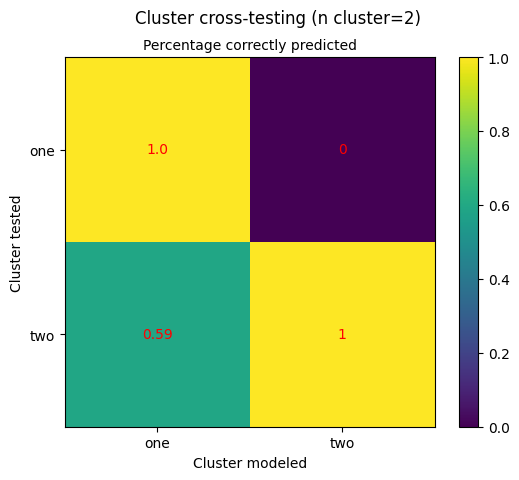

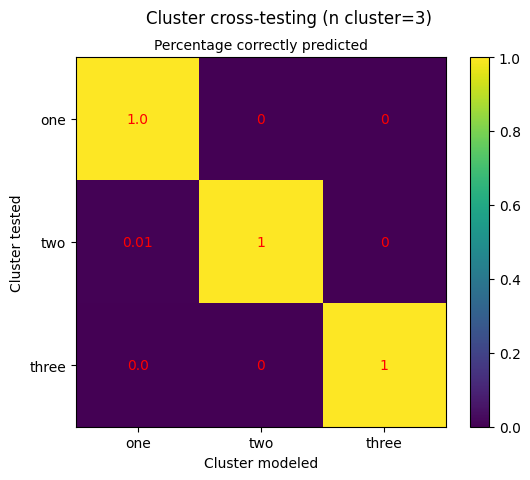

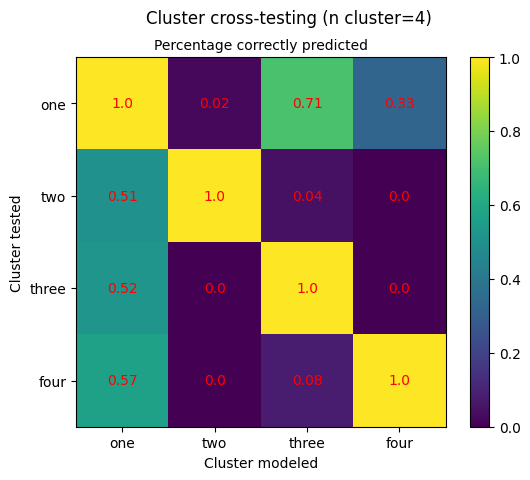

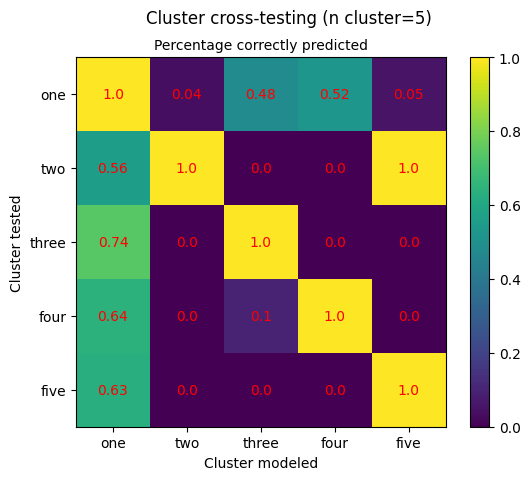

In [140]:
visualize_cross(clustering_analysis(niddm_na_fiveten,question_hb1ac))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

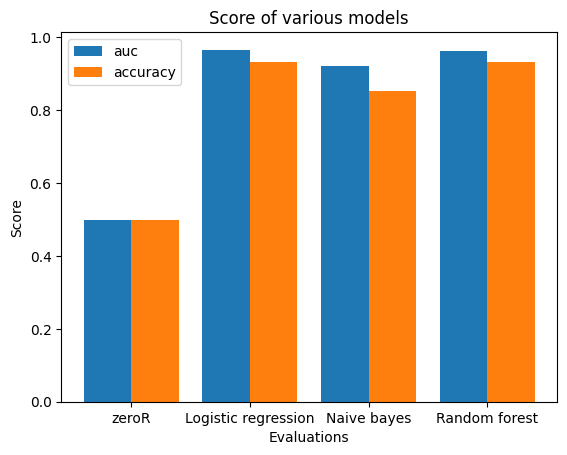

F1:  0.937269825597187 0.8624723464693294 0.9358315135843079
auc:  [0.5, 0.9663711850958012, 0.9205740814199902, 0.9639206066367865]
accuracy:  [0.5, 0.9335341254617299, 0.8539861722534259, 0.9324618540956534]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

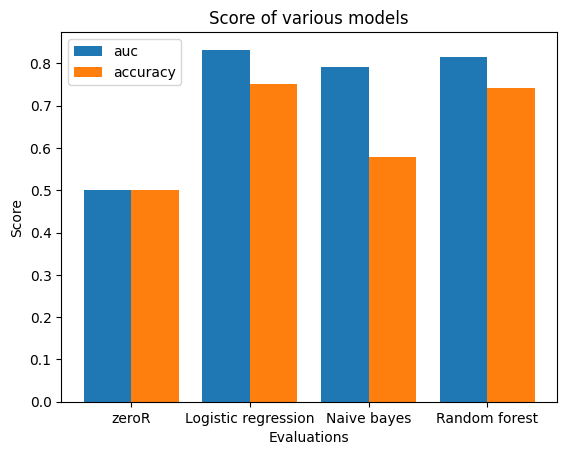

F1:  0.756612099186005 0.7035680666694112 0.745843503669091
auc:  [0.5, 0.8323856076344434, 0.7923068443180101, 0.8160639638537002]
accuracy:  [0.5, 0.7506136638373986, 0.5786525125608629, 0.7413533892974459]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

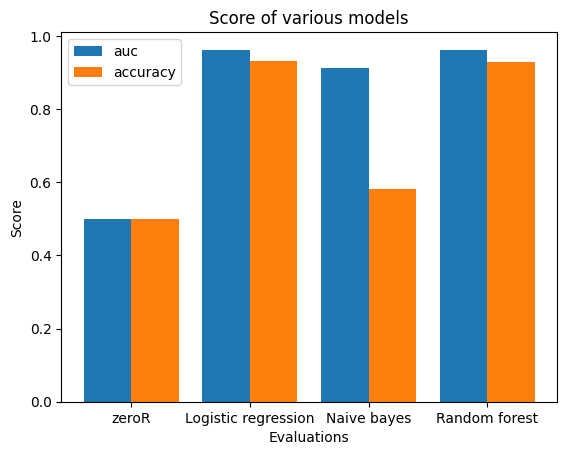

F1:  0.9349437274210574 0.7049772268322677 0.9305719104973217
auc:  [0.5, 0.9620652472933406, 0.9134473405846034, 0.9611075698885291]
accuracy:  [0.5, 0.9306899323781151, 0.5814474502657223, 0.9271847979891674]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

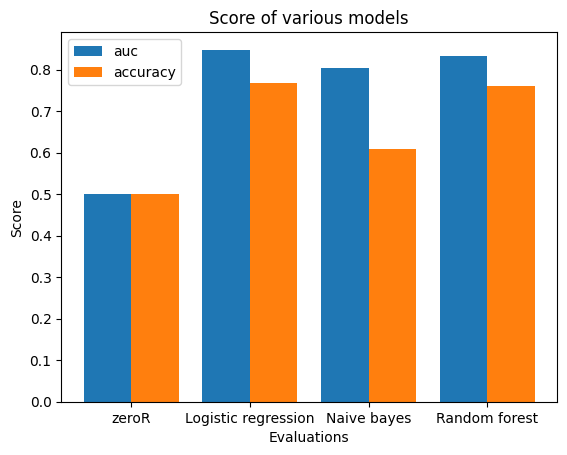

F1:  0.7764331018568393 0.7190595985061329 0.7642747329644716
auc:  [0.5, 0.8481707678145575, 0.8049811316691878, 0.8341111697288451]
accuracy:  [0.5, 0.7682134570765662, 0.6092807424593968, 0.759860788863109]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

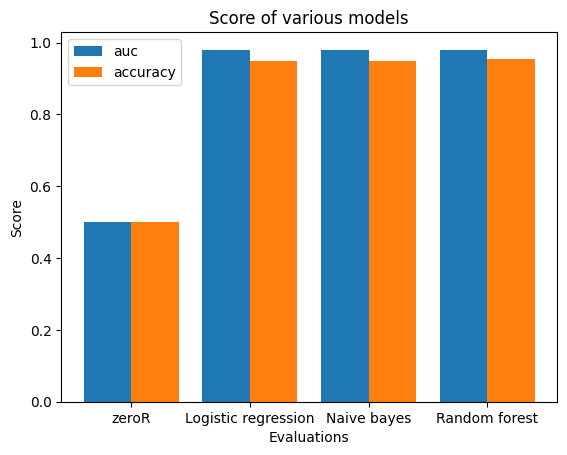

F1:  0.9521337108788829 0.952230663876428 0.9549784188130007
auc:  [0.5, 0.9801240217645535, 0.9791929004443939, 0.9802270209490939]
accuracy:  [0.5, 0.9496215037208109, 0.9496204345222821, 0.9533198614318706]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

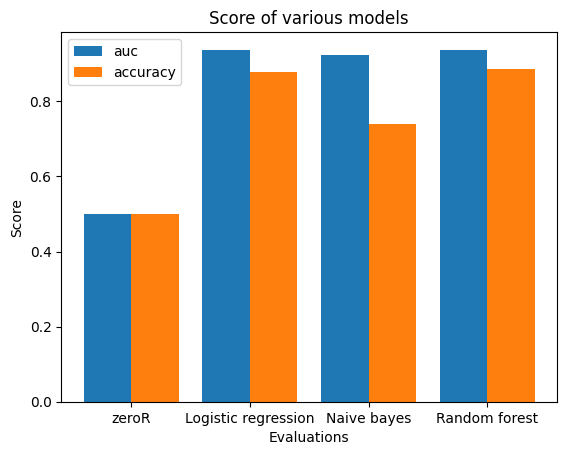

F1:  0.8840903425973949 0.7938961533546471 0.8917251507698043
auc:  [0.5, 0.9355872576177285, 0.9238019390581717, 0.9375270083102493]
accuracy:  [0.5, 0.8794736842105263, 0.7402631578947368, 0.8852631578947369]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

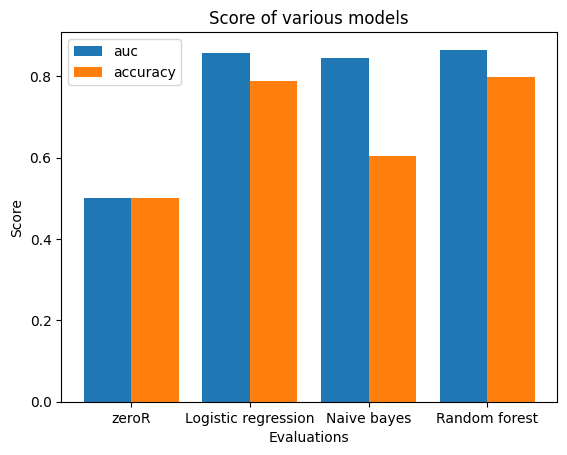

F1:  0.8018304867277215 0.7167542470402325 0.8066573784945963
auc:  [0.5, 0.857637136571037, 0.845967053240636, 0.8653968658519625]
accuracy:  [0.5, 0.7891667749733565, 0.6047709963349016, 0.7985143354734735]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

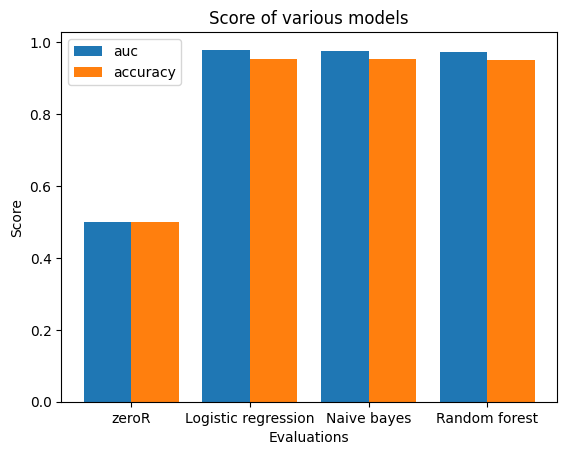

F1:  0.9562849909669612 0.9559005960368971 0.9528029336142185
auc:  [0.5, 0.9795568150929561, 0.9768245908478883, 0.9743704288432484]
accuracy:  [0.5, 0.9542543409460269, 0.9537924471815927, 0.9510178769994012]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

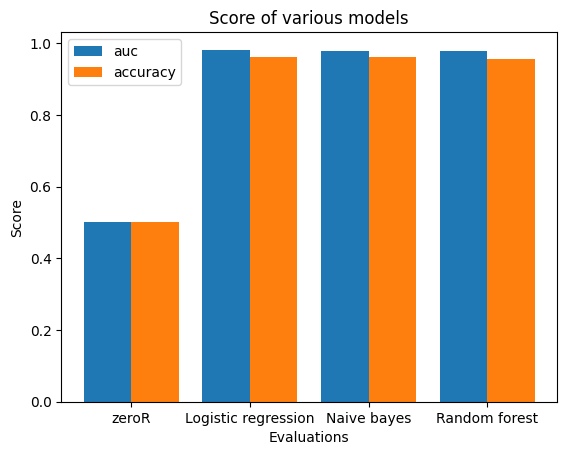

F1:  0.9620582603741443 0.9624436044178047 0.958525648613505
auc:  [0.5, 0.9814603980291192, 0.9791684262297592, 0.9788072187590902]
accuracy:  [0.5, 0.9604199110122358, 0.9608500185391176, 0.9569771968854283]


In [166]:
clustering_modeling(niddm_na_fiveten,question_hb1ac, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1500, 53)
Test shape:  (188, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[  1. 188.]]
Y:  0
Q:  1
[[   0. 1922.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3076, 53)
Test shape:  (384, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 938.]]
Y:  1
Q:  1
[[  1. 384.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1108, 53)
Test shape:  (139, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  1. 139.]]
Y:  0
Q:  1
[[  0. 488.]
 [  1. 244.]]
Y:  0
Q:  2
[[0.00e+00 1.37e+03]
 [1.00e+00 6.50e+01]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1172, 53)
Test shape:  (146, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 693.]]
Y:  1
Q:  1
[[  1. 146.]]
Y:  1
Q:  2
[[   0. 1435.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2296, 53)
Test shape:  (287, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 689.]
 [  1.   4.]]
Y:  2
Q:  1
[[  0. 732.]]
Y:  2
Q:  2
[[  1. 287.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1574, 53)
Test shape:  (197, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 197.]]
Y:  0
Q:  1
[[  0. 732.]]
Y:  0
Q:  2
[[  0. 629.]]
Y:  0
Q:  3
[[  0. 515.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1172, 53)
Test shape:  (146, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 984.]]
Y:  1
Q:  1
[[  1. 146.]]
Y:  1
Q:  2
[[  0. 629.]]
Y:  1
Q:  3
[[  0. 515.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1006, 53)
Test shape:  (126, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 984.]]
Y:  2
Q:  1
[[  0. 732.]]
Y:  2
Q:  2
[[  1. 126.]]
Y:  2
Q:  3
[[  0. 515.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (824, 53)
Test shape:  (103, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 984.]]
Y:  3
Q:  1
[[  0. 732.]]
Y:  3
Q:  2
[[  0. 629.]]
Y:  3
Q:  3
[[  1. 103.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (516, 53)
Test shape:  (65, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 65.]]
Y:  0
Q:  1
[[  0. 665.]]
Y:  0
Q:  2
[[  0. 939.]]
Y:  0
Q:  3
[[  0. 434.]
 [  1.  14.]]
Y:  0
Q:  4
[[  0. 485.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1064, 53)
Test shape:  (133, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 323.]]
Y:  1
Q:  1
[[  0.   8.]
 [  1. 125.]]
Y:  1
Q:  2
[[  0. 939.]]
Y:  1
Q:  3
[[  0. 388.]
 [  1.  60.]]
Y:  1
Q:  4
[[  0. 485.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1502, 53)
Test shape:  (188, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 323.]]
Y:  2
Q:  1
[[  0. 665.]]
Y:  2
Q:  2
[[  1. 188.]]
Y:  2
Q:  3
[[  0. 112.]
 [  1. 336.]]
Y:  2
Q:  4
[[  0. 484.]
 [  1.   1.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (716, 53)
Test shape:  (90, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  1. 323.]]
Y:  3
Q:  1
[[  1. 665.]]
Y:  3
Q:  2
[[  1. 939.]]
Y:  3
Q:  3
[[ 1. 90.]]
Y:  3
Q:  4
[[  1. 485.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (776, 53)
Test shape:  (97, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 323.]]
Y:  4
Q:  1
[[  0. 665.]]
Y:  4
Q:  2
[[  0. 939.]]
Y:  4
Q:  3
[[  0. 417.]
 [  1.  31.]]
Y:  4
Q:  4
[[ 1. 97.]]


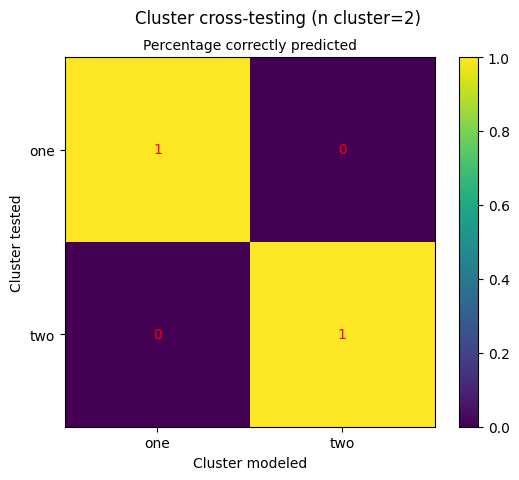

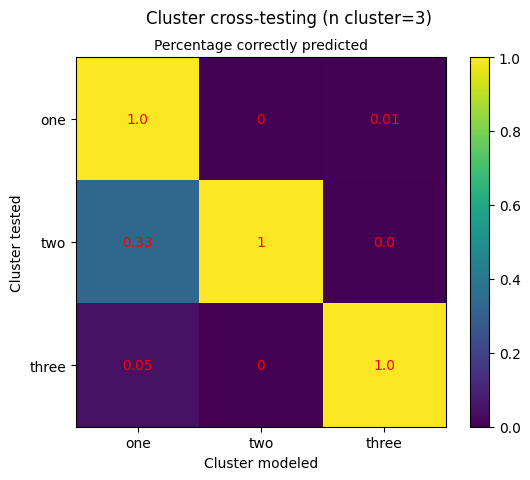

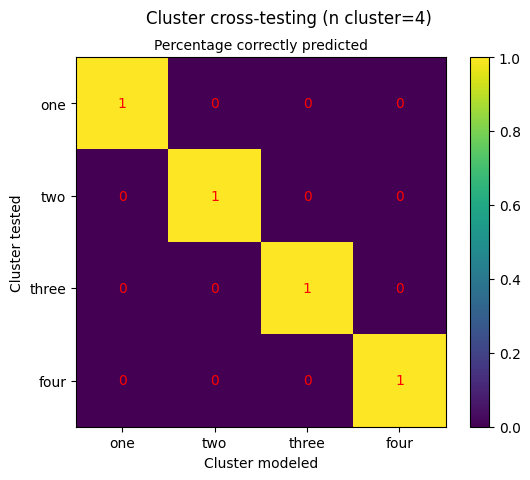

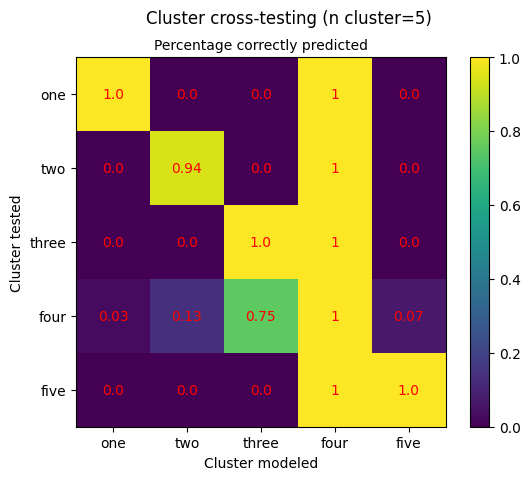

In [141]:
visualize_cross(clustering_analysis(niddm_na_fiveten[(niddm_na_fiveten["Sex_binary"] == 0)],question_hb1ac))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

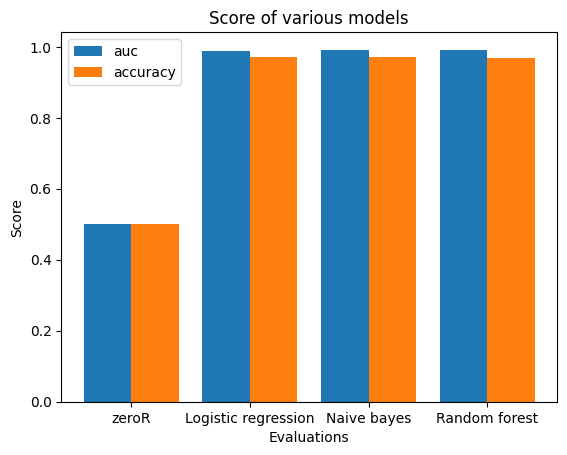

F1:  0.9719937724969602 0.9718500103299703 0.9699540499273025
auc:  [0.5, 0.9895546610041182, 0.9902691981589147, 0.9918310830759447]
accuracy:  [0.5, 0.971181906614786, 0.9711788667315175, 0.969619406614786]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

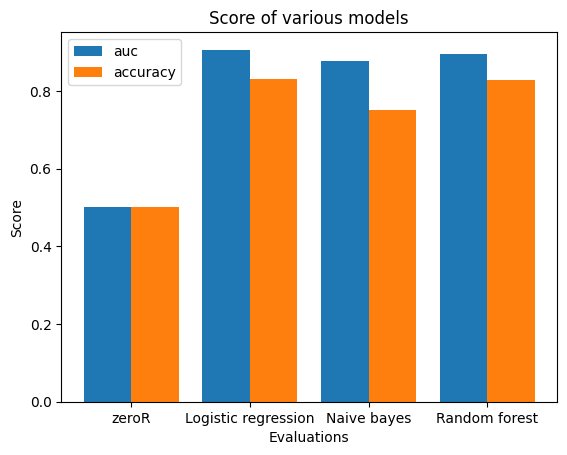

F1:  0.8384801364215885 0.7950261617009984 0.83419823276773
auc:  [0.5, 0.9058398020374105, 0.8775870831480618, 0.8943920519720502]
accuracy:  [0.5, 0.8293496145525457, 0.7500010156718161, 0.8268716292391602]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

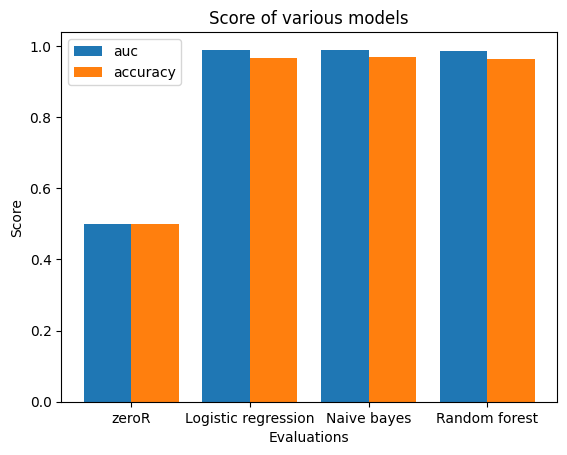

F1:  0.9674449924871287 0.9695156995578357 0.9634662699466907
auc:  [0.5, 0.9898323418063818, 0.989710654407788, 0.9873985938345051]
accuracy:  [0.5, 0.9662790697674418, 0.9686046511627907, 0.9627906976744186]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

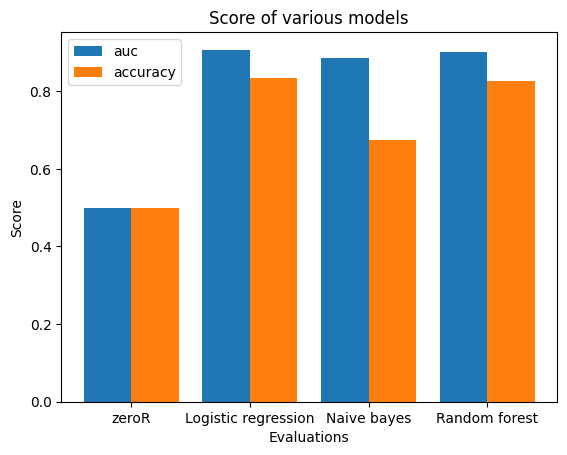

F1:  0.8426339455103704 0.7543026394779216 0.8327298730683933
auc:  [0.5, 0.9070847816851813, 0.8853780293965109, 0.9013988945619815]
accuracy:  [0.5, 0.8337065616639207, 0.6756450564566108, 0.826010852970963]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

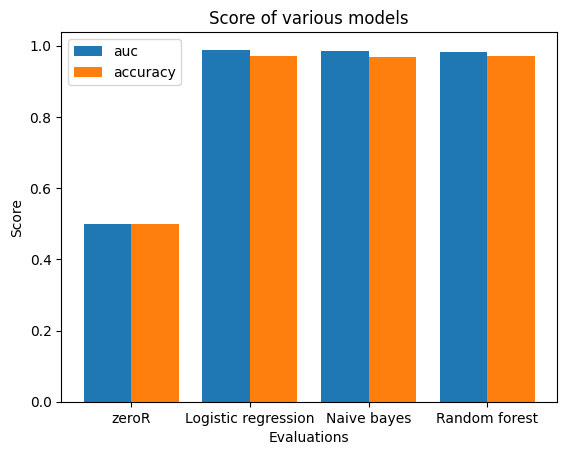

F1:  0.9721549842071961 0.9687882644342213 0.9726636815904239
auc:  [0.5, 0.9884759757299266, 0.9861741642140959, 0.9819862219046808]
accuracy:  [0.5, 0.9713583138173302, 0.9680863164938106, 0.9721846771495484]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

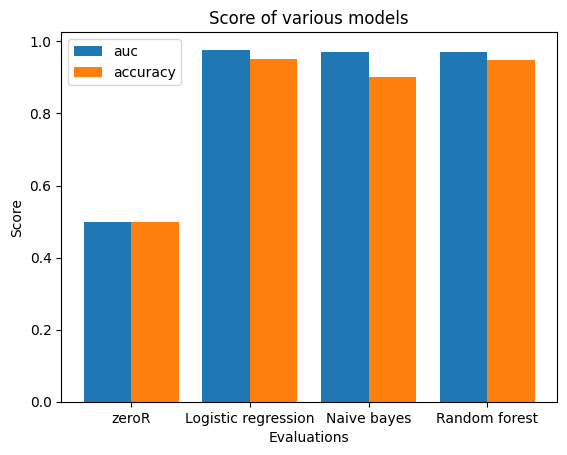

F1:  0.9545435397285451 0.9109794756153491 0.950075539269203
auc:  [0.5, 0.9770064265498531, 0.9720612279847853, 0.9716827781082689]
accuracy:  [0.5, 0.9525631996441545, 0.9020776188005041, 0.9489102231447846]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

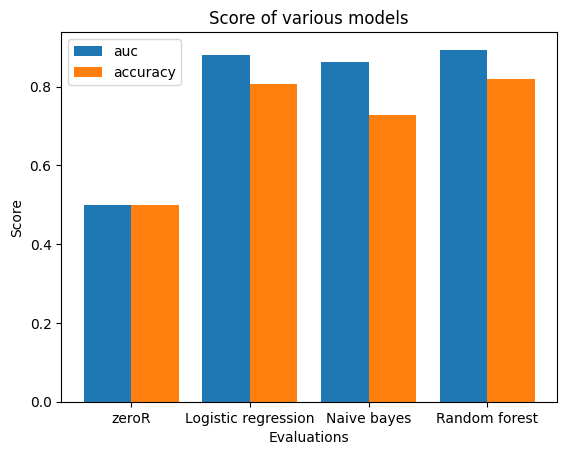

F1:  0.8228319055261665 0.7847488082658213 0.8275079357478681
auc:  [0.5, 0.8797048811898689, 0.8626898184389283, 0.8939409610868413]
accuracy:  [0.5, 0.8074306368937418, 0.7286860366997897, 0.8189594589488798]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

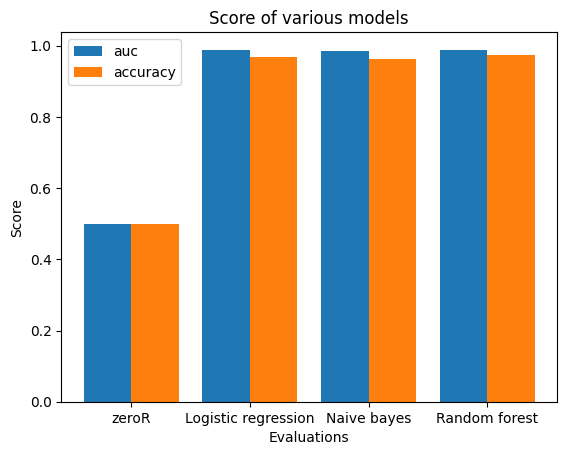

F1:  0.9690732254097019 0.963445504509994 0.9743724888914891
auc:  [0.5, 0.9866085259885117, 0.9859369913236892, 0.9884804001896509]
accuracy:  [0.5, 0.9680896620943459, 0.962361993977919, 0.9738106390097022]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

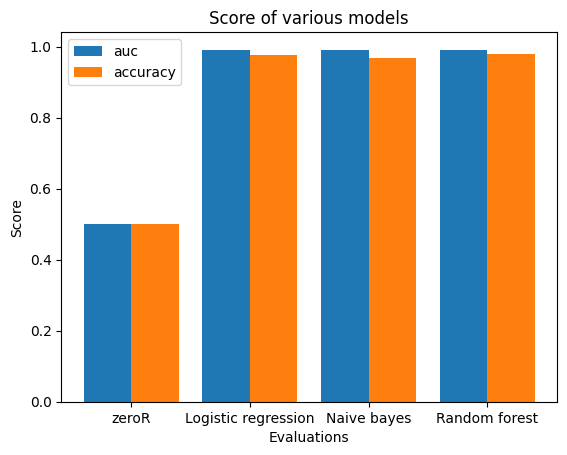

F1:  0.9763071025778249 0.968523132153813 0.9781926263951332
auc:  [0.5, 0.9895889670091942, 0.9911573823688481, 0.9906300703082748]
accuracy:  [0.5, 0.9755813953488373, 0.9674418604651163, 0.977906976744186]


In [167]:
clustering_modeling(niddm_na_fiveten[(niddm_na_fiveten["Sex_binary"] == 0)],question_hb1ac, 2,5)

MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (756, 53)
Test shape:  (95, 66)
Y:  0
Q:  0
[[ 1. 95.]]
Y:  0
Q:  1
[[0.000e+00 3.912e+03]
 [1.000e+00 1.000e+00]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (6260, 53)
Test shape:  (783, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  1. 473.]]
Y:  1
Q:  1
[[  1. 783.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (742, 53)
Test shape:  (93, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[ 1. 93.]]
Y:  0
Q:  1
[[0.000e+00 2.993e+03]
 [1.000e+00 3.000e+00]]
Y:  0
Q:  2
[[  0. 919.]
 [  1.   7.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4794, 53)
Test shape:  (599, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 464.]]
Y:  1
Q:  1
[[  0. 597.]
 [  1.   2.]]
Y:  1
Q:  2
[[  0. 926.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1482, 53)
Test shape:  (185, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 296.]
 [  1. 168.]]
Y:  2
Q:  1
[[   0. 2996.]]
Y:  2
Q:  2
[[  1. 185.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (712, 53)
Test shape:  (89, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 89.]]
Y:  0
Q:  1
[[0.000e+00 2.317e+03]
 [1.000e+00 4.000e+00]]
Y:  0
Q:  2
[[  0. 889.]
 [  1.  21.]]
Y:  0
Q:  3
[[  0. 706.]
 [  1.   4.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3714, 53)
Test shape:  (464, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 152.]
 [  1. 293.]]
Y:  1
Q:  1
[[  1. 464.]]
Y:  1
Q:  2
[[  0. 910.]]
Y:  1
Q:  3
[[  0. 710.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1456, 53)
Test shape:  (182, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 409.]
 [  1.  36.]]
Y:  2
Q:  1
[[   0. 2321.]]
Y:  2
Q:  2
[[  1. 182.]]
Y:  2
Q:  3
[[  0. 704.]
 [  1.   6.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1136, 53)
Test shape:  (142, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 315.]
 [  1. 130.]]
Y:  3
Q:  1
[[   0. 2321.]]
Y:  3
Q:  2
[[  0. 734.]
 [  1. 176.]]
Y:  3
Q:  3
[[  1. 142.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (650, 53)
Test shape:  (81, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 81.]]
Y:  0
Q:  1
[[0.000e+00 1.699e+03]
 [1.000e+00 9.000e+00]]
Y:  0
Q:  2
[[  0. 895.]
 [  1.  23.]]
Y:  0
Q:  3
[[  0. 884.]
 [  1.   5.]]
Y:  0
Q:  4
[[  0. 434.]
 [  1.  31.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2732, 53)
Test shape:  (342, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 231.]
 [  1. 175.]]
Y:  1
Q:  1
[[  1. 342.]]
Y:  1
Q:  2
[[  0. 918.]]
Y:  1
Q:  3
[[  0. 874.]
 [  1.  15.]]
Y:  1
Q:  4
[[  0. 458.]
 [  1.   7.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1468, 53)
Test shape:  (184, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 372.]
 [  1.  34.]]
Y:  2
Q:  1
[[   0. 1708.]]
Y:  2
Q:  2
[[  1. 184.]]
Y:  2
Q:  3
[[  0. 889.]]
Y:  2
Q:  4
[[  0. 465.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1422, 53)
Test shape:  (178, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 386.]
 [  1.  20.]]
Y:  3
Q:  1
[[0.000e+00 1.707e+03]
 [1.000e+00 1.000e+00]]
Y:  3
Q:  2
[[  0. 918.]]
Y:  3
Q:  3
[[  0. 168.]
 [  1.  10.]]
Y:  3
Q:  4
[[  0. 465.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (744, 53)
Test shape:  (93, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 382.]
 [  1.  24.]]
Y:  4
Q:  1
[[   0. 1708.]]
Y:  4
Q:  2
[[  0. 918.]]
Y:  4
Q:  3
[[  0. 889.]]
Y:  4
Q:  4
[[ 1. 93.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

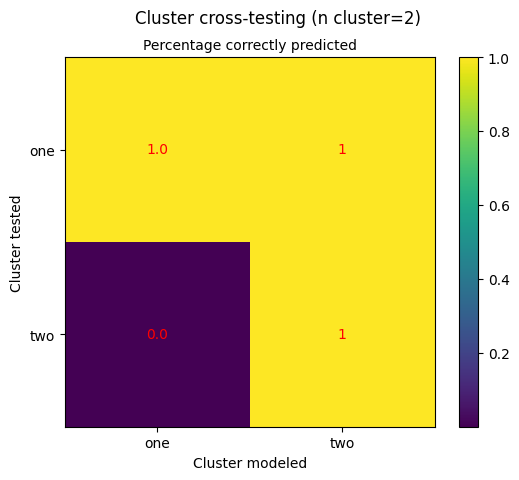

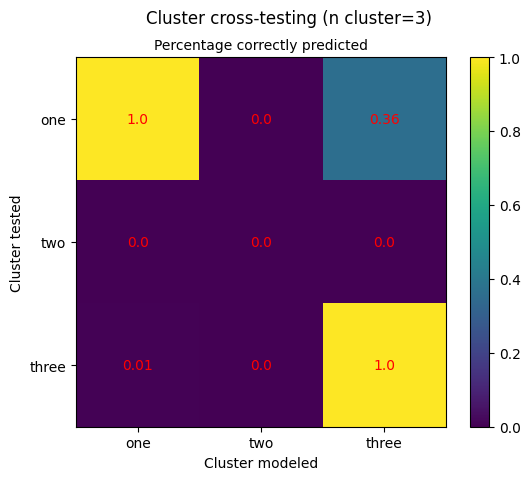

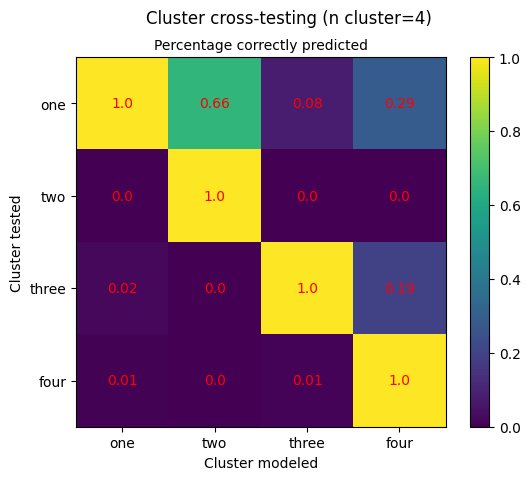

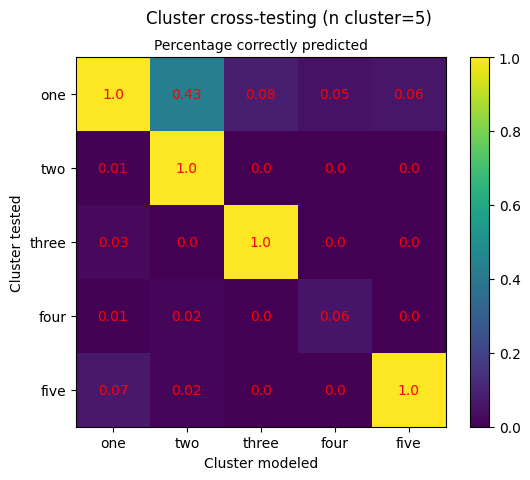

In [142]:
visualize_cross(clustering_analysis(niddm_na_fiveten[(niddm_na_fiveten["Sex_binary"] == 1)],question_hb1ac))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

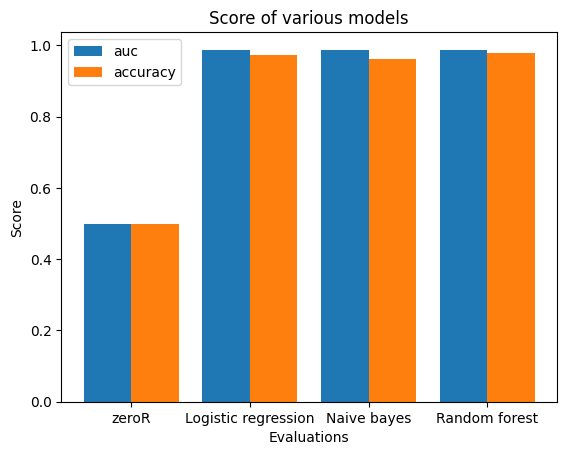

F1:  0.9738795619971368 0.9634339702605781 0.978636261290459
auc:  [0.5, 0.9879578897579346, 0.9875940900367534, 0.9879826145601361]
accuracy:  [0.5, 0.9730737704918033, 0.9618981880931837, 0.9783196721311476]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

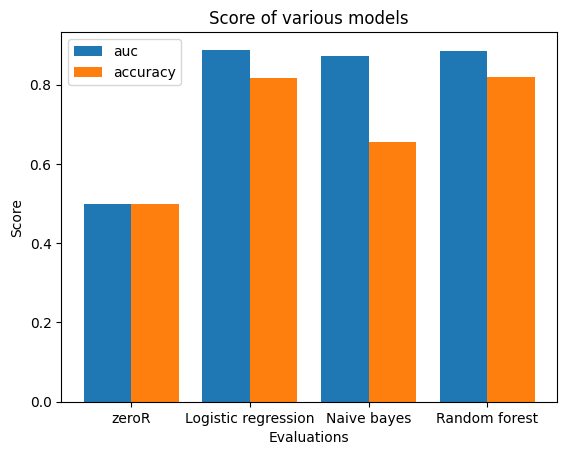

F1:  0.8309437474041226 0.7426981718902079 0.8315932169721695
auc:  [0.5, 0.8883241854934602, 0.8726361950059454, 0.8850473246135553]
accuracy:  [0.5, 0.8172413793103448, 0.656, 0.8187586206896552]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
D

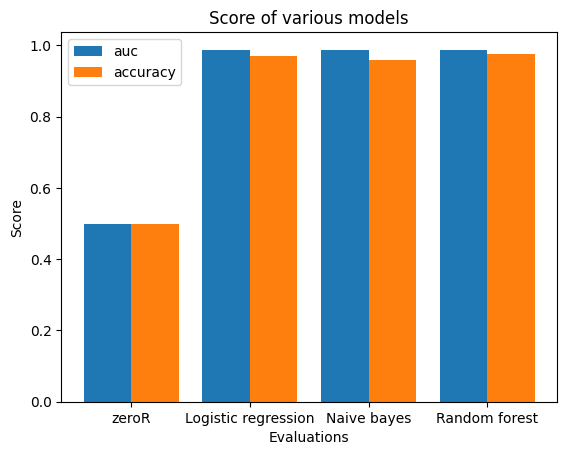

F1:  0.9713422062721445 0.9615431633802057 0.9768151717018075
auc:  [0.5, 0.9873777338728659, 0.9879030086180364, 0.9873304625405103]
accuracy:  [0.5, 0.9704335634167386, 0.9599158757549612, 0.9763503019844694]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

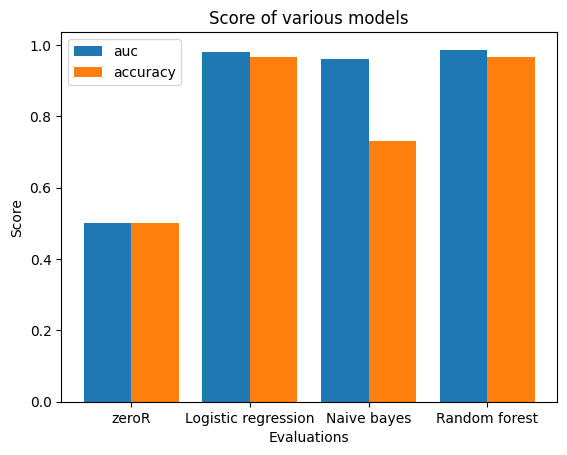

F1:  0.9658715980427566 0.7867689816681303 0.9671599100421493
auc:  [0.5, 0.9791032019779616, 0.9612282897347456, 0.9862855224199505]
accuracy:  [0.5, 0.9646408839779006, 0.7292817679558011, 0.9662983425414364]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

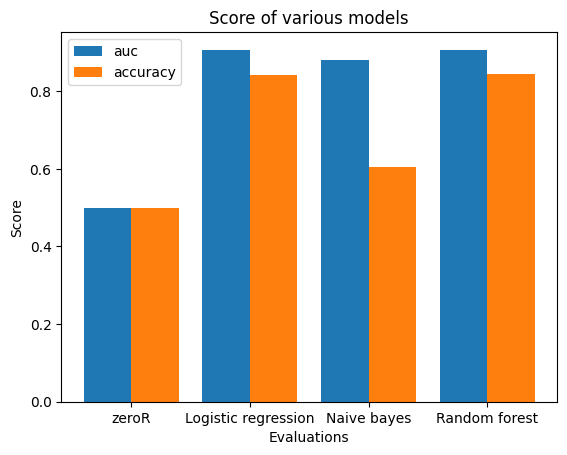

F1:  0.853530091546942 0.7170220133094366 0.8518858396246739
auc:  [0.5, 0.9067913332612457, 0.8806812959558823, 0.9067379433391003]
accuracy:  [0.5, 0.8419117647058824, 0.6053308823529412, 0.8430147058823529]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

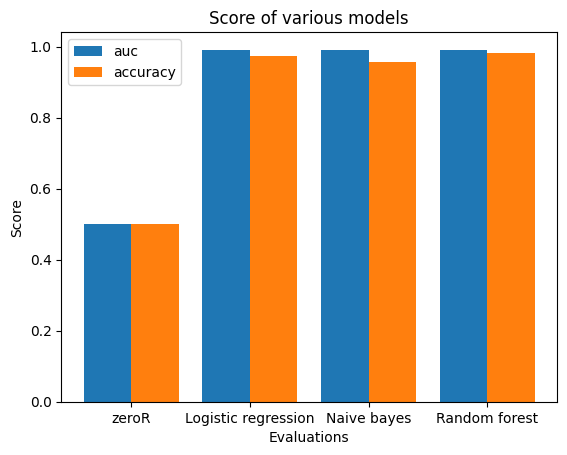

F1:  0.9739681127819845 0.9592441893459575 0.981382419528791
auc:  [0.5, 0.9895467790935583, 0.9911711823423647, 0.9894289788579577]
accuracy:  [0.5, 0.9732283464566929, 0.9574803149606299, 0.9811023622047245]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

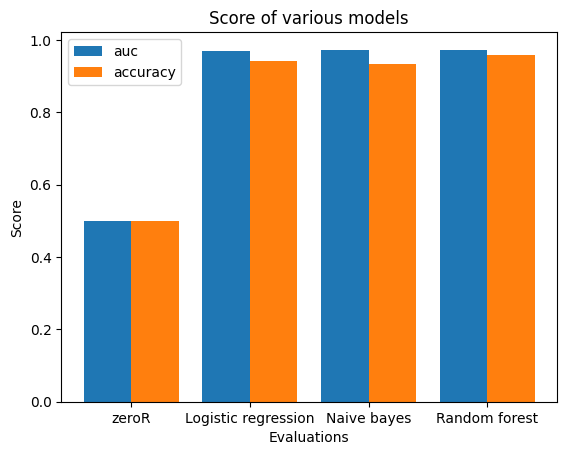

F1:  0.9434494243155237 0.9375176688323107 0.959347346884711
auc:  [0.5, 0.9693913368256674, 0.9717441012640787, 0.9727346608625538]
accuracy:  [0.5, 0.9414330737856879, 0.9324119391916945, 0.9582295142751205]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

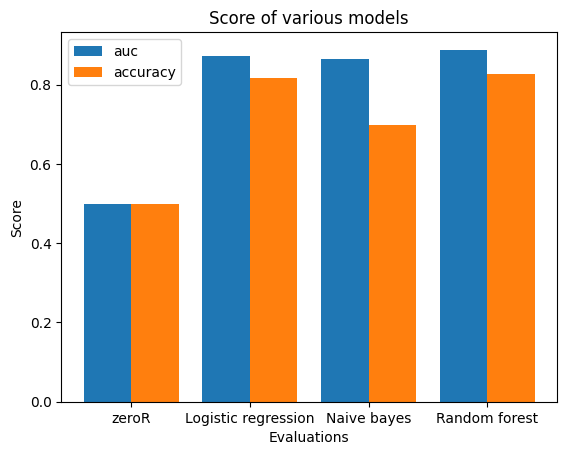

F1:  0.8351061041077723 0.7672802539882196 0.8385634792617188
auc:  [0.5, 0.8729491242373865, 0.8661669978423052, 0.888362351996797]
accuracy:  [0.5, 0.8173933286128597, 0.6978602675150586, 0.8265491074748376]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

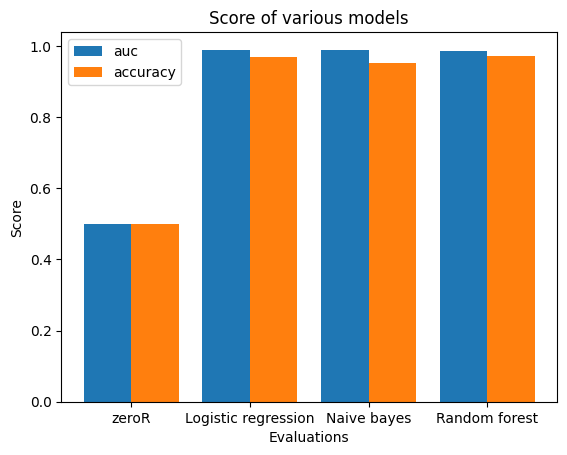

F1:  0.9713508802560563 0.9542618795511288 0.9740648163584158
auc:  [0.5, 0.9893866322580644, 0.9899553032258065, 0.9853944774193548]
accuracy:  [0.5, 0.9703646586345381, 0.9519261044176707, 0.9735614457831325]


In [168]:
clustering_modeling(niddm_na_fiveten[(niddm_na_fiveten["Sex_binary"] == 1)],question_hb1ac, 2,5)

### Ten year

#### questionnaire only

MinMax
MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (4462, 52)
Test shape:  (558, 66)
Y:  0
Q:  0
[[  0. 558.]]
Y:  0
Q:  1
[[   0. 1889.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3022, 52)
Test shape:  (378, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[1.000e+00 2.789e+03]]
Y:  1
Q:  1
[[  1. 378.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3502, 52)
Test shape:  (438, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  0.  21.]
 [  1. 417.]]
Y:  0
Q:  1
[[0.00e+00 1.65e+03]
 [1.00e+00 1.00e+00]]
Y:  0
Q:  2
[[  0. 838.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2642, 52)
Test shape:  (330, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[1.000e+00 2.189e+03]]
Y:  1
Q:  1
[[  1. 330.]]
Y:  1
Q:  2
[[  1. 838.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1340, 52)
Test shape:  (168, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[   0. 2189.]]
Y:  2
Q:  1
[[0.000e+00 1.649e+03]
 [1.000e+00 2.000e+00]]
Y:  2
Q:  2
[[  0. 163.]
 [  1.   5.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2328, 52)
Test shape:  (291, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 291.]]
Y:  0
Q:  1
[[   0. 1155.]]
Y:  0
Q:  2
[[  0. 834.]]
Y:  0
Q:  3
[[0.000e+00 1.233e+03]
 [1.000e+00 1.000e+00]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1848, 52)
Test shape:  (231, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[   0. 1455.]]
Y:  1
Q:  1
[[  1. 231.]]
Y:  1
Q:  2
[[  0. 834.]]
Y:  1
Q:  3
[[   0. 1234.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1334, 52)
Test shape:  (167, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[   0. 1455.]]
Y:  2
Q:  1
[[   0. 1155.]]
Y:  2
Q:  2
[[  1. 167.]]
Y:  2
Q:  3
[[0.000e+00 1.222e+03]
 [1.000e+00 1.200e+01]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1974, 52)
Test shape:  (247, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[1.000e+00 1.455e+03]]
Y:  3
Q:  1
[[   0. 1155.]]
Y:  3
Q:  2
[[  1. 834.]]
Y:  3
Q:  3
[[  1. 247.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2080, 52)
Test shape:  (260, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  0. 180.]
 [  1.  80.]]
Y:  0
Q:  1
[[   0. 1080.]]
Y:  0
Q:  2
[[  0. 536.]
 [  1.  20.]]
Y:  0
Q:  3
[[  0. 950.]]
Y:  0
Q:  4
[[  0. 792.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1728, 52)
Test shape:  (216, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[   0. 1300.]]
Y:  1
Q:  1
[[  1. 216.]]
Y:  1
Q:  2
[[  0. 481.]
 [  1.  75.]]
Y:  1
Q:  3
[[  0. 950.]]
Y:  1
Q:  4
[[  0. 792.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (890, 52)
Test shape:  (111, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 711.]
 [  1. 589.]]
Y:  2
Q:  1
[[  0. 599.]
 [  1. 481.]]
Y:  2
Q:  2
[[  1. 111.]]
Y:  2
Q:  3
[[  0. 487.]
 [  1. 463.]]
Y:  2
Q:  4
[[  0. 446.]
 [  1. 346.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1520, 52)
Test shape:  (190, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[0.00e+00 1.00e+01]
 [1.00e+00 1.29e+03]]
Y:  3
Q:  1
[[   0. 1080.]]
Y:  3
Q:  2
[[  0. 105.]
 [  1. 451.]]
Y:  3
Q:  3
[[  1. 190.]]
Y:  3
Q:  4
[[  1. 792.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1268, 52)
Test shape:  (158, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[   0. 1300.]]
Y:  4
Q:  1
[[   0. 1080.]]
Y:  4
Q:  2
[[  0. 504.]
 [  1.  52.]]
Y:  4
Q:  3
[[  0. 948.]
 [  1.   2.]]
Y:  4
Q:  4
[[  1. 158.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

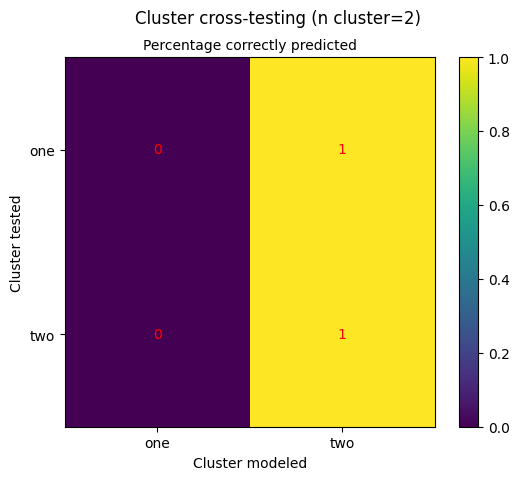

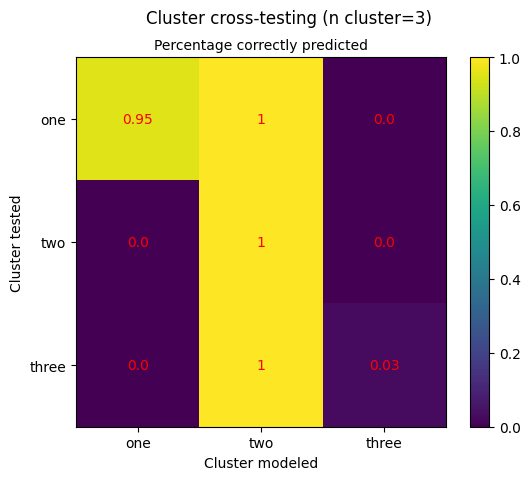

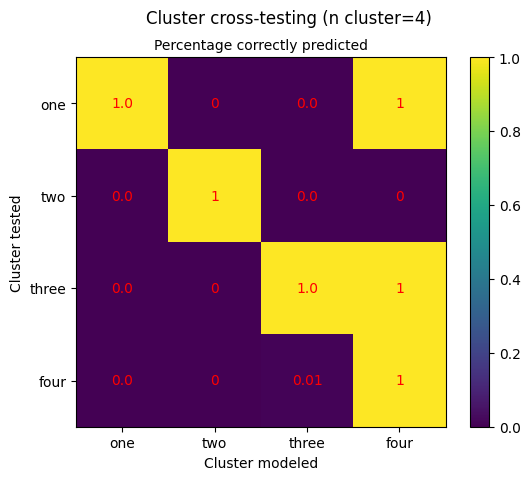

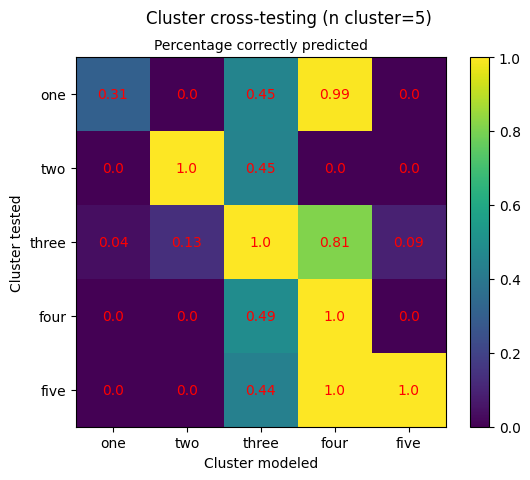

In [143]:
visualize_cross(clustering_analysis(niddm_na_ten,question))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses of mother                                          0
Illnesse

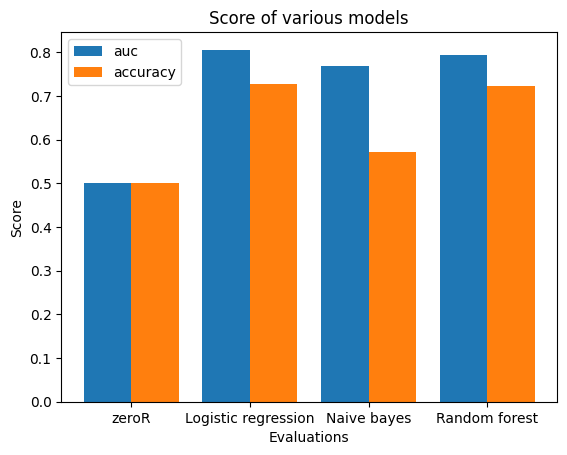

F1:  0.7359895668428441 0.6998270020492899 0.7281524558507736
auc:  [0.5, 0.8057266743136824, 0.7690753403271184, 0.7930783509920541]
accuracy:  [0.5, 0.7265646187133791, 0.5710644528826347, 0.7216069563177001]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

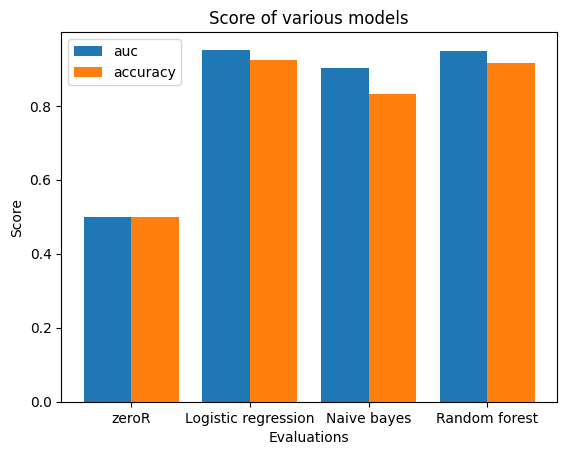

F1:  0.9284572969806407 0.8380458977238762 0.9208295667376788
auc:  [0.5, 0.9516131687242798, 0.9019327846364884, 0.9479368998628258]
accuracy:  [0.5, 0.922962962962963, 0.8311111111111111, 0.9162962962962963]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

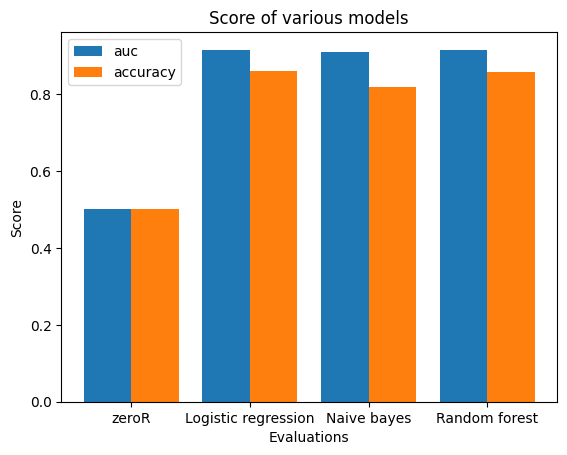

F1:  0.8645871108050833 0.846841115270797 0.8660881616945738
auc:  [0.5, 0.9152261107984818, 0.9090300642952072, 0.9148034626022198]
accuracy:  [0.5, 0.8588235294117648, 0.8190311418685121, 0.8560553633217993]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

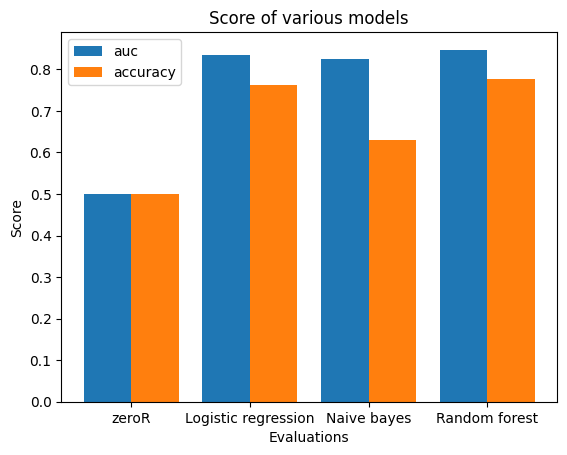

F1:  0.7784883582000054 0.7282994383320301 0.7849406335849083
auc:  [0.5, 0.8341533871874304, 0.8250157636649244, 0.8472022529568111]
accuracy:  [0.5, 0.7633669101792553, 0.6290927815144981, 0.7760083244832062]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

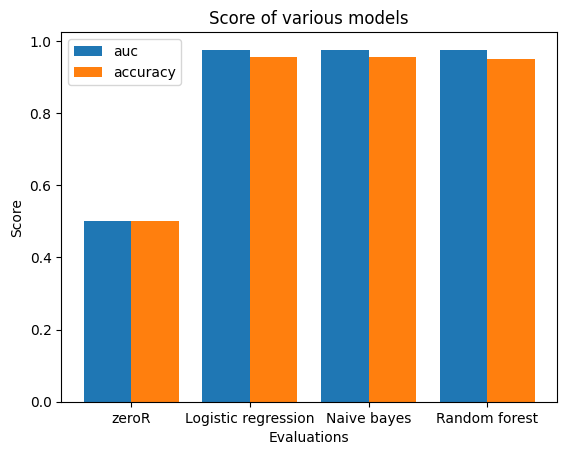

F1:  0.9579718398545254 0.9579718398545254 0.9516025432781993
auc:  [0.5, 0.9757659131469364, 0.9750706424747174, 0.9740630577037478]
accuracy:  [0.5, 0.9560975609756097, 0.9560975609756097, 0.95]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Di

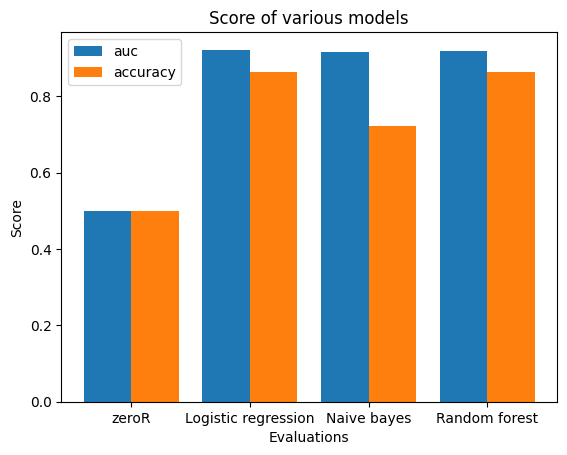

F1:  0.8671015503967449 0.7818249479162808 0.8724372903700408
auc:  [0.5, 0.9217066560909511, 0.9167327648886245, 0.9196493489325137]
accuracy:  [0.5, 0.8621951219512195, 0.7207317073170731, 0.8646341463414634]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

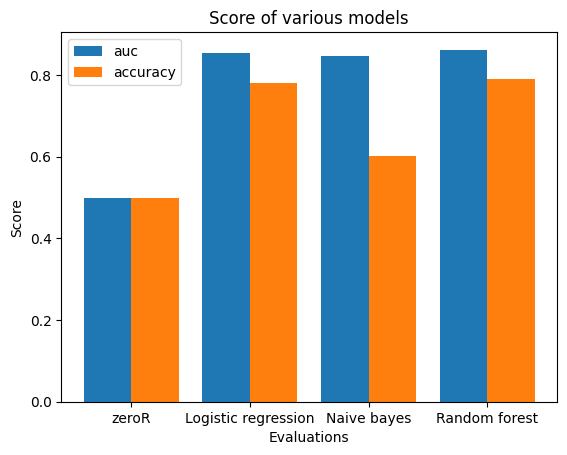

F1:  0.7949235018063768 0.7153374173343618 0.7950465234233574
auc:  [0.5, 0.8530458683075457, 0.8466478577111035, 0.8619826292489947]
accuracy:  [0.5, 0.7816993018900051, 0.6020057892048357, 0.7905159203132982]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

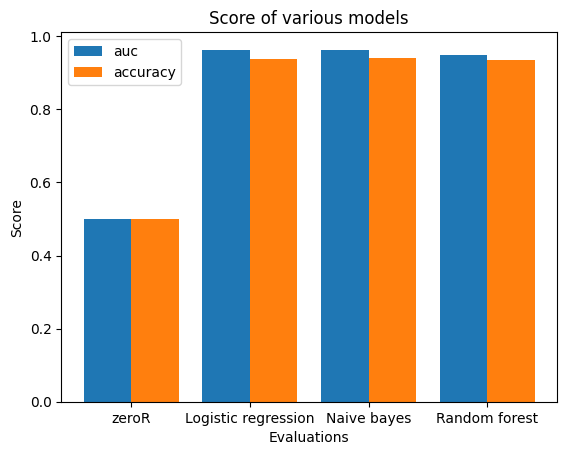

F1:  0.9419715289886337 0.9436009161499358 0.9377289520228423
auc:  [0.5, 0.9614208436753079, 0.9629215791046148, 0.94853833425262]
accuracy:  [0.5, 0.9381606342088404, 0.9399503523382448, 0.934581197950032]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

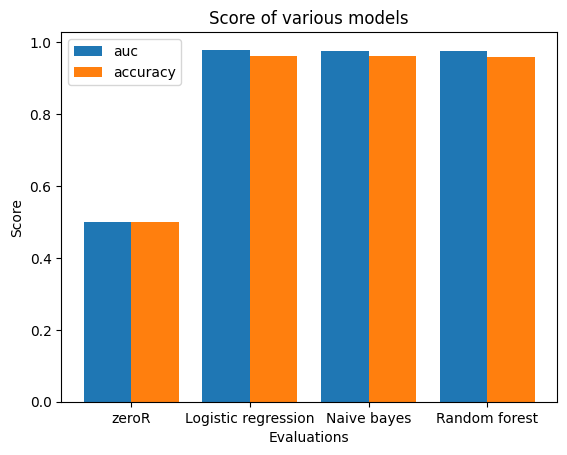

F1:  0.9623703811888418 0.9623703811888418 0.9596988605710245
auc:  [0.5, 0.9790778469423643, 0.9766675837104802, 0.9743752009182531]
accuracy:  [0.5, 0.9608593219662181, 0.9608593219662181, 0.9583376592261311]


In [169]:
clustering_modeling(niddm_na_ten,question, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (996, 52)
Test shape:  (124, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Y:  0
Q:  0
[[  1. 124.]]
Y:  0
Q:  1
[[   0. 1266.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2026, 52)
Test shape:  (253, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 621.]
 [  1.   1.]]
Y:  1
Q:  1
[[  1. 253.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (662, 52)
Test shape:  (83, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[ 1. 83.]]
Y:  0
Q:  1
[[  0. 143.]
 [  1. 418.]]
Y:  0
Q:  2
[[  0. 116.]
 [  1. 797.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (898, 52)
Test shape:  (112, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  1. 414.]]
Y:  1
Q:  1
[[  1. 112.]]
Y:  1
Q:  2
[[  1. 913.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1460, 52)
Test shape:  (183, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 213.]
 [  1. 201.]]
Y:  2
Q:  1
[[  0. 561.]]
Y:  2
Q:  2
[[  1. 183.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (304, 52)
Test shape:  (38, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 38.]]
Y:  0
Q:  1
[[  0. 463.]
 [  1.   4.]]
Y:  0
Q:  2
[[  0. 842.]
 [  1.   2.]]
Y:  0
Q:  3
[[  0. 384.]
 [  1.   3.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (748, 52)
Test shape:  (93, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 129.]
 [  1.  61.]]
Y:  1
Q:  1
[[ 1. 93.]]
Y:  1
Q:  2
[[  0. 844.]]
Y:  1
Q:  3
[[  0. 387.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1350, 52)
Test shape:  (169, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 161.]
 [  1.  29.]]
Y:  2
Q:  1
[[  0. 467.]]
Y:  2
Q:  2
[[  1. 169.]]
Y:  2
Q:  3
[[  0. 387.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (620, 52)
Test shape:  (77, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 175.]
 [  1.  15.]]
Y:  3
Q:  1
[[  0. 467.]]
Y:  3
Q:  2
[[  0. 844.]]
Y:  3
Q:  3
[[ 1. 77.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (302, 52)
Test shape:  (38, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 38.]]
Y:  0
Q:  1
[[  0. 463.]
 [  1.   4.]]
Y:  0
Q:  2
[[  0. 229.]
 [  1.   1.]]
Y:  0
Q:  3
[[  0. 384.]
 [  1.   3.]]
Y:  0
Q:  4
[[  0. 613.]
 [  1.   2.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (748, 52)
Test shape:  (93, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 128.]
 [  1.  61.]]
Y:  1
Q:  1
[[ 1. 93.]]
Y:  1
Q:  2
[[  0. 230.]]
Y:  1
Q:  3
[[  0. 387.]]
Y:  1
Q:  4
[[  0. 615.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (368, 52)
Test shape:  (46, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 114.]
 [  1.  75.]]
Y:  2
Q:  1
[[  0. 324.]
 [  1. 143.]]
Y:  2
Q:  2
[[ 1. 46.]]
Y:  2
Q:  3
[[  0. 288.]
 [  1.  99.]]
Y:  2
Q:  4
[[  0. 615.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (620, 52)
Test shape:  (77, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 174.]
 [  1.  15.]]
Y:  3
Q:  1
[[  0. 466.]
 [  1.   1.]]
Y:  3
Q:  2
[[  0. 230.]]
Y:  3
Q:  3
[[ 1. 77.]]
Y:  3
Q:  4
[[  0. 615.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (984, 52)
Test shape:  (123, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 117.]
 [  1.  72.]]
Y:  4
Q:  1
[[  0. 467.]]
Y:  4
Q:  2
[[  0. 230.]]
Y:  4
Q:  3
[[  0. 387.]]
Y:  4
Q:  4
[[  1. 123.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

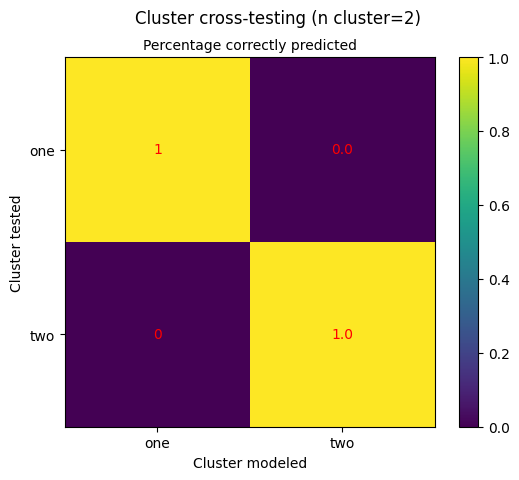

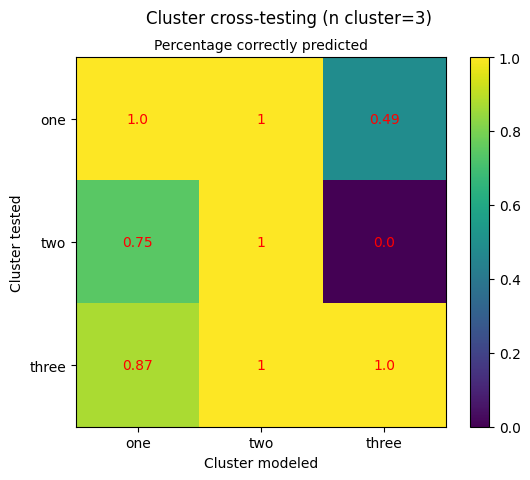

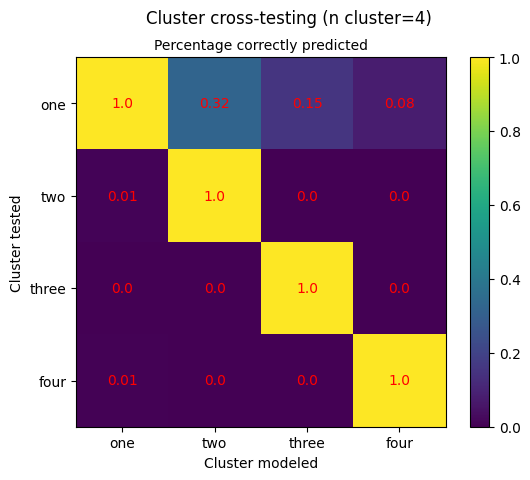

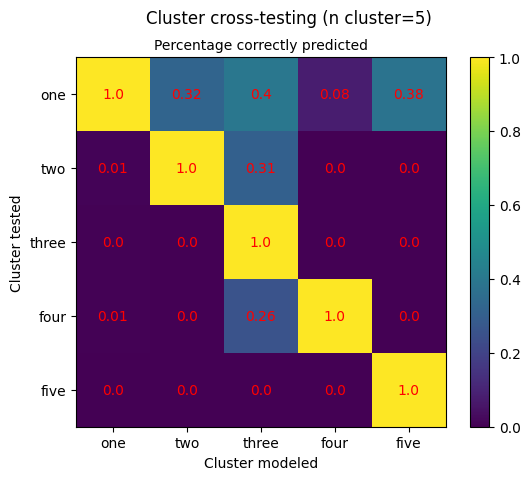

In [144]:
visualize_cross(clustering_analysis(niddm_na_ten[(niddm_na_ten["Sex_binary"] == 0)],question))

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

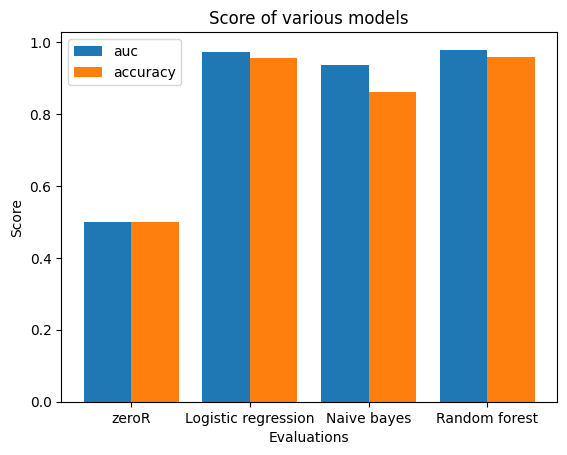

F1:  0.9583375675036563 0.869294516823121 0.9587384600725041
auc:  [0.5, 0.973002235420195, 0.9350634272036443, 0.9786616518704171]
accuracy:  [0.5, 0.9567711962833914, 0.8621868259498922, 0.9575908412145346]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

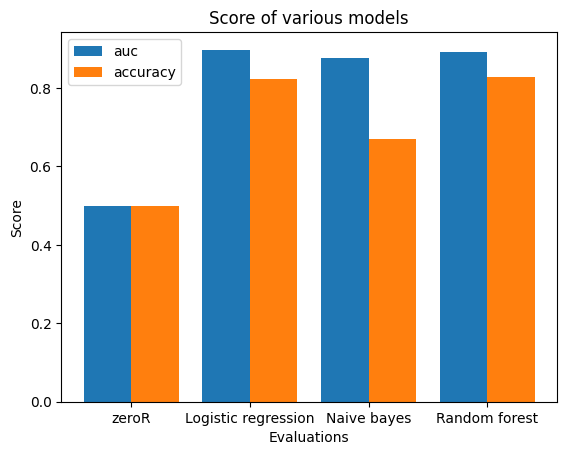

F1:  0.8337261387508799 0.7522165527721161 0.836400202978528
auc:  [0.5, 0.8972918108419838, 0.8769242599000384, 0.8916432141484044]
accuracy:  [0.5, 0.8239215686274509, 0.6709803921568628, 0.8290196078431372]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

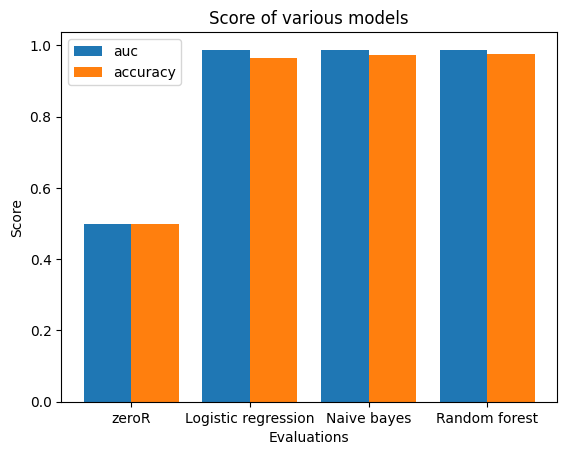

F1:  0.9653202950507022 0.972496421318952 0.9749731794869473
auc:  [0.5, 0.98589567251462, 0.986347134502924, 0.9876058479532164]
accuracy:  [0.5, 0.9641147902869758, 0.9720529801324503, 0.9747019867549669]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood

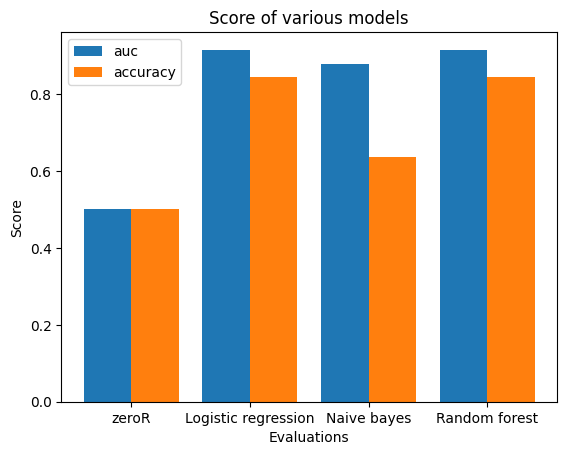

F1:  0.8536256890589634 0.7339593754799683 0.8516646122697696
auc:  [0.5, 0.9155902238750803, 0.879618364163307, 0.9140974295402894]
accuracy:  [0.5, 0.844898638458098, 0.6373066641703332, 0.844436816758719]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

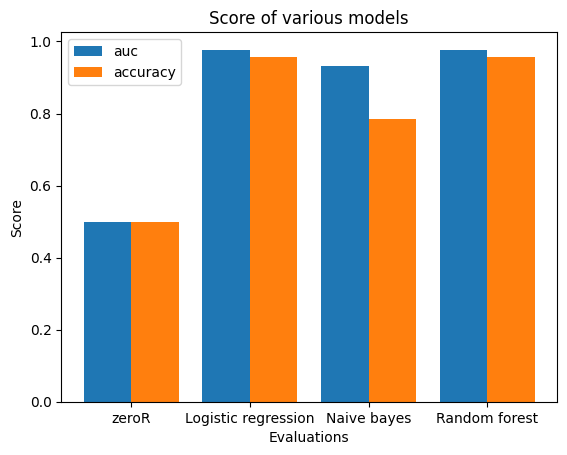

F1:  0.9598131700267757 0.8213060480095331 0.9577845758893163
auc:  [0.5, 0.9763321789740719, 0.9316788669307177, 0.9770308428205075]
accuracy:  [0.5, 0.9579106846547868, 0.7848712214125965, 0.9567347233244354]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

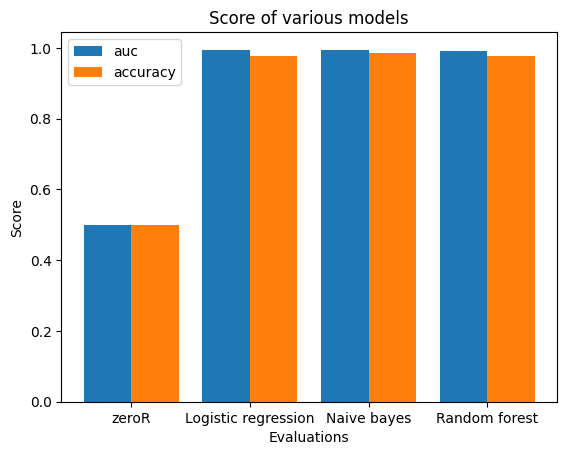

F1:  0.9788329287423009 0.9853123213524507 0.9783971663076492
auc:  [0.5, 0.99319868173258, 0.9949764595103578, 0.9927660075329567]
accuracy:  [0.5, 0.9782633053221288, 0.9849579831932773, 0.9782773109243698]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

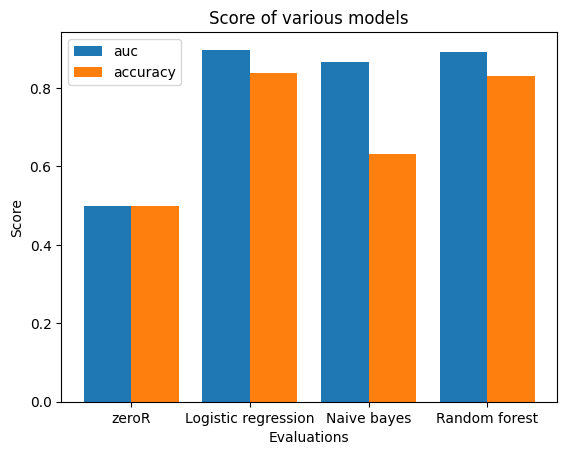

F1:  0.8498160085229999 0.7309601246397994 0.8406038257399281
auc:  [0.5, 0.8972257572914357, 0.8662809650265083, 0.8923685532373842]
accuracy:  [0.5, 0.8389698463714752, 0.6318500951727151, 0.8312093695717748]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

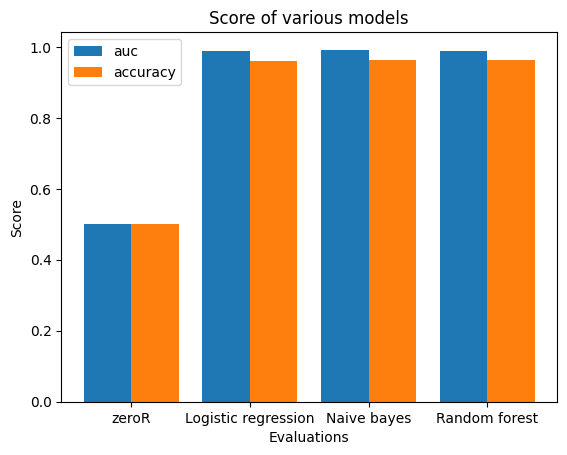

F1:  0.9615312306740879 0.965357679914071 0.964163867114595
auc:  [0.5, 0.9891862833861476, 0.9918609476384488, 0.9876612720688094]
accuracy:  [0.5, 0.9599104143337066, 0.9641209406494962, 0.9640761478163494]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

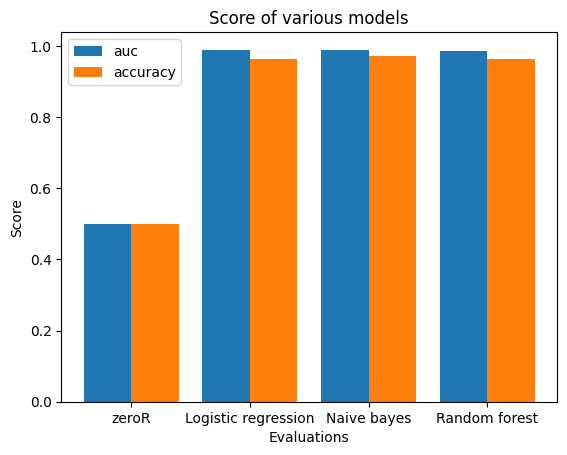

F1:  0.9649800093489413 0.9722622415844446 0.9638620455452138
auc:  [0.5, 0.9886670807086032, 0.989305888267826, 0.9851462455268684]
accuracy:  [0.5, 0.9627831715210355, 0.9706072720350276, 0.9628212450028555]


In [171]:
clustering_modeling(niddm_na_ten[(niddm_na_ten["Sex_binary"] == 0)],question, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

MinMax
modeling...
Trainings shape:  (1872, 52)
Test shape:  (234, 66)
Y:  0
Q:  0
[[  0.  19.]
 [  1. 215.]]
Y:  0
Q:  1
[[   0. 1620.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2592, 52)
Test shape:  (324, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 705.]
 [  1. 465.]]
Y:  1
Q:  1
[[  1. 324.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (960, 52)
Test shape:  (120, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  0. 106.]
 [  1.  14.]]
Y:  0
Q:  1
[[   0. 1600.]]
Y:  0
Q:  2
[[  0. 590.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2560, 52)
Test shape:  (320, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 600.]]
Y:  1
Q:  1
[[  1. 320.]]
Y:  1
Q:  2
[[  0. 590.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (944, 52)
Test shape:  (118, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 600.]]
Y:  2
Q:  1
[[   0. 1600.]]
Y:  2
Q:  2
[[ 0. 86.]
 [ 1. 32.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (884, 52)
Test shape:  (111, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 111.]]
Y:  0
Q:  1
[[  0. 602.]
 [  1.  12.]]
Y:  0
Q:  2
[[  0. 451.]
 [  1. 131.]]
Y:  0
Q:  3
[[   0. 1041.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (982, 52)
Test shape:  (123, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 391.]
 [  1. 162.]]
Y:  1
Q:  1
[[  1. 123.]]
Y:  1
Q:  2
[[  0. 580.]
 [  1.   2.]]
Y:  1
Q:  3
[[  0. 531.]
 [  1. 510.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (932, 52)
Test shape:  (116, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 545.]
 [  1.   8.]]
Y:  2
Q:  1
[[  0. 614.]]
Y:  2
Q:  2
[[  1. 116.]]
Y:  2
Q:  3
[[   0. 1041.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1666, 52)
Test shape:  (208, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 552.]
 [  1.   1.]]
Y:  3
Q:  1
[[  0. 614.]]
Y:  3
Q:  2
[[  0. 582.]]
Y:  3
Q:  3
[[  1. 208.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (892, 52)
Test shape:  (111, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 111.]]
Y:  0
Q:  1
[[  0. 309.]]
Y:  0
Q:  2
[[  0. 590.]]
Y:  0
Q:  3
[[  0. 600.]]
Y:  0
Q:  4
[[  0. 734.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (494, 52)
Test shape:  (62, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 557.]]
Y:  1
Q:  1
[[ 1. 62.]]
Y:  1
Q:  2
[[  0. 590.]]
Y:  1
Q:  3
[[  0. 600.]]
Y:  1
Q:  4
[[  0. 734.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (944, 52)
Test shape:  (118, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 557.]]
Y:  2
Q:  1
[[  0. 309.]]
Y:  2
Q:  2
[[  0. 101.]
 [  1.  17.]]
Y:  2
Q:  3
[[  0. 600.]]
Y:  2
Q:  4
[[  0. 734.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (960, 52)
Test shape:  (120, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 557.]]
Y:  3
Q:  1
[[  0. 309.]]
Y:  3
Q:  2
[[  0. 590.]]
Y:  3
Q:  3
[[  0.   8.]
 [  1. 112.]]
Y:  3
Q:  4
[[  0. 734.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1174, 52)
Test shape:  (147, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 557.]]
Y:  4
Q:  1
[[  0. 309.]]
Y:  4
Q:  2
[[  0. 590.]]
Y:  4
Q:  3
[[  0. 600.]]
Y:  4
Q:  4
[[  0.   5.]
 [  1. 142.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

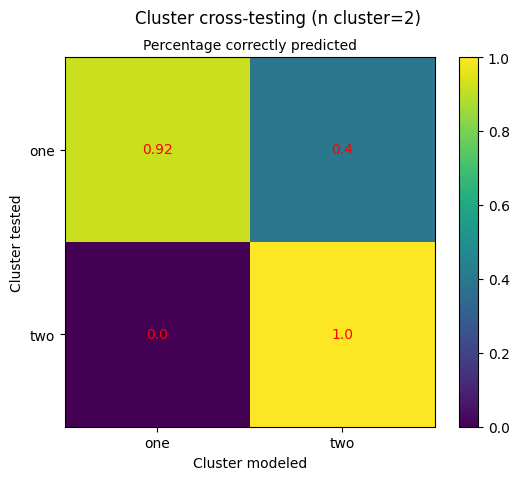

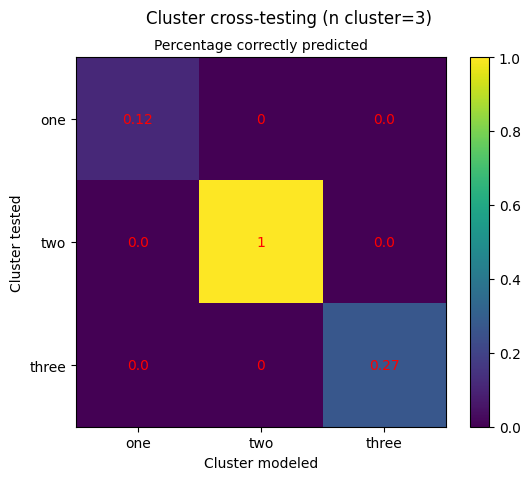

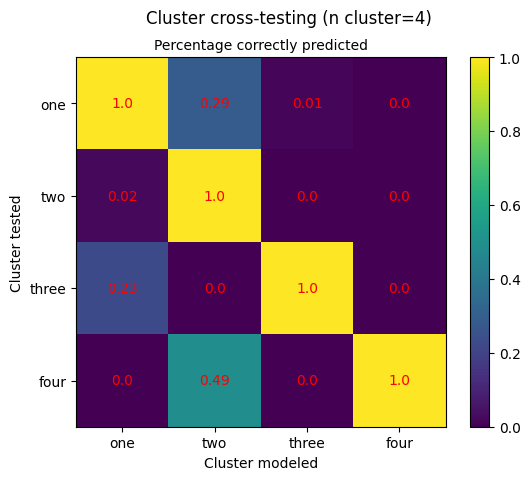

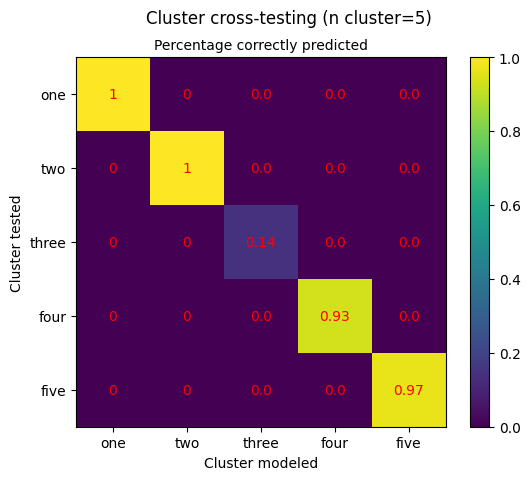

In [145]:
visualize_cross(clustering_analysis(niddm_na_ten[(niddm_na_ten["Sex_binary"] == 1)],question))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

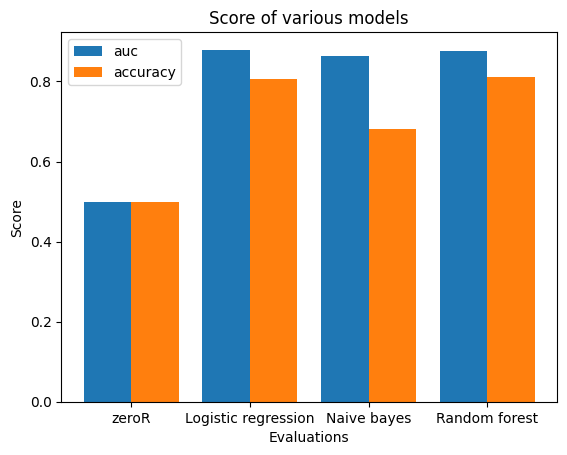

F1:  0.8246496853624661 0.7578790915715685 0.82654932363414
auc:  [0.5, 0.8793188869941838, 0.8643080054713761, 0.8773433433605783]
accuracy:  [0.5, 0.8069072710386906, 0.6820132564016976, 0.8118104139276234]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

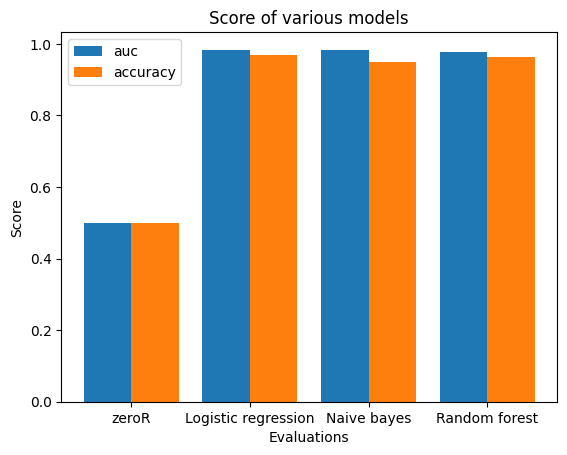

F1:  0.9694814715638286 0.9517790444311499 0.9646134065578446
auc:  [0.5, 0.9830433485211922, 0.9838312426116996, 0.9785096578714808]
accuracy:  [0.5, 0.968469497873421, 0.9493239382974671, 0.9639433758649146]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

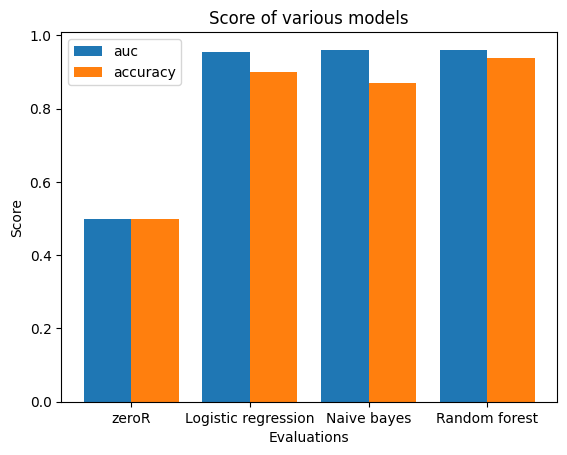

F1:  0.9041987419601288 0.8853824013502516 0.9411236152515918
auc:  [0.5, 0.9536373452048739, 0.9608877001471978, 0.9606920031455781]
accuracy:  [0.5, 0.8993853993445556, 0.8706936624169754, 0.9386576032519377]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

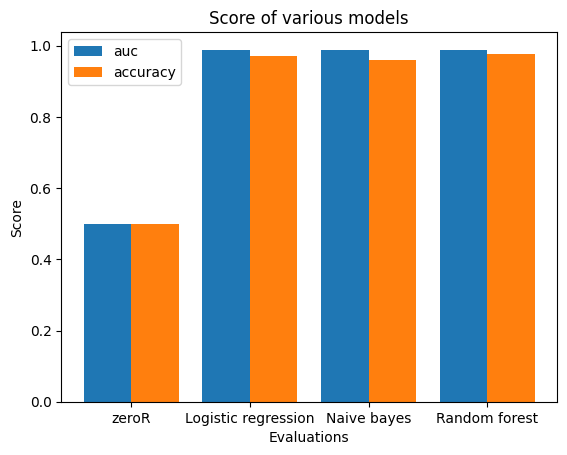

F1:  0.9706182413176141 0.9601497727985807 0.9780287089057469
auc:  [0.5, 0.9878659719273278, 0.9884954838117318, 0.9864786930024905]
accuracy:  [0.5, 0.9695994413762458, 0.9583380943312385, 0.9774582619183647]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

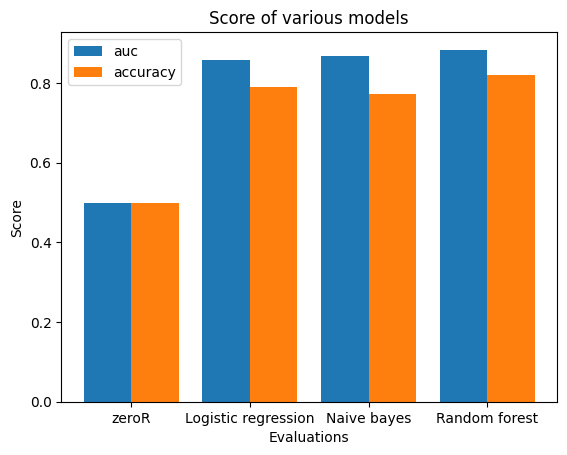

F1:  0.8160561694433358 0.8128281097517935 0.8320534375616826
auc:  [0.5, 0.8575381084962496, 0.8676270960845097, 0.883468324177889]
accuracy:  [0.5, 0.7906164354503415, 0.7720707649229985, 0.819053073692249]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

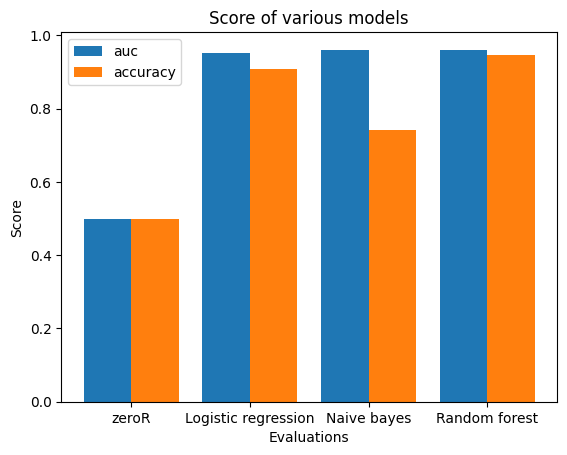

F1:  0.9132385541862733 0.7946987689845874 0.9481526321245572
auc:  [0.5, 0.9533299985766283, 0.959727268414025, 0.9610968502816243]
accuracy:  [0.5, 0.909139806209215, 0.7412655724737987, 0.9460984773581175]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

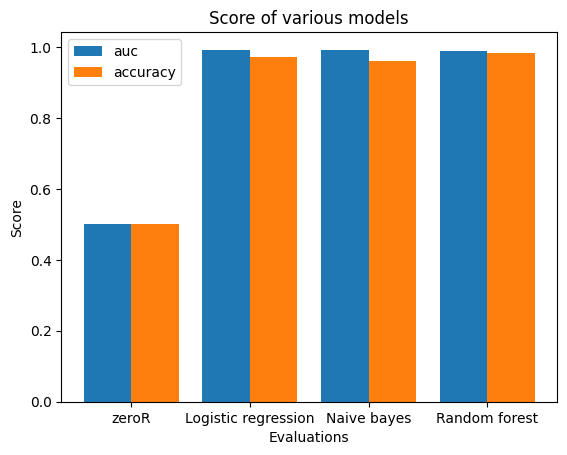

F1:  0.9726525936230476 0.9621596907274657 0.9822702345763988
auc:  [0.5, 0.9924418404471428, 0.9918131893355981, 0.987772291147812]
accuracy:  [0.5, 0.9718529803846886, 0.9605916333396813, 0.9819780359296642]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

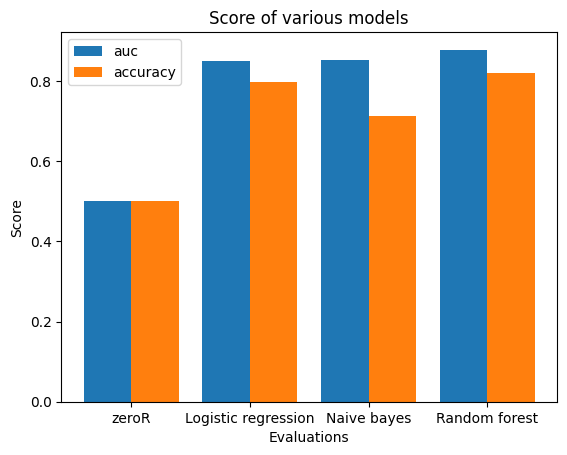

F1:  0.8202573842133214 0.7772452796859579 0.8348230583401446
auc:  [0.5, 0.8510458138901915, 0.8515709662417508, 0.878385629710361]
accuracy:  [0.5, 0.7988071402086975, 0.713176545367869, 0.819523279834737]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

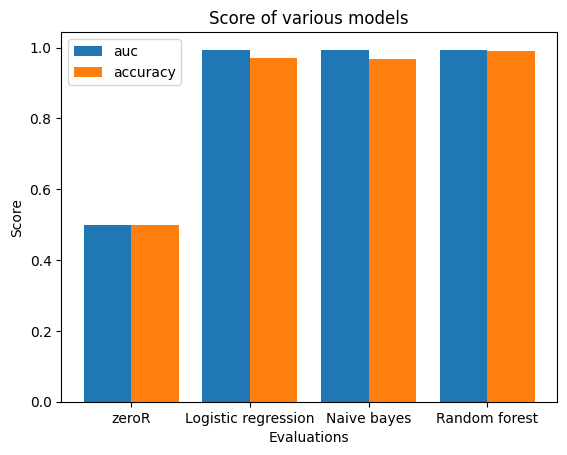

F1:  0.9717196128936517 0.9699512662977189 0.9896551724137931
auc:  [0.5, 0.9927022638265355, 0.9939620679041827, 0.9935688434637714]
accuracy:  [0.5, 0.9702517162471396, 0.9684973302822273, 0.9895041952707856]


In [172]:
clustering_modeling(niddm_na_ten[(niddm_na_ten["Sex_binary"] == 1)],question, 2,5)

#### questionnaire and hba1c

MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (5636, 53)
Test shape:  (705, 66)
Y:  0
Q:  0
[[  1. 705.]]
Y:  0
Q:  1
[[   0. 1155.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1848, 53)
Test shape:  (231, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[   0. 3523.]]
Y:  1
Q:  1
[[  1. 231.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (3288, 53)
Test shape:  (411, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  1. 411.]]
Y:  0
Q:  1
[[0.000e+00 1.153e+03]
 [1.000e+00 2.000e+00]]
Y:  0
Q:  2
[[0.000e+00 1.467e+03]
 [1.000e+00 1.000e+00]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1848, 53)
Test shape:  (231, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[   0. 2055.]]
Y:  1
Q:  1
[[  1. 231.]]
Y:  1
Q:  2
[[   0. 1468.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2348, 53)
Test shape:  (294, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[1.000e+00 2.055e+03]]
Y:  2
Q:  1
[[   0. 1155.]]
Y:  2
Q:  2
[[  1. 294.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2924, 53)
Test shape:  (365, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 365.]]
Y:  0
Q:  1
[[   0. 1264.]]
Y:  0
Q:  2
[[  0. 627.]
 [  1. 231.]]
Y:  0
Q:  3
[[  0. 722.]
 [  1.   7.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2022, 53)
Test shape:  (253, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[0.000e+00 1.812e+03]
 [1.000e+00 1.500e+01]]
Y:  1
Q:  1
[[  1. 253.]]
Y:  1
Q:  2
[[  0. 855.]
 [  1.   3.]]
Y:  1
Q:  3
[[  0. 727.]
 [  1.   2.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1372, 53)
Test shape:  (172, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[0.000e+00 1.459e+03]
 [1.000e+00 3.680e+02]]
Y:  2
Q:  1
[[0.00e+00 1.19e+03]
 [1.00e+00 7.40e+01]]
Y:  2
Q:  2
[[  1. 172.]]
Y:  2
Q:  3
[[  0. 542.]
 [  1. 187.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1166, 53)
Test shape:  (146, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[   0. 1827.]]
Y:  3
Q:  1
[[   0. 1264.]]
Y:  3
Q:  2
[[  0. 852.]
 [  1.   6.]]
Y:  3
Q:  3
[[  1. 146.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2484, 53)
Test shape:  (310, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  0.  25.]
 [  1. 285.]]
Y:  0
Q:  1
[[  0. 836.]]
Y:  0
Q:  2
[[  0. 621.]]
Y:  0
Q:  3
[[  0. 695.]]
Y:  0
Q:  4
[[  0. 974.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1338, 53)
Test shape:  (167, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[   0. 1552.]]
Y:  1
Q:  1
[[  1. 167.]]
Y:  1
Q:  2
[[  0. 617.]
 [  1.   4.]]
Y:  1
Q:  3
[[  0. 695.]]
Y:  1
Q:  4
[[  0. 974.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (994, 53)
Test shape:  (124, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[   0. 1552.]]
Y:  2
Q:  1
[[  0. 836.]]
Y:  2
Q:  2
[[  1. 124.]]
Y:  2
Q:  3
[[  0. 137.]
 [  1. 558.]]
Y:  2
Q:  4
[[  0. 974.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1112, 53)
Test shape:  (139, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[   0. 1552.]]
Y:  3
Q:  1
[[  0. 836.]]
Y:  3
Q:  2
[[  0. 621.]]
Y:  3
Q:  3
[[  1. 139.]]
Y:  3
Q:  4
[[  0. 974.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1558, 53)
Test shape:  (195, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[0.000e+00 1.537e+03]
 [1.000e+00 1.500e+01]]
Y:  4
Q:  1
[[  0. 836.]]
Y:  4
Q:  2
[[  0. 621.]]
Y:  4
Q:  3
[[  0. 695.]]
Y:  4
Q:  4
[[  1. 195.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

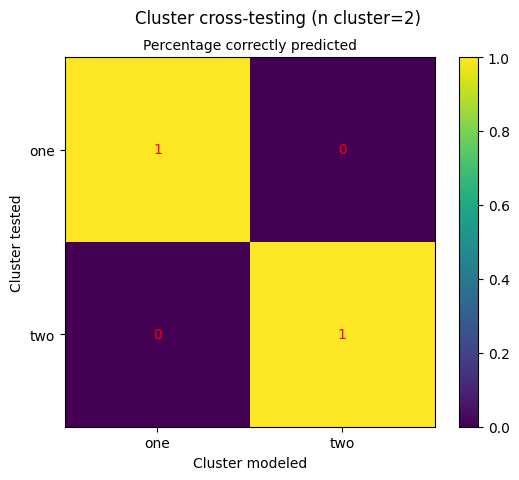

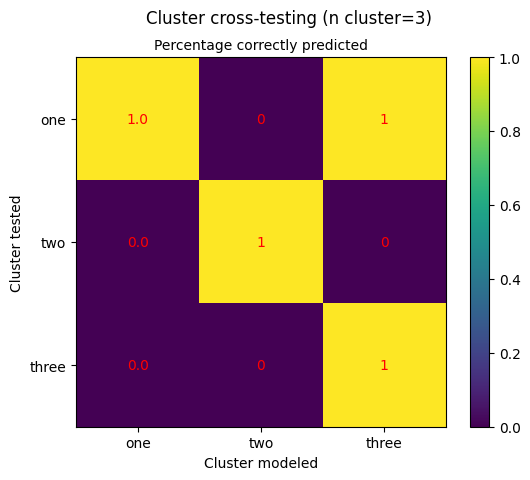

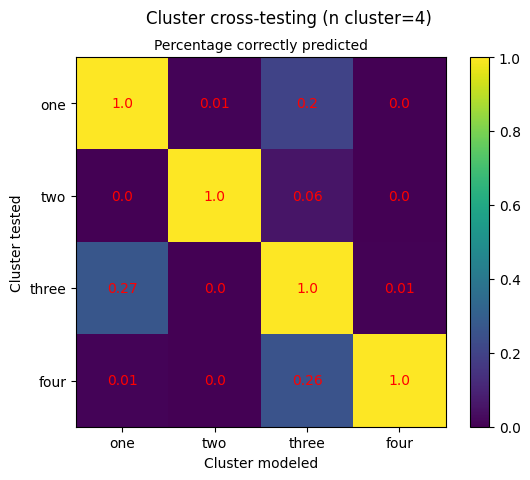

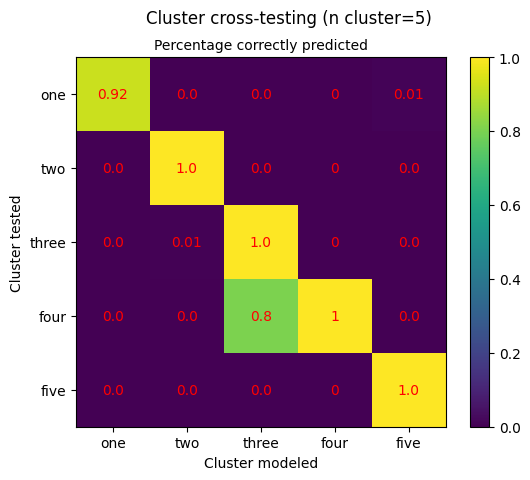

In [146]:
visualize_cross(clustering_analysis(niddm_na_ten,question_hb1ac))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

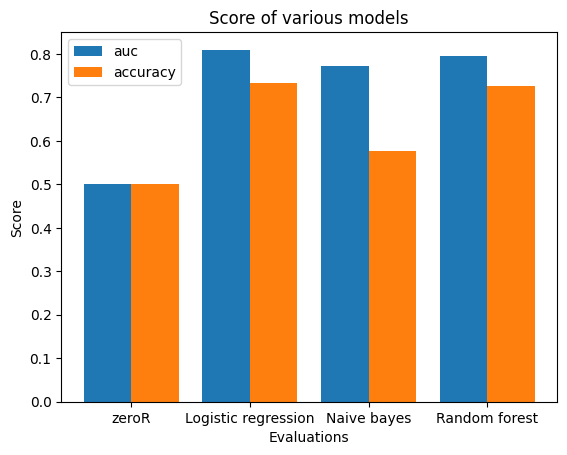

F1:  0.7415391191511053 0.7024938425701248 0.735211637415272
auc:  [0.5, 0.8097299514511463, 0.771609631374923, 0.7960261460403708]
accuracy:  [0.5, 0.7337767895619135, 0.5764733553989753, 0.7270160844541009]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

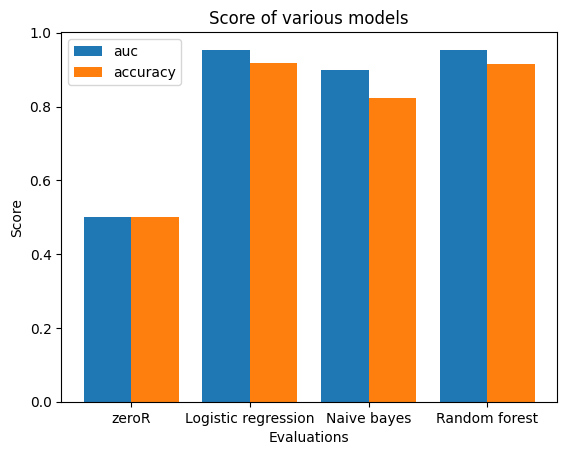

F1:  0.9250402390710951 0.8291687794523257 0.9208889400307352
auc:  [0.5, 0.9522606310013717, 0.898360768175583, 0.9540672153635117]
accuracy:  [0.5, 0.9192592592592593, 0.8240740740740741, 0.9166666666666666]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

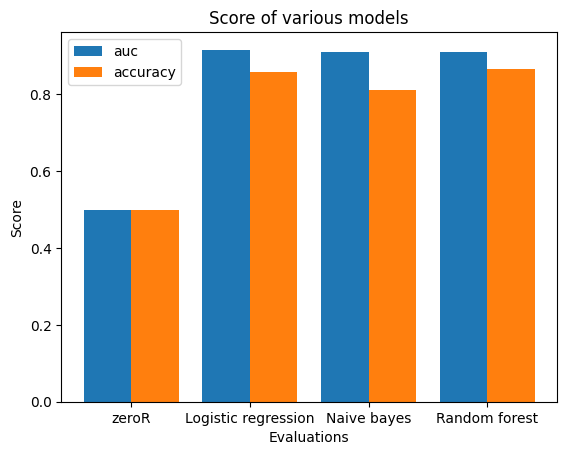

F1:  0.8631400536610782 0.8417285026667263 0.8750062726061432
auc:  [0.5, 0.9159325199650388, 0.9111672513499599, 0.9107625627087799]
accuracy:  [0.5, 0.8577854671280277, 0.8117647058823529, 0.8653979238754326]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

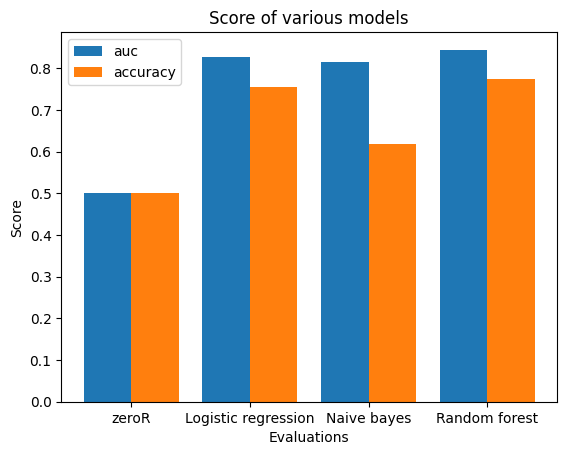

F1:  0.771277721904112 0.7222081016540982 0.7843490796554231
auc:  [0.5, 0.8269113093550609, 0.8156535331517375, 0.8448575439766276]
accuracy:  [0.5, 0.7544537057895923, 0.6176953196236818, 0.7755878093521706]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

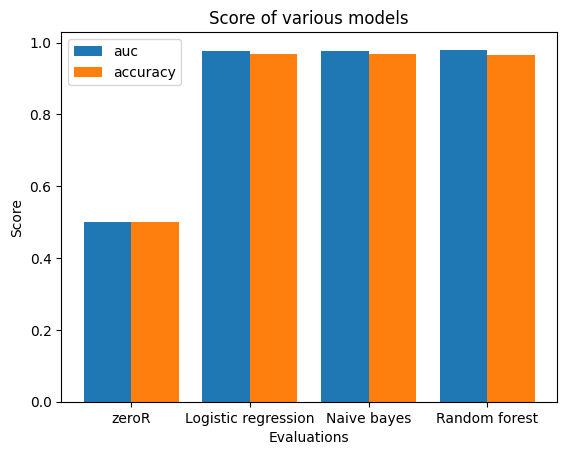

F1:  0.9687737950745822 0.9687737950745822 0.9668861257027328
auc:  [0.5, 0.9770969660916121, 0.9760745092207019, 0.980261005353956]
accuracy:  [0.5, 0.9676829268292683, 0.9676829268292683, 0.9658536585365853]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

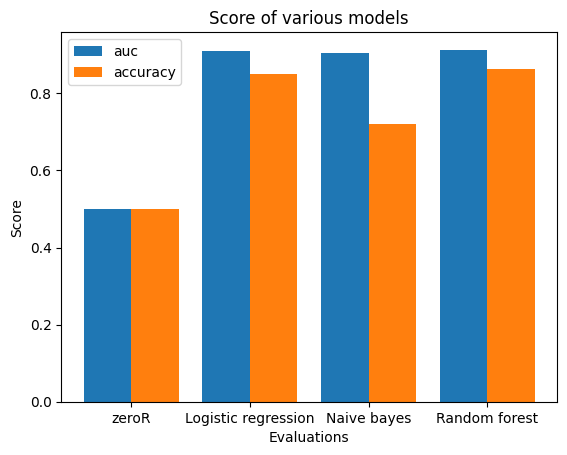

F1:  0.8578076726495779 0.7810417042852285 0.8712647493212211
auc:  [0.5, 0.9111739044219711, 0.9049292749025052, 0.9132923524357195]
accuracy:  [0.5, 0.8512195121951219, 0.7195121951219512, 0.8621951219512195]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

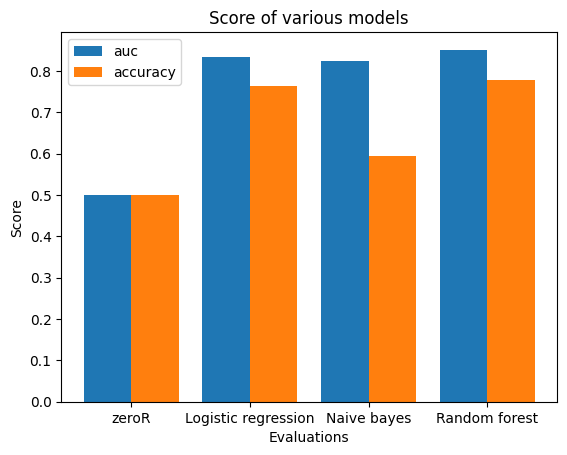

F1:  0.7818514213239074 0.7113393310947264 0.7875801837125548
auc:  [0.5, 0.8336134788044095, 0.8241644613294801, 0.8512108112934911]
accuracy:  [0.5, 0.7642990521596004, 0.5941364436120098, 0.7776477098586753]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

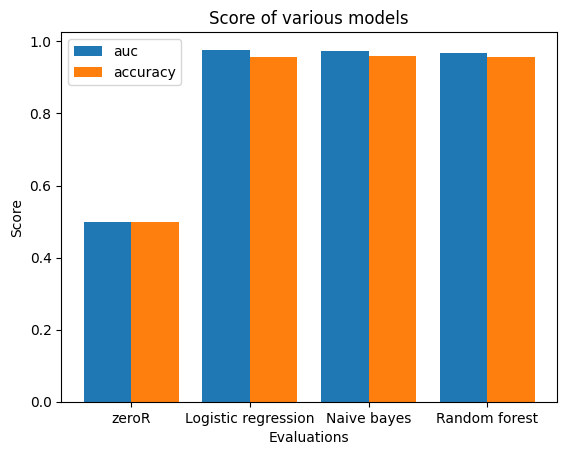

F1:  0.9596757810649801 0.9613116824587685 0.9575502631663634
auc:  [0.5, 0.97677810144328, 0.9723110865968009, 0.9666349943693694]
accuracy:  [0.5, 0.9578715566944267, 0.9596652786675208, 0.9560778347213325]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

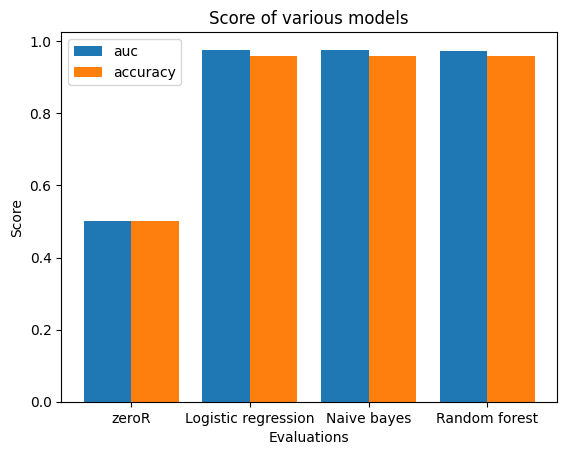

F1:  0.9607763710288646 0.9607763710288646 0.9610430541392389
auc:  [0.5, 0.976523224890383, 0.9750893613847966, 0.9717748022561293]
accuracy:  [0.5, 0.9589705706185361, 0.9589705706185361, 0.9596034820109411]


In [173]:
clustering_modeling(niddm_na_ten,question_hb1ac, 2,5)

MinMax
MinMax
MinMax


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (996, 53)
Test shape:  (124, 66)
Y:  0
Q:  0
[[  1. 124.]]
Y:  0
Q:  1
[[   0. 1266.]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2026, 53)
Test shape:  (253, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[  0. 621.]
 [  1.   1.]]
Y:  1
Q:  1
[[  1. 253.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (662, 53)
Test shape:  (83, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[ 1. 83.]]
Y:  0
Q:  1
[[  0. 143.]
 [  1. 417.]]
Y:  0
Q:  2
[[  0. 347.]
 [  1. 567.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (896, 53)
Test shape:  (112, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  1. 414.]]
Y:  1
Q:  1
[[  1. 112.]]
Y:  1
Q:  2
[[  1. 914.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1462, 53)
Test shape:  (183, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 214.]
 [  1. 200.]]
Y:  2
Q:  1
[[  0. 560.]]
Y:  2
Q:  2
[[  1. 183.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (624, 53)
Test shape:  (78, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 1. 78.]]
Y:  0
Q:  1
[[  0.   5.]
 [  1. 261.]]
Y:  0
Q:  2
[[  0.  18.]
 [  1. 815.]]
Y:  0
Q:  3
[[  0. 127.]
 [  1. 272.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (426, 53)
Test shape:  (53, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 348.]
 [  1.  42.]]
Y:  1
Q:  1
[[ 1. 53.]]
Y:  1
Q:  2
[[  0. 833.]]
Y:  1
Q:  3
[[  0. 334.]
 [  1.  65.]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1332, 53)
Test shape:  (167, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0.  68.]
 [  1. 322.]]
Y:  2
Q:  1
[[  0. 266.]]
Y:  2
Q:  2
[[  1. 167.]]
Y:  2
Q:  3
[[  0. 399.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (638, 53)
Test shape:  (80, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 357.]
 [  1.  33.]]
Y:  3
Q:  1
[[  0. 266.]]
Y:  3
Q:  2
[[  0. 833.]]
Y:  3
Q:  3
[[ 1. 80.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (420, 53)
Test shape:  (52, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 0.  1.]
 [ 1. 51.]]
Y:  0
Q:  1
[[  0. 172.]
 [  1.  50.]]
Y:  0
Q:  2
[[  0. 680.]]
Y:  0
Q:  3
[[  0. 432.]]
Y:  0
Q:  4
[[  0. 292.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (356, 53)
Test shape:  (44, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 242.]
 [  1.  20.]]
Y:  1
Q:  1
[[ 1. 44.]]
Y:  1
Q:  2
[[  0. 680.]]
Y:  1
Q:  3
[[  0. 358.]
 [  1.  74.]]
Y:  1
Q:  4
[[  0. 233.]
 [  1.  59.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1088, 53)
Test shape:  (136, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0.  20.]
 [  1. 242.]]
Y:  2
Q:  1
[[  0. 156.]
 [  1.  66.]]
Y:  2
Q:  2
[[  1. 136.]]
Y:  2
Q:  3
[[  0. 405.]
 [  1.  27.]]
Y:  2
Q:  4
[[  0. 252.]
 [  1.  40.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (692, 53)
Test shape:  (86, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 262.]]
Y:  3
Q:  1
[[  0. 222.]]
Y:  3
Q:  2
[[  0. 680.]]
Y:  3
Q:  3
[[ 1. 86.]]
Y:  3
Q:  4
[[  0. 292.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (468, 53)
Test shape:  (58, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 262.]]
Y:  4
Q:  1
[[  0. 222.]]
Y:  4
Q:  2
[[  0. 680.]]
Y:  4
Q:  3
[[  0. 432.]]
Y:  4
Q:  4
[[ 1. 58.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

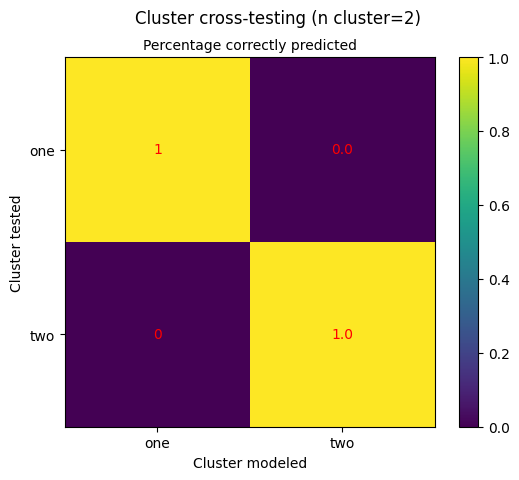

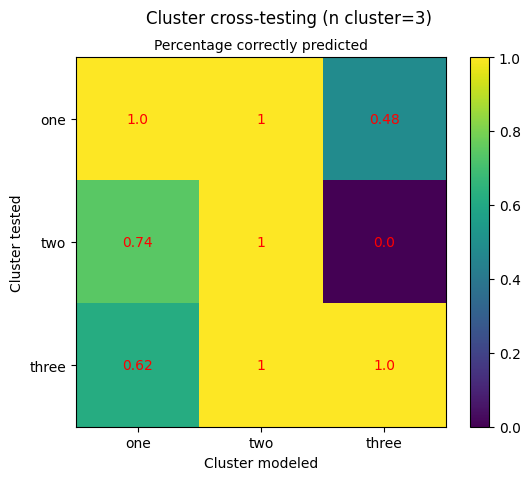

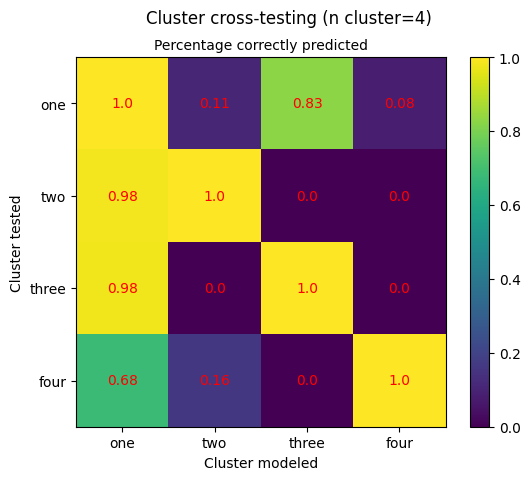

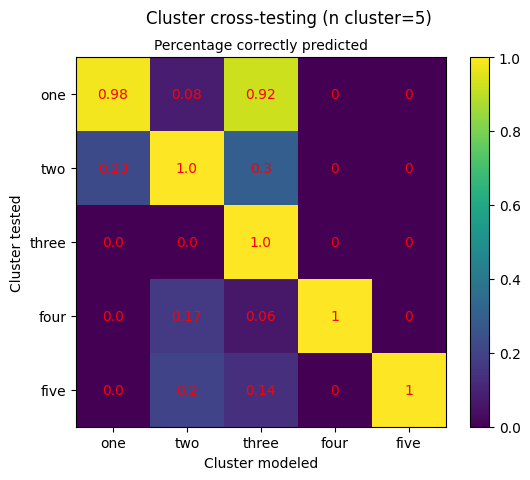

In [176]:
visualize_cross(clustering_analysis(niddm_na_ten[(niddm_na_ten["Sex_binary"] == 0)],question_hb1ac))

Number of clusters:  2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

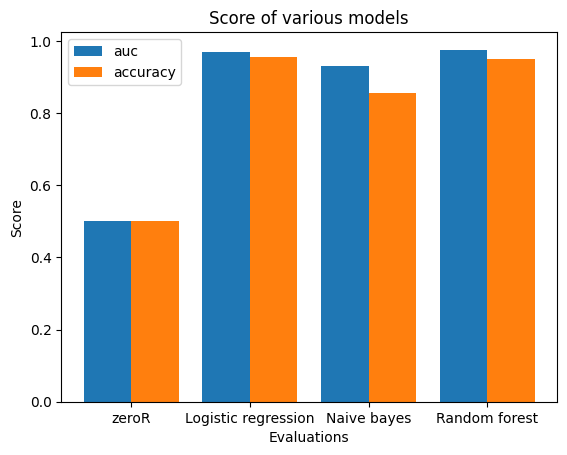

F1:  0.9574716626981958 0.8626182292425283 0.95218793424123
auc:  [0.5, 0.9708926185623311, 0.9316319000854942, 0.9760123051050582]
accuracy:  [0.5, 0.9559482329517173, 0.8548199767711963, 0.9510535921685748]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blo

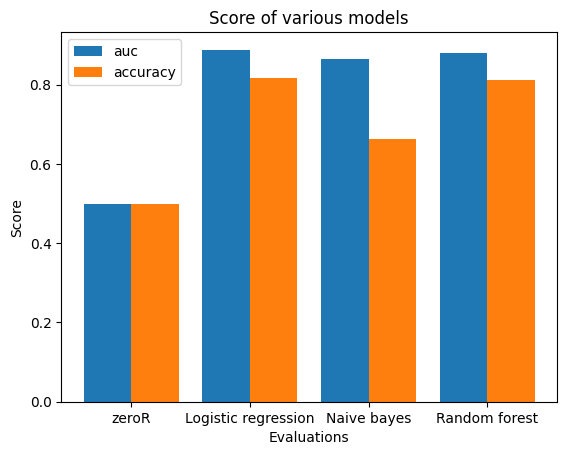

F1:  0.8284921087378788 0.7475966174389358 0.8240143970123688
auc:  [0.5, 0.8883506343713956, 0.8648904267589389, 0.8806782006920415]
accuracy:  [0.5, 0.8164705882352941, 0.6631372549019607, 0.8129411764705883]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0             

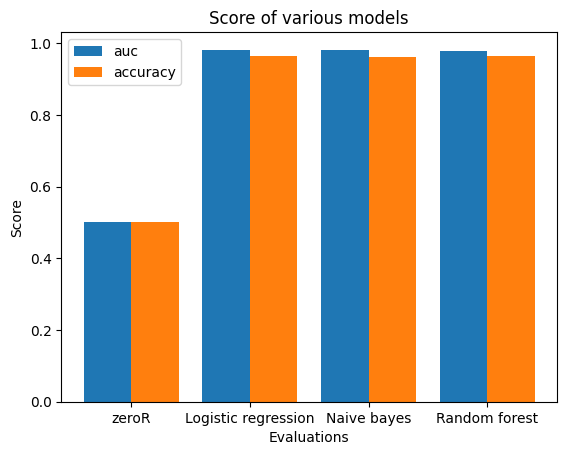

F1:  0.965630088678126 0.96121731042956 0.9660447897290002
auc:  [0.5, 0.9801066666666667, 0.9816781286549707, 0.9788673684210526]
accuracy:  [0.5, 0.9641147902869757, 0.9601059602649007, 0.9654216335540838]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

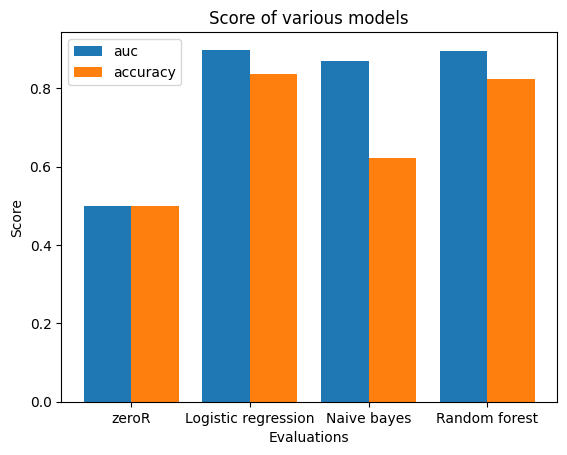

F1:  0.846410907984615 0.7253624279352967 0.8342863297489587
auc:  [0.5, 0.8983592540150994, 0.8686845941115034, 0.8951522449111114]
accuracy:  [0.5, 0.8357672585057364, 0.6213550930404302, 0.8243517333915811]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

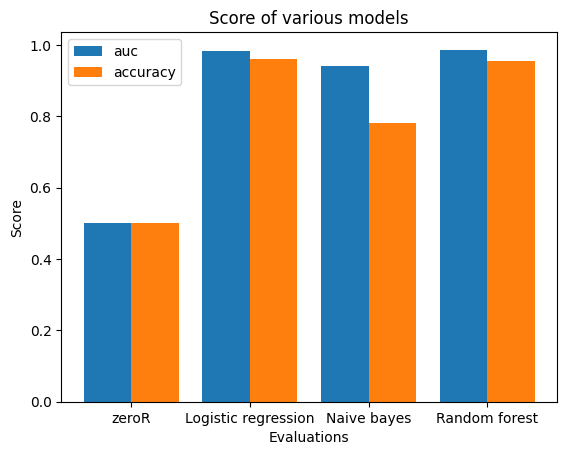

F1:  0.9629186030581879 0.8176152855015673 0.9543975795891878
auc:  [0.5, 0.982911681148, 0.9399093793418078, 0.9869002688896722]
accuracy:  [0.5, 0.9615251424861121, 0.7812495490945819, 0.9542962268234615]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                 

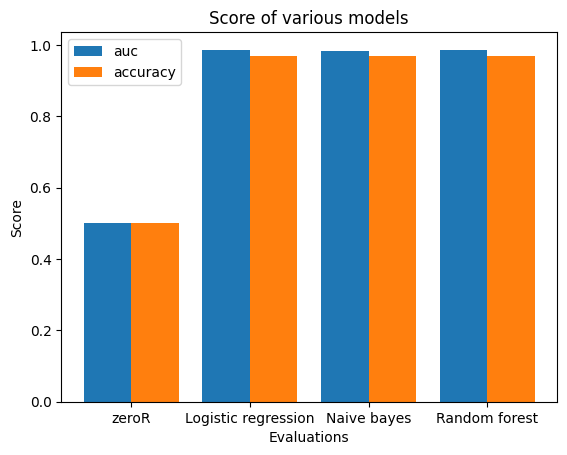

F1:  0.9692363914649195 0.9690242022803426 0.9703818527685344
auc:  [0.5, 0.9862015065913371, 0.9838060263653484, 0.9862297551789078]
accuracy:  [0.5, 0.9682072829131653, 0.9682072829131653, 0.9698879551820728]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

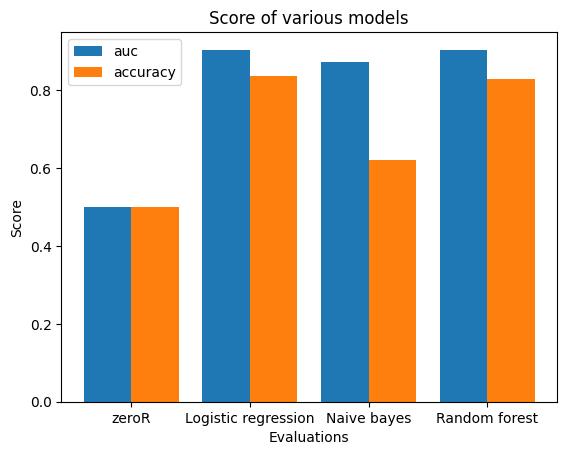

F1:  0.8465175297575367 0.7253680603799499 0.8388673935251558
auc:  [0.5, 0.90406747148725, 0.8721772519717725, 0.9039620259642778]
accuracy:  [0.5, 0.8357558169771482, 0.62135093248458, 0.8289262645489437]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood

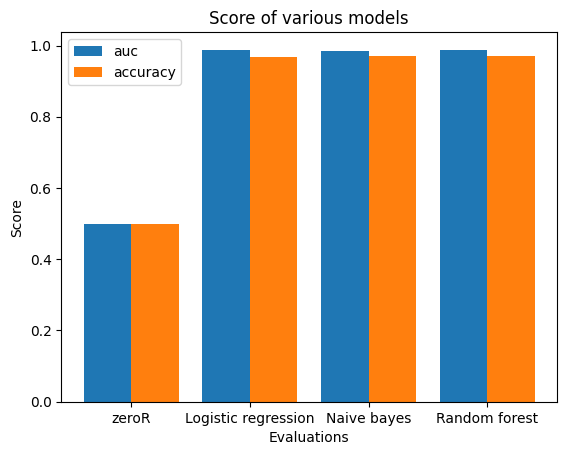

F1:  0.9694810996563574 0.9715 0.9711681801907366
auc:  [0.5, 0.9882827825562095, 0.984948883355968, 0.9868907499622755]
accuracy:  [0.5, 0.9683538633818589, 0.970481522956327, 0.9704591265397536]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure 

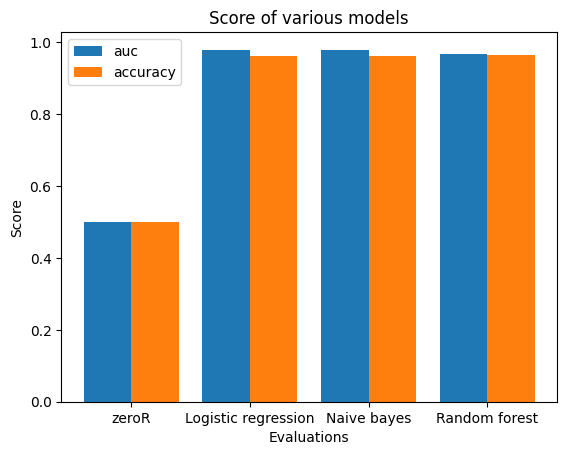

F1:  0.964436129907828 0.9641292405355181 0.9658898911934026
auc:  [0.5, 0.979370360512229, 0.9797112057492681, 0.9684610948451778]
accuracy:  [0.5, 0.9629354654483152, 0.9629545021892252, 0.9649343232438606]


In [174]:
clustering_modeling(niddm_na_ten[(niddm_na_ten["Sex_binary"] == 0)],question_hb1ac, 2,5)

MinMax
MinMax
MinMax
MinMax
Cluster data dimensions:  4 
Sublists
Number of clusters:  2
Cluster  -1  of  2
Healthy sampling...


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

MinMax
modeling...
Trainings shape:  (1872, 53)
Test shape:  (234, 66)
Y:  0
Q:  0
[[  1. 234.]]
Y:  0
Q:  1
[[0.000e+00 1.380e+02]
 [1.000e+00 1.482e+03]]
Cluster  0  of  2
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2592, 53)
Test shape:  (324, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  1
Q:  0
[[   0. 1170.]]
Y:  1
Q:  1
[[  0.   1.]
 [  1. 323.]]
Number of clusters:  3
Cluster  -1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (960, 53)
Test shape:  (120, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0


Y:  0
Q:  0
[[  0. 120.]]
Y:  0
Q:  1
[[   0. 1600.]]
Y:  0
Q:  2
[[  0. 590.]]
Cluster  0  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (2560, 53)
Test shape:  (320, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 600.]]
Y:  1
Q:  1
[[  1. 320.]]
Y:  1
Q:  2
[[  0. 590.]]
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Trainings shape:  (944, 53)
Test shape:  (118, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 600.]]
Y:  2
Q:  1
[[   0. 1600.]]
Y:  2
Q:  2
[[  1. 118.]]
Number of clusters:  4
Cluster  -1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (884, 53)
Test shape:  (111, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[  1. 111.]]
Y:  0
Q:  1
[[  0. 602.]
 [  1.  12.]]
Y:  0
Q:  2
[[  0. 451.]
 [  1. 131.]]
Y:  0
Q:  3
[[   0. 1041.]]
Cluster  0  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (982, 53)
Test shape:  (123, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0. 369.]
 [  1. 184.]]
Y:  1
Q:  1
[[  1. 123.]]
Y:  1
Q:  2
[[  0. 571.]
 [  1.  11.]]
Y:  1
Q:  3
[[0.000e+00 9.000e+00]
 [1.000e+00 1.032e+03]]
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (932, 53)
Test shape:  (116, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 545.]
 [  1.   8.]]
Y:  2
Q:  1
[[  0. 614.]]
Y:  2
Q:  2
[[  1. 116.]]
Y:  2
Q:  3
[[   0. 1041.]]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1666, 53)
Test shape:  (208, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 552.]
 [  1.   1.]]
Y:  3
Q:  1
[[  0. 593.]
 [  1.  21.]]
Y:  3
Q:  2
[[  0. 582.]]
Y:  3
Q:  3
[[  1. 208.]]
Number of clusters:  5
Cluster  -1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (400, 53)
Test shape:  (50, 66)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  0
Q:  0
[[ 0.  7.]
 [ 1. 43.]]
Y:  0
Q:  1
[[  0. 515.]]
Y:  0
Q:  2
[[  0. 571.]
 [  1.   6.]]
Y:  0
Q:  3
[[  0. 744.]
 [  1.   3.]]
Y:  0
Q:  4
[[  0. 691.]
 [  1.  10.]]
Cluster  0  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (824, 53)
Test shape:  (103, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  1
Q:  0
[[  0.  73.]
 [  1. 177.]]
Y:  1
Q:  1
[[  1. 103.]]
Y:  1
Q:  2
[[  0. 577.]]
Y:  1
Q:  3
[[  1. 747.]]
Y:  1
Q:  4
[[  0. 701.]]
Cluster  1  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (924, 53)
Test shape:  (115, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  2
Q:  0
[[  0. 237.]
 [  1.  13.]]
Y:  2
Q:  1
[[  0. 515.]]
Y:  2
Q:  2
[[  1. 115.]]
Y:  2
Q:  3
[[  0. 747.]]
Y:  2
Q:  4
[[  0. 701.]]
Cluster  2  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1196, 53)
Test shape:  (149, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  3
Q:  0
[[  0. 211.]
 [  1.  39.]]
Y:  3
Q:  1
[[  0. 515.]]
Y:  3
Q:  2
[[  0. 577.]]
Y:  3
Q:  3
[[  0.  17.]
 [  1. 132.]]
Y:  3
Q:  4
[[  0. 701.]]
Cluster  3  of  5
Healthy sampling...
MinMax
modeling...
Trainings shape:  (1122, 53)
Test shape:  (140, 67)


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

Y:  4
Q:  0
[[  0. 217.]
 [  1.  33.]]
Y:  4
Q:  1
[[  0. 515.]]
Y:  4
Q:  2
[[  0. 577.]]
Y:  4
Q:  3
[[  0. 747.]]
Y:  4
Q:  4
[[  1. 140.]]


C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["label"] = 0
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\912604855.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

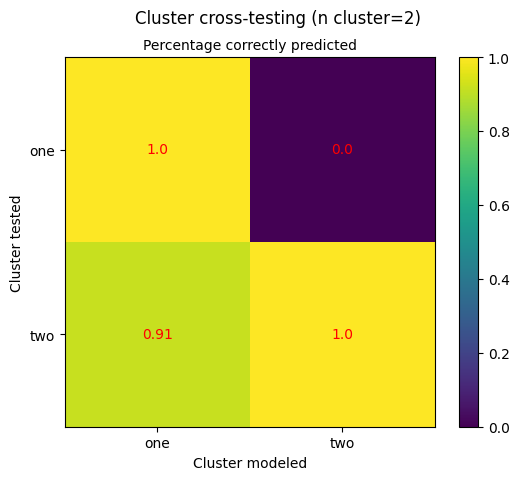

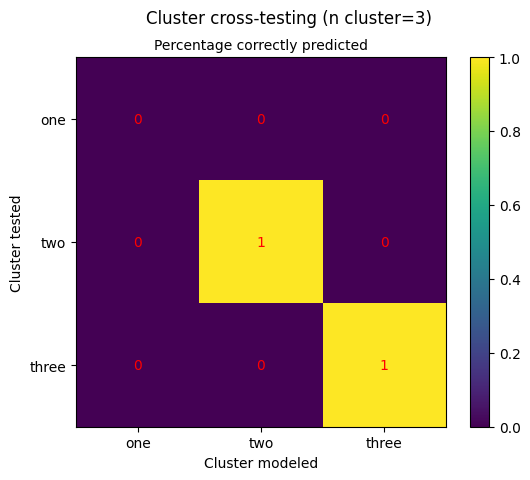

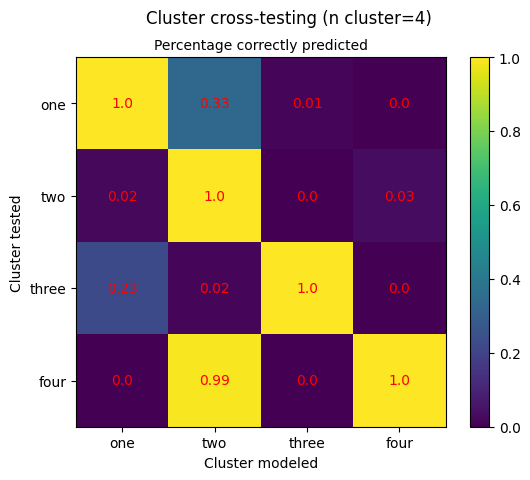

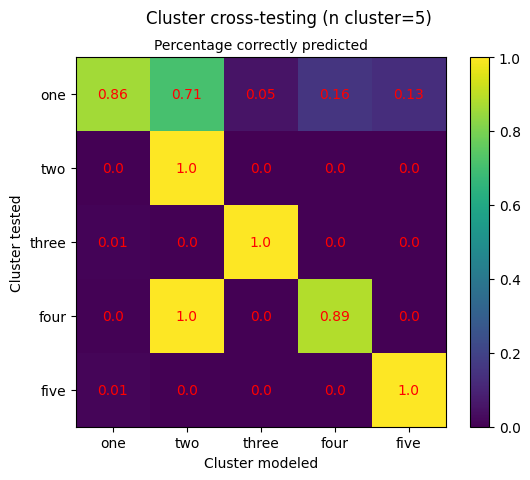

In [148]:
visualize_cross(clustering_analysis(niddm_na_ten[(niddm_na_ten["Sex_binary"] == 1)],question_hb1ac))

Number of clusters: 

C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tdf["cluster_"+str(i-2)] = kmeans.labels_.tolist()
C:\Users\keimp\AppData\Local\Temp\ipykernel_35744\1502715215.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

 2
Cluster  1  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood pressure                                     0
Systolic blood pressure                                      0
Illnesses of father                                          0
Illnesses of mother           

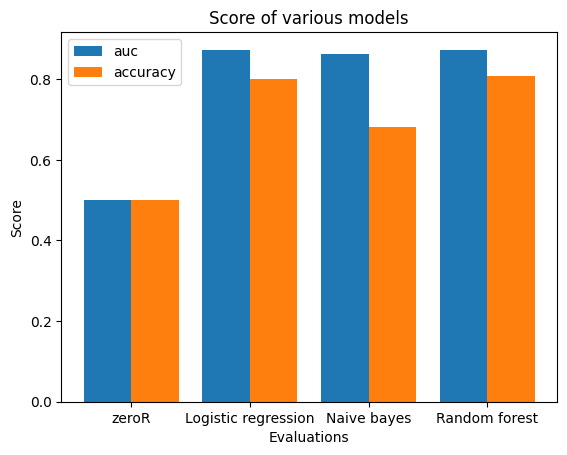

F1:  0.8191691553209656 0.7568094652138031 0.8214148814173032
auc:  [0.5, 0.8727241473270843, 0.8615846755038876, 0.8732609910441571]
accuracy:  [0.5, 0.7996550792364059, 0.6805193566626021, 0.8071175387326263]
Cluster  2  of  2
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

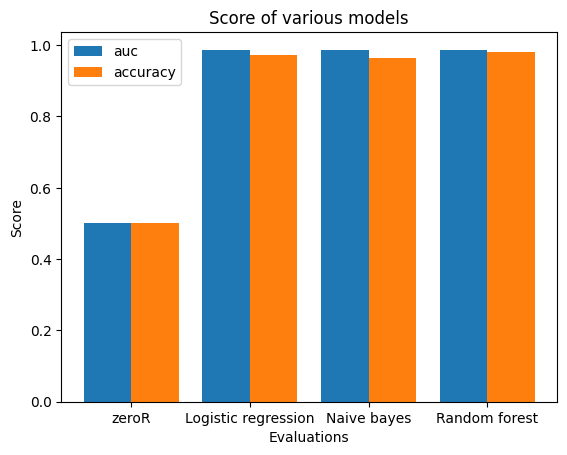

F1:  0.9728260034077426 0.9654444243195907 0.9811773384001236
auc:  [0.5, 0.9864319243438041, 0.9872846633230423, 0.9866007792863619]
accuracy:  [0.5, 0.9718656763791024, 0.9639814638481559, 0.98086713641846]
Number of clusters:  3
Cluster  1  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0               

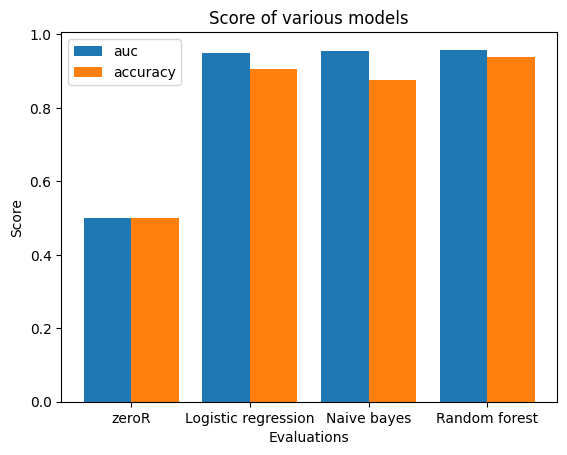

F1:  0.9103938416238359 0.8893822100184245 0.9409317645856088
auc:  [0.5, 0.9487108985970096, 0.9562368952134007, 0.9583966207189456]
accuracy:  [0.5, 0.9060011086151063, 0.8755589267827795, 0.9382209644951425]
Cluster  2  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

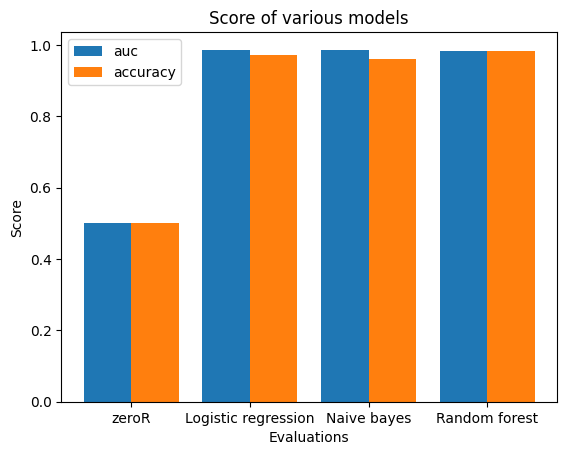

F1:  0.9727221353768154 0.9621928897414559 0.9834250096128548
auc:  [0.5, 0.9859734193341061, 0.9864987777025398, 0.9825585899392868]
accuracy:  [0.5, 0.9718402843902748, 0.9605789373452676, 0.9830889354408684]
Cluster  3  of  3
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic b

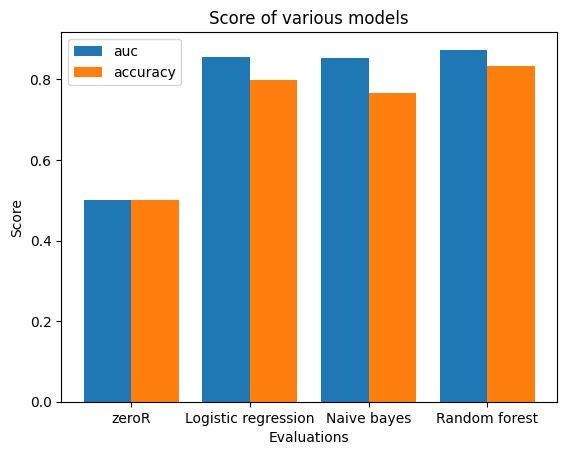

F1:  0.8214256397958246 0.8089254694461268 0.8480819858020822
auc:  [0.5, 0.8563316864310339, 0.8526814472194195, 0.8734573569590405]
accuracy:  [0.5, 0.7988392516227567, 0.766690424674388, 0.8326460481099657]
Number of clusters:  4
Cluster  1  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0              

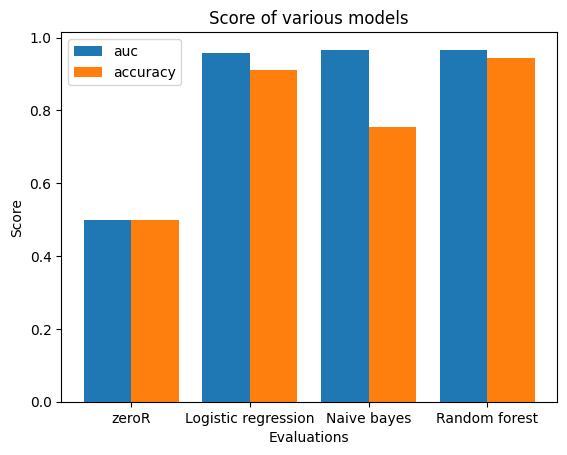

F1:  0.915171942412297 0.8031256062816818 0.9460925144879957
auc:  [0.5, 0.9574282247842913, 0.9664579596982451, 0.966446423608993]
accuracy:  [0.5, 0.9106861775756377, 0.754630545118977, 0.9440524685254762]
Cluster  2  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bloo

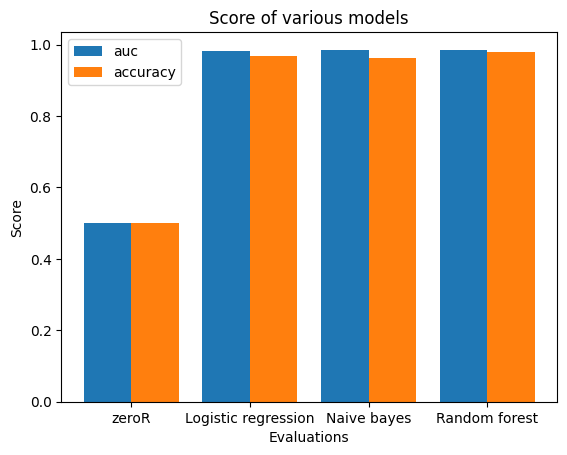

F1:  0.9685256632812835 0.9654531081077882 0.9800484971027271
auc:  [0.5, 0.9834037254249348, 0.985495690397218, 0.9857839058429262]
accuracy:  [0.5, 0.9673332063733892, 0.9639497238621215, 0.9797181489240144]
Cluster  3  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic bl

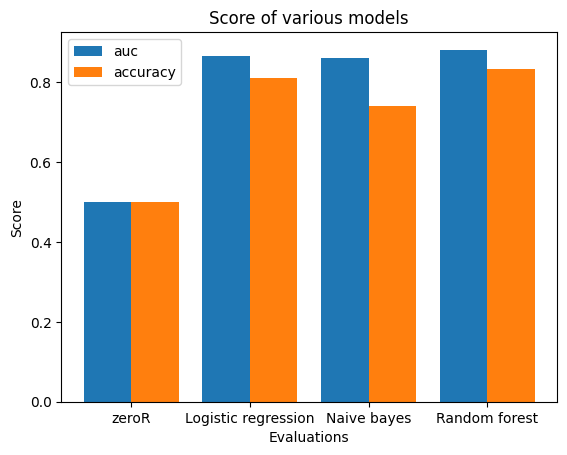

F1:  0.8340775014901172 0.7935114415350283 0.8471337313087026
auc:  [0.5, 0.86572742109856, 0.861667755437147, 0.8817880001192355]
accuracy:  [0.5, 0.8121531860797712, 0.7398622808411462, 0.833321680173738]
Cluster  4  of  4
Healthy sampling...
MinMax
modeling...
Number of missing values: 
 Age at recruitment                                           0
fmi                                                          0
Body fat percentage | Instance 0                             0
Waist circumference | Instance 0                             0
Weight | Instance 0                                          0
Hip circumference | Instance 0                               0
Whole body fat mass | Instance 0                             0
Basal metabolic rate | Instance 0                            0
Trunk fat percentage | Instance 0                            0
Arm fat percentage (left) | Instance 0                       0
Leg fat percentage (left) | Instance 0                       0
Diastolic blood

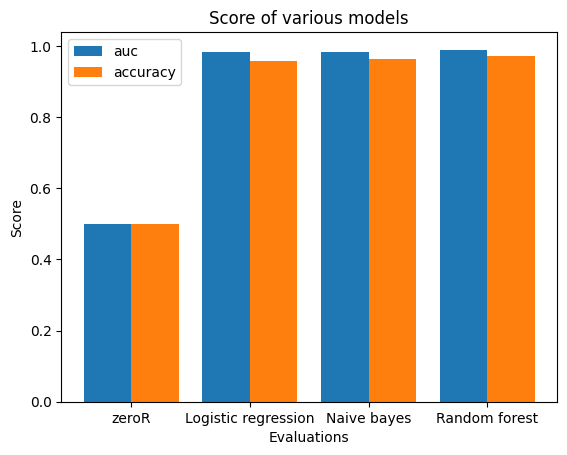

F1:  0.9597749608317904 0.9646467557035853 0.9708181797387864
auc:  [0.5, 0.9836002589656234, 0.9823441695588032, 0.9889907770030035]
accuracy:  [0.5, 0.9580167810831426, 0.9632494279176201, 0.9702517162471396]


In [175]:
clustering_modeling(niddm_na_ten[(niddm_na_ten["Sex_binary"] == 1)],question_hb1ac, 2,5)